In [1]:
!pip install tf-levenberg-marquardt 

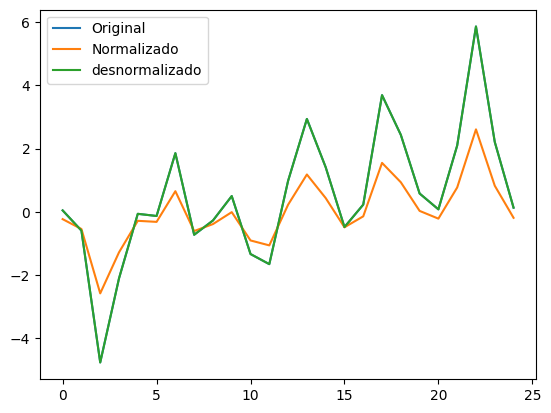

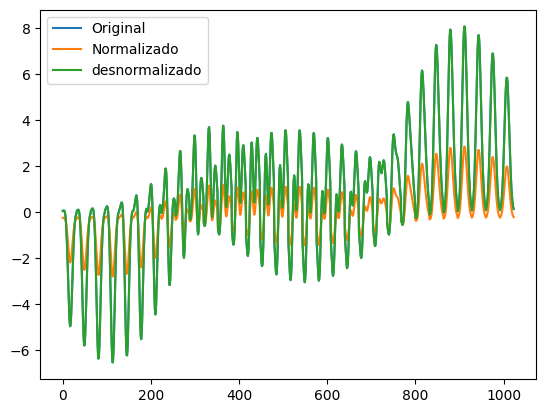

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def peaks(grid):
    x = np.linspace(-2, 2, grid)
    y = np.linspace(-2, 2, grid)
    x, y = np.meshgrid(x, y)
    z = 3*(1-x)**2 * np.exp(-(x**2) - (y+1)**2) - 10*(x/5 - x**3 - y**5) * np.exp(-x**2 - y**2) - 1/3 * np.exp(-(x+1)**2 - y**2)
    return x, y, z

def create_dataframe(grid):
   x, y, z = peaks(grid)
   data = {'X': x.flatten(), 'Y': y.flatten(), 'Z': z.flatten()}
   df = pd.DataFrame(data)
   return df

def show_norm(df, label="Peaks", plot=False):
    df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["Z"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()


df_25 = create_dataframe(grid=5)
df_25_norm = show_norm(df_25)
test_out_scaler(df_25)

df_1000 = create_dataframe(grid=32)
df_1000_norm = show_norm(df_1000)
test_out_scaler(df_1000)



In [3]:
def split_df(df):
    _input = np.vstack([df['X'], df['Y']]).T
    _output = np.array(df['Z'])
    return (_input, _output)

In [4]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import tf_levenberg_marquardt as lm

# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        mse_loss = lm.loss.MeanSquaredError()

        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=tf.keras.losses.MeanSquaredError(),
        )
        self.lm_model = lm.model.ModelWrapper(
            tf.keras.models.clone_model(self.model)
        )
        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
             loss=lm.loss.MeanSquaredError()
        )
        return self.lm_model


2025-07-02 17:33:37.402561: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-02 17:33:37.487335: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-07-02 17:33:37.487389: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-07-02 17:33:37.489152: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-02 17:33:37.498598: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-02 17:33:37.500608: I tensorflow/core/platform/cpu_feature_guard.cc:1

In [5]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [6]:
import pickle
from itertools import product

class Tester:
  def __init__(self, run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input_25, self.output_25 = split_df(df_25_norm)
    self.input_1000, self.output_1000 = split_df(df_1000_norm)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

  def SaveModelWeights(self, model, fileName):
    path = f"content/models/{fileName}.keras"
    open(path,'w').close()
    model.save_weights(path)

  def SaveDataset(self, trainer, fileName):
    path = f"content/dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] <= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input_25, self.output_25, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'content/results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

# Treinando com 25 dados


In [7]:
tester = Tester(run_times=25, dataset_run_times=10)
tester.Loop(sort_by='mse',
            boundarie = 1,
            hidden_sizes = [[15], [16], [17], [18], [19], [20], [21], [22], [23], [24]],
            regularizers=[0.2, 0.05],
            learning_rate=[0.01, 0.1]) 

Testando combinacao1: Hidden Size=[15], regularizer=0.2, learning_rate=0.01
+++++++++++ [1_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  22
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_9,0.859502,0.792039,-0.554272,0.776114,0.524310,0.939508,1.390637,2.727733,1.195373,1.961553,2.128481,0.969282,1.091134,1.010546,122.124798,196.476224
model_1_4_8,0.858666,0.791663,-0.552001,0.776241,0.524875,0.945098,1.393149,2.723747,1.194699,1.959223,2.128213,0.972162,1.091676,1.013549,122.112933,196.464358
model_1_4_7,0.857812,0.791273,-0.549706,0.776364,0.525443,0.950813,1.395760,2.719720,1.194038,1.956879,2.127909,0.975096,1.092230,1.016608,122.100876,196.452301
model_1_4_6,0.856938,0.790867,-0.547391,0.776486,0.526015,0.956655,1.398470,2.715656,1.193389,1.954522,2.127574,0.978087,1.092797,1.019727,122.088625,196.440051
model_1_4_5,0.856045,0.790447,-0.545050,0.776606,0.526590,0.962626,1.401283,2.711547,1.192750,1.952149,2.127204,0.981135,1.093376,1.022904,122.076180,196.427606
model_1_4_4,0.855132,0.790010,-0.542686,0.776723,0.527169,0.968730,1.404202,2.707400,1.192124,1.949762,2.126795,0.984241,1.093968,1.026142,122.063539,196.414965
model_1_4_3,0.854200,0.789558,-0.540297,0.776838,0.527752,0.974967,1.407228,2.703207,1.191508,1.947358,2.126346,0.987404,1.094573,1.029440,122.050703,196.402128
model_1_4_2,0.853246,0.789089,-0.537885,0.776951,0.528339,0.981343,1.410365,2.698973,1.190905,1.944939,2.125863,0.990628,1.095192,1.032801,122.037666,196.389091
model_1_4_1,0.852272,0.788603,-0.535447,0.777062,0.528929,0.987859,1.413615,2.694694,1.190314,1.942504,2.125336,0.993911,1.095824,1.036224,122.024430,196.375855
model_1_4_0,0.851276,0.788099,-0.532984,0.777171,0.529524,0.994518,1.416981,2.690373,1.189730,1.940052,2.124766,0.997255,1.096470,1.039711,122.010994,196.362419


DataFrame salvo em content/results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_24,0.903334,0.805711,0.916632,0.971054,0.947377,0.646408,1.299209,0.857433,0.226628,0.542030,1.751897,0.803995,1.062703,0.838223,122.872647,197.224073
model_1_5_23,0.902037,0.805651,0.916665,0.971756,0.947659,0.655079,1.299611,0.857100,0.221134,0.539117,1.763455,0.809370,1.063544,0.843826,122.845997,197.197423
model_1_5_22,0.900710,0.805559,0.916736,0.972403,0.947941,0.663951,1.300231,0.856367,0.216071,0.536219,1.775154,0.814832,1.064404,0.849521,122.819094,197.170519
model_1_5_21,0.899353,0.805432,0.916847,0.972993,0.948221,0.673025,1.301077,0.855220,0.211451,0.533336,1.787010,0.820381,1.065284,0.855307,122.791944,197.143370
model_1_5_20,0.897965,0.805271,0.917000,0.973526,0.948499,0.682309,1.302155,0.853652,0.207279,0.530466,1.799024,0.826020,1.066185,0.861185,122.764545,197.115970
model_1_5_19,0.896545,0.805074,0.917194,0.974000,0.948777,0.691804,1.303471,0.851656,0.203563,0.527609,1.811205,0.831748,1.067106,0.867157,122.736905,197.088331
model_1_5_18,0.895093,0.804840,0.917430,0.974416,0.949052,0.701517,1.305033,0.849230,0.200310,0.524770,1.823558,0.837566,1.068048,0.873223,122.709021,197.060447
model_1_5_17,0.893607,0.804569,0.917707,0.974771,0.949326,0.711451,1.306848,0.846375,0.197526,0.521951,1.836088,0.843476,1.069012,0.879384,122.680897,197.032322
model_1_5_16,0.892087,0.804259,0.918026,0.975067,0.949597,0.721615,1.308922,0.843101,0.195212,0.519157,1.848806,0.849479,1.069998,0.885643,122.652527,197.003952
model_1_5_15,0.890532,0.803909,0.918384,0.975302,0.949865,0.732015,1.311264,0.839419,0.193375,0.516397,1.861718,0.855579,1.071006,0.892002,122.623909,196.975334


DataFrame salvo em content/results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_24,0.932086,0.818180,0.929054,0.955092,0.940759,0.454142,1.215830,0.768804,0.108680,0.438742,1.482704,0.673901,1.044052,0.702590,123.578691,197.930116
model_1_6_23,0.931414,0.818112,0.929277,0.958944,0.941552,0.458638,1.216285,0.766383,0.099357,0.432870,1.488825,0.677228,1.044489,0.706059,123.558987,197.910413
model_1_6_22,0.930711,0.818018,0.929489,0.962657,0.942314,0.463338,1.216914,0.764089,0.090371,0.427230,1.494995,0.680689,1.044944,0.709668,123.538597,197.890022
model_1_6_21,0.929976,0.817897,0.929688,0.966224,0.943043,0.468248,1.217724,0.761925,0.081741,0.421833,1.501221,0.684287,1.045421,0.713418,123.517513,197.868939
model_1_6_20,0.929210,0.817748,0.929875,0.969636,0.943737,0.473376,1.218721,0.759899,0.073484,0.416692,1.507498,0.688023,1.045918,0.717314,123.495732,197.847158
model_1_6_19,0.928409,0.817569,0.930049,0.972885,0.944395,0.478727,1.219915,0.758019,0.065621,0.411820,1.513825,0.691901,1.046437,0.721357,123.473250,197.824676
model_1_6_18,0.927575,0.817360,0.930208,0.975962,0.945014,0.484309,1.221312,0.756291,0.058173,0.407232,1.523657,0.695923,1.046979,0.725550,123.450063,197.801488
model_1_6_17,0.926704,0.817120,0.930353,0.978859,0.945593,0.490131,1.222919,0.754723,0.051161,0.402942,1.534339,0.700094,1.047543,0.729898,123.426164,197.777590
model_1_6_16,0.925796,0.816847,0.930482,0.981567,0.946130,0.496199,1.224746,0.753322,0.044609,0.398966,1.545096,0.704414,1.048132,0.734403,123.401555,197.752980
model_1_6_15,0.924851,0.816539,0.930595,0.984075,0.946623,0.502523,1.226801,0.752098,0.038539,0.395319,1.555928,0.708888,1.048745,0.739067,123.376228,197.727654


DataFrame salvo em content/results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_4,0.934736,0.818308,0.931314,0.839189,0.909232,0.436419,1.214979,0.498149,0.950321,0.724235,1.438783,0.660620,1.042333,0.688744,123.658303,198.009728
model_1_7_5,0.935219,0.818303,0.931082,0.838576,0.908900,0.433193,1.215011,0.499826,0.953941,0.726883,1.431569,0.658174,1.042020,0.686194,123.673144,198.024569
model_1_7_3,0.934238,0.818303,0.931535,0.839793,0.909556,0.439748,1.215011,0.496545,0.946753,0.721649,1.447416,0.663135,1.042656,0.691366,123.643105,197.994531
model_1_7_6,0.935686,0.818289,0.930842,0.837955,0.908561,0.430067,1.215105,0.501571,0.957613,0.729592,1.426821,0.655795,1.041717,0.683714,123.687628,198.039054
model_1_7_2,0.933725,0.818288,0.931745,0.840387,0.909872,0.443183,1.215110,0.495017,0.943240,0.719129,1.456126,0.665720,1.042989,0.694061,123.627546,197.978971
model_1_7_7,0.936139,0.818265,0.930592,0.837326,0.908214,0.427039,1.215261,0.503384,0.961333,0.732358,1.422123,0.653482,1.041423,0.681302,123.701760,198.053185
model_1_7_1,0.933195,0.818263,0.931945,0.840972,0.910179,0.446725,1.215279,0.493567,0.939784,0.716675,1.464910,0.668375,1.043333,0.696829,123.611625,197.963051
model_1_7_8,0.936578,0.818233,0.930333,0.836689,0.907860,0.424106,1.215474,0.505260,0.965097,0.735179,1.417469,0.651234,1.041139,0.678959,123.715544,198.066969
model_1_7_0,0.932649,0.818227,0.932134,0.841547,0.910478,0.450377,1.215518,0.492197,0.936386,0.714291,1.473770,0.671101,1.043687,0.699672,123.595340,197.946765
model_1_7_9,0.937002,0.818193,0.930066,0.836044,0.907500,0.421267,1.215745,0.507200,0.968908,0.738054,1.412868,0.649051,1.040863,0.676682,123.728976,198.080401


DataFrame salvo em content/results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_19,0.954125,0.820958,0.983550,0.885239,0.959748,0.306765,1.197252,0.142046,0.489214,0.315630,1.215010,0.553863,1.029757,0.577442,124.363349,198.714775
model_1_8_20,0.954485,0.820953,0.983686,0.882483,0.959074,0.304357,1.197287,0.140872,0.500962,0.320917,1.211759,0.551685,1.029523,0.575172,124.379110,198.730535
model_1_8_18,0.953746,0.820948,0.983393,0.887969,0.960404,0.309302,1.197324,0.143400,0.477574,0.310487,1.218262,0.556149,1.030003,0.579825,124.346877,198.698303
model_1_8_21,0.954827,0.820932,0.983802,0.879703,0.958382,0.302074,1.197426,0.139868,0.512811,0.326340,1.208520,0.549613,1.029302,0.573011,124.394164,198.745589
model_1_8_17,0.953346,0.820920,0.983215,0.890672,0.961040,0.311972,1.197507,0.144939,0.466051,0.305495,1.221522,0.558545,1.030262,0.582323,124.329682,198.681108
model_1_8_22,0.955150,0.820897,0.983899,0.876902,0.957674,0.299913,1.197665,0.139032,0.524752,0.331892,1.205289,0.547643,1.029092,0.570958,124.408523,198.759949
model_1_8_16,0.952927,0.820876,0.983014,0.893347,0.961657,0.314780,1.197805,0.146673,0.454651,0.300662,1.224790,0.561053,1.030534,0.584938,124.311761,198.663187
model_1_8_23,0.955455,0.820847,0.983977,0.874080,0.956950,0.297871,1.197999,0.138354,0.536781,0.337568,1.202071,0.545775,1.028894,0.569010,124.422192,198.773617
model_1_8_15,0.952485,0.820813,0.982790,0.895990,0.962252,0.317730,1.198224,0.148609,0.443381,0.295995,1.228064,0.563676,1.030820,0.587673,124.293104,198.644529
model_1_8_24,0.955744,0.820783,0.984038,0.871240,0.956211,0.295943,1.198426,0.137829,0.548891,0.343360,1.198858,0.544006,1.028707,0.567166,124.435179,198.786604


DataFrame salvo em content/results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_0,0.956329,0.820679,0.815986,0.928286,0.894333,0.292031,1.199121,0.288028,0.068316,0.178172,1.190070,0.540399,1.028327,0.563405,124.461789,198.813214
model_1_9_1,0.956889,0.820552,0.812402,0.928047,0.892602,0.288284,1.199967,0.293638,0.068544,0.181091,1.181514,0.536921,1.027964,0.559779,124.487616,198.839042
model_1_9_2,0.957425,0.820404,0.808682,0.927581,0.890744,0.284699,1.200961,0.299461,0.068987,0.184224,1.173181,0.533572,1.027616,0.556288,124.512643,198.864068
model_1_9_3,0.957937,0.820233,0.804830,0.926891,0.888761,0.281273,1.202100,0.305490,0.069645,0.187567,1.165075,0.530352,1.027284,0.552930,124.536858,198.888283
model_1_9_4,0.958427,0.820042,0.800848,0.925982,0.886656,0.278002,1.203381,0.311722,0.070511,0.191117,1.157177,0.527259,1.026967,0.549705,124.560256,198.911681
model_1_9_5,0.958893,0.819829,0.796741,0.924856,0.884431,0.274883,1.204801,0.318152,0.071584,0.194868,1.149494,0.524293,1.026664,0.546613,124.582818,198.934243
model_1_9_6,0.959337,0.819597,0.792509,0.923516,0.882089,0.271914,1.206358,0.324775,0.072860,0.198817,1.142737,0.521454,1.026376,0.543654,124.604536,198.955961
model_1_9_7,0.959759,0.819344,0.788157,0.921969,0.879632,0.269091,1.208046,0.331587,0.074334,0.202960,1.136165,0.518740,1.026102,0.540824,124.625409,198.976834
model_1_9_8,0.960160,0.819072,0.783689,0.920216,0.877063,0.266412,1.209865,0.338581,0.076003,0.207292,1.129786,0.516151,1.025842,0.538124,124.645426,198.996851
model_1_9_9,0.960540,0.818781,0.779106,0.918264,0.874385,0.263872,1.211810,0.345754,0.077863,0.211808,1.123582,0.513684,1.025596,0.535553,124.664586,199.016011


DataFrame salvo em content/results/metrics_1_9
Testando combinacao2: Hidden Size=[15], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [===

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_2_10,0.881859,0.722153,-1.080931,0.806856,0.715752,0.790013,1.857967,2.117345,2.724508,2.420927,0.443831,0.888827,1.076632,0.926666,122.471413,196.822838
model_2_2_9,0.881248,0.722147,-1.085935,0.807006,0.715577,0.794095,1.858003,2.122436,2.722399,2.422418,0.449213,0.891120,1.077028,0.929057,122.461104,196.812529
model_2_2_11,0.882235,0.722005,-1.079864,0.806603,0.715606,0.787492,1.858956,2.116259,2.728080,2.422170,0.439051,0.887408,1.076388,0.925186,122.477804,196.829229
model_2_2_8,0.880346,0.721938,-1.095907,0.807026,0.714998,0.800129,1.859401,2.132583,2.722119,2.427351,0.455579,0.894499,1.077614,0.932580,122.445965,196.797390
model_2_2_12,0.882429,0.721745,-1.081842,0.806272,0.715214,0.786201,1.860692,2.118272,2.732757,2.425514,0.434812,0.886680,1.076263,0.924428,122.481086,196.832511
model_2_2_7,0.879086,0.721464,-1.111966,0.806890,0.713926,0.808553,1.862568,2.148923,2.724036,2.436479,0.464729,0.899196,1.078431,0.937476,122.425018,196.776443
model_2_2_13,0.882480,0.721407,-1.086105,0.805884,0.714638,0.785859,1.862954,2.122610,2.738229,2.430419,0.431038,0.886487,1.076229,0.924227,122.481955,196.833381
model_2_2_14,0.882424,0.721016,-1.092018,0.805460,0.713934,0.786232,1.865565,2.128626,2.744210,2.436418,0.427687,0.886697,1.076266,0.924446,122.481007,196.832433
model_2_2_6,0.877395,0.720657,-1.135243,0.806571,0.712272,0.819860,1.867965,2.172608,2.728533,2.450570,0.474701,0.905461,1.079528,0.944008,122.397244,196.748669
model_2_2_15,0.882290,0.720594,-1.099069,0.805016,0.713145,0.787130,1.868388,2.135800,2.750473,2.443137,0.424706,0.887203,1.076353,0.924973,122.478725,196.830150


DataFrame salvo em content/results/metrics_2_2
+++++++++++ [2_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_3_2,0.895669,0.729752,0.948858,0.518252,0.635180,0.697663,1.807147,0.114772,3.472157,1.793464,0.603534,0.835262,1.067674,0.870821,122.720038,197.071464
model_2_3_1,0.893685,0.728937,0.977783,0.523158,0.645378,0.710931,1.812602,0.049860,3.436798,1.743329,0.547176,0.843167,1.068961,0.879062,122.682361,197.033786
model_2_3_3,0.895663,0.728671,0.910117,0.509735,0.620094,0.697699,1.814377,0.201715,3.533539,1.867627,0.656964,0.835284,1.067678,0.870844,122.719934,197.071359
model_2_3_4,0.894147,0.726224,0.863258,0.498932,0.601480,0.707837,1.830740,0.306876,3.611399,1.959137,0.708546,0.841330,1.068661,0.877147,122.691084,197.042509
model_2_3_0,0.889142,0.725564,0.995115,0.522810,0.649080,0.741307,1.835154,0.010963,3.439300,1.725132,0.484963,0.860992,1.071908,0.897646,122.598681,196.950106
model_2_3_5,0.891525,0.722831,0.810169,0.486838,0.580496,0.725376,1.853431,0.426017,3.698565,2.062291,0.758304,0.851690,1.070362,0.887948,122.642130,196.993555
model_2_3_6,0.888130,0.718818,0.752826,0.474171,0.558122,0.748072,1.880263,0.554708,3.789863,2.172286,0.805872,0.864912,1.072564,0.901733,122.580511,196.931936
model_2_3_7,0.884238,0.714439,0.693111,0.461432,0.535153,0.774099,1.909548,0.688720,3.881677,2.285198,0.850854,0.879829,1.075089,0.917285,122.512112,196.863538
model_2_3_8,0.880065,0.709884,0.632672,0.448963,0.512217,0.802008,1.940004,0.824356,3.971551,2.397953,0.892955,0.895549,1.077796,0.933675,122.441272,196.792698
model_2_3_9,0.875775,0.705298,0.572850,0.436985,0.489782,0.830693,1.970676,0.958610,4.057880,2.508246,0.933500,0.911424,1.080578,0.950225,122.370990,196.722416


DataFrame salvo em content/results/metrics_2_3
+++++++++++ [2_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_4_0,0.882743,0.701415,0.846585,0.584076,0.835531,0.784098,1.996639,2.133979,0.516966,1.325472,2.053287,0.885493,1.076059,0.923190,122.486443,196.837868
model_2_4_1,0.882936,0.700517,0.832508,0.402167,0.809355,0.782804,2.002645,2.329791,0.743067,1.536429,2.190584,0.884762,1.075933,0.922429,122.489745,196.841170
model_2_4_2,0.880647,0.697498,0.817311,0.215371,0.781836,0.798113,2.022834,2.541174,0.975241,1.758208,2.301023,0.893372,1.077418,0.931405,122.451009,196.802435
model_2_4_3,0.876743,0.693147,0.801721,0.032238,0.754261,0.824219,2.051929,2.758024,1.202863,1.980444,2.388996,0.907865,1.079950,0.946515,122.386638,196.738064
model_2_4_4,0.871863,0.688032,0.786256,-0.141774,0.727496,0.856852,2.086131,2.973140,1.419149,2.196144,2.458631,0.925663,1.083116,0.965070,122.308981,196.660406
model_2_4_5,0.866461,0.682550,0.771265,-0.303597,0.702080,0.892973,2.122787,3.181658,1.620283,2.400971,2.513508,0.944972,1.086620,0.985202,122.226398,196.577824
model_2_4_6,0.860854,0.676972,0.756973,-0.451821,0.678316,0.930467,2.160088,3.380461,1.804517,2.592489,2.556583,0.964607,1.090257,1.005673,122.144137,196.495562
model_2_4_7,0.855256,0.671477,0.743512,-0.586159,0.656340,0.967902,2.196832,3.567705,1.971490,2.769597,2.590275,0.983820,1.093888,1.025703,122.065250,196.416675


DataFrame salvo em content/results/metrics_2_4
+++++++++++ [2_5] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 9 ++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_5_3,0.923559,0.749364,0.857864,0.792289,0.865379,0.511164,1.676005,1.160822,1.040338,1.100580,1.290431,0.714958,1.049584,0.745395,123.342128,197.693554
model_2_5_4,0.923650,0.749049,0.846156,0.774447,0.854066,0.510553,1.678110,1.256442,1.129705,1.193073,1.220508,0.714530,1.049524,0.744949,123.344520,197.695946
model_2_5_2,0.922812,0.749004,0.870776,0.811548,0.877728,0.516157,1.678411,1.055369,0.943881,0.999625,1.368184,0.718441,1.050068,0.749026,123.322688,197.674113
model_2_5_5,0.923267,0.748261,0.835569,0.757984,0.843735,0.513113,1.683380,1.342906,1.212161,1.277533,1.157578,0.716319,1.049773,0.746814,123.334520,197.685946
model_2_5_1,0.921171,0.747701,0.884947,0.832221,0.891139,0.527128,1.687122,0.939634,0.840336,0.889985,1.454750,0.726036,1.051132,0.756945,123.280623,197.632049
model_2_5_6,0.922550,0.747151,0.826013,0.742846,0.834325,0.517912,1.690806,1.420944,1.287983,1.354463,1.100908,0.719661,1.050238,0.750298,123.315901,197.667326
model_2_5_7,0.921603,0.745831,0.817397,0.728963,0.825769,0.524243,1.699626,1.491310,1.357513,1.424411,1.049863,0.724046,1.050852,0.754870,123.291601,197.643026
model_2_5_0,0.918320,0.745096,0.900376,0.854250,0.905593,0.546193,1.704544,0.813625,0.730005,0.771815,1.551319,0.739049,1.052982,0.770512,123.209564,197.560990
model_2_5_8,0.920508,0.744389,0.809634,0.716263,0.818000,0.531563,1.709274,1.554717,1.421124,1.487920,1.003877,0.729084,1.051562,0.760123,123.263866,197.615291
model_2_5_9,0.919327,0.742886,0.802641,0.704666,0.810955,0.539463,1.719326,1.611827,1.479208,1.545517,0.962439,0.734481,1.052329,0.765750,123.234363,197.585789


DataFrame salvo em content/results/metrics_2_5
+++++++++++ [2_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_6_12,0.966524,0.791244,0.967714,0.930078,0.952268,0.223853,1.395953,0.300535,1.002719,0.651627,0.304855,0.473131,1.021714,0.493273,124.993531,199.344956
model_2_6_11,0.966627,0.791196,0.968178,0.931645,0.953249,0.223163,1.396275,0.296215,0.980250,0.638233,0.307402,0.472402,1.021647,0.492513,124.999702,199.351127
model_2_6_13,0.966326,0.791184,0.967155,0.928595,0.951298,0.225177,1.396355,0.305744,1.023989,0.664866,0.302560,0.474528,1.021842,0.494729,124.981741,199.333166
model_2_6_14,0.966064,0.791046,0.966537,0.927202,0.950356,0.226933,1.397274,0.311495,1.043961,0.677728,0.300495,0.476375,1.022013,0.496655,124.966203,199.317628
model_2_6_10,0.966596,0.790999,0.968499,0.933282,0.954219,0.223370,1.397589,0.293230,0.956773,0.625002,0.310231,0.472621,1.021667,0.492741,124.997849,199.349274
model_2_6_15,0.965759,0.790856,0.965888,0.925903,0.949453,0.228969,1.398550,0.317533,1.062594,0.690064,0.298638,0.478507,1.022210,0.498878,124.948338,199.299763
model_2_6_16,0.965430,0.790630,0.965230,0.924697,0.948595,0.231169,1.400061,0.323663,1.079888,0.701776,0.296966,0.480800,1.022424,0.501269,124.929215,199.280641
model_2_6_9,0.966381,0.790603,0.968614,0.934968,0.955143,0.224813,1.400242,0.292163,0.932591,0.612377,0.313363,0.474145,1.021807,0.494330,124.984970,199.336395
model_2_6_17,0.965090,0.790382,0.964576,0.923583,0.947787,0.233444,1.401714,0.329745,1.095867,0.712806,0.295466,0.483161,1.022644,0.503730,124.909623,199.261049
model_2_6_18,0.964748,0.790124,0.963940,0.922556,0.947031,0.235732,1.403439,0.335673,1.110587,0.723130,0.294117,0.485523,1.022866,0.506193,124.890115,199.241541


DataFrame salvo em content/results/metrics_2_6
+++++++++++ [2_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_7_0,0.967481,0.791236,0.986035,0.907698,0.961019,0.217456,1.396008,0.023635,0.146204,0.084920,0.424405,0.466321,1.021093,0.486174,125.051521,199.402946
model_2_7_1,0.968493,0.788225,0.954616,0.821537,0.917493,0.210685,1.416141,0.076807,0.282679,0.179743,0.513032,0.459004,1.020437,0.478545,125.114785,199.466210
model_2_7_2,0.967909,0.783256,0.916086,0.730748,0.869520,0.214593,1.449370,0.142016,0.426487,0.284251,0.571464,0.463242,1.020816,0.482963,125.078023,199.429448
model_2_7_3,0.966675,0.777898,0.877541,0.645985,0.823733,0.222847,1.485194,0.207249,0.560749,0.383999,0.608578,0.472067,1.021616,0.492164,125.002540,199.353966
model_2_7_4,0.965187,0.772682,0.841772,0.569764,0.782130,0.232797,1.520075,0.267785,0.681480,0.474632,0.631539,0.482490,1.022582,0.503031,124.915181,199.266606
model_2_7_5,0.963613,0.767777,0.809573,0.501955,0.744971,0.243318,1.552879,0.322278,0.788888,0.555583,0.645234,0.493273,1.023602,0.514273,124.826770,199.178195
model_2_7_6,0.962029,0.763226,0.780949,0.441654,0.711931,0.253913,1.583310,0.370721,0.884403,0.627562,0.652784,0.503897,1.024630,0.525349,124.741531,199.092956
model_2_7_7,0.960470,0.759029,0.755618,0.387846,0.682530,0.264340,1.611377,0.413591,0.969634,0.691612,0.656254,0.514140,1.025641,0.536028,124.661038,199.012463
model_2_7_8,0.958954,0.755168,0.733222,0.339616,0.656297,0.274473,1.637191,0.451494,1.046028,0.748761,0.657025,0.523902,1.026624,0.546205,124.585805,198.937230
model_2_7_9,0.957495,0.751623,0.713405,0.296203,0.632817,0.284234,1.660897,0.485032,1.114792,0.799912,0.656038,0.533136,1.027571,0.555832,124.515917,198.867342


DataFrame salvo em content/results/metrics_2_7
+++++++++++ [2_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_8_16,0.967133,0.769249,0.859402,0.162580,0.774441,0.219784,1.543033,0.526206,0.813139,0.669673,0.345367,0.468811,1.021319,0.488770,125.030219,199.381644
model_2_8_15,0.967480,0.769246,0.863556,0.169813,0.778242,0.217462,1.543056,0.510659,0.806115,0.658387,0.350740,0.466328,1.021094,0.486181,125.051461,199.402886
model_2_8_17,0.966797,0.769230,0.855633,0.155948,0.770981,0.222027,1.543163,0.540313,0.819579,0.679946,0.340516,0.471198,1.021537,0.491258,125.009908,199.361334
model_2_8_14,0.967834,0.769211,0.868130,0.177689,0.782412,0.215093,1.543289,0.493543,0.798467,0.646005,0.356686,0.463781,1.020864,0.483525,125.073371,199.424797
model_2_8_18,0.966477,0.769194,0.852217,0.149880,0.767836,0.224170,1.543401,0.553097,0.825471,0.689284,0.336139,0.473466,1.021745,0.493623,124.990699,199.342124
model_2_8_19,0.966173,0.769147,0.849125,0.144340,0.764981,0.226198,1.543713,0.564670,0.830849,0.697760,0.332187,0.475603,1.021942,0.495850,124.972688,199.324113
model_2_8_13,0.968189,0.769134,0.873157,0.186242,0.786980,0.212721,1.543805,0.474728,0.790162,0.632445,0.363269,0.461217,1.020634,0.480852,125.095547,199.446972
model_2_8_20,0.965888,0.769094,0.846327,0.139284,0.762390,0.228105,1.544073,0.575143,0.835759,0.705451,0.328627,0.477603,1.022127,0.497936,124.955898,199.307323
model_2_8_21,0.965622,0.769036,0.843797,0.134681,0.760043,0.229887,1.544460,0.584612,0.840229,0.712420,0.325418,0.479465,1.022299,0.499877,124.940339,199.291764
model_2_8_12,0.968534,0.769000,0.878673,0.195502,0.791971,0.210410,1.544700,0.454084,0.781171,0.617627,0.370563,0.458705,1.020410,0.478233,125.117391,199.468816


DataFrame salvo em content/results/metrics_2_8
+++++++++++ [2_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_9] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_9_24,0.990883,0.804463,0.728752,0.994343,0.978372,0.060966,1.307558,0.323309,0.052525,0.187917,0.124833,0.246913,1.005914,0.257425,127.594872,201.946298
model_2_9_23,0.990885,0.804369,0.729162,0.994429,0.978447,0.060955,1.308183,0.322821,0.051721,0.187271,0.126380,0.246890,1.005913,0.257401,127.595246,201.946671
model_2_9_22,0.990882,0.804261,0.729592,0.994524,0.978527,0.060973,1.308907,0.322308,0.050839,0.186574,0.128095,0.246926,1.005914,0.257439,127.594659,201.946084
model_2_9_21,0.990873,0.804135,0.730035,0.994628,0.978613,0.061031,1.309749,0.321779,0.049871,0.185825,0.130005,0.247044,1.005920,0.257561,127.592756,201.944182
model_2_9_20,0.990857,0.803989,0.730489,0.994743,0.978705,0.061142,1.310729,0.321239,0.048812,0.185025,0.132123,0.247269,1.005931,0.257796,127.589112,201.940537
model_2_9_19,0.990829,0.803817,0.730943,0.994867,0.978803,0.061324,1.311874,0.320698,0.047654,0.184176,0.134475,0.247636,1.005948,0.258178,127.583182,201.934607
model_2_9_18,0.990789,0.803617,0.731386,0.995003,0.978906,0.061597,1.313215,0.320170,0.046391,0.183281,0.137085,0.248187,1.005975,0.258753,127.574289,201.925714
model_2_9_17,0.990730,0.803381,0.731802,0.995151,0.979014,0.061989,1.314789,0.319673,0.045018,0.182346,0.139986,0.248975,1.006013,0.259575,127.561608,201.913033
model_2_9_16,0.990649,0.803104,0.732171,0.995311,0.979125,0.062533,1.316643,0.319234,0.043530,0.181382,0.143205,0.250066,1.006066,0.260712,127.544121,201.895547
model_2_9_15,0.990538,0.802777,0.732465,0.995485,0.979237,0.063272,1.318832,0.318883,0.041922,0.180403,0.146774,0.251540,1.006138,0.262249,127.520610,201.872035


DataFrame salvo em content/results/metrics_2_9
Testando combinacao3: Hidden Size=[15], regularizer=0.05, learning_rate=0.01
+++++++++++ [3_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  71
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_6_8,0.853702,0.799597,0.612089,0.858576,0.805383,0.978298,1.340095,2.457690,1.228589,1.843140,2.699747,0.989090,1.094896,1.031197,122.043882,196.395307
model_3_6_7,0.853400,0.799170,0.614699,0.860891,0.807318,0.980316,1.342954,2.441155,1.208472,1.824814,2.718913,0.990109,1.095092,1.032260,122.039760,196.391186
model_3_6_6,0.853079,0.798718,0.617333,0.863212,0.809263,0.982462,1.345975,2.424464,1.188315,1.806389,2.738307,0.991192,1.095300,1.033389,122.035387,196.386812
model_3_6_5,0.852738,0.798241,0.619992,0.865536,0.811218,0.984741,1.349163,2.407619,1.168122,1.787870,2.757945,0.992341,1.095521,1.034587,122.030752,196.382178
model_3_6_4,0.852377,0.797738,0.622674,0.867865,0.813183,0.987158,1.352524,2.390626,1.147895,1.769261,2.777824,0.993558,1.095756,1.035856,122.025850,196.377275
model_3_6_3,0.851994,0.797209,0.625380,0.870197,0.815158,0.989715,1.356062,2.373483,1.127636,1.750560,2.797953,0.994844,1.096004,1.037197,122.020676,196.372101
model_3_6_2,0.851590,0.796653,0.628109,0.872532,0.817142,0.992419,1.359785,2.356195,1.107351,1.731773,2.818331,0.996202,1.096266,1.038612,122.015221,196.366646
model_3_6_1,0.851163,0.796068,0.630860,0.874869,0.819134,0.995272,1.363697,2.338761,1.087042,1.712901,2.838967,0.997633,1.096543,1.040104,122.009479,196.360904
model_3_6_0,0.850713,0.795453,0.633634,0.877209,0.821136,0.998280,1.367804,2.321187,1.066713,1.693950,2.859860,0.999140,1.096835,1.041675,122.003443,196.354869


DataFrame salvo em content/results/metrics_3_6
+++++++++++ [3_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_7_24,0.894560,0.822847,0.923191,-2.499856,0.884934,0.705081,1.184625,1.102019,0.785369,0.943694,2.202438,0.839691,1.068394,0.875438,122.698886,197.050312
model_3_7_23,0.893391,0.822377,0.922145,-2.422274,0.885079,0.712894,1.187766,1.117036,0.767960,0.942498,2.223272,0.844330,1.069152,0.880275,122.676846,197.028271
model_3_7_22,0.892186,0.821871,0.921092,-2.346533,0.885195,0.720953,1.191149,1.132141,0.750964,0.941552,2.244243,0.849090,1.069933,0.885237,122.654361,197.005787
model_3_7_21,0.890943,0.821328,0.920033,-2.272630,0.885279,0.729263,1.194778,1.147334,0.734380,0.940857,2.265337,0.853969,1.070740,0.890324,122.631441,196.982866
model_3_7_20,0.889663,0.820748,0.918968,-2.200530,0.885334,0.737825,1.198657,1.162613,0.718200,0.940407,2.286535,0.858967,1.071570,0.895535,122.608097,196.959522
model_3_7_19,0.888344,0.820130,0.917897,-2.130194,0.885360,0.746641,1.202791,1.177980,0.702417,0.940198,2.307830,0.864084,1.072425,0.900870,122.584341,196.935767
model_3_7_18,0.886988,0.819473,0.916820,-2.061562,0.885356,0.755713,1.207182,1.193437,0.687016,0.940226,2.329190,0.869318,1.073305,0.906326,122.560187,196.911613
model_3_7_17,0.885593,0.818778,0.915735,-1.994548,0.885325,0.765043,1.211835,1.208991,0.671978,0.940485,2.350599,0.874667,1.074210,0.911904,122.535647,196.887073
model_3_7_16,0.884159,0.818042,0.914644,-1.929046,0.885266,0.774631,1.216752,1.224647,0.657279,0.940963,2.372028,0.880131,1.075140,0.917600,122.510737,196.862162
model_3_7_15,0.882686,0.817267,0.913545,-1.864923,0.885182,0.784479,1.221935,1.240417,0.642890,0.941653,2.393452,0.885708,1.076096,0.923415,122.485470,196.836896


DataFrame salvo em content/results/metrics_3_7
+++++++++++ [3_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_8_11,0.911563,0.825756,0.884225,0.101306,0.909896,0.591379,1.165171,0.410550,0.212721,0.311635,2.045880,0.769011,1.057365,0.801750,123.050598,197.402023
model_3_8_10,0.910376,0.825742,0.886914,0.115019,0.911743,0.599319,1.165263,0.401015,0.209475,0.305245,2.057867,0.774157,1.058135,0.807114,123.023924,197.375349
model_3_8_12,0.912713,0.825733,0.881527,0.086361,0.908001,0.583690,1.165321,0.420120,0.216258,0.318189,2.034078,0.763996,1.056619,0.796521,123.076771,197.428196
model_3_8_9,0.909150,0.825691,0.889591,0.127465,0.913542,0.607515,1.165604,0.391521,0.206529,0.299025,2.070033,0.779433,1.058930,0.812615,122.996756,197.348181
model_3_8_13,0.913826,0.825676,0.878819,0.070218,0.906060,0.576246,1.165706,0.429721,0.220079,0.324900,2.022450,0.759108,1.055897,0.791425,123.102443,197.453868
model_3_8_8,0.907885,0.825602,0.892256,0.138606,0.915289,0.615976,1.166203,0.382073,0.203892,0.292982,2.082384,0.784841,1.059751,0.818254,122.969095,197.320520
model_3_8_14,0.914904,0.825585,0.876104,0.052922,0.904077,0.569040,1.166316,0.439348,0.224173,0.331761,2.010995,0.754348,1.055198,0.786462,123.127607,197.479033
model_3_8_7,0.906579,0.825472,0.894904,0.148411,0.916982,0.624707,1.167069,0.372681,0.201571,0.287126,2.094924,0.790384,1.060597,0.824032,122.940946,197.292371
model_3_8_15,0.915946,0.825461,0.873385,0.034502,0.902052,0.562068,1.167146,0.448992,0.228533,0.338763,1.999708,0.749712,1.054521,0.781629,123.152265,197.503691
model_3_8_16,0.916955,0.825305,0.870660,0.015001,0.899988,0.555322,1.168187,0.458653,0.233149,0.345901,1.988587,0.745199,1.053867,0.776924,123.176416,197.527841


DataFrame salvo em content/results/metrics_3_8
+++++++++++ [3_9] | 1 ++++++++++++++++++
Stopped at epoch:  54
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_9] | 9 ++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_9_0,0.935721,0.829866,0.896576,0.736828,0.859718,0.429836,1.137685,1.024399,0.967282,0.995841,1.202122,0.655619,1.041695,0.683530,123.688703,198.040129
model_3_9_1,0.935684,0.829778,0.895445,0.735694,0.858636,0.430079,1.138273,1.035598,0.971449,1.003523,1.191087,0.655804,1.041718,0.683723,123.687572,198.038997
model_3_9_2,0.935642,0.829686,0.894327,0.734540,0.857557,0.430360,1.138894,1.046674,0.975693,1.011183,1.180163,0.656018,1.041745,0.683946,123.686268,198.037693
model_3_9_3,0.935595,0.829588,0.893221,0.733364,0.856481,0.430677,1.139546,1.057630,0.980015,1.018823,1.169345,0.656260,1.041776,0.684198,123.684795,198.036220
model_3_9_4,0.935542,0.829486,0.892126,0.732169,0.855408,0.431028,1.140228,1.068467,0.984407,1.026437,1.158635,0.656527,1.041810,0.684477,123.683164,198.034590
model_3_9_5,0.935485,0.829380,0.891044,0.730955,0.854339,0.431413,1.140940,1.079184,0.988867,1.034026,1.148220,0.656820,1.041848,0.684782,123.681379,198.032805
model_3_9_6,0.935423,0.829269,0.889975,0.729724,0.853274,0.431830,1.141679,1.089781,0.993393,1.041587,1.137941,0.657138,1.041888,0.685113,123.679447,198.030873
model_3_9_7,0.935356,0.829154,0.888916,0.728476,0.852213,0.432277,1.142446,1.100262,0.997979,1.049121,1.127768,0.657478,1.041931,0.685468,123.677376,198.028801
model_3_9_8,0.935284,0.829036,0.887870,0.727213,0.851156,0.432754,1.143240,1.110624,1.002623,1.056623,1.117703,0.657841,1.041978,0.685846,123.675170,198.026595
model_3_9_9,0.935209,0.828913,0.886836,0.725934,0.850103,0.433260,1.144058,1.120869,1.007322,1.064095,1.107747,0.658225,1.042027,0.686247,123.672835,198.024260


DataFrame salvo em content/results/metrics_3_9
Testando combinacao4: Hidden Size=[15], regularizer=0.05, learning_rate=0.1
+++++++++++ [4_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [===

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_1_6,0.873178,0.796130,0.459878,0.314442,0.411839,0.848060,1.363281,1.858073,3.023137,2.440605,1.583030,0.920901,1.082263,0.960106,122.329609,196.681034
model_4_1_5,0.878576,0.796046,0.511815,0.345476,0.449858,0.811962,1.363844,1.679403,2.886287,2.282845,1.466785,0.901089,1.078761,0.939451,122.416603,196.768029
model_4_1_7,0.866986,0.794586,0.405295,0.281176,0.371537,0.889462,1.373604,2.045844,3.169834,2.607839,1.681030,0.943113,1.086279,0.983263,122.234276,196.585701
model_4_1_4,0.882680,0.793407,0.559316,0.371377,0.483310,0.784522,1.381490,1.515996,2.772071,2.144033,1.339969,0.885733,1.076100,0.923440,122.485360,196.836785
model_4_1_8,0.860354,0.791989,0.349474,0.247570,0.330542,0.933811,1.390972,2.237872,3.318028,2.777950,1.763464,0.966339,1.090581,1.007478,122.136962,196.488387
model_4_1_9,0.853540,0.788702,0.293687,0.214711,0.289958,0.979376,1.412950,2.429785,3.462928,2.946357,1.833222,0.989634,1.095001,1.031765,122.041680,196.393105
model_4_1_3,0.884649,0.786997,0.597878,0.388740,0.508520,0.771355,1.424349,1.383339,2.695504,2.039422,1.231871,0.878268,1.074822,0.915658,122.519214,196.870639
model_4_1_2,0.883262,0.776371,0.616082,0.396685,0.520287,0.780631,1.495409,1.320716,2.660470,1.990593,1.372410,0.883533,1.075722,0.921147,122.495306,196.846732
model_4_1_1,0.877805,0.762574,0.601453,0.400265,0.516126,0.817117,1.587668,1.371040,2.644682,2.007861,1.485110,0.903945,1.079261,0.942428,122.403947,196.755372
model_4_1_0,0.868496,0.746509,0.549886,0.406586,0.498110,0.879365,1.695095,1.548434,2.616807,2.082620,1.561571,0.937744,1.085300,0.977666,122.257111,196.608537


DataFrame salvo em content/results/metrics_4_1
+++++++++++ [4_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_2_0,0.856497,0.786044,-0.045728,0.985704,0.796299,0.959602,1.430722,2.933944,0.160059,1.547001,2.004061,0.979593,1.093083,1.021296,122.082473,196.433898
model_4_2_1,0.871372,0.783720,0.031574,0.972156,0.800591,0.860137,1.446265,2.717063,0.311755,1.514409,1.939899,0.927436,1.083434,0.966919,122.301327,196.652753
model_4_2_2,0.867114,0.762549,-0.122094,0.954954,0.759526,0.888609,1.587834,3.148199,0.504353,1.826276,1.887865,0.942661,1.086196,0.982792,122.236196,196.587621


DataFrame salvo em content/results/metrics_4_2
+++++++++++ [4_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_3_20,0.921504,0.771765,0.615495,0.258549,0.436146,0.524902,1.526210,0.719887,2.536271,1.628079,1.566037,0.724501,1.050916,0.755345,123.289086,197.640511
model_4_3_19,0.921441,0.771102,0.604535,0.265456,0.436684,0.525323,1.530641,0.740407,2.512644,1.626525,1.569365,0.724791,1.050957,0.755647,123.287485,197.638910
model_4_3_18,0.921334,0.770330,0.592035,0.273060,0.437136,0.526038,1.535802,0.763809,2.486635,1.625222,1.572938,0.725285,1.051026,0.756162,123.284764,197.636189
model_4_3_17,0.921170,0.769430,0.577762,0.281420,0.437460,0.527135,1.541823,0.790533,2.458038,1.624285,1.576757,0.726041,1.051133,0.756950,123.280597,197.632022
model_4_3_16,0.920933,0.768377,0.561441,0.290598,0.437606,0.528724,1.548861,0.821089,2.426640,1.623865,1.580816,0.727134,1.051287,0.758090,123.274577,197.626003
model_4_3_15,0.920601,0.767145,0.542754,0.300662,0.437508,0.530940,1.557102,0.856076,2.392217,1.624147,1.585095,0.728657,1.051502,0.759677,123.266211,197.617636
model_4_3_14,0.920151,0.765700,0.521330,0.311679,0.437088,0.533951,1.566764,0.896187,2.354532,1.625359,1.589566,0.730720,1.051794,0.761828,123.254901,197.606326
model_4_3_13,0.919551,0.764004,0.496747,0.323716,0.436249,0.537962,1.578109,0.942212,2.313354,1.627783,1.594183,0.733459,1.052183,0.764684,123.239934,197.591359
model_4_3_12,0.918764,0.762010,0.468511,0.336842,0.434869,0.543227,1.591443,0.995077,2.268456,1.631767,1.598881,0.737039,1.052694,0.768417,123.220457,197.571882
model_4_3_11,0.917743,0.759663,0.436057,0.351118,0.432804,0.550055,1.607133,1.055838,2.219623,1.637730,1.603586,0.741657,1.053356,0.773231,123.195472,197.546898


DataFrame salvo em content/results/metrics_4_3
+++++++++++ [4_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [4_4] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_4_1,0.936095,0.776610,-0.408426,0.987746,0.843337,0.427334,1.493813,1.920583,0.071218,0.995901,1.601225,0.653708,1.041452,0.681538,123.700379,198.051804
model_4_4_0,0.930458,0.776147,-0.504957,0.997041,0.837233,0.465027,1.496904,2.052217,0.017198,1.034707,1.577208,0.681929,1.045108,0.710960,123.531321,197.882746
model_4_4_2,0.938542,0.774457,-0.351522,0.969874,0.841270,0.410968,1.508204,1.842988,0.175093,1.009040,1.648709,0.641068,1.039864,0.668360,123.778479,198.129904
model_4_4_3,0.938240,0.770564,-0.322420,0.942915,0.832068,0.412987,1.534240,1.803302,0.331772,1.067537,1.701480,0.642641,1.040060,0.669999,123.768678,198.120103
model_4_4_4,0.935758,0.765501,-0.311301,0.907899,0.817253,0.429589,1.568094,1.788140,0.535288,1.161714,1.756432,0.655430,1.041671,0.683333,123.689853,198.041278
model_4_4_5,0.931613,0.759656,-0.311757,0.866410,0.798239,0.457302,1.607183,1.788761,0.776419,1.282590,1.810085,0.676241,1.044359,0.705030,123.564820,197.916246
model_4_4_6,0.926273,0.753332,-0.319651,0.820303,0.776315,0.493014,1.649473,1.799526,1.044391,1.421958,1.861651,0.702149,1.047823,0.732041,123.414437,197.765863
model_4_4_7,0.920151,0.746784,-0.332189,0.771477,0.752650,0.533951,1.693256,1.816624,1.328163,1.572394,1.910533,0.730720,1.051794,0.761828,123.254901,197.606327
model_4_4_8,0.913597,0.740220,-0.347434,0.721651,0.728238,0.577775,1.737150,1.837412,1.617749,1.727580,1.956154,0.760115,1.056045,0.792475,123.097140,197.448565
model_4_4_9,0.906888,0.733794,-0.364060,0.672223,0.703860,0.622637,1.780122,1.860085,1.905021,1.882553,1.998316,0.789074,1.060397,0.822666,122.947582,197.299007


DataFrame salvo em content/results/metrics_4_4
+++++++++++ [4_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [4_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_5_24,0.915606,0.720905,-0.647435,0.309456,0.567328,0.564345,1.866311,2.029573,1.482605,1.756089,0.607125,0.751229,1.054742,0.783211,123.144178,197.495603
model_4_5_23,0.915798,0.720869,-0.645899,0.313956,0.568751,0.563059,1.866550,2.027680,1.472943,1.750312,0.621135,0.750373,1.054618,0.782318,123.148741,197.500166
model_4_5_22,0.916001,0.720823,-0.644276,0.318997,0.570331,0.561703,1.866858,2.025680,1.462120,1.743900,0.636697,0.749468,1.054486,0.781375,123.153565,197.504991
model_4_5_21,0.916213,0.720764,-0.642585,0.324656,0.572085,0.560284,1.867254,2.023597,1.449970,1.736783,0.653980,0.748521,1.054348,0.780387,123.158624,197.510049
model_4_5_20,0.916433,0.720688,-0.640836,0.331014,0.574031,0.558815,1.867757,2.021442,1.436321,1.728881,0.673177,0.747539,1.054206,0.779364,123.163873,197.515299
model_4_5_19,0.916657,0.720593,-0.639063,0.338165,0.576192,0.557318,1.868397,2.019258,1.420966,1.720112,0.694497,0.746538,1.054061,0.778319,123.169238,197.520663
model_4_5_18,0.916881,0.720472,-0.637290,0.346217,0.578591,0.555820,1.869204,2.017075,1.403679,1.710377,0.718177,0.745534,1.053915,0.777272,123.174621,197.526046
model_4_5_17,0.917099,0.720320,-0.635577,0.355297,0.581252,0.554361,1.870222,2.014964,1.384184,1.699574,0.744467,0.744554,1.053774,0.776252,123.179877,197.531302
model_4_5_16,0.917303,0.720129,-0.633989,0.365555,0.584206,0.552993,1.871498,2.013007,1.362161,1.687585,0.773658,0.743635,1.053641,0.775293,123.184819,197.536244
model_4_5_15,0.917484,0.719890,-0.632609,0.377164,0.587486,0.551783,1.873095,2.011307,1.337236,1.674271,0.806062,0.742821,1.053524,0.774445,123.189199,197.540624


DataFrame salvo em content/results/metrics_4_5
+++++++++++ [4_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_6_17,0.962140,0.766665,0.939924,0.643366,0.894511,0.253171,1.560315,0.700427,0.832038,0.766232,0.582416,0.503161,1.024558,0.524581,124.747382,199.098807
model_4_6_16,0.962269,0.766664,0.942033,0.640132,0.895684,0.252309,1.560320,0.675840,0.839583,0.757712,0.583847,0.502304,1.024474,0.523688,124.754202,199.105628
model_4_6_18,0.961990,0.766634,0.937999,0.646247,0.893428,0.254176,1.560519,0.722879,0.825317,0.774098,0.581156,0.504159,1.024655,0.525622,124.739457,199.090883
model_4_6_15,0.962365,0.766621,0.944338,0.636498,0.896950,0.251665,1.560608,0.648968,0.848061,0.748514,0.585459,0.501663,1.024412,0.523020,124.759309,199.110735
model_4_6_19,0.961827,0.766581,0.936243,0.648816,0.892432,0.255266,1.560871,0.743346,0.819322,0.781334,0.580042,0.505239,1.024761,0.526748,124.730898,199.082323
model_4_6_14,0.962414,0.766521,0.946852,0.632408,0.898311,0.251339,1.561278,0.619661,0.857602,0.738632,0.587270,0.501338,1.024380,0.522681,124.761902,199.113327
model_4_6_20,0.961657,0.766513,0.934645,0.651110,0.891517,0.256399,1.561327,0.761984,0.813972,0.787978,0.579058,0.506358,1.024871,0.527915,124.722043,199.073468
model_4_6_21,0.961487,0.766435,0.933192,0.653159,0.890680,0.257539,1.561849,0.778924,0.809190,0.794057,0.578189,0.507483,1.024982,0.529088,124.713169,199.064594
model_4_6_22,0.961318,0.766351,0.931872,0.654992,0.889915,0.258664,1.562410,0.794312,0.804915,0.799613,0.577427,0.508591,1.025091,0.530242,124.704448,199.055874
model_4_6_13,0.962396,0.766345,0.949586,0.627799,0.899765,0.251457,1.562451,0.587781,0.868356,0.728069,0.589312,0.501455,1.024392,0.522803,124.760966,199.112391


DataFrame salvo em content/results/metrics_4_6
+++++++++++ [4_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_7_4,0.979976,0.774008,0.684014,0.991097,0.975136,0.133904,1.511213,0.178738,0.091856,0.135297,1.194206,0.365929,1.012989,0.381507,126.021266,200.372691
model_4_7_3,0.978498,0.773938,0.767434,0.993317,0.981577,0.143783,1.511680,0.131552,0.068948,0.100250,1.087354,0.379187,1.013947,0.395330,125.878900,200.230325
model_4_7_5,0.980804,0.773675,0.601372,0.988615,0.968488,0.128365,1.513440,0.225485,0.117459,0.171471,1.290392,0.358280,1.012452,0.373533,126.105760,200.457185
model_4_7_2,0.976154,0.773316,0.847079,0.995204,0.987505,0.159457,1.515840,0.086500,0.049482,0.067991,0.970923,0.399321,1.015468,0.416321,125.671962,200.023387
model_4_7_6,0.981156,0.773059,0.522538,0.985953,0.961867,0.126007,1.517556,0.270077,0.144917,0.207497,1.376255,0.354974,1.012223,0.370086,126.142841,200.494267
model_4_7_7,0.981168,0.772255,0.449274,0.983191,0.955441,0.125932,1.522930,0.311519,0.173416,0.242467,1.452555,0.354868,1.012216,0.369976,126.144032,200.495458
model_4_7_1,0.972677,0.771962,0.916777,0.996705,0.992550,0.182709,1.524892,0.047075,0.033997,0.040536,0.848295,0.427445,1.017723,0.445642,125.399721,199.751146
model_4_7_8,0.980940,0.771336,0.382398,0.980398,0.949317,0.127455,1.529077,0.349348,0.202229,0.275789,1.520154,0.357009,1.012363,0.372208,126.119977,200.471402
model_4_7_9,0.980550,0.770355,0.322112,0.977633,0.943562,0.130063,1.535637,0.383449,0.230759,0.307104,1.579950,0.360642,1.012616,0.375995,126.079476,200.430901
model_4_7_0,0.967749,0.769665,0.968983,0.997796,0.996299,0.215664,1.540252,0.017545,0.022733,0.020139,0.716239,0.464397,1.020920,0.484167,125.068063,199.419488


DataFrame salvo em content/results/metrics_4_7
+++++++++++ [4_8] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 5ms/step
+++++++++++ [4_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 9 ++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_8_0,0.979005,0.762192,0.881149,0.989421,0.944744,0.140396,1.590225,0.811686,0.037203,0.424444,1.319856,0.374694,1.013619,0.390646,125.926581,200.278006
model_4_8_1,0.979099,0.762114,0.881479,0.988362,0.944649,0.139762,1.590748,0.809429,0.040928,0.425178,1.285287,0.373848,1.013557,0.389763,125.935628,200.287053
model_4_8_2,0.979166,0.762024,0.881763,0.987353,0.944544,0.139316,1.591346,0.807491,0.044476,0.425983,1.254181,0.373251,1.013514,0.389141,125.942020,200.293446
model_4_8_3,0.979211,0.761928,0.882007,0.986401,0.944434,0.139016,1.591988,0.805828,0.047827,0.426827,1.226195,0.372849,1.013485,0.388722,125.946331,200.297756
model_4_8_4,0.979239,0.761829,0.882217,0.985507,0.944323,0.138827,1.592649,0.804392,0.050969,0.427680,1.201007,0.372595,1.013466,0.388458,125.949049,200.300474
model_4_8_5,0.979255,0.761730,0.882398,0.984674,0.944213,0.138724,1.593313,0.803155,0.053900,0.428527,1.178343,0.372457,1.013456,0.388313,125.950535,200.301961
model_4_8_6,0.979261,0.761632,0.882556,0.983900,0.944106,0.138684,1.593965,0.802078,0.056621,0.429350,1.157954,0.372404,1.013453,0.388258,125.951109,200.302534
model_4_8_7,0.979259,0.761538,0.882692,0.983185,0.944003,0.138692,1.594597,0.801147,0.059137,0.430142,1.139603,0.372414,1.013453,0.388269,125.950992,200.302417
model_4_8_8,0.979253,0.761447,0.882811,0.982525,0.943905,0.138734,1.595202,0.800333,0.061457,0.430895,1.123083,0.372471,1.013457,0.388328,125.950388,200.301813
model_4_8_9,0.979243,0.761362,0.882915,0.981919,0.943812,0.138801,1.595776,0.799626,0.063587,0.431606,1.108225,0.372560,1.013464,0.388421,125.949427,200.300853


DataFrame salvo em content/results/metrics_4_8
+++++++++++ [4_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_9_9,0.985992,0.762199,0.998920,0.846368,0.943440,0.093671,1.590178,0.006271,0.511693,0.258982,0.730170,0.306057,1.009086,0.319087,126.735934,201.087359
model_4_9_8,0.985809,0.762196,0.998995,0.848724,0.944344,0.094894,1.590197,0.005836,0.503844,0.254840,0.751042,0.308048,1.009205,0.321163,126.709993,201.061418
model_4_9_10,0.986129,0.762187,0.998852,0.844337,0.942658,0.092756,1.590256,0.006666,0.518459,0.262562,0.711072,0.304559,1.008997,0.317525,126.755560,201.106985
model_4_9_7,0.985569,0.762175,0.999076,0.851484,0.945400,0.096499,1.590337,0.005361,0.494653,0.250007,0.773752,0.310644,1.009361,0.323868,126.676436,201.027861
model_4_9_11,0.986229,0.762164,0.998790,0.842569,0.941976,0.092089,1.590409,0.007023,0.524345,0.265684,0.693655,0.303462,1.008933,0.316381,126.769998,201.121423
model_4_9_12,0.986299,0.762133,0.998734,0.841021,0.941378,0.091618,1.590617,0.007346,0.529502,0.268424,0.677803,0.302685,1.008887,0.315570,126.780257,201.131682
model_4_9_6,0.985259,0.762132,0.999165,0.854756,0.946646,0.098575,1.590626,0.004845,0.483756,0.244301,0.798345,0.313966,1.009562,0.327333,126.633878,200.985304
model_4_9_13,0.986346,0.762096,0.998684,0.839656,0.940850,0.091301,1.590866,0.007636,0.534048,0.270842,0.663403,0.302161,1.008856,0.315025,126.787181,201.138606
model_4_9_5,0.984862,0.762062,0.999260,0.858678,0.948133,0.101226,1.591090,0.004293,0.470692,0.237493,0.824788,0.318160,1.009819,0.331704,126.580807,200.932232
model_4_9_14,0.986376,0.762055,0.998639,0.838447,0.940381,0.091105,1.591140,0.007898,0.538073,0.272985,0.650353,0.301836,1.008837,0.314685,126.791491,201.142916


DataFrame salvo em content/results/metrics_4_9
Testando combinacao5: Hidden Size=[16], regularizer=0.2, learning_rate=0.01
+++++++++++ [5_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [===

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_23,0.886420,0.757026,-1.986563,0.904486,0.875264,0.759513,1.624768,0.698451,1.283430,0.990940,1.649839,0.871501,1.066486,0.908602,130.550155,209.777083
model_5_5_22,0.885496,0.756557,-1.948144,0.905121,0.876367,0.765692,1.627905,0.689466,1.274890,0.982178,1.656844,0.875038,1.067027,0.912290,130.533952,209.760880
model_5_5_21,0.884527,0.756047,-1.909925,0.905705,0.877423,0.772171,1.631315,0.680528,1.267045,0.973786,1.663947,0.878733,1.067594,0.916142,130.517098,209.744027
model_5_5_20,0.883511,0.755495,-1.871911,0.906236,0.878431,0.778959,1.635008,0.671638,1.259917,0.965777,1.671144,0.882587,1.068188,0.920160,130.499593,209.726521
model_5_5_19,0.882449,0.754899,-1.834103,0.906711,0.879390,0.786065,1.638990,0.662796,1.253535,0.958165,1.678442,0.886603,1.068810,0.924347,130.481433,209.708361
model_5_5_18,0.881338,0.754259,-1.796504,0.907128,0.880296,0.793494,1.643270,0.654002,1.247927,0.950965,1.685837,0.890783,1.069461,0.928705,130.462618,209.689546
model_5_5_17,0.880177,0.753573,-1.759123,0.907486,0.881149,0.801257,1.647856,0.645260,1.243115,0.944188,1.693335,0.895130,1.070140,0.933237,130.443146,209.670075
model_5_5_16,0.878965,0.752841,-1.721955,0.907783,0.881947,0.809362,1.652756,0.636568,1.239129,0.937849,1.701006,0.899646,1.070850,0.937946,130.423017,209.649945
model_5_5_15,0.877700,0.752059,-1.685003,0.908016,0.882688,0.817818,1.657980,0.627927,1.235997,0.931962,1.709764,0.904333,1.071590,0.942832,130.402231,209.629160
model_5_5_14,0.876382,0.751229,-1.648276,0.908183,0.883370,0.826632,1.663535,0.619337,1.233744,0.926541,1.718634,0.909193,1.072362,0.947899,130.380791,209.607719


DataFrame salvo em content/results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_9,0.890067,0.759507,0.868523,0.882486,0.871138,0.735122,1.608176,1.700130,0.349887,1.025009,1.659538,0.857393,1.064351,0.893894,130.615437,209.842366
model_5_6_10,0.890171,0.759492,0.866585,0.875328,0.868223,0.734425,1.608280,1.725194,0.371201,1.048198,1.661342,0.856986,1.064290,0.893470,130.617335,209.844264
model_5_6_8,0.889919,0.759479,0.870497,0.889224,0.874004,0.736114,1.608366,1.674606,0.329825,1.002216,1.657848,0.857971,1.064438,0.894496,130.612741,209.839670
model_5_6_11,0.890232,0.759433,0.864681,0.867755,0.865258,0.734017,1.608672,1.749809,0.393749,1.071779,1.663258,0.856748,1.064254,0.893221,130.618447,209.845376
model_5_6_7,0.889726,0.759405,0.872507,0.895535,0.876819,0.737405,1.608857,1.648613,0.311037,0.979825,1.656292,0.858723,1.064551,0.895280,130.609237,209.836165
model_5_6_12,0.890251,0.759332,0.862811,0.859775,0.862245,0.733893,1.609346,1.773990,0.417508,1.095749,1.665265,0.856676,1.064243,0.893146,130.618783,209.845712
model_5_6_6,0.889487,0.759286,0.874554,0.901411,0.879582,0.739002,1.609655,1.622145,0.293541,0.957843,1.654875,0.859652,1.064691,0.896249,130.604910,209.831839
model_5_6_13,0.890227,0.759190,0.860974,0.851396,0.859183,0.734050,1.610300,1.797754,0.442456,1.120105,1.667356,0.856767,1.064257,0.893242,130.618356,209.845285
model_5_6_5,0.889201,0.759119,0.876638,0.906846,0.882293,0.740911,1.610770,1.595199,0.277357,0.936278,1.653613,0.860762,1.064858,0.897407,130.599748,209.826677
model_5_6_14,0.890163,0.759006,0.859167,0.842626,0.856073,0.734482,1.611528,1.821116,0.468566,1.144841,1.669522,0.857019,1.064295,0.893504,130.617181,209.844109


DataFrame salvo em content/results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_24,0.916034,0.777491,0.799884,0.932785,0.904536,0.561482,1.487919,0.792838,0.857356,0.825097,1.440019,0.749321,1.049151,0.781221,131.154351,210.381280
model_5_7_23,0.915258,0.776937,0.803597,0.932046,0.904842,0.566673,1.491623,0.778126,0.866785,0.822455,1.449076,0.752777,1.049605,0.784824,131.135944,210.362873
model_5_7_22,0.914456,0.776359,0.807284,0.931292,0.905131,0.572034,1.495486,0.763519,0.876402,0.819960,1.458210,0.756329,1.050075,0.788528,131.117114,210.344043
model_5_7_21,0.913628,0.775757,0.810943,0.930523,0.905402,0.577568,1.499512,0.749024,0.886205,0.817615,1.467434,0.759979,1.050559,0.792333,131.097859,210.324787
model_5_7_20,0.912774,0.775130,0.814571,0.929739,0.905655,0.583279,1.503707,0.734649,0.896202,0.815425,1.476741,0.763727,1.051059,0.796240,131.078179,210.305108
model_5_7_19,0.911893,0.774477,0.818167,0.928940,0.905890,0.589173,1.508072,0.720403,0.906397,0.813400,1.486133,0.767576,1.051575,0.800253,131.058072,210.285001
model_5_7_18,0.910984,0.773798,0.821728,0.928125,0.906105,0.595252,1.512614,0.706293,0.916787,0.811540,1.495611,0.771526,1.052107,0.804371,131.037540,210.264468
model_5_7_17,0.910046,0.773092,0.825253,0.927295,0.906300,0.601523,1.517334,0.692326,0.927382,0.809854,1.505173,0.775579,1.052656,0.808597,131.016583,210.243511
model_5_7_16,0.909079,0.772359,0.828740,0.926448,0.906474,0.607989,1.522239,0.678514,0.938182,0.808348,1.514824,0.779737,1.053222,0.812932,130.995196,210.222125
model_5_7_15,0.908082,0.771597,0.832185,0.925585,0.906627,0.614656,1.527332,0.664865,0.949192,0.807028,1.524560,0.784000,1.053806,0.817377,130.973384,210.200312


DataFrame salvo em content/results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [5_8] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_4,0.921610,0.777884,0.665390,0.514462,0.918033,0.524193,1.485289,0.258860,0.397470,0.328165,1.372654,0.724012,1.045887,0.754834,131.291791,210.518720
model_5_8_3,0.920575,0.777880,0.683945,0.508857,0.919253,0.531112,1.485316,0.244506,0.402058,0.323282,1.385851,0.728774,1.046492,0.759800,131.265564,210.492493
model_5_8_5,0.922607,0.777855,0.646372,0.519800,0.916742,0.517528,1.485482,0.273572,0.393101,0.333337,1.359592,0.719394,1.045303,0.750020,131.317383,210.544312
model_5_8_2,0.919501,0.777841,0.701973,0.502999,0.920396,0.538294,1.485580,0.230558,0.406854,0.318706,1.399184,0.733685,1.047121,0.764920,131.238700,210.465629
model_5_8_6,0.923567,0.777795,0.626953,0.524865,0.915383,0.511109,1.485885,0.288596,0.388954,0.338775,1.346659,0.714919,1.044741,0.745354,131.342346,210.569275
model_5_8_1,0.918387,0.777764,0.719411,0.496912,0.921458,0.545747,1.486093,0.217068,0.411837,0.314452,1.412657,0.738747,1.047773,0.770197,131.211201,210.438129
model_5_8_7,0.924492,0.777706,0.607192,0.529662,0.913964,0.504923,1.486482,0.303883,0.385028,0.344455,1.333851,0.710580,1.044200,0.740831,131.366697,210.593625
model_5_8_0,0.917231,0.777648,0.736198,0.490634,0.922438,0.553474,1.486868,0.204082,0.416976,0.310529,1.426267,0.743958,1.048450,0.775630,131.183081,210.410009
model_5_8_8,0.925383,0.777589,0.587150,0.534193,0.912491,0.498962,1.487262,0.319388,0.381318,0.350353,1.321165,0.706372,1.043678,0.736444,131.390451,210.617379
model_5_8_9,0.926243,0.777447,0.566880,0.538470,0.910970,0.493214,1.488211,0.335069,0.377817,0.356443,1.308598,0.702292,1.043175,0.732190,131.413622,210.640551


DataFrame salvo em content/results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_9_0,0.935970,0.773321,0.944893,0.846557,0.906176,0.428169,1.515802,0.210873,1.254031,0.732452,1.144493,0.654346,1.037481,0.682203,131.696474,210.923403
model_5_9_1,0.935695,0.773309,0.944688,0.842305,0.903900,0.430009,1.515887,0.211658,1.288783,0.750221,1.135099,0.655751,1.037642,0.683667,131.687899,210.914827
model_5_9_2,0.935394,0.773275,0.944459,0.837992,0.901586,0.432018,1.516111,0.212533,1.324034,0.768284,1.125804,0.657281,1.037818,0.685263,131.678575,210.905504
model_5_9_3,0.935069,0.773221,0.944207,0.833620,0.899236,0.434193,1.516472,0.213496,1.359766,0.786631,1.116604,0.658933,1.038008,0.686985,131.668532,210.895460
model_5_9_4,0.934720,0.773147,0.943934,0.829191,0.896850,0.436530,1.516969,0.214544,1.395962,0.805253,1.107508,0.660704,1.038213,0.688831,131.657798,210.884726
model_5_9_5,0.934347,0.773052,0.943638,0.824707,0.894431,0.439022,1.517599,0.215675,1.432606,0.824141,1.098509,0.662587,1.038431,0.690795,131.646411,210.873340
model_5_9_6,0.933952,0.772939,0.943320,0.820172,0.891979,0.441666,1.518360,0.216891,1.469672,0.843281,1.089615,0.664580,1.038662,0.692872,131.634402,210.861331
model_5_9_7,0.933534,0.772806,0.942982,0.815586,0.889496,0.444457,1.519250,0.218186,1.507148,0.862667,1.080815,0.666676,1.038907,0.695058,131.621803,210.848731
model_5_9_8,0.933096,0.772654,0.942622,0.810954,0.886983,0.447390,1.520267,0.219561,1.545009,0.882285,1.072112,0.668873,1.039164,0.697348,131.608647,210.835576
model_5_9_9,0.932636,0.772483,0.942243,0.806276,0.884441,0.450461,1.521407,0.221014,1.583237,0.902126,1.063505,0.671164,1.039432,0.699737,131.594969,210.821897


DataFrame salvo em content/results/metrics_5_9
Testando combinacao6: Hidden Size=[16], regularizer=0.2, learning_rate=0.1
+++++++++++ [6_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [6_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_7_0,0.899068,0.658099,0.490968,-7.328544,0.377937,0.674932,2.286291,2.584555,0.639802,1.612179,1.454825,0.821543,1.059082,0.856517,130.786286,210.013214
model_6_7_1,0.899199,0.657970,0.455196,-7.343566,0.342674,0.674057,2.287158,2.766183,0.640956,1.703570,1.399727,0.821010,1.059005,0.855962,130.788881,210.015809
model_6_7_2,0.898745,0.657456,0.421769,-7.366942,0.309583,0.677096,2.290596,2.935907,0.642752,1.789330,1.349662,0.822858,1.059271,0.857889,130.779886,210.006814
model_6_7_3,0.897868,0.656663,0.390654,-7.396543,0.278666,0.682957,2.295893,3.093889,0.645026,1.869458,1.304212,0.826412,1.059785,0.861594,130.762646,209.989575
model_6_7_4,0.896697,0.655677,0.361791,-7.430438,0.249890,0.690789,2.302488,3.240440,0.647630,1.944035,1.262989,0.831137,1.060470,0.866520,130.739842,209.966771
model_6_7_5,0.895330,0.654563,0.335095,-7.467086,0.223196,0.699927,2.309941,3.375985,0.650445,2.013215,1.225623,0.836616,1.061270,0.872233,130.713558,209.940487
model_6_7_6,0.893845,0.653371,0.310471,-7.505173,0.198511,0.709860,2.317907,3.501012,0.653371,2.077192,1.191775,0.842532,1.062140,0.878400,130.685376,209.912304
model_6_7_7,0.892299,0.652143,0.287812,-7.543711,0.175744,0.720195,2.326120,3.616060,0.656332,2.136195,1.161134,0.848643,1.063044,0.884771,130.656467,209.883396
model_6_7_8,0.890738,0.650908,0.267005,-7.581820,0.154797,0.730637,2.334377,3.721708,0.659259,2.190484,1.133406,0.854773,1.063958,0.891163,130.627677,209.854605
model_6_7_9,0.889193,0.649690,0.247935,-7.618962,0.135566,0.740966,2.342523,3.818532,0.662112,2.240323,1.108331,0.860794,1.064863,0.897440,130.599600,209.826529


DataFrame salvo em content/results/metrics_6_7
+++++++++++ [6_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_8_1,0.885440,0.653028,0.231188,0.859722,0.786289,0.766066,2.320203,1.145498,1.406275,1.275887,1.120776,0.875252,1.067060,0.912513,130.532973,209.759902
model_6_8_0,0.885910,0.652807,0.439944,0.879030,0.828549,0.762921,2.321678,0.834460,1.212716,1.023588,1.053722,0.873454,1.066784,0.910638,130.541201,209.768130
model_6_8_2,0.881740,0.650475,-0.024050,0.841776,0.739372,0.790807,2.337275,1.525791,1.586184,1.555987,1.175280,0.889273,1.069226,0.927131,130.469403,209.696332
model_6_8_3,0.875156,0.645602,-0.317825,0.824382,0.688110,0.834830,2.369864,1.963503,1.760554,1.862028,1.219891,0.913691,1.073079,0.952588,130.361053,209.587982
model_6_8_4,0.866361,0.638951,-0.636388,0.807348,0.634057,0.893646,2.414340,2.438148,1.931322,2.184735,1.257429,0.945328,1.078228,0.985573,130.224892,209.451821
model_6_8_5,0.856125,0.631094,-0.964342,0.790703,0.579159,0.962095,2.466876,2.926786,2.098183,2.512485,1.289378,0.980864,1.084220,1.022622,130.077284,209.304213


DataFrame salvo em content/results/metrics_6_8
+++++++++++ [6_9] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 9 ++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_9,0.865745,0.681894,0.837365,0.736187,0.808659,0.897766,2.127174,0.843297,0.710399,0.776848,1.088864,0.947505,1.078588,0.987842,130.215692,209.442621
model_7_7_8,0.864264,0.680913,0.839330,0.740031,0.811189,0.907666,2.133737,0.833109,0.700048,0.766578,1.092859,0.952715,1.079455,0.993274,130.193758,209.420686
model_7_7_7,0.862741,0.679896,0.841274,0.743872,0.813704,0.917853,2.140538,0.823029,0.689705,0.756367,1.096946,0.958047,1.080347,0.998833,130.171435,209.398364
model_7_7_6,0.861173,0.678843,0.843195,0.747710,0.816203,0.928336,2.147582,0.813069,0.679370,0.746219,1.101134,0.963502,1.081265,1.004520,130.148723,209.375651
model_7_7_5,0.859560,0.677752,0.845091,0.751544,0.818685,0.939121,2.154877,0.803238,0.669046,0.736142,1.105416,0.969083,1.082209,1.010339,130.125621,209.352550
model_7_7_4,0.857901,0.676622,0.846959,0.755373,0.821148,0.950217,2.162431,0.793550,0.658734,0.726142,1.109789,0.974791,1.083180,1.016290,130.102130,209.329059
model_7_7_3,0.856194,0.675452,0.848798,0.759197,0.823591,0.961630,2.170251,0.784013,0.648437,0.716225,1.114262,0.980627,1.084179,1.022375,130.078251,209.305180
model_7_7_2,0.854439,0.674242,0.850606,0.763015,0.826011,0.973370,2.178347,0.774641,0.638156,0.706398,1.118825,0.986595,1.085207,1.028597,130.053982,209.280911
model_7_7_1,0.852633,0.672989,0.852380,0.766826,0.828408,0.985444,2.186726,0.765442,0.627895,0.696668,1.123482,0.992695,1.086264,1.034956,130.029326,209.256255
model_7_7_0,0.850776,0.671692,0.854118,0.770627,0.830778,0.997862,2.195397,0.756430,0.617658,0.687044,1.128237,0.998930,1.087351,1.041457,130.004280,209.231209


DataFrame salvo em content/results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_8] | 9 ++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_24,0.922199,0.730959,0.953178,0.883889,0.948998,0.520256,1.799077,0.525434,0.350999,0.438216,0.827622,0.721288,1.045542,0.751994,131.306869,210.533798
model_7_8_23,0.921076,0.729993,0.953077,0.884694,0.949073,0.527764,1.805536,0.526572,0.348564,0.437568,0.834009,0.726474,1.046199,0.757401,131.278212,210.505141
model_7_8_22,0.919925,0.729004,0.952976,0.885435,0.949138,0.535459,1.812149,0.527701,0.346326,0.437014,0.840464,0.731751,1.046873,0.762903,131.249262,210.476191
model_7_8_21,0.918746,0.727992,0.952876,0.886108,0.949191,0.543345,1.818921,0.528826,0.344290,0.436558,0.846986,0.737119,1.047563,0.768500,131.220022,210.446951
model_7_8_20,0.917537,0.726954,0.952775,0.886713,0.949232,0.551427,1.825859,0.529951,0.342462,0.436207,0.853573,0.742581,1.048271,0.774195,131.190491,210.417419
model_7_8_19,0.916299,0.725891,0.952674,0.887246,0.949259,0.559712,1.832968,0.531086,0.340851,0.435969,0.860232,0.748139,1.048996,0.779989,131.160666,210.387595
model_7_8_18,0.915029,0.724801,0.952572,0.887706,0.949273,0.568204,1.840254,0.532234,0.339460,0.435847,0.866954,0.753793,1.049739,0.785884,131.130550,210.357478
model_7_8_17,0.913727,0.723685,0.952468,0.888090,0.949273,0.576909,1.847721,0.533403,0.338298,0.435850,0.873748,0.759545,1.050501,0.791880,131.100143,210.327072
model_7_8_16,0.912393,0.722540,0.952361,0.888398,0.949257,0.585832,1.855377,0.534602,0.337368,0.435985,0.880605,0.765396,1.051282,0.797981,131.069446,210.296374
model_7_8_15,0.911025,0.721366,0.952251,0.888626,0.949226,0.594979,1.863227,0.535834,0.336680,0.436257,0.887538,0.771349,1.052083,0.804187,131.038458,210.265387


DataFrame salvo em content/results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_24,0.947182,0.747258,0.882138,0.834273,0.924034,0.353194,1.690089,0.204332,0.303437,0.253884,0.752794,0.594301,1.030918,0.619602,132.081477,211.308406
model_7_9_23,0.946421,0.746796,0.886021,0.832087,0.924442,0.358284,1.693174,0.197600,0.307439,0.252520,0.755663,0.598568,1.031363,0.624050,132.052859,211.279788
model_7_9_22,0.945642,0.746321,0.889842,0.829934,0.924844,0.363494,1.696352,0.190976,0.311380,0.251178,0.758518,0.602905,1.031819,0.628571,132.023986,211.250914
model_7_9_21,0.944845,0.745832,0.893599,0.827821,0.925239,0.368825,1.699624,0.184463,0.315248,0.249856,0.761364,0.607310,1.032286,0.633164,131.994866,211.221794
model_7_9_20,0.944029,0.745328,0.897289,0.825753,0.925630,0.374279,1.702992,0.178066,0.319036,0.248551,0.764194,0.611783,1.032764,0.637828,131.965509,211.192437
model_7_9_19,0.943195,0.744810,0.900910,0.823734,0.926016,0.379856,1.706458,0.171789,0.322732,0.247260,0.767014,0.616325,1.033252,0.642563,131.935925,211.162853
model_7_9_18,0.942342,0.744277,0.904459,0.821770,0.926399,0.385559,1.710023,0.165636,0.326327,0.245982,0.769810,0.620934,1.033751,0.647369,131.906120,211.133049
model_7_9_17,0.941470,0.743728,0.907934,0.819867,0.926778,0.391390,1.713689,0.159611,0.329812,0.244712,0.772591,0.625612,1.034261,0.652246,131.876100,211.103029
model_7_9_16,0.940579,0.743165,0.911332,0.818030,0.927157,0.397350,1.717458,0.153719,0.333175,0.243447,0.775365,0.630357,1.034783,0.657192,131.845878,211.072806
model_7_9_15,0.939668,0.742586,0.914651,0.816265,0.927534,0.403440,1.721332,0.147966,0.336407,0.242186,0.778428,0.635169,1.035316,0.662210,131.815456,211.042385


DataFrame salvo em content/results/metrics_7_9
Testando combinacao8: Hidden Size=[16], regularizer=0.05, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_3_2,0.878546,0.722276,0.831953,0.458540,0.783215,0.812165,1.857140,0.776117,3.161085,1.968601,2.350745,0.901202,1.071095,0.939568,130.416103,209.643032
model_8_3_3,0.881513,0.722097,0.760675,0.498846,0.778046,0.792322,1.858341,1.105314,2.925774,2.015544,2.359373,0.890125,1.069358,0.928019,130.465574,209.692502
model_8_3_1,0.872134,0.719361,0.892932,0.411016,0.783445,0.855038,1.876636,0.494488,3.438537,1.966512,2.315864,0.924682,1.074848,0.964048,130.313220,209.540148
model_8_3_4,0.881616,0.719355,0.682651,0.531296,0.768636,0.791637,1.876674,1.465664,2.736331,2.100998,2.348242,0.889740,1.069298,0.927618,130.467304,209.694233
model_8_3_5,0.879439,0.714554,0.600942,0.556154,0.755848,0.806192,1.908777,1.843031,2.591205,2.217118,2.328834,0.897882,1.070572,0.936107,130.430867,209.657795
model_8_3_0,0.861687,0.712679,0.939159,0.358125,0.778199,0.924902,1.921314,0.280993,3.747316,2.014154,2.239977,0.961718,1.080964,1.002661,130.156135,209.383064
model_8_3_6,0.875551,0.708175,0.518294,0.574147,0.740615,0.832190,1.951433,2.224737,2.486164,2.355450,2.309295,0.912245,1.072848,0.951081,130.367389,209.594317
model_8_3_7,0.870461,0.700654,0.437061,0.586134,0.723811,0.866231,2.001730,2.599907,2.416184,2.508046,2.294523,0.930715,1.075828,0.970338,130.287208,209.514137
model_8_3_8,0.864581,0.692356,0.359033,0.592935,0.706155,0.905547,2.057219,2.960279,2.376476,2.668378,2.287292,0.951602,1.079270,0.992114,130.198433,209.425362
model_8_3_9,0.858226,0.683576,0.285366,0.595298,0.688182,0.948045,2.115927,3.300505,2.362681,2.831593,2.287525,0.973676,1.082990,1.015127,130.106707,209.333636


DataFrame salvo em content/results/metrics_8_3
+++++++++++ [8_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_4_4,0.899938,0.684436,0.632269,0.444761,0.664972,0.669115,2.110181,1.671113,0.609148,1.140131,1.570821,0.817995,1.058573,0.852818,130.803599,210.030527
model_8_4_3,0.895929,0.683577,0.677409,0.516687,0.706706,0.695922,2.115921,1.465976,0.530239,0.998107,1.636931,0.834220,1.060920,0.869734,130.725035,209.951963
model_8_4_5,0.902007,0.683067,0.589994,0.364418,0.623796,0.655282,2.119333,1.863225,0.697292,1.280259,1.518561,0.809495,1.057362,0.843957,130.845380,210.072309
model_8_4_2,0.889524,0.680100,0.723949,0.586177,0.748981,0.738753,2.139170,1.254480,0.454002,0.854241,1.714645,0.859507,1.064669,0.896098,130.605585,209.832513
model_8_4_6,0.902547,0.679933,0.551682,0.272883,0.583461,0.651666,2.140291,2.037327,0.797714,1.417521,1.478470,0.807258,1.057045,0.841625,130.856447,210.083375
model_8_4_7,0.901950,0.675550,0.517830,0.171557,0.544526,0.655660,2.169601,2.191168,0.908878,1.550023,1.447063,0.809729,1.057395,0.844200,130.844225,210.071153
model_8_4_1,0.880132,0.673579,0.769952,0.659965,0.791590,0.801558,2.182781,1.045428,0.373050,0.709239,1.801047,0.895298,1.070167,0.933412,130.442396,209.669324
model_8_4_8,0.900552,0.670392,0.488259,0.064449,0.507517,0.665012,2.204093,2.325548,1.026385,1.675966,1.422123,0.815483,1.058214,0.850200,130.815900,210.042829
model_8_4_9,0.898614,0.664825,0.462407,-0.044188,0.472744,0.677968,2.241318,2.443031,1.145570,1.794301,1.402130,0.823388,1.059348,0.858442,130.777309,210.004238
model_8_4_0,0.866930,0.663395,0.812812,0.743902,0.833737,0.889839,2.250881,0.850656,0.280963,0.565809,1.894374,0.943313,1.077895,0.983472,130.233429,209.460357


DataFrame salvo em content/results/metrics_8_4
+++++++++++ [8_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 9 ++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_5_4,0.951231,0.687474,0.892175,-0.209478,0.849282,0.326121,2.089865,0.746212,1.012626,0.879419,0.748740,0.571070,1.028548,0.595382,132.240975,211.467903
model_8_5_5,0.952000,0.687354,0.890560,-0.221185,0.847484,0.320979,2.090666,0.757388,1.022428,0.889907,0.705621,0.566550,1.028098,0.590669,132.272762,211.499690
model_8_5_3,0.949950,0.687065,0.893211,-0.203691,0.850311,0.334684,2.092595,0.739040,1.007781,0.873411,0.794167,0.578519,1.029298,0.603148,132.189137,211.416065
model_8_5_6,0.952381,0.686855,0.888587,-0.237220,0.845163,0.318426,2.094003,0.771044,1.035853,0.903448,0.665037,0.564293,1.027874,0.588316,132.288730,211.515659
model_8_5_7,0.952473,0.686092,0.886412,-0.256303,0.842504,0.317813,2.099106,0.786097,1.051830,0.918963,0.627095,0.563749,1.027821,0.587749,132.292583,211.519511
model_8_5_2,0.947999,0.685937,0.893359,-0.205780,0.850249,0.347731,2.100140,0.738016,1.009530,0.873773,0.841513,0.589687,1.030440,0.614791,132.112653,211.339581
model_8_5_8,0.952351,0.685153,0.884146,-0.277405,0.839647,0.318632,2.105386,0.801780,1.069498,0.935639,0.591813,0.564475,1.027892,0.588506,132.287436,211.514364
model_8_5_9,0.952073,0.684105,0.881865,-0.299698,0.836695,0.320485,2.112393,0.817559,1.088162,0.952860,0.559157,0.566114,1.028055,0.590215,132.275839,211.502768
model_8_5_1,0.945173,0.683843,0.892187,-0.218194,0.848664,0.366628,2.114144,0.746127,1.019924,0.883025,0.890189,0.605498,1.032094,0.631275,132.006816,211.233744
model_8_5_10,0.951688,0.682999,0.879626,-0.322526,0.833729,0.323061,2.119790,0.833060,1.107275,0.970168,0.529043,0.568385,1.028280,0.592582,132.259827,211.486755


DataFrame salvo em content/results/metrics_8_5
+++++++++++ [8_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_6_0,0.951153,0.672255,0.676626,0.533022,0.838347,0.326638,2.191634,0.651879,0.156290,0.404085,0.455518,0.571522,1.028593,0.595853,132.237806,211.464735
model_8_6_1,0.955214,0.672224,0.640583,0.553738,0.825200,0.299484,2.191837,0.724538,0.149357,0.436948,0.501371,0.547251,1.026216,0.570549,132.411390,211.638319
model_8_6_2,0.957941,0.671386,0.599778,0.571196,0.809915,0.281250,2.197441,0.806795,0.143514,0.475155,0.543287,0.530330,1.024620,0.552908,132.537020,211.763949
model_8_6_3,0.959637,0.669976,0.556168,0.585648,0.793298,0.269907,2.206869,0.894708,0.138677,0.516692,0.581423,0.519526,1.023627,0.541643,132.619356,211.846285
model_8_6_4,0.960546,0.668176,0.511283,0.597384,0.775985,0.263826,2.218906,0.985190,0.134749,0.559969,0.615997,0.513640,1.023095,0.535506,132.664933,211.891861
model_8_6_5,0.960862,0.666126,0.466290,0.606701,0.758467,0.261713,2.232617,1.075889,0.131631,0.603760,0.647234,0.511579,1.022910,0.533358,132.681012,211.907941
model_8_6_6,0.960739,0.663932,0.422068,0.613906,0.741118,0.262541,2.247289,1.165034,0.129220,0.647127,0.675381,0.512388,1.022982,0.534201,132.674694,211.901623
model_8_6_7,0.960296,0.661674,0.379251,0.619300,0.724214,0.265502,2.262385,1.251349,0.127414,0.689382,0.700689,0.515269,1.023241,0.537205,132.652266,211.879195
model_8_6_8,0.959629,0.659414,0.338277,0.623167,0.707951,0.269962,2.277502,1.333947,0.126120,0.730033,0.723408,0.519579,1.023632,0.541698,132.618948,211.845876
model_8_6_9,0.958811,0.657194,0.299440,0.625767,0.692466,0.275430,2.292347,1.412236,0.125250,0.768743,0.743781,0.524814,1.024111,0.547157,132.578844,211.805773


DataFrame salvo em content/results/metrics_8_6
+++++++++++ [8_7] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_7_0,0.938775,0.634355,0.368606,0.986684,0.884245,0.409413,2.445068,1.948872,0.205694,1.077283,1.089583,0.639854,1.035839,0.667094,131.786060,211.012989
model_8_7_1,0.934825,0.632562,0.277765,0.988960,0.871069,0.435828,2.457057,2.229264,0.170540,1.199902,1.159879,0.660172,1.038151,0.688277,131.661017,210.887946
model_8_7_2,0.931277,0.630807,0.201874,0.990411,0.859688,0.459549,2.468798,2.463509,0.148131,1.305820,1.210920,0.677900,1.040228,0.706760,131.555021,210.781950
model_8_7_3,0.928099,0.629148,0.138327,0.991224,0.849826,0.480804,2.479889,2.659654,0.135564,1.397609,1.248568,0.693400,1.042089,0.722920,131.464592,210.691521
model_8_7_4,0.925269,0.627598,0.085159,0.991562,0.841289,0.499725,2.490254,2.823763,0.130350,1.477056,1.276515,0.706912,1.043745,0.737007,131.387396,210.614325
model_8_7_5,0.922773,0.626153,0.040837,0.991552,0.833931,0.516415,2.499917,2.960570,0.130494,1.545532,1.297514,0.718620,1.045206,0.749213,131.321689,210.548618
model_8_7_6,0.920593,0.624803,0.004089,0.991296,0.827625,0.530996,2.508941,3.073997,0.134452,1.604225,1.312998,0.728695,1.046482,0.759717,131.266002,210.492931
model_8_7_7,0.918706,0.623540,-0.026171,0.990868,0.822252,0.543612,2.517390,3.167396,0.141060,1.654228,1.324148,0.737301,1.047587,0.768689,131.219038,210.445966
model_8_7_8,0.917088,0.622354,-0.050885,0.990325,0.817702,0.554432,2.525323,3.243681,0.149456,1.696568,1.331906,0.744602,1.048534,0.776301,131.179623,210.406552
model_8_7_9,0.915712,0.621238,-0.070895,0.989707,0.813871,0.563637,2.532785,3.305442,0.158998,1.732220,1.337046,0.750758,1.049340,0.782719,131.146688,210.373617


DataFrame salvo em content/results/metrics_8_7
+++++++++++ [8_8] | 1 ++++++++++++++++++
Stopped at epoch:  111
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 9 +++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_8_12,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_22,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_21,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_20,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_19,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_18,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_17,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_16,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_15,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806
model_8_8_14,0.941199,0.681462,0.908804,0.296451,0.818083,0.393199,2.130067,0.943611,1.513885,1.228748,0.972401,0.627056,1.03442,0.653751,131.866877,211.093806


DataFrame salvo em content/results/metrics_8_8
+++++++++++ [8_9] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 9 ++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_9_24,0.982752,0.717386,0.996093,0.665031,0.887566,0.115335,1.889843,0.016385,0.691177,0.353781,0.306693,0.339610,1.010096,0.354068,134.319829,213.546758
model_8_9_23,0.982944,0.717346,0.996192,0.670231,0.889337,0.114051,1.890110,0.015971,0.680448,0.348210,0.313426,0.337714,1.009984,0.352091,134.342225,213.569154
model_8_9_22,0.983145,0.717296,0.996299,0.675948,0.891283,0.112706,1.890444,0.015521,0.668651,0.342086,0.320902,0.335718,1.009866,0.350010,134.365937,213.592866
model_8_9_21,0.983354,0.717233,0.996416,0.682226,0.893419,0.111315,1.890862,0.015032,0.655698,0.335365,0.329205,0.333639,1.009744,0.347843,134.390780,213.617708
model_8_9_20,0.983566,0.717156,0.996542,0.689108,0.895760,0.109896,1.891382,0.014502,0.641497,0.328000,0.338415,0.331506,1.009620,0.345618,134.416443,213.643372
model_8_9_19,0.983778,0.717059,0.996679,0.696643,0.898322,0.108474,1.892029,0.013929,0.625949,0.319939,0.348642,0.329354,1.009496,0.343375,134.442488,213.669417
model_8_9_18,0.983986,0.716938,0.996826,0.704877,0.901119,0.107086,1.892836,0.013312,0.608959,0.311136,0.359986,0.327240,1.009374,0.341171,134.468246,213.695174
model_8_9_17,0.984181,0.716788,0.996983,0.713856,0.904168,0.105780,1.893837,0.012652,0.590432,0.301542,0.372569,0.325238,1.009260,0.339084,134.492791,213.719719
model_8_9_16,0.984355,0.716602,0.997151,0.723624,0.907483,0.104620,1.895082,0.011947,0.570276,0.291111,0.386524,0.323450,1.009158,0.337220,134.514845,213.741774
model_8_9_15,0.984494,0.716371,0.997330,0.734222,0.911077,0.103689,1.896627,0.011199,0.548407,0.279803,0.401997,0.322008,1.009077,0.335717,134.532711,213.759639


DataFrame salvo em content/results/metrics_8_9
Testando combinacao9: Hidden Size=[17], regularizer=0.2, learning_rate=0.01
+++++++++++ [9_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [===

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_0,0.850464,0.777407,0.625192,0.768258,0.815498,0.999950,1.488482,0.686402,1.699381,1.192891,1.840529,0.999975,1.079753,1.042546,138.000101,222.102533
model_9_6_1,0.851011,0.777318,0.613983,0.763754,0.811356,0.996290,1.489075,0.706930,1.732412,1.219671,1.848288,0.998144,1.079461,1.040637,138.007433,222.109865
model_9_6_2,0.851523,0.777184,0.602812,0.759239,0.807214,0.992869,1.489975,0.727388,1.765520,1.246454,1.855535,0.996428,1.079188,1.038848,138.014312,222.116744
model_9_6_3,0.852001,0.777007,0.591702,0.754718,0.803076,0.989670,1.491156,0.747734,1.798676,1.273205,1.862278,0.994822,1.078933,1.037173,138.020767,222.123199
model_9_6_4,0.852449,0.776793,0.580677,0.750194,0.798949,0.986676,1.492589,0.767925,1.831848,1.299887,1.868532,0.993316,1.078694,1.035603,138.026827,222.129259
model_9_6_5,0.852868,0.776545,0.569759,0.745673,0.794839,0.983870,1.494245,0.787920,1.865001,1.326461,1.874300,0.991902,1.078470,1.034129,138.032524,222.134955
model_9_6_6,0.853262,0.776268,0.558966,0.741159,0.790751,0.981238,1.496094,0.807686,1.898103,1.352895,1.879605,0.990574,1.078260,1.032745,138.037881,222.140313
model_9_6_7,0.853632,0.775967,0.548316,0.736657,0.786690,0.978764,1.498108,0.827190,1.931114,1.379152,1.884450,0.989325,1.078063,1.031443,138.042929,222.145361
model_9_6_8,0.853980,0.775645,0.537821,0.732172,0.782660,0.976435,1.500262,0.846409,1.964006,1.405207,1.888856,0.988147,1.077877,1.030215,138.047693,222.150125
model_9_6_9,0.854308,0.775306,0.527492,0.727708,0.778665,0.974241,1.502532,0.865325,1.996743,1.431033,1.892842,0.987036,1.077702,1.029056,138.052194,222.154626


DataFrame salvo em content/results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_24,0.888177,0.796869,0.790574,0.934274,0.882428,0.747764,1.358340,1.503830,0.458931,0.981381,1.692864,0.864733,1.059639,0.901547,138.581336,222.683768
model_9_7_23,0.887208,0.796244,0.791851,0.935056,0.883304,0.754239,1.362516,1.494662,0.453470,0.974065,1.700898,0.868469,1.060156,0.905442,138.564092,222.666524
model_9_7_22,0.886217,0.795600,0.793159,0.935830,0.884191,0.760866,1.366825,1.485265,0.448067,0.966666,1.708974,0.872276,1.060684,0.909411,138.546596,222.649027
model_9_7_21,0.885203,0.794935,0.794500,0.936594,0.885087,0.767650,1.371272,1.475638,0.442726,0.959182,1.717107,0.876156,1.061225,0.913456,138.528843,222.631275
model_9_7_20,0.884164,0.794249,0.795874,0.937351,0.885994,0.774593,1.375860,1.465774,0.437446,0.951610,1.725289,0.880109,1.061779,0.917578,138.510836,222.613268
model_9_7_19,0.883102,0.793541,0.797281,0.938097,0.886912,0.781699,1.380595,1.455672,0.432235,0.943953,1.733514,0.884137,1.062346,0.921777,138.492572,222.595004
model_9_7_18,0.882014,0.792810,0.798721,0.938833,0.887839,0.788972,1.385479,1.445327,0.427093,0.936210,1.741794,0.888241,1.062926,0.926055,138.474050,222.576482
model_9_7_17,0.880901,0.792057,0.800197,0.939559,0.888778,0.796415,1.390519,1.434733,0.422023,0.928378,1.750117,0.892421,1.063519,0.930413,138.455270,222.557702
model_9_7_16,0.879762,0.791279,0.801707,0.940274,0.889726,0.804033,1.395718,1.423887,0.417030,0.920459,1.758482,0.896679,1.064127,0.934852,138.436231,222.538663
model_9_7_15,0.878596,0.790477,0.803252,0.940978,0.890685,0.811830,1.401084,1.412791,0.412116,0.912453,1.766901,0.901016,1.064749,0.939374,138.416929,222.519361


DataFrame salvo em content/results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_14,0.903370,0.800324,0.889659,0.822191,0.878021,0.646164,1.335237,1.320665,0.477373,0.899019,1.549204,0.803843,1.051536,0.838065,138.873404,222.975836
model_9_8_15,0.904096,0.800321,0.889919,0.815706,0.877051,0.641313,1.335256,1.317557,0.494783,0.906170,1.540292,0.800820,1.051149,0.834913,138.888474,222.990906
model_9_8_13,0.902612,0.800300,0.889391,0.828544,0.878961,0.651232,1.335395,1.323874,0.460317,0.892095,1.558202,0.806990,1.051940,0.841345,138.857778,222.960210
model_9_8_16,0.904789,0.800292,0.890170,0.809092,0.876050,0.636677,1.335447,1.314550,0.512540,0.913545,1.531458,0.797921,1.050779,0.831890,138.902985,223.005417
model_9_8_12,0.901821,0.800249,0.889114,0.834763,0.879869,0.656523,1.335734,1.327188,0.443621,0.885404,1.567279,0.810261,1.052362,0.844756,138.841595,222.944026
model_9_8_17,0.905451,0.800238,0.890414,0.802350,0.875020,0.632250,1.335807,1.311636,0.530641,0.921139,1.522703,0.795142,1.050426,0.828992,138.916940,223.019372
model_9_8_11,0.900996,0.800171,0.888828,0.840846,0.880744,0.662042,1.336256,1.330615,0.427289,0.878952,1.576440,0.813659,1.052802,0.848299,138.824854,222.927285
model_9_8_18,0.906082,0.800160,0.890649,0.795482,0.873961,0.628028,1.336332,1.308813,0.549079,0.928946,1.514028,0.792482,1.050089,0.826220,138.930341,223.032773
model_9_8_10,0.900136,0.800065,0.888532,0.846791,0.881587,0.667792,1.336966,1.334155,0.411329,0.872742,1.585679,0.817185,1.053261,0.851974,138.807558,222.909990
model_9_8_19,0.906684,0.800057,0.890878,0.788491,0.872873,0.624008,1.337020,1.306078,0.567849,0.936964,1.505431,0.789941,1.049769,0.823571,138.943186,223.045618


DataFrame salvo em content/results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 9 +++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_24,0.920312,0.808303,0.885479,0.770116,0.899143,0.532875,1.281877,1.315190,0.515755,0.915473,1.836264,0.729983,1.042500,0.761060,139.258936,223.361368
model_9_9_23,0.920152,0.808205,0.886202,0.776998,0.900451,0.533943,1.282532,1.306888,0.500315,0.903601,1.821490,0.730714,1.042586,0.761822,139.254933,223.357365
model_9_9_22,0.919974,0.808091,0.886924,0.783817,0.901750,0.535132,1.283298,1.298589,0.485018,0.891804,1.806399,0.731527,1.042680,0.762670,139.250483,223.352915
model_9_9_21,0.919778,0.807959,0.887647,0.790566,0.903041,0.536448,1.284180,1.290294,0.469876,0.880085,1.790987,0.732426,1.042785,0.763607,139.245571,223.348003
model_9_9_20,0.919561,0.807809,0.888368,0.797241,0.904323,0.537894,1.285182,1.282006,0.454899,0.868452,1.775241,0.733412,1.042901,0.764635,139.240188,223.342620
model_9_9_19,0.919325,0.807641,0.889090,0.803839,0.905595,0.539473,1.286308,1.273722,0.440097,0.856909,1.759152,0.734488,1.043027,0.765757,139.234324,223.336756
model_9_9_18,0.919068,0.807453,0.889810,0.810351,0.906855,0.541191,1.287562,1.265445,0.425487,0.845466,1.742710,0.735657,1.043164,0.766975,139.227965,223.330397
model_9_9_17,0.918790,0.807246,0.890530,0.816774,0.908105,0.543052,1.288949,1.257175,0.411077,0.834126,1.725904,0.736920,1.043312,0.768293,139.221101,223.323533
model_9_9_16,0.918490,0.807018,0.891250,0.823101,0.909342,0.545060,1.290473,1.248914,0.396882,0.822898,1.708727,0.738282,1.043472,0.769712,139.213719,223.316151
model_9_9_15,0.918167,0.806769,0.891969,0.829326,0.910566,0.547219,1.292139,1.240659,0.382916,0.811787,1.691163,0.739742,1.043644,0.771235,139.205814,223.308246


DataFrame salvo em content/results/metrics_9_9
Testando combinacao10: Hidden Size=[17], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_4_24,0.922487,0.722529,0.883526,0.885970,0.885370,0.518332,1.855449,2.668222,0.538326,1.603274,1.204444,0.719953,1.041340,0.750603,139.314279,223.416711
model_10_4_23,0.923109,0.722457,0.884655,0.887640,0.886576,0.514172,1.855928,2.642360,0.530441,1.586401,1.215252,0.717058,1.041009,0.747585,139.330394,223.432826
model_10_4_22,0.923765,0.722350,0.885894,0.889466,0.887899,0.509783,1.856644,2.613980,0.521820,1.567900,1.227381,0.713991,1.040659,0.744387,139.347541,223.449973
model_10_4_21,0.924452,0.722198,0.887252,0.891459,0.889347,0.505190,1.857664,2.582870,0.512413,1.547641,1.241010,0.710767,1.040292,0.741026,139.365641,223.468073
model_10_4_20,0.925163,0.721987,0.888738,0.893629,0.890931,0.500435,1.859072,2.548811,0.502169,1.525490,1.256329,0.707415,1.039913,0.737531,139.384553,223.486985
model_10_4_19,0.925890,0.721703,0.890365,0.895987,0.892661,0.495576,1.860972,2.511557,0.491037,1.501297,1.273571,0.703971,1.039525,0.733941,139.404070,223.506502
model_10_4_18,0.926620,0.721326,0.892141,0.898542,0.894547,0.490693,1.863494,2.470861,0.478973,1.474917,1.292980,0.700495,1.039136,0.730316,139.423874,223.526306
model_10_4_17,0.927337,0.720832,0.894079,0.901303,0.896600,0.485898,1.866797,2.426457,0.465937,1.446197,1.314845,0.697064,1.038754,0.726739,139.443514,223.545946
model_10_4_16,0.928020,0.720192,0.896192,0.904279,0.898833,0.481334,1.871079,2.378052,0.451891,1.414972,1.339485,0.693782,1.038390,0.723318,139.462389,223.564820
model_10_4_15,0.928639,0.719369,0.898494,0.907472,0.901257,0.477189,1.876581,2.325319,0.436814,1.381066,1.367279,0.690789,1.038059,0.720197,139.479684,223.582116


DataFrame salvo em content/results/metrics_10_4
+++++++++++ [10_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_5_1,0.954649,0.736201,0.960759,0.933474,0.955779,0.303261,1.764027,0.176833,0.089004,0.132918,0.920563,0.550691,1.024187,0.574135,140.386324,224.488756
model_10_5_2,0.959452,0.736113,0.933373,0.943445,0.937469,0.271142,1.764610,0.300245,0.075663,0.187954,0.847770,0.520713,1.021625,0.542881,140.610223,224.712655
model_10_5_3,0.962239,0.734672,0.901300,0.950687,0.915038,0.252509,1.774248,0.444778,0.065974,0.255376,0.783375,0.502502,1.020139,0.523895,140.752621,224.855053
model_10_5_0,0.947298,0.734411,0.981925,0.919949,0.968635,0.352419,1.775997,0.081452,0.107099,0.094276,1.003109,0.593649,1.028108,0.618922,140.085870,224.188302
model_10_5_4,0.963458,0.732281,0.865955,0.955888,0.889701,0.244357,1.790235,0.604054,0.059016,0.331535,0.726246,0.494325,1.019489,0.515369,140.818249,224.920681
model_10_5_5,0.963480,0.729249,0.828572,0.959579,0.862499,0.244207,1.810514,0.772515,0.054078,0.413296,0.675438,0.494173,1.019477,0.515211,140.819475,224.921907
model_10_5_6,0.962608,0.725806,0.790183,0.962158,0.834296,0.250038,1.833534,0.945508,0.050628,0.498068,0.630162,0.500038,1.019942,0.521326,140.772282,224.874714
model_10_5_7,0.961085,0.722128,0.751627,0.963917,0.805785,0.260223,1.858133,1.119255,0.048274,0.583765,0.589755,0.510120,1.020754,0.531837,140.692436,224.794868
model_10_5_8,0.959106,0.718343,0.713567,0.965070,0.777512,0.273460,1.883442,1.290767,0.046732,0.668749,0.553641,0.522934,1.021810,0.545197,140.593197,224.695629
model_10_5_9,0.956823,0.714549,0.676508,0.965773,0.749889,0.288728,1.908815,1.457765,0.045792,0.751778,0.521334,0.537334,1.023028,0.560210,140.484541,224.586973


DataFrame salvo em content/results/metrics_10_5
+++++++++++ [10_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [10_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_6_0,0.927242,0.672824,-0.540476,0.929170,0.499233,0.486534,2.187825,2.652599,0.057218,1.354908,0.320525,0.697520,1.038804,0.727215,139.440896,223.543328
model_10_6_1,0.927920,0.669481,-0.552961,0.913417,0.492908,0.481997,2.210182,2.674098,0.069943,1.372020,0.342497,0.694260,1.038442,0.723816,139.459635,223.562067
model_10_6_2,0.928216,0.666154,-0.566265,0.894316,0.485824,0.480017,2.232429,2.697005,0.085373,1.391189,0.361609,0.692833,1.038285,0.722328,139.467866,223.570298
model_10_6_3,0.928220,0.662881,-0.580070,0.873030,0.478253,0.479994,2.254316,2.720777,0.102569,1.411673,0.378436,0.692816,1.038283,0.722311,139.467962,223.570394
model_10_6_4,0.928002,0.659692,-0.594105,0.850396,0.470408,0.481452,2.275643,2.744945,0.120853,1.432899,0.393394,0.693867,1.038399,0.723407,139.461897,223.564329
model_10_6_5,0.927620,0.656610,-0.608130,0.827044,0.462459,0.484007,2.296250,2.769094,0.139717,1.454406,0.406797,0.695706,1.038603,0.725324,139.451313,223.553745
model_10_6_6,0.927120,0.653654,-0.621946,0.803450,0.454541,0.487351,2.316015,2.792884,0.158776,1.475830,0.418880,0.698106,1.038870,0.727825,139.437540,223.539972
model_10_6_7,0.926538,0.650838,-0.635391,0.779984,0.446759,0.491240,2.334846,2.816036,0.177733,1.496884,0.429816,0.700885,1.039180,0.730723,139.421645,223.524077
model_10_6_8,0.925904,0.648170,-0.648348,0.756932,0.439195,0.495478,2.352687,2.838348,0.196354,1.517351,0.439750,0.703902,1.039518,0.733868,139.404466,223.506897
model_10_6_9,0.925241,0.645656,-0.660729,0.734516,0.431909,0.499911,2.369498,2.859667,0.214463,1.537065,0.448788,0.707044,1.039871,0.737144,139.386652,223.489084


DataFrame salvo em content/results/metrics_10_6
+++++++++++ [10_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_7_3,0.926376,0.626223,0.391209,0.973477,0.784735,0.492321,2.499448,2.591136,0.175665,1.383400,0.430072,0.701656,1.039266,0.731527,139.417249,223.519681
model_10_7_2,0.925165,0.626171,0.389241,0.978167,0.786500,0.500420,2.499795,2.599511,0.144603,1.372056,0.449257,0.707404,1.039912,0.737520,139.384613,223.487045
model_10_7_4,0.927191,0.626084,0.392505,0.968839,0.782774,0.486876,2.500375,2.585620,0.206384,1.396002,0.413486,0.697765,1.038832,0.727470,139.439493,223.541925
model_10_7_1,0.923432,0.625864,0.386459,0.982726,0.787928,0.512011,2.501846,2.611350,0.114409,1.362880,0.470041,0.715549,1.040836,0.746012,139.338819,223.441250
model_10_7_5,0.927704,0.625806,0.393259,0.964364,0.780717,0.483443,2.502234,2.582412,0.236024,1.409219,0.398307,0.695301,1.038558,0.724901,139.453642,223.556074
model_10_7_6,0.927990,0.625430,0.393579,0.960116,0.778634,0.481532,2.504752,2.581048,0.264161,1.422605,0.384435,0.693925,1.038405,0.723467,139.461566,223.563998
model_10_7_0,0.921012,0.625222,0.382712,0.986853,0.788814,0.528195,2.506140,2.627301,0.087074,1.357188,0.492396,0.726770,1.042127,0.757711,139.276579,223.379011
model_10_7_7,0.928106,0.624987,0.393564,0.956130,0.776575,0.480755,2.507714,2.581113,0.290560,1.435837,0.371788,0.693365,1.038343,0.722883,139.464797,223.567229
model_10_7_8,0.928097,0.624503,0.393294,0.952421,0.774575,0.480814,2.510951,2.582261,0.315126,1.448694,0.360281,0.693408,1.038348,0.722927,139.464549,223.566981
model_10_7_9,0.927998,0.623997,0.392835,0.948992,0.772656,0.481480,2.514334,2.584215,0.337838,1.461026,0.349831,0.693887,1.038401,0.723428,139.461783,223.564215


DataFrame salvo em content/results/metrics_10_7
+++++++++++ [10_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_8_18,0.990308,0.687707,0.862362,0.486172,0.903147,0.064813,2.088302,0.246428,0.105326,0.175877,0.199316,0.254583,1.005169,0.265421,143.472511,227.574942
model_10_8_17,0.990201,0.687688,0.866461,0.489594,0.905361,0.065526,2.088431,0.239089,0.104624,0.171857,0.201095,0.255981,1.005226,0.266878,143.450613,227.553045
model_10_8_19,0.990372,0.687688,0.858567,0.482980,0.901096,0.064384,2.088434,0.253222,0.105980,0.179601,0.197694,0.253740,1.005135,0.264542,143.485782,227.588214
model_10_8_20,0.990403,0.687640,0.855066,0.480007,0.899202,0.064172,2.088753,0.259491,0.106589,0.183040,0.196226,0.253322,1.005118,0.264106,143.492380,227.594812
model_10_8_16,0.990039,0.687616,0.870871,0.493257,0.907742,0.066611,2.088913,0.231193,0.103873,0.167533,0.203048,0.258092,1.005313,0.269079,143.417759,227.520191
model_10_8_21,0.990411,0.687572,0.851843,0.477240,0.897457,0.064123,2.089205,0.265261,0.107157,0.186209,0.194896,0.253224,1.005114,0.264005,143.493920,227.596351
model_10_8_22,0.990400,0.687492,0.848886,0.474673,0.895854,0.064193,2.089745,0.270556,0.107683,0.189120,0.193693,0.253362,1.005120,0.264149,143.491738,227.594170
model_10_8_15,0.989805,0.687474,0.875597,0.497177,0.910293,0.068177,2.089863,0.222733,0.103070,0.162901,0.205187,0.261107,1.005438,0.272223,143.371304,227.473736
model_10_8_23,0.990377,0.687403,0.846178,0.472296,0.894386,0.064348,2.090338,0.275404,0.108170,0.191787,0.192603,0.253670,1.005132,0.264469,143.486892,227.589324
model_10_8_24,0.990345,0.687310,0.843702,0.470098,0.893041,0.064564,2.090961,0.279837,0.108620,0.194229,0.191624,0.254095,1.005149,0.264912,143.480188,227.582620


DataFrame salvo em content/results/metrics_10_8
+++++++++++ [10_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_9_24,0.994390,0.698380,0.905440,0.989621,0.981954,0.037515,2.016935,0.152805,0.080796,0.116800,0.100455,0.193687,1.002992,0.201932,144.566052,228.668484
model_10_9_23,0.994402,0.698353,0.905862,0.989622,0.982007,0.037437,2.017117,0.152123,0.080790,0.116457,0.101013,0.193487,1.002986,0.201724,144.570186,228.672618
model_10_9_22,0.994414,0.698321,0.906328,0.989622,0.982065,0.037356,2.017327,0.151370,0.080788,0.116079,0.101633,0.193278,1.002979,0.201506,144.574511,228.676942
model_10_9_21,0.994426,0.698285,0.906843,0.989622,0.982129,0.037273,2.017568,0.150539,0.080789,0.115664,0.102320,0.193062,1.002973,0.201281,144.578975,228.681407
model_10_9_20,0.994439,0.698243,0.907411,0.989621,0.982200,0.037188,2.017848,0.149621,0.080797,0.115209,0.103076,0.192843,1.002966,0.201053,144.583519,228.685951
model_10_9_19,0.994451,0.698195,0.908036,0.989619,0.982277,0.037105,2.018171,0.148610,0.080813,0.114711,0.103918,0.192625,1.002959,0.200826,144.588033,228.690465
model_10_9_18,0.994463,0.698139,0.908726,0.989616,0.982361,0.037024,2.018546,0.147496,0.080839,0.114167,0.104839,0.192415,1.002953,0.200606,144.592403,228.694835
model_10_9_17,0.994475,0.698074,0.909485,0.989610,0.982452,0.036948,2.018983,0.146269,0.080879,0.113574,0.105864,0.192220,1.002947,0.200403,144.596465,228.698897
model_10_9_16,0.994484,0.697997,0.910319,0.989603,0.982552,0.036884,2.019494,0.144922,0.080937,0.112929,0.106990,0.192052,1.002942,0.200228,144.599966,228.702398
model_10_9_15,0.994492,0.697908,0.911236,0.989593,0.982660,0.036835,2.020091,0.143440,0.081017,0.112229,0.108232,0.191923,1.002938,0.200094,144.602636,228.705068


DataFrame salvo em content/results/metrics_10_9
Testando combinacao11: Hidden Size=[17], regularizer=0.05, learning_rate=0.01
+++++++++++ [11_0] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 8 ++++++++++++++++++
Stopped at epoch:  

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_2_4,0.862007,0.614620,0.837151,0.773027,0.852198,0.922759,2.577040,1.698755,0.807239,1.252997,2.935431,0.960604,1.073596,1.001499,138.160774,222.263206
model_11_2_3,0.859754,0.613029,0.835149,0.771020,0.850546,0.937827,2.587680,1.719632,0.814376,1.267004,2.966217,0.968415,1.074798,1.009642,138.128380,222.230812
model_11_2_2,0.857451,0.611394,0.833106,0.768925,0.848850,0.953229,2.598608,1.740946,0.821826,1.281386,2.997327,0.976334,1.076026,1.017899,138.095801,222.198233
model_11_2_1,0.855096,0.609716,0.831020,0.766740,0.847108,0.968972,2.609830,1.762705,0.829599,1.296152,3.028758,0.984364,1.077282,1.026270,138.063040,222.165472
model_11_2_0,0.852690,0.607993,0.828891,0.764461,0.845319,0.985063,2.621354,1.784922,0.837703,1.311312,3.060520,0.992504,1.078565,1.034757,138.030098,222.132530


DataFrame salvo em content/results/metrics_11_2
+++++++++++ [11_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_3_24,0.883033,0.629398,-1.919303,0.744537,-0.073610,0.782160,2.478216,3.004344,0.571293,1.787819,2.547305,0.884398,1.062382,0.922049,138.491393,222.593825
model_11_3_23,0.882487,0.629053,-1.916109,0.744769,-0.072466,0.785808,2.480524,3.001057,0.570775,1.785915,2.558699,0.886458,1.062673,0.924196,138.482086,222.584518
model_11_3_22,0.881930,0.628698,-1.912801,0.744970,-0.071310,0.789534,2.482899,2.997653,0.570325,1.783989,2.570241,0.888557,1.062971,0.926385,138.472625,222.575057
model_11_3_21,0.881361,0.628333,-1.909377,0.745141,-0.070137,0.793340,2.485341,2.994129,0.569943,1.782036,2.581918,0.890696,1.063274,0.928615,138.463008,222.565440
model_11_3_20,0.880779,0.627957,-1.905840,0.745278,-0.068952,0.797229,2.487855,2.990489,0.569636,1.780062,2.593752,0.892877,1.063584,0.930888,138.453228,222.555660
model_11_3_19,0.880185,0.627570,-1.902181,0.745381,-0.067752,0.801201,2.490441,2.986723,0.569408,1.778065,2.605728,0.895098,1.063901,0.933205,138.443287,222.545719
model_11_3_18,0.879578,0.627172,-1.898408,0.745445,-0.066544,0.805262,2.493103,2.982840,0.569264,1.776053,2.617864,0.897364,1.064225,0.935567,138.433174,222.535606
model_11_3_17,0.878957,0.626762,-1.894513,0.745470,-0.065323,0.809412,2.495842,2.978832,0.569207,1.774020,2.630156,0.899674,1.064556,0.937974,138.422893,222.525325
model_11_3_16,0.878323,0.626341,-1.890496,0.745455,-0.064092,0.813654,2.498662,2.974698,0.569242,1.771970,2.642605,0.902028,1.064894,0.940429,138.412440,222.514872
model_11_3_15,0.877675,0.625906,-1.886358,0.745394,-0.062854,0.817991,2.501566,2.970439,0.569379,1.769909,2.655226,0.904428,1.065240,0.942932,138.401809,222.504241


DataFrame salvo em content/results/metrics_11_3
+++++++++++ [11_4] | 1 ++++++++++++++++++
Stopped at epoch:  24
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_4_24,0.935032,0.703591,0.495267,0.956498,0.931002,0.434444,1.982090,0.538249,0.514992,0.526620,1.957436,0.659123,1.034650,0.687184,139.667378,223.769810
model_11_4_23,0.934401,0.702581,0.503506,0.956376,0.931483,0.438660,1.988843,0.529463,0.516437,0.522950,1.970930,0.662314,1.034986,0.690510,139.648063,223.750495
model_11_4_22,0.933751,0.701546,0.511695,0.956247,0.931955,0.443006,1.995761,0.520731,0.517963,0.519347,1.984447,0.665587,1.035333,0.693922,139.628344,223.730776
model_11_4_21,0.933081,0.700487,0.519829,0.956111,0.932418,0.447485,2.002847,0.512056,0.519568,0.515812,1.997991,0.668944,1.035690,0.697422,139.608222,223.710654
model_11_4_20,0.932391,0.699401,0.527909,0.955969,0.932872,0.452101,2.010106,0.503440,0.521255,0.512347,2.011553,0.672385,1.036058,0.701009,139.587699,223.690131
model_11_4_19,0.931680,0.698289,0.535927,0.955819,0.933316,0.456856,2.017540,0.494889,0.523025,0.508957,2.025139,0.675912,1.036437,0.704686,139.566772,223.669204
model_11_4_18,0.930947,0.697151,0.543881,0.955662,0.933750,0.461755,2.025154,0.486407,0.524883,0.505645,2.038741,0.679525,1.036828,0.708454,139.545443,223.647875
model_11_4_17,0.930193,0.695985,0.551766,0.955498,0.934174,0.466800,2.032952,0.477998,0.526828,0.502413,2.052358,0.683227,1.037230,0.712314,139.523710,223.626142
model_11_4_16,0.929416,0.694790,0.559581,0.955326,0.934586,0.471994,2.040938,0.469665,0.528865,0.499265,2.065989,0.687018,1.037645,0.716266,139.501579,223.604011
model_11_4_15,0.928617,0.693568,0.567318,0.955146,0.934987,0.477342,2.049115,0.461414,0.530996,0.496205,2.079627,0.690899,1.038071,0.720312,139.479045,223.581477


DataFrame salvo em content/results/metrics_11_4
+++++++++++ [11_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_5_24,0.960936,0.731077,0.750398,0.957622,0.904911,0.261223,1.798288,0.265417,0.128526,0.196971,1.798570,0.511099,1.020834,0.532858,140.684765,224.787196
model_11_5_23,0.960444,0.730495,0.754182,0.957805,0.906017,0.264513,1.802182,0.261392,0.127969,0.194681,1.800769,0.514308,1.021097,0.536203,140.659731,224.762163
model_11_5_22,0.959923,0.729885,0.757367,0.957977,0.906960,0.267992,1.806259,0.258005,0.127446,0.192726,1.802928,0.517679,1.021374,0.539718,140.633597,224.736029
model_11_5_21,0.959374,0.729247,0.759932,0.958139,0.907736,0.271666,1.810523,0.255279,0.126958,0.191118,1.805046,0.521215,1.021667,0.543405,140.606367,224.708799
model_11_5_20,0.958795,0.728581,0.761853,0.958288,0.908339,0.275540,1.814980,0.253236,0.126504,0.189870,1.807126,0.524919,1.021976,0.547266,140.578046,224.680478
model_11_5_19,0.958184,0.727885,0.763103,0.958426,0.908761,0.279620,1.819635,0.251906,0.126086,0.188996,1.809168,0.528792,1.022302,0.551303,140.548644,224.651076
model_11_5_18,0.957543,0.727158,0.763662,0.958552,0.908996,0.283913,1.824492,0.251312,0.125704,0.188508,1.811171,0.532835,1.022644,0.555519,140.518173,224.620605
model_11_5_17,0.956868,0.726401,0.763501,0.958665,0.909038,0.288425,1.829558,0.251483,0.125360,0.188421,1.813144,0.537052,1.023004,0.559916,140.486640,224.589072
model_11_5_16,0.956159,0.725611,0.762597,0.958766,0.908880,0.293162,1.834837,0.252444,0.125053,0.188749,1.815087,0.541444,1.023382,0.564495,140.454061,224.556493
model_11_5_15,0.955416,0.724789,0.760923,0.958855,0.908515,0.298130,1.840335,0.254224,0.124785,0.189504,1.817005,0.546013,1.023778,0.569258,140.420449,224.522881


DataFrame salvo em content/results/metrics_11_5
+++++++++++ [11_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_6_24,0.967998,0.745180,0.410766,0.886720,0.897568,0.213995,1.703981,0.484175,0.203257,0.343716,1.506475,0.462596,1.017068,0.482289,141.083609,225.186040
model_11_6_23,0.967836,0.744764,0.415322,0.888193,0.898519,0.215084,1.706764,0.480431,0.200614,0.340523,1.516766,0.463772,1.017154,0.483515,141.073453,225.175884
model_11_6_22,0.967664,0.744338,0.419800,0.889664,0.899461,0.216228,1.709616,0.476751,0.197976,0.337364,1.527166,0.465003,1.017246,0.484799,141.062846,225.165278
model_11_6_21,0.967485,0.743900,0.424198,0.891130,0.900391,0.217427,1.712539,0.473138,0.195344,0.334241,1.537671,0.466290,1.017341,0.486141,141.051788,225.154220
model_11_6_20,0.967297,0.743452,0.428511,0.892593,0.901311,0.218682,1.715535,0.469593,0.192720,0.331156,1.548285,0.467635,1.017441,0.487543,141.040272,225.142704
model_11_6_19,0.967101,0.742993,0.432736,0.894051,0.902218,0.219996,1.718606,0.466122,0.190103,0.328113,1.559008,0.469038,1.017546,0.489005,141.028290,225.130722
model_11_6_18,0.966895,0.742523,0.436870,0.895504,0.903112,0.221370,1.721752,0.462725,0.187497,0.325111,1.569845,0.470500,1.017656,0.490530,141.015839,225.118271
model_11_6_17,0.966681,0.742041,0.440909,0.896951,0.903994,0.222806,1.724976,0.459406,0.184901,0.322154,1.580792,0.472023,1.017770,0.492118,141.002907,225.105339
model_11_6_16,0.966457,0.741547,0.444850,0.898391,0.904861,0.224305,1.728279,0.456168,0.182316,0.319242,1.591850,0.473608,1.017890,0.493771,140.989498,225.091930
model_11_6_15,0.966223,0.741041,0.448690,0.899824,0.905715,0.225868,1.731663,0.453012,0.179745,0.316379,1.603028,0.475256,1.018014,0.495488,140.975608,225.078040


DataFrame salvo em content/results/metrics_11_6
+++++++++++ [11_7] | 1 ++++++++++++++++++
Stopped at epoch:  30
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_0,0.967146,0.734495,0.657301,0.834168,0.736058,0.219695,1.775435,0.613732,0.227196,0.420464,1.581608,0.468716,1.017522,0.488671,141.031029,225.133461
model_11_7_1,0.966990,0.733957,0.647125,0.835003,0.730697,0.220739,1.779032,0.631956,0.226052,0.429004,1.581520,0.469829,1.017605,0.489831,141.021544,225.123976
model_11_7_2,0.966828,0.733415,0.636901,0.835890,0.725332,0.221820,1.782655,0.650265,0.224837,0.437551,1.581213,0.470977,1.017692,0.491028,141.011782,225.114214
model_11_7_3,0.966662,0.732870,0.626636,0.836825,0.719964,0.222933,1.786302,0.668648,0.223556,0.446102,1.580691,0.472158,1.017780,0.492259,141.001764,225.104196
model_11_7_4,0.966490,0.732321,0.616335,0.837809,0.714597,0.224079,1.789971,0.687097,0.222208,0.454652,1.579949,0.473370,1.017872,0.493522,140.991511,225.093943
model_11_7_5,0.966314,0.731769,0.606001,0.838838,0.709231,0.225256,1.793660,0.705603,0.220797,0.463200,1.578998,0.474611,1.017966,0.494816,140.981039,225.083471
model_11_7_6,0.966134,0.731215,0.595642,0.839911,0.703870,0.226460,1.797367,0.724154,0.219327,0.471741,1.577842,0.475878,1.018062,0.496138,140.970371,225.072803
model_11_7_7,0.965950,0.730658,0.585261,0.841025,0.698513,0.227693,1.801092,0.742747,0.217802,0.480274,1.576491,0.477172,1.018160,0.497486,140.959512,225.061944
model_11_7_8,0.965762,0.730099,0.574862,0.842178,0.693164,0.228952,1.804832,0.761369,0.216222,0.488795,1.574966,0.478489,1.018260,0.498859,140.948488,225.050920
model_11_7_9,0.965570,0.729537,0.564448,0.843368,0.687822,0.230236,1.808587,0.780020,0.214591,0.497306,1.573351,0.479829,1.018363,0.500256,140.937303,225.039735


DataFrame salvo em content/results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_8,0.963966,0.722204,-1.429575,0.954671,0.908645,0.240957,1.857626,0.419475,0.218946,0.319210,1.434008,0.490874,1.019218,0.511771,140.846273,224.948705
model_11_8_9,0.964008,0.722200,-1.482168,0.953337,0.906423,0.240682,1.857650,0.428555,0.225391,0.326973,1.423852,0.490593,1.019196,0.511479,140.848559,224.950990
model_11_8_7,0.963902,0.722185,-1.378511,0.955932,0.910778,0.241387,1.857752,0.410659,0.212853,0.311756,1.444259,0.491311,1.019252,0.512227,140.842712,224.945144
model_11_8_10,0.964027,0.722175,-1.536173,0.951938,0.904123,0.240550,1.857814,0.437879,0.232144,0.335012,1.413802,0.490459,1.019185,0.511339,140.849655,224.952087
model_11_8_6,0.963813,0.722141,-1.329063,0.957112,0.912815,0.241981,1.858041,0.402121,0.207153,0.304637,1.454618,0.491916,1.019300,0.512858,140.837791,224.940223
model_11_8_11,0.964027,0.722132,-1.591517,0.950484,0.901750,0.240552,1.858107,0.447435,0.239168,0.343301,1.403853,0.490461,1.019186,0.511341,140.849636,224.952068
model_11_8_5,0.963698,0.722072,-1.281341,0.958201,0.914747,0.242753,1.858509,0.393882,0.201897,0.297889,1.465086,0.492700,1.019361,0.513675,140.831423,224.933855
model_11_8_12,0.964008,0.722070,-1.648102,0.948982,0.899314,0.240679,1.858517,0.457204,0.246424,0.351814,1.394002,0.490590,1.019196,0.511476,140.848583,224.951015
model_11_8_13,0.963972,0.721993,-1.705850,0.947439,0.896820,0.240921,1.859034,0.467175,0.253879,0.360527,1.384241,0.490837,1.019215,0.511733,140.846572,224.949004
model_11_8_4,0.963554,0.721973,-1.235464,0.959188,0.916562,0.243713,1.859166,0.385961,0.197129,0.291545,1.475660,0.493673,1.019438,0.514690,140.823529,224.925961


DataFrame salvo em content/results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_0,0.962873,0.719952,0.932841,0.966198,0.952626,0.248271,1.872682,0.626512,0.204413,0.415462,1.273195,0.498268,1.019801,0.519481,140.786465,224.888897
model_11_9_1,0.962992,0.719489,0.932828,0.964671,0.952093,0.247475,1.875776,0.626628,0.213650,0.420139,1.263735,0.497469,1.019738,0.518647,140.792890,224.895322
model_11_9_2,0.963099,0.719023,0.932814,0.963111,0.951547,0.246758,1.878897,0.626759,0.223083,0.424921,1.254389,0.496747,1.019681,0.517895,140.798695,224.901127
model_11_9_3,0.963195,0.718552,0.932799,0.961520,0.950991,0.246117,1.882041,0.626901,0.232702,0.429801,1.250046,0.496102,1.019629,0.517222,140.803897,224.906329
model_11_9_4,0.963280,0.718079,0.932783,0.959900,0.950424,0.245550,1.885207,0.627052,0.242498,0.434775,1.248470,0.495530,1.019584,0.516625,140.808513,224.910945
model_11_9_5,0.963354,0.717602,0.932766,0.958253,0.949847,0.245053,1.888395,0.627211,0.252460,0.439836,1.246878,0.495028,1.019545,0.516103,140.812562,224.914994
model_11_9_6,0.963418,0.717123,0.932748,0.956579,0.949260,0.244625,1.891601,0.627376,0.262583,0.444979,1.245272,0.494595,1.019510,0.515651,140.816060,224.918492
model_11_9_7,0.963472,0.716641,0.932730,0.954880,0.948665,0.244263,1.894825,0.627544,0.272856,0.450200,1.243660,0.494229,1.019482,0.515270,140.819023,224.921455
model_11_9_8,0.963517,0.716156,0.932711,0.953159,0.948061,0.243964,1.898065,0.627717,0.283268,0.455492,1.242031,0.493927,1.019458,0.514954,140.821473,224.923905
model_11_9_9,0.963552,0.715669,0.932692,0.951414,0.947450,0.243727,1.901320,0.627893,0.293815,0.460854,1.240391,0.493687,1.019439,0.514704,140.823416,224.925848


DataFrame salvo em content/results/metrics_11_9
Testando combinacao12: Hidden Size=[17], regularizer=0.05, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_3,0.868417,0.796688,-0.106872,0.823031,0.744487,0.879899,1.359546,2.012411,2.932711,2.472561,1.482444,0.938029,1.070178,0.977963,138.255897,222.358329
model_12_0_4,0.870933,0.796544,-0.138800,0.826526,0.744480,0.863070,1.360509,2.070460,2.874796,2.472628,1.426225,0.929015,1.068836,0.968565,138.294520,222.396952
model_12_0_2,0.864991,0.796154,-0.076164,0.818867,0.743807,0.902807,1.363122,1.956580,3.001709,2.479144,1.544683,0.950161,1.072005,0.990612,138.204494,222.306926
model_12_0_5,0.872739,0.795909,-0.171001,0.829465,0.743973,0.850993,1.364755,2.129005,2.826080,2.477542,1.375487,0.922493,1.067872,0.961765,138.322703,222.425135
model_12_0_6,0.873993,0.794929,-0.202782,0.831944,0.743109,0.842609,1.371310,2.186786,2.785004,2.485895,1.329701,0.917938,1.067204,0.957016,138.342504,222.444936
model_12_0_1,0.860408,0.794700,-0.047942,0.813897,0.742202,0.933452,1.372840,1.905271,3.084078,2.494674,1.613540,0.966153,1.074449,1.007284,138.137731,222.240163
model_12_0_7,0.874820,0.793717,-0.233651,0.834039,0.742004,0.837078,1.379419,2.242909,2.750280,2.496595,1.288408,0.914920,1.066763,0.953870,138.355676,222.458108
model_12_0_8,0.875321,0.792358,-0.263263,0.835815,0.740742,0.833730,1.388504,2.296746,2.720853,2.508799,1.251176,0.913088,1.066496,0.951960,138.363691,222.466123
model_12_0_0,0.854359,0.792023,-0.023888,0.807953,0.739372,0.973904,1.390741,1.861538,3.182585,2.522061,1.689647,0.986866,1.077675,1.028879,138.052885,222.155317
model_12_0_9,0.875574,0.790919,-0.291394,0.837324,0.739392,0.832038,1.398125,2.347891,2.695850,2.521871,1.217613,0.912161,1.066361,0.950994,138.367754,222.470186


DataFrame salvo em content/results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_0,0.888774,0.785248,0.945459,0.922828,0.935114,0.743766,1.436045,0.157618,0.829788,0.493703,1.307702,0.862419,1.059320,0.899134,138.592056,222.694488
model_12_1_1,0.886760,0.769209,0.805848,0.891043,0.886142,0.757239,1.543298,0.561080,1.171557,0.866318,1.460958,0.870195,1.060395,0.907241,138.556154,222.658586
model_12_1_2,0.876553,0.748988,0.624206,0.849096,0.822008,0.825489,1.678516,1.086005,1.622588,1.354297,1.581998,0.908564,1.065838,0.947244,138.383558,222.485990
model_12_1_3,0.863919,0.728257,0.425762,0.810685,0.757182,0.909977,1.817145,1.659485,2.035609,1.847547,1.669965,0.953927,1.072577,0.994538,138.188672,222.291104


DataFrame salvo em content/results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_8,0.941755,0.753874,0.833322,0.905750,0.915315,0.389486,1.645849,1.138368,0.991775,1.065072,0.548637,0.624088,1.031064,0.650657,139.885857,223.988289
model_12_3_7,0.941187,0.753809,0.828174,0.913578,0.917192,0.393286,1.646283,1.173522,0.909399,1.041461,0.566677,0.627125,1.031367,0.653823,139.866437,223.968868
model_12_3_9,0.941012,0.752857,0.832512,0.897854,0.911792,0.394453,1.652648,1.143898,1.074858,1.109378,0.532365,0.628055,1.031460,0.654793,139.860509,223.962941
model_12_3_6,0.938943,0.752381,0.815493,0.921215,0.916944,0.408291,1.655830,1.260136,0.829036,1.044585,0.586634,0.638976,1.032564,0.666179,139.791552,223.893984
model_12_3_10,0.939297,0.751016,0.827263,0.890011,0.907086,0.405923,1.664956,1.179744,1.157389,1.168566,0.517717,0.637121,1.032375,0.664244,139.803185,223.905617
model_12_3_5,0.934653,0.749288,0.793765,0.928541,0.914109,0.436978,1.676513,1.408530,0.751946,1.080238,0.608637,0.661043,1.034852,0.689185,139.655745,223.758177
model_12_3_11,0.936907,0.748582,0.818932,0.882329,0.901610,0.421901,1.681234,1.236647,1.238222,1.237435,0.504556,0.649539,1.033649,0.677191,139.725968,223.828400
model_12_3_12,0.934092,0.745751,0.808650,0.874901,0.895711,0.440730,1.700162,1.306869,1.316391,1.311630,0.494965,0.663875,1.035151,0.692137,139.638647,223.741079
model_12_3_4,0.927957,0.744206,0.761673,0.935447,0.908284,0.481751,1.710499,1.627707,0.679282,1.153494,0.632823,0.694083,1.038423,0.723632,139.460655,223.563087
model_12_3_13,0.931046,0.742689,0.797309,0.867798,0.889660,0.461097,1.720643,1.384325,1.391133,1.387729,0.488840,0.679041,1.036776,0.707949,139.548294,223.650726


DataFrame salvo em content/results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_0,0.909185,0.710835,0.812155,0.886431,0.865049,0.607278,1.933645,2.292820,0.351905,1.322363,1.186460,0.779280,1.048434,0.812456,138.997537,223.099969
model_12_4_1,0.892373,0.699457,0.749308,0.836227,0.817969,0.719703,2.009729,3.059932,0.507467,1.783700,1.463919,0.848353,1.057401,0.884470,138.657832,222.760264
model_12_4_2,0.876541,0.688630,0.692989,0.786803,0.775077,0.825574,2.082130,3.747363,0.660613,2.203988,1.665310,0.908611,1.065845,0.947292,138.383353,222.485785
model_12_4_3,0.864022,0.679141,0.649706,0.741756,0.740997,0.909282,2.145585,4.275672,0.800193,2.537933,1.801796,0.953563,1.072521,0.994158,138.190199,222.292631
model_12_4_4,0.854682,0.670618,0.617872,0.703552,0.715130,0.971741,2.202577,4.664232,0.918571,2.791402,1.893113,0.985769,1.077503,1.027736,138.057331,222.159763


DataFrame salvo em content/results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_5,0.947340,0.773664,0.935825,-0.254006,0.920392,0.352136,1.513509,0.907678,0.348964,0.628321,1.013554,0.593411,1.028085,0.618674,140.087473,224.189905
model_12_8_4,0.947736,0.773318,0.949528,-0.122660,0.934985,0.349491,1.515826,0.713867,0.312413,0.513140,1.108641,0.591178,1.027874,0.616345,140.102555,224.204986
model_12_8_6,0.945666,0.772748,0.920851,-0.370985,0.904913,0.363335,1.519633,1.119470,0.381517,0.750494,0.919241,0.602773,1.028978,0.628434,140.024860,224.127292
model_12_8_3,0.946434,0.771121,0.961304,0.026129,0.948159,0.358193,1.530514,0.547314,0.271008,0.409161,1.201962,0.598493,1.028568,0.623972,140.053365,224.155796
model_12_8_7,0.943061,0.770963,0.905214,-0.478355,0.889009,0.380749,1.531572,1.340638,0.411396,0.876017,0.859686,0.617049,1.030367,0.643318,139.931229,224.033661
model_12_8_8,0.939819,0.768577,0.889425,-0.579597,0.873077,0.402430,1.547523,1.563960,0.439569,1.001764,0.836740,0.634373,1.032096,0.661380,139.820470,223.922902
model_12_8_2,0.942936,0.766255,0.970512,0.190538,0.959308,0.381584,1.563054,0.417081,0.225256,0.321169,1.294018,0.617725,1.030434,0.644023,139.926849,224.029280
model_12_8_9,0.936174,0.765787,0.873864,-0.676078,0.857433,0.426804,1.566186,1.784058,0.466418,1.125238,0.816868,0.653302,1.034040,0.681114,139.702863,223.805295
model_12_8_10,0.932308,0.762735,0.858785,-0.767687,0.842307,0.452659,1.586592,1.997328,0.491911,1.244619,0.799837,0.672800,1.036103,0.701442,139.585231,223.687663
model_12_8_11,0.928354,0.759532,0.844346,-0.853739,0.827852,0.479098,1.608013,2.201556,0.515857,1.358706,0.785419,0.692169,1.038211,0.721636,139.471700,223.574131


DataFrame salvo em content/results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_2,0.909090,0.745267,0.715872,0.428095,0.643838,0.607915,1.703401,1.245195,0.909297,1.077246,0.485155,0.779689,1.048485,0.812882,138.995441,223.097873
model_12_9_3,0.901745,0.744787,0.657215,0.192386,0.539389,0.657029,1.706609,1.502259,1.284061,1.393160,0.538185,0.810573,1.052402,0.845081,138.840053,222.942485
model_12_9_1,0.913768,0.744432,0.787504,0.606922,0.742736,0.576630,1.708981,0.931267,0.624972,0.778120,0.564420,0.759362,1.045990,0.791690,139.101107,223.203539
model_12_9_4,0.893723,0.743174,0.619128,-0.077548,0.440847,0.710672,1.717399,1.669178,1.713241,1.691210,0.611244,0.843013,1.056681,0.878902,138.683090,222.785522
model_12_9_0,0.913482,0.741623,0.858006,0.718567,0.823157,0.578546,1.727769,0.622291,0.447462,0.534877,0.636066,0.760622,1.046143,0.793004,139.094474,223.196906
model_12_9_5,0.885987,0.740412,0.598160,-0.354277,0.352922,0.762408,1.735863,1.761071,2.153225,1.957148,0.661599,0.873160,1.060807,0.910332,138.542548,222.644979
model_12_9_6,0.878804,0.736594,0.587080,-0.617306,0.275761,0.810436,1.761398,1.809629,2.571426,2.190527,0.695087,0.900242,1.064638,0.938567,138.420367,222.522798
model_12_9_7,0.872257,0.731942,0.580170,-0.854144,0.208506,0.854215,1.792508,1.839910,2.947986,2.393948,0.717701,0.924237,1.068129,0.963584,138.315145,222.417577
model_12_9_8,0.866369,0.726739,0.573874,-1.058700,0.150179,0.893594,1.827297,1.867503,3.273219,2.570361,0.736653,0.945301,1.071270,0.985544,138.225009,222.327440
model_12_9_9,0.861113,0.721259,0.566343,-1.229957,0.099711,0.928741,1.863941,1.900509,3.545508,2.723009,0.751462,0.963712,1.074073,1.004739,138.147851,222.250283


DataFrame salvo em content/results/metrics_12_9
Testando combinacao13: Hidden Size=[18], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_5,0.860617,0.696222,0.301964,0.322408,0.362041,0.932055,2.031363,1.276922,1.196757,1.236839,4.237503,0.965430,1.068269,1.006530,146.140727,235.118662
model_13_6_4,0.858886,0.695237,0.302993,0.318914,0.360935,0.943632,2.037952,1.275039,1.202928,1.238983,4.265614,0.971407,1.069117,1.012762,146.116039,235.093974
model_13_6_3,0.857106,0.694213,0.303892,0.315192,0.359664,0.955533,2.044797,1.273396,1.209501,1.241449,4.293843,0.977513,1.069989,1.019128,146.090973,235.068908
model_13_6_2,0.855277,0.693151,0.304650,0.311243,0.358223,0.967764,2.051903,1.272008,1.216476,1.244242,4.322168,0.983750,1.070885,1.025630,146.065534,235.043469
model_13_6_1,0.853398,0.692048,0.305262,0.307073,0.356612,0.980331,2.059276,1.270889,1.223842,1.247365,4.350569,0.990117,1.071805,1.032268,146.039730,235.017665
model_13_6_0,0.851467,0.690905,0.305722,0.302682,0.354829,0.993240,2.066919,1.270047,1.231596,1.250821,4.379032,0.996614,1.072751,1.039042,146.013565,234.991500


DataFrame salvo em content/results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_24,0.886096,0.717116,0.924821,0.888100,0.906275,0.761676,1.891646,1.076008,1.817693,1.446851,3.487338,0.872740,1.055790,0.909895,146.544469,235.522404
model_13_7_23,0.885313,0.716351,0.924355,0.888813,0.906434,0.766916,1.896765,1.082669,1.806110,1.444390,3.513934,0.875737,1.056173,0.913019,146.530757,235.508692
model_13_7_22,0.884511,0.715575,0.923880,0.889534,0.906593,0.772277,1.901952,1.089468,1.794395,1.441932,3.540830,0.878793,1.056566,0.916205,146.516824,235.494759
model_13_7_21,0.883690,0.714790,0.923396,0.890263,0.906752,0.777763,1.907204,1.096399,1.782557,1.439478,3.568030,0.881909,1.056968,0.919453,146.502667,235.480602
model_13_7_20,0.882851,0.713995,0.922903,0.890999,0.906911,0.783373,1.912517,1.103447,1.770593,1.437020,3.595529,0.885084,1.057379,0.922764,146.488292,235.466227
model_13_7_19,0.881994,0.713192,0.922404,0.891744,0.907071,0.789109,1.917887,1.110601,1.758502,1.434551,3.623329,0.888318,1.057799,0.926136,146.473702,235.451637
model_13_7_18,0.881117,0.712381,0.921897,0.892495,0.907232,0.794970,1.923311,1.117849,1.746290,1.432069,3.651425,0.891611,1.058228,0.929569,146.458901,235.436836
model_13_7_17,0.880221,0.711562,0.921385,0.893255,0.907394,0.800960,1.928784,1.125179,1.733952,1.429566,3.679819,0.894963,1.058667,0.933064,146.443890,235.421825
model_13_7_16,0.879307,0.710737,0.920868,0.894022,0.907558,0.807076,1.934304,1.132575,1.721493,1.427034,3.708505,0.898374,1.059115,0.936620,146.428675,235.406610
model_13_7_15,0.878373,0.709905,0.920347,0.894796,0.907724,0.813323,1.939865,1.140031,1.708912,1.424471,3.737486,0.901844,1.059573,0.940237,146.413254,235.391190


DataFrame salvo em content/results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_24,0.916464,0.735104,0.780695,0.918635,0.827451,0.558606,1.771358,0.968849,0.184313,0.576581,2.704671,0.747399,1.040916,0.779218,147.164622,236.142557
model_13_8_23,0.915690,0.734596,0.782845,0.921034,0.829686,0.563785,1.774757,0.959348,0.178879,0.569114,2.733514,0.750856,1.041295,0.782821,147.146166,236.124102
model_13_8_22,0.914884,0.734070,0.784974,0.923317,0.831867,0.569172,1.778275,0.949941,0.173708,0.561825,2.762566,0.754435,1.041690,0.786553,147.127144,236.105079
model_13_8_21,0.914046,0.733526,0.787083,0.925482,0.833995,0.574773,1.781911,0.940627,0.168803,0.554715,2.791828,0.758138,1.042100,0.790413,147.107560,236.085495
model_13_8_20,0.913176,0.732965,0.789170,0.927527,0.836067,0.580591,1.785665,0.931405,0.164172,0.547789,2.821302,0.761965,1.042526,0.794404,147.087417,236.065352
model_13_8_19,0.912273,0.732386,0.791237,0.929447,0.838085,0.586630,1.789537,0.922273,0.159821,0.541047,2.850980,0.765918,1.042968,0.798524,147.066723,236.044658
model_13_8_18,0.911336,0.731789,0.793285,0.931241,0.840046,0.592894,1.793526,0.913228,0.155758,0.534493,2.880861,0.769996,1.043427,0.802776,147.045481,236.023416
model_13_8_17,0.910366,0.731175,0.795312,0.932904,0.841950,0.599386,1.797632,0.904271,0.151990,0.528131,2.910949,0.774200,1.043903,0.807160,147.023698,236.001633
model_13_8_16,0.909360,0.730544,0.797321,0.934434,0.843797,0.606113,1.801854,0.895397,0.148525,0.521961,2.941234,0.778532,1.044395,0.811676,147.001378,235.979314
model_13_8_15,0.908318,0.729895,0.799311,0.935825,0.845584,0.613077,1.806192,0.886606,0.145373,0.515989,2.971720,0.782992,1.044905,0.816326,146.978530,235.956465


DataFrame salvo em content/results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_19,0.940402,0.746173,0.926380,0.970481,0.962871,0.398535,1.697344,0.225769,0.432544,0.329156,2.253201,0.631296,1.029191,0.658172,147.839919,236.817854
model_13_9_20,0.940830,0.746170,0.925808,0.969323,0.961815,0.395669,1.697365,0.227523,0.449518,0.338521,2.238096,0.629022,1.028981,0.655801,147.854355,236.832290
model_13_9_18,0.939911,0.746133,0.926786,0.971549,0.963824,0.401814,1.697612,0.224525,0.416892,0.320708,2.268600,0.633888,1.029431,0.660874,147.823531,236.801466
model_13_9_21,0.941199,0.746124,0.925076,0.968078,0.960659,0.393203,1.697668,0.229770,0.467765,0.348767,2.223260,0.627059,1.028801,0.653754,147.866860,236.844795
model_13_9_17,0.939357,0.746048,0.927020,0.972524,0.964670,0.405518,1.698180,0.223806,0.402610,0.313208,2.284741,0.636803,1.029703,0.663913,147.805179,236.783114
model_13_9_22,0.941510,0.746038,0.924187,0.966749,0.959407,0.391124,1.698243,0.232495,0.487237,0.359866,2.208696,0.625399,1.028648,0.652024,147.877460,236.855396
model_13_9_16,0.938738,0.745917,0.927077,0.973402,0.965405,0.409661,1.699056,0.223631,0.389745,0.306688,2.301180,0.640048,1.030006,0.667296,147.784851,236.762786
model_13_9_23,0.941765,0.745913,0.923148,0.965339,0.958063,0.389420,1.699082,0.235680,0.507888,0.371784,2.194388,0.624036,1.028523,0.650602,147.886192,236.864127
model_13_9_24,0.941965,0.745749,0.921965,0.963853,0.956629,0.388079,1.700176,0.239311,0.529671,0.384491,2.180339,0.622960,1.028425,0.649481,147.893091,236.871027
model_13_9_15,0.938051,0.745738,0.926952,0.974180,0.966027,0.414254,1.700250,0.224017,0.378347,0.301182,2.317913,0.643626,1.030342,0.671026,147.762552,236.740487


DataFrame salvo em content/results/metrics_13_9
Testando combinacao14: Hidden Size=[18], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_1_3,0.870257,0.692336,0.831625,-0.197322,0.699613,0.867589,2.057348,1.312821,2.544003,1.928412,2.795002,0.931445,1.063547,0.971098,146.284074,235.262009
model_14_1_4,0.864794,0.690996,0.831304,-0.439148,0.659400,0.904124,2.066309,1.315320,3.057822,2.186571,2.474387,0.950854,1.066223,0.991334,146.201579,235.179514
model_14_1_2,0.872325,0.687385,0.827996,0.023602,0.733969,0.853762,2.090457,1.341113,2.074597,1.707855,3.139497,0.923992,1.062535,0.963329,146.316206,235.294141
model_14_1_5,0.856499,0.684822,0.826592,-0.695336,0.614143,0.959594,2.107598,1.352062,3.602157,2.477110,2.177782,0.979589,1.070286,1.021292,146.082490,235.060426
model_14_1_1,0.870269,0.674860,0.817901,0.225841,0.761306,0.867515,2.174214,1.419823,1.644890,1.532357,3.519735,0.931405,1.063542,0.971057,146.284246,235.262181
model_14_1_0,0.863204,0.655072,0.792722,0.431916,0.780118,0.914752,2.306537,1.616150,1.207033,1.411591,3.932361,0.956427,1.067002,0.997144,146.178204,235.156139


DataFrame salvo em content/results/metrics_14_1
+++++++++++ [14_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [14_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_2_15,0.922112,0.741859,-3.960436,0.819025,0.599962,0.520838,1.726187,2.111226,1.124862,1.618044,0.621391,0.721691,1.038149,0.752415,147.304632,236.282567
model_14_2_14,0.920943,0.741132,-4.046325,0.817766,0.594477,0.528658,1.731050,2.147782,1.132681,1.640231,0.631387,0.727088,1.038722,0.758042,147.274828,236.252764
model_14_2_13,0.919596,0.740280,-4.145003,0.816360,0.588205,0.537664,1.736747,2.189780,1.141422,1.665601,0.642436,0.733256,1.039382,0.764472,147.241041,236.218977
model_14_2_12,0.918041,0.739279,-4.258551,0.814787,0.581022,0.548058,1.743439,2.238108,1.151199,1.694653,0.654627,0.740310,1.040143,0.771826,147.202747,236.180682
model_14_2_11,0.916244,0.738100,-4.389426,0.813027,0.572783,0.560077,1.751323,2.293810,1.162141,1.727975,0.668081,0.748383,1.041023,0.780243,147.159363,236.137299
model_14_2_10,0.914162,0.736708,-4.540489,0.811054,0.563319,0.574000,1.760637,2.358104,1.174405,1.766254,0.682905,0.757628,1.042043,0.789881,147.110253,236.088188
model_14_2_9,0.911746,0.735058,-4.715069,0.808839,0.552433,0.590158,1.771668,2.432408,1.188168,1.810288,0.699216,0.768217,1.043227,0.800922,147.054731,236.032666
model_14_2_8,0.908937,0.733099,-4.917044,0.806351,0.539895,0.608940,1.784769,2.518371,1.203632,1.861002,0.717138,0.780346,1.044602,0.813567,146.992071,235.970007
model_14_2_7,0.905667,0.730766,-5.150928,0.803550,0.525437,0.630807,1.800367,2.617915,1.221042,1.919478,0.736797,0.794234,1.046204,0.828046,146.921511,235.899446
model_14_2_6,0.901855,0.727982,-5.421902,0.800392,0.508753,0.656298,1.818988,2.733245,1.240675,1.986960,0.758308,0.810123,1.048071,0.844611,146.842279,235.820214


DataFrame salvo em content/results/metrics_14_2
+++++++++++ [14_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_3_1,0.925251,0.745114,0.750270,0.994695,0.943128,0.499847,1.704425,1.724835,0.080922,0.902879,0.661415,0.706999,1.036612,0.737097,147.386905,236.364840
model_14_3_2,0.924781,0.744480,0.713208,0.993727,0.934601,0.502988,1.708665,1.980820,0.095685,1.038253,0.677510,0.709217,1.036842,0.739409,147.374377,236.352312
model_14_3_0,0.924529,0.744417,0.788733,0.995654,0.951955,0.504675,1.709081,1.459181,0.066295,0.762738,0.643514,0.710405,1.036965,0.740649,147.367679,236.345614
model_14_3_3,0.923491,0.742915,0.678092,0.992773,0.926504,0.511619,1.719127,2.223359,0.110247,1.166803,0.690794,0.715276,1.037474,0.745726,147.340349,236.318284
model_14_3_4,0.921651,0.740721,0.645204,0.991846,0.918905,0.523919,1.733803,2.450508,0.124373,1.287441,0.701608,0.723822,1.038375,0.754637,147.292837,236.270772
model_14_3_5,0.919462,0.738120,0.614654,0.990959,0.911833,0.538555,1.751191,2.661513,0.137909,1.399711,0.710439,0.733863,1.039447,0.765105,147.237731,236.215666
model_14_3_6,0.917070,0.735282,0.586442,0.990117,0.905291,0.554553,1.770174,2.856364,0.150758,1.503561,0.717674,0.744683,1.040619,0.776386,147.179187,236.157122
model_14_3_7,0.914580,0.732328,0.560502,0.989323,0.899267,0.571202,1.789926,3.035533,0.162866,1.599199,0.723622,0.755779,1.041838,0.787954,147.120023,236.097959
model_14_3_8,0.912069,0.729349,0.536725,0.988580,0.893738,0.587992,1.809845,3.199752,0.174206,1.686979,0.728533,0.766807,1.043068,0.799451,147.062083,236.040018
model_14_3_9,0.909592,0.726410,0.514986,0.987887,0.888676,0.604557,1.829495,3.349903,0.184775,1.767339,0.732613,0.777532,1.044281,0.810634,147.006520,235.984455


DataFrame salvo em content/results/metrics_14_3
+++++++++++ [14_4] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 11ms/step
+++++++++++ [14_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 9

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_4_0,0.941798,0.703602,0.087088,0.893958,0.718307,0.389195,1.982014,1.550111,0.516700,1.033405,0.444978,0.623855,1.028507,0.650413,147.887351,236.865287
model_14_4_1,0.940471,0.700197,0.031198,0.887719,0.701229,0.398073,2.004781,1.645012,0.547100,1.096056,0.430919,0.630930,1.029157,0.657790,147.842239,236.820174
model_14_4_2,0.939084,0.696959,-0.019797,0.882015,0.685639,0.407343,2.026433,1.731602,0.574891,1.153247,0.418183,0.638234,1.029836,0.665405,147.796200,236.774135
model_14_4_3,0.937683,0.693907,-0.066241,0.876813,0.671436,0.416712,2.046843,1.810462,0.600241,1.205352,0.406658,0.645533,1.030522,0.673014,147.750718,236.728653
model_14_4_4,0.936299,0.691050,-0.108474,0.872076,0.658517,0.425970,2.065948,1.882173,0.623320,1.252747,0.396234,0.652664,1.031201,0.680449,147.706771,236.684706
model_14_4_5,0.934953,0.688391,-0.146830,0.867770,0.646781,0.434968,2.083730,1.947302,0.644301,1.295802,0.386817,0.659521,1.031860,0.687598,147.664967,236.642902
model_14_4_6,0.933662,0.685928,-0.181627,0.863861,0.636132,0.443601,2.100204,2.006387,0.663351,1.334869,0.378307,0.666034,1.032492,0.694388,147.625660,236.603595
model_14_4_7,0.932436,0.683654,-0.213164,0.860315,0.626478,0.451803,2.115408,2.059936,0.680629,1.370282,0.370630,0.672163,1.033093,0.700778,147.589019,236.566954
model_14_4_8,0.931280,0.681562,-0.241726,0.857102,0.617735,0.459533,2.129395,2.108434,0.696284,1.402359,0.363698,0.677889,1.033659,0.706748,147.555088,236.533023
model_14_4_9,0.930197,0.679643,-0.267572,0.854193,0.609821,0.466772,2.142227,2.152320,0.710461,1.431390,0.357444,0.683207,1.034189,0.712293,147.523828,236.501763


DataFrame salvo em content/results/metrics_14_4
+++++++++++ [14_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_5_7,0.944248,0.724835,0.985136,-0.184602,0.704771,0.372815,1.840029,0.053153,1.711781,0.882467,0.927108,0.610586,1.027307,0.636579,147.973347,236.951283
model_14_5_8,0.940797,0.724500,0.983498,-0.354878,0.662632,0.395894,1.842269,0.059013,1.957835,1.008424,0.971303,0.629201,1.028998,0.655987,147.853219,236.831154
model_14_5_6,0.947223,0.724416,0.986827,-0.010637,0.747832,0.352918,1.842834,0.047107,1.460397,0.753752,0.877482,0.594069,1.025850,0.619360,148.083037,237.060972
model_14_5_9,0.937066,0.723625,0.981927,-0.519170,0.621980,0.420837,1.848118,0.064632,2.195240,1.129936,1.010671,0.648720,1.030825,0.676337,147.731018,236.708953
model_14_5_5,0.949466,0.722966,0.988551,0.163806,0.791030,0.337921,1.852525,0.040942,1.208322,0.624632,0.821735,0.581310,1.024751,0.606057,148.169887,237.147822
model_14_5_10,0.933206,0.722377,0.980433,-0.675923,0.583197,0.446652,1.856468,0.069974,2.421752,1.245863,1.045774,0.668320,1.032715,0.696772,147.611950,236.589886
model_14_5_11,0.929326,0.720881,0.979023,-0.824141,0.546526,0.472596,1.866467,0.075016,2.635932,1.355474,1.077081,0.687457,1.034616,0.716723,147.499027,236.476962
model_14_5_4,0.950645,0.720135,0.990282,0.334366,0.833292,0.330038,1.871456,0.034751,0.961858,0.498305,0.759099,0.574490,1.024174,0.598947,148.217094,237.195029
model_14_5_12,0.925508,0.719237,0.977700,-0.963268,0.512106,0.498128,1.877465,0.079746,2.836974,1.458360,1.105020,0.705782,1.036486,0.735828,147.393798,236.371733
model_14_5_13,0.921809,0.717516,0.976466,-1.093080,0.479990,0.522863,1.888973,0.084160,3.024556,1.554358,1.129975,0.723093,1.038298,0.753877,147.296870,236.274805


DataFrame salvo em content/results/metrics_14_5
+++++++++++ [14_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [14_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_6_2,0.948607,0.725182,0.954681,0.966873,0.959858,0.343665,1.837707,0.199112,0.081983,0.140547,1.219017,0.586229,1.025172,0.611186,148.136177,237.114112
model_14_6_3,0.954439,0.725046,0.935604,0.954298,0.943445,0.304665,1.838616,0.282927,0.113105,0.198016,1.216724,0.551965,1.022315,0.575463,148.377084,237.355019
model_14_6_4,0.958461,0.723720,0.915631,0.940794,0.926140,0.277775,1.847489,0.370681,0.146525,0.258603,1.214894,0.527043,1.020346,0.549481,148.561889,237.539825
model_14_6_1,0.940415,0.723644,0.971903,0.978011,0.974600,0.398442,1.847993,0.123446,0.054419,0.088933,1.222836,0.631223,1.029184,0.658095,147.840386,236.818321
model_14_6_5,0.961100,0.721578,0.895469,0.926825,0.908553,0.260121,1.861807,0.459265,0.181095,0.320180,1.212832,0.510021,1.019053,0.531733,148.693215,237.671150
model_14_6_0,0.929162,0.719816,0.986020,0.987174,0.986695,0.473691,1.873590,0.061423,0.031743,0.046583,1.234755,0.688252,1.034696,0.717552,147.494400,236.472335
model_14_6_6,0.962696,0.718911,0.875621,0.912789,0.891139,0.249455,1.879642,0.546470,0.215832,0.381151,1.210191,0.499455,1.018272,0.520718,148.776953,237.754888
model_14_6_7,0.963508,0.715934,0.856427,0.899002,0.874224,0.244021,1.899547,0.630800,0.249952,0.440376,1.206841,0.493985,1.017874,0.515015,148.821000,237.798935
model_14_6_8,0.963742,0.712808,0.838107,0.885699,0.858029,0.242456,1.920456,0.711288,0.282874,0.497081,1.202822,0.492398,1.017759,0.513361,148.833869,237.811804
model_14_6_9,0.963555,0.709646,0.820793,0.873042,0.842692,0.243705,1.941601,0.787361,0.314200,0.550780,1.198243,0.493665,1.017850,0.514681,148.823596,237.801531


DataFrame salvo em content/results/metrics_14_6
+++++++++++ [14_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_7_24,0.945258,0.707006,0.809573,0.928789,0.919100,0.366063,1.959254,1.600099,0.683912,1.142005,0.300973,0.605032,1.026813,0.630789,148.009899,236.987834
model_14_7_23,0.945527,0.706939,0.810402,0.929330,0.919531,0.364263,1.959703,1.593132,0.678715,1.135924,0.308493,0.603542,1.026681,0.629236,148.019760,236.997695
model_14_7_22,0.945822,0.706860,0.811320,0.929929,0.920008,0.362289,1.960227,1.585420,0.672964,1.129192,0.316837,0.601904,1.026536,0.627529,148.030627,237.008563
model_14_7_21,0.946145,0.706768,0.812333,0.930591,0.920535,0.360130,1.960841,1.576901,0.666606,1.121754,0.326101,0.600109,1.026378,0.625657,148.042578,237.020513
model_14_7_20,0.946497,0.706661,0.813453,0.931323,0.921117,0.357775,1.961561,1.567493,0.659575,1.113534,0.336381,0.598143,1.026206,0.623607,148.055705,237.033640
model_14_7_19,0.946881,0.706534,0.814689,0.932132,0.921760,0.355209,1.962409,1.557110,0.651810,1.104460,0.347784,0.595995,1.026018,0.621367,148.070095,237.048030
model_14_7_18,0.947297,0.706384,0.816051,0.933024,0.922469,0.352425,1.963411,1.545665,0.643238,1.094451,0.360432,0.593654,1.025814,0.618927,148.085836,237.063772
model_14_7_17,0.947748,0.706207,0.817551,0.934009,0.923250,0.349412,1.964596,1.533062,0.633783,1.083423,0.374459,0.591110,1.025593,0.616275,148.103010,237.080945
model_14_7_16,0.948233,0.705997,0.819201,0.935094,0.924111,0.346163,1.966003,1.519194,0.623365,1.071279,0.390015,0.588356,1.025355,0.613404,148.121692,237.099627
model_14_7_15,0.948755,0.705746,0.821014,0.936288,0.925056,0.342677,1.967675,1.503962,0.611894,1.057928,0.407258,0.585386,1.025100,0.610307,148.141934,237.119870


DataFrame salvo em content/results/metrics_14_7
+++++++++++ [14_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 1s 12ms/step
+++++++++++ [14_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_8_0,0.947366,0.706717,0.819121,0.985357,0.911325,0.351964,1.961184,1.527561,0.110512,0.819036,0.306450,0.593265,1.025780,0.618522,148.088454,237.066389
model_14_8_1,0.949001,0.706202,0.814754,0.985036,0.909197,0.341027,1.964627,1.564436,0.112933,0.838685,0.314731,0.583976,1.024979,0.608837,148.151585,237.129520
model_14_8_2,0.950270,0.705549,0.811122,0.984603,0.907360,0.332547,1.968994,1.595111,0.116199,0.855655,0.320748,0.576669,1.024358,0.601219,148.201949,237.179885
model_14_8_3,0.951252,0.704819,0.808104,0.984111,0.905779,0.325980,1.973875,1.620594,0.119915,0.870254,0.325090,0.570947,1.023877,0.595253,148.241836,237.219771
model_14_8_4,0.952010,0.704055,0.805598,0.983593,0.904422,0.320911,1.978984,1.641762,0.123822,0.882792,0.328167,0.566490,1.023505,0.590607,148.273182,237.251117
model_14_8_5,0.952592,0.703286,0.803513,0.983073,0.903256,0.317016,1.984129,1.659366,0.127751,0.893559,0.330297,0.563042,1.023220,0.587012,148.297603,237.275538
model_14_8_6,0.953037,0.702531,0.801778,0.982564,0.902255,0.314041,1.989178,1.674020,0.131591,0.902805,0.331721,0.560394,1.023002,0.584251,148.316462,237.294397
model_14_8_7,0.953374,0.701803,0.800330,0.982076,0.901394,0.311789,1.994046,1.686249,0.135275,0.910762,0.332624,0.558381,1.022837,0.582152,148.330858,237.308793
model_14_8_8,0.953626,0.701110,0.799119,0.981614,0.900651,0.310103,1.998681,1.696478,0.138763,0.917620,0.333158,0.556869,1.022714,0.580576,148.341702,237.319638
model_14_8_9,0.953812,0.700456,0.798103,0.981180,0.900010,0.308859,2.003050,1.705055,0.142035,0.923545,0.333413,0.555751,1.022623,0.579411,148.349738,237.327673


DataFrame salvo em content/results/metrics_14_8
+++++++++++ [14_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_9_24,0.982063,0.752754,0.983897,0.897691,0.938521,0.119945,1.653334,0.075953,0.665792,0.370872,0.893348,0.346331,1.008786,0.361075,150.241437,239.219372
model_14_9_23,0.982248,0.752641,0.984132,0.898992,0.939315,0.118711,1.654090,0.074845,0.657325,0.366085,0.888191,0.344544,1.008695,0.359212,150.262135,239.240070
model_14_9_22,0.982446,0.752510,0.984390,0.900430,0.940192,0.117384,1.654965,0.073624,0.647964,0.360794,0.882453,0.342614,1.008598,0.357199,150.284609,239.262544
model_14_9_21,0.982658,0.752358,0.984675,0.902019,0.941160,0.115967,1.655982,0.072280,0.637625,0.354953,0.876073,0.340540,1.008494,0.355037,150.308896,239.286831
model_14_9_20,0.982883,0.752181,0.984989,0.903773,0.942229,0.114463,1.657165,0.070801,0.626211,0.348506,0.868971,0.338324,1.008384,0.352727,150.335010,239.312945
model_14_9_19,0.983120,0.751975,0.985333,0.905708,0.943407,0.112878,1.658547,0.069177,0.613620,0.341398,0.861071,0.335973,1.008268,0.350276,150.362901,239.340836
model_14_9_18,0.983367,0.751733,0.985711,0.907839,0.944704,0.111224,1.660165,0.067394,0.599746,0.333570,0.852280,0.333503,1.008147,0.347700,150.392419,239.370354
model_14_9_17,0.983622,0.751449,0.986125,0.910186,0.946132,0.109518,1.662064,0.065442,0.584473,0.324958,0.842492,0.330936,1.008022,0.345024,150.423326,239.401261
model_14_9_16,0.983881,0.751114,0.986578,0.912767,0.947701,0.107787,1.664302,0.063307,0.567682,0.315494,0.831593,0.328309,1.007895,0.342286,150.455199,239.433134
model_14_9_15,0.984139,0.750719,0.987072,0.915599,0.949422,0.106065,1.666945,0.060977,0.549249,0.305113,0.819450,0.325677,1.007769,0.339542,150.487398,239.465334


DataFrame salvo em content/results/metrics_14_9
Testando combinacao15: Hidden Size=[18], regularizer=0.05, learning_rate=0.01
+++++++++++ [15_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 8 ++++++++++++++++++
Stopped at epoch:  

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_10,0.864918,0.675171,0.850615,0.894174,0.883869,0.903296,2.172131,0.459562,0.846868,0.653216,1.748524,0.950419,1.066163,0.990880,146.203410,235.181345
model_15_5_9,0.863854,0.674269,0.856364,0.897419,0.887749,0.910410,2.178162,0.441876,0.820906,0.631391,1.760921,0.954154,1.066684,0.994774,146.187721,235.165656
model_15_5_8,0.862729,0.673301,0.861963,0.900627,0.891563,0.917931,2.184638,0.424654,0.795232,0.609943,1.773403,0.958087,1.067235,0.998875,146.171266,235.149201
model_15_5_7,0.861541,0.672266,0.867393,0.903797,0.895303,0.925878,2.191559,0.407948,0.769863,0.588906,1.785989,0.962226,1.067817,1.003190,146.154025,235.131960
model_15_5_6,0.860286,0.671165,0.872634,0.906928,0.898963,0.934269,2.198920,0.391823,0.744808,0.568316,1.798698,0.966576,1.068431,1.007725,146.135982,235.113918
model_15_5_5,0.858962,0.669999,0.877660,0.910021,0.902538,0.943120,2.206719,0.376361,0.720057,0.548209,1.811536,0.971144,1.069080,1.012487,146.117123,235.095058
model_15_5_4,0.857567,0.668768,0.882442,0.913079,0.906020,0.952451,2.214953,0.361652,0.695588,0.528620,1.824518,0.975936,1.069763,1.017483,146.097434,235.075369
model_15_5_3,0.856098,0.667472,0.886947,0.916105,0.909405,0.962275,2.223619,0.347794,0.671366,0.509580,1.837665,0.980956,1.070483,1.022718,146.076909,235.054844
model_15_5_2,0.854552,0.666111,0.891139,0.919107,0.912687,0.972612,2.232718,0.334895,0.647348,0.491121,1.850989,0.986211,1.071240,1.028196,146.055541,235.033476
model_15_5_1,0.852928,0.664686,0.894988,0.922090,0.915861,0.983473,2.242247,0.323056,0.623475,0.473265,1.864501,0.991702,1.072035,1.033921,146.033330,235.011265


DataFrame salvo em content/results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_24,0.909533,0.720092,0.973455,0.543535,0.875160,0.604952,1.871749,0.216518,1.287895,0.752206,3.907379,0.777786,1.044310,0.810898,147.005214,235.983149
model_15_6_23,0.909422,0.719881,0.974078,0.556458,0.878607,0.605696,1.873155,0.211435,1.251433,0.731434,3.860374,0.778265,1.044365,0.811397,147.002754,235.980689
model_15_6_22,0.909293,0.719657,0.974690,0.569479,0.882070,0.606561,1.874653,0.206447,1.214695,0.710571,3.812084,0.778820,1.044428,0.811976,146.999901,235.977836
model_15_6_21,0.909143,0.719418,0.975289,0.582570,0.885541,0.607562,1.876256,0.201557,1.177758,0.689658,3.762544,0.779463,1.044501,0.812646,146.996602,235.974538
model_15_6_20,0.908970,0.719160,0.975876,0.595702,0.889012,0.608717,1.877980,0.196772,1.140708,0.668740,3.711905,0.780203,1.044586,0.813418,146.992804,235.970739
model_15_6_19,0.908772,0.718881,0.976449,0.608841,0.892477,0.610044,1.879841,0.192097,1.103635,0.647866,3.660214,0.781053,1.044683,0.814304,146.988448,235.966383
model_15_6_18,0.908545,0.718580,0.977008,0.621958,0.895926,0.611562,1.881854,0.187535,1.066627,0.627081,3.607436,0.782024,1.044794,0.815317,146.983477,235.961412
model_15_6_17,0.908286,0.718254,0.977553,0.635019,0.899353,0.613289,1.884035,0.183093,1.029777,0.606435,3.553638,0.783128,1.044921,0.816467,146.977837,235.955773
model_15_6_16,0.907994,0.717900,0.978082,0.647989,0.902748,0.615245,1.886402,0.178774,0.993182,0.585979,3.498882,0.784376,1.045064,0.817768,146.971469,235.949404
model_15_6_15,0.907664,0.717516,0.978596,0.660835,0.906103,0.617449,1.888973,0.174584,0.956938,0.565760,3.443245,0.785779,1.045226,0.819232,146.964317,235.942252


DataFrame salvo em content/results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_0,0.908819,0.719423,0.520257,0.983582,0.881701,0.609726,1.876218,1.290355,0.132078,0.711217,4.012057,0.780849,1.044660,0.814092,146.989492,235.967427
model_15_7_1,0.908036,0.718695,0.491802,0.983132,0.875034,0.614966,1.881088,1.366889,0.135704,0.751296,4.115964,0.784198,1.045044,0.817582,146.972377,235.950312
model_15_7_2,0.907185,0.717909,0.462746,0.982651,0.868212,0.620655,1.886345,1.445042,0.139573,0.792307,4.219058,0.787816,1.045460,0.821355,146.953960,235.931896
model_15_7_3,0.906270,0.717067,0.433124,0.982141,0.861245,0.626772,1.891974,1.524717,0.143674,0.834195,4.321275,0.791689,1.045908,0.825393,146.934346,235.912281
model_15_7_4,0.905294,0.716172,0.402966,0.981604,0.854140,0.633298,1.897961,1.605831,0.147994,0.876912,4.423023,0.795800,1.046386,0.829679,146.913629,235.891564
model_15_7_5,0.904260,0.715225,0.372307,0.981041,0.846905,0.640214,1.904291,1.688294,0.152519,0.920406,4.524007,0.800134,1.046893,0.834197,146.891906,235.869841
model_15_7_6,0.903170,0.714229,0.341182,0.980455,0.839550,0.647501,1.910950,1.772011,0.157239,0.964625,4.623981,0.804674,1.047427,0.838931,146.869271,235.847206
model_15_7_7,0.902028,0.713187,0.309624,0.979846,0.832083,0.655138,1.917922,1.856891,0.162139,1.009515,4.722901,0.809406,1.047986,0.843864,146.845818,235.823754
model_15_7_8,0.900836,0.712099,0.277670,0.979215,0.824514,0.663107,1.925193,1.942837,0.167209,1.055023,4.820727,0.814314,1.048570,0.848981,146.821638,235.799573
model_15_7_9,0.899598,0.710970,0.245355,0.978565,0.816850,0.671387,1.932748,2.029755,0.172438,1.101096,4.917422,0.819382,1.049176,0.854265,146.796820,235.774755


DataFrame salvo em content/results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_18,0.907148,0.700536,0.934124,0.978346,0.964403,0.620899,2.002520,0.365863,0.243922,0.304892,5.176603,0.787971,1.045478,0.821517,146.953174,235.931109
model_15_8_19,0.908015,0.700511,0.930341,0.977656,0.962722,0.615107,2.002682,0.386875,0.251695,0.319285,5.127205,0.784288,1.045054,0.817677,146.971917,235.949852
model_15_8_17,0.906219,0.700510,0.937744,0.978999,0.966005,0.627114,2.002690,0.345760,0.236570,0.291165,5.226505,0.791905,1.045934,0.825618,146.933255,235.911190
model_15_8_20,0.908818,0.700439,0.926397,0.976929,0.960965,0.609733,2.003168,0.408781,0.259888,0.334335,5.078308,0.780854,1.044660,0.814096,146.989470,235.967405
model_15_8_16,0.905225,0.700434,0.941196,0.979614,0.967529,0.633761,2.003198,0.326587,0.229645,0.278116,5.276931,0.796091,1.046420,0.829982,146.912168,235.890103
model_15_8_21,0.909561,0.700319,0.922296,0.976164,0.959133,0.604766,2.003970,0.431557,0.268500,0.350028,5.029908,0.777667,1.044297,0.810774,147.005827,235.983762
model_15_8_15,0.904165,0.700306,0.944478,0.980190,0.968972,0.640848,2.004053,0.308362,0.223146,0.265754,5.328093,0.800530,1.046939,0.834610,146.889927,235.867863
model_15_8_22,0.910244,0.700153,0.918041,0.975363,0.957227,0.600200,2.005081,0.455184,0.277521,0.366353,4.982250,0.774725,1.043962,0.807707,147.020986,235.998921
model_15_8_14,0.903039,0.700126,0.947585,0.980729,0.970334,0.648381,2.005261,0.291103,0.217076,0.254090,5.379781,0.805221,1.047491,0.839501,146.866553,235.844488
model_15_8_23,0.910868,0.699942,0.913638,0.974527,0.955249,0.596026,2.006493,0.479639,0.286948,0.383294,4.935461,0.772027,1.043656,0.804894,147.034944,236.012879


DataFrame salvo em content/results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_0,0.910977,0.698755,-0.465496,0.971346,0.879305,0.595300,2.014428,2.338186,0.664603,1.501395,4.912629,0.771557,1.043603,0.804404,147.037378,236.015313
model_15_9_1,0.910496,0.697807,-0.488682,0.971459,0.877923,0.598516,2.020769,2.375180,0.661989,1.518584,4.938168,0.773638,1.043839,0.806573,147.026605,236.004540
model_15_9_2,0.909994,0.696843,-0.512146,0.971565,0.876517,0.601873,2.027213,2.412616,0.659535,1.536075,4.966246,0.775805,1.044085,0.808832,147.015419,235.993354
model_15_9_3,0.909471,0.695865,-0.535868,0.971664,0.875088,0.605365,2.033753,2.450464,0.657234,1.553849,4.994526,0.778052,1.044341,0.811175,147.003847,235.981783
model_15_9_4,0.908930,0.694873,-0.559828,0.971757,0.873638,0.608985,2.040382,2.488692,0.655080,1.571886,5.022973,0.780375,1.044606,0.813597,146.991923,235.969859
model_15_9_5,0.908371,0.693870,-0.584007,0.971844,0.872169,0.612726,2.047095,2.527269,0.653067,1.590168,5.051564,0.782768,1.044880,0.816092,146.979674,235.957609
model_15_9_6,0.907794,0.692854,-0.608382,0.971925,0.870681,0.616581,2.053885,2.566160,0.651189,1.608674,5.080263,0.785227,1.045162,0.818656,146.967130,235.945066
model_15_9_7,0.907201,0.691828,-0.632943,0.972000,0.869176,0.620545,2.060746,2.605347,0.649438,1.627392,5.109059,0.787747,1.045452,0.821283,146.954314,235.932249
model_15_9_8,0.906593,0.690793,-0.657667,0.972070,0.867656,0.624611,2.067671,2.644793,0.647813,1.646303,5.137918,0.790323,1.045750,0.823969,146.941254,235.919189
model_15_9_9,0.905971,0.689748,-0.682538,0.972135,0.866122,0.628772,2.074656,2.684476,0.646305,1.665391,5.166825,0.792952,1.046055,0.826709,146.927972,235.905907


DataFrame salvo em content/results/metrics_15_9
Testando combinacao16: Hidden Size=[18], regularizer=0.05, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_9,0.895432,0.713280,0.119671,0.259757,0.298314,0.699247,1.917299,0.702787,3.150551,1.926669,1.575302,0.836210,1.051217,0.871809,146.715503,235.693438
model_16_1_10,0.894508,0.713275,0.047044,0.241364,0.273500,0.705426,1.917330,0.760767,3.228838,1.994802,1.601018,0.839897,1.051670,0.875653,146.697906,235.675841
model_16_1_11,0.893421,0.713053,-0.020289,0.224692,0.250790,0.712697,1.918818,0.814520,3.299794,2.057157,1.625832,0.844214,1.052202,0.880154,146.677397,235.655333
model_16_1_8,0.896107,0.712987,0.197577,0.280023,0.325345,0.694733,1.919256,0.640593,3.064300,1.852446,1.549069,0.833506,1.050886,0.868991,146.728455,235.706391
model_16_1_12,0.892236,0.712675,-0.082404,0.209595,0.230060,0.720619,1.921343,0.864108,3.364047,2.114078,1.649485,0.848893,1.052782,0.885032,146.655289,235.633224
model_16_1_7,0.896423,0.712297,0.280636,0.302312,0.354695,0.692622,1.923873,0.574285,2.969435,1.771860,1.522843,0.832239,1.050732,0.867669,146.734541,235.712476
model_16_1_13,0.891004,0.712191,-0.139454,0.195939,0.211183,0.728856,1.924578,0.909653,3.422170,2.165911,1.671810,0.853730,1.053386,0.890075,146.632559,235.610494
model_16_1_14,0.889763,0.711639,-0.191660,0.183595,0.194026,0.737157,1.928269,0.951330,3.474707,2.213018,1.692722,0.858578,1.053994,0.895130,146.609910,235.587845
model_16_1_6,0.896237,0.711081,0.368594,0.326760,0.386429,0.693862,1.932000,0.504066,2.865382,1.684724,1.497311,0.832984,1.050823,0.868446,146.730965,235.708900
model_16_1_15,0.888539,0.711048,-0.239277,0.172445,0.178463,0.745339,1.932221,0.989344,3.522162,2.255753,1.712177,0.863330,1.054593,0.900084,146.587832,235.565768


DataFrame salvo em content/results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_9,0.959260,0.752673,0.265954,0.797061,0.633424,0.272429,1.653878,0.688923,0.427697,0.558310,3.259807,0.521947,1.019954,0.544167,148.600756,237.578692
model_16_2_8,0.957648,0.752660,0.312895,0.809337,0.656380,0.283211,1.653961,0.644867,0.401826,0.523346,3.207864,0.532176,1.020744,0.554832,148.523125,237.501060
model_16_2_10,0.960409,0.752417,0.223887,0.785791,0.612665,0.264748,1.655585,0.728404,0.451450,0.589927,3.303536,0.514536,1.019392,0.536441,148.657955,237.635891
model_16_2_7,0.955435,0.752277,0.365126,0.822630,0.681670,0.298009,1.656524,0.595847,0.373810,0.484829,3.145966,0.545902,1.021828,0.569142,148.421264,237.399199
model_16_2_11,0.961201,0.751974,0.186259,0.775492,0.593945,0.259452,1.658552,0.763719,0.473156,0.618437,3.340460,0.509364,1.019004,0.531049,148.698370,237.676305
model_16_2_12,0.961720,0.751403,0.152649,0.766114,0.577101,0.255979,1.662372,0.795263,0.492919,0.644091,3.371724,0.505943,1.018749,0.527482,148.725322,237.703258
model_16_2_6,0.952447,0.751388,0.423033,0.836919,0.709398,0.317984,1.662467,0.541500,0.343698,0.442599,3.071899,0.563901,1.023291,0.587907,148.291509,237.269444
model_16_2_13,0.962033,0.750750,0.122658,0.757600,0.561970,0.253888,1.666737,0.823410,0.510863,0.667136,3.398260,0.503873,1.018596,0.525324,148.741726,237.719661
model_16_2_14,0.962190,0.750051,0.095914,0.749890,0.548395,0.252835,1.671413,0.848510,0.527112,0.687811,3.420839,0.502827,1.018519,0.524234,148.750035,237.727971
model_16_2_5,0.948464,0.749819,0.486883,0.852123,0.739590,0.344622,1.672963,0.481575,0.311654,0.396614,2.982900,0.587045,1.025242,0.612037,148.130612,237.108547


DataFrame salvo em content/results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [16_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_3_3,0.958422,0.748429,0.677991,0.458082,0.683802,0.278030,1.682258,0.222309,1.342258,0.782283,3.648655,0.527285,1.020365,0.549733,148.560055,237.537991
model_16_3_4,0.957041,0.748421,0.623489,0.436777,0.665532,0.287269,1.682307,0.259936,1.395030,0.827483,3.668332,0.535974,1.021041,0.558792,148.494676,237.472611
model_16_3_5,0.955556,0.748178,0.568733,0.416278,0.647631,0.297197,1.683936,0.297738,1.445803,0.871771,3.683988,0.545158,1.021769,0.568367,148.426717,237.404652
model_16_3_2,0.959611,0.748101,0.730793,0.479648,0.701964,0.270082,1.684449,0.185855,1.288842,0.737349,3.624679,0.519694,1.019782,0.541819,148.618059,237.595994
model_16_3_6,0.954038,0.747777,0.514894,0.396971,0.630455,0.307351,1.686617,0.334908,1.493622,0.914265,3.696005,0.554393,1.022512,0.577994,148.359529,237.337464
model_16_3_1,0.960496,0.747320,0.780218,0.500768,0.719432,0.264166,1.689673,0.151733,1.236532,0.694133,3.596314,0.513971,1.019349,0.535852,148.662356,237.640291
model_16_3_7,0.952536,0.747279,0.462861,0.379090,0.614244,0.317389,1.689944,0.370831,1.537913,0.954372,3.704839,0.563373,1.023247,0.587357,148.295251,237.273186
model_16_3_8,0.951087,0.746730,0.413259,0.362741,0.599139,0.327079,1.693618,0.405075,1.578406,0.991740,3.710975,0.571908,1.023957,0.596255,148.235108,237.213043
model_16_3_9,0.949713,0.746161,0.366491,0.347939,0.585204,0.336271,1.697424,0.437363,1.615070,1.026216,3.714884,0.579889,1.024630,0.604576,148.179675,237.157610
model_16_3_0,0.960947,0.745949,0.824456,0.520616,0.735540,0.261145,1.698842,0.121192,1.187371,0.654282,3.563704,0.511024,1.019128,0.532779,148.685357,237.663292


DataFrame salvo em content/results/metrics_16_3
+++++++++++ [16_4] | 1 ++++++++++++++++++
Stopped at epoch:  109
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 2 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 4 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] |

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_4_0,0.964864,0.748007,0.871458,0.777252,0.822531,0.234956,1.685081,0.482898,0.985575,0.734237,3.273909,0.484722,1.01721,0.505358,148.896716,237.874651
model_16_4_1,0.964864,0.748006,0.871455,0.777252,0.822529,0.234957,1.685083,0.482908,0.985575,0.734242,3.273904,0.484724,1.01721,0.505360,148.896703,237.874638
model_16_4_2,0.964864,0.748006,0.871455,0.777252,0.822529,0.234958,1.685083,0.482909,0.985575,0.734242,3.273905,0.484724,1.01721,0.505360,148.896701,237.874636
model_16_4_3,0.964863,0.748006,0.871454,0.777252,0.822529,0.234958,1.685085,0.482912,0.985575,0.734244,3.273904,0.484725,1.01721,0.505360,148.896696,237.874632
model_16_4_4,0.964863,0.748006,0.871454,0.777252,0.822529,0.234958,1.685085,0.482912,0.985575,0.734244,3.273904,0.484725,1.01721,0.505360,148.896697,237.874632
model_16_4_5,0.964863,0.748006,0.871454,0.777252,0.822529,0.234958,1.685085,0.482913,0.985576,0.734244,3.273904,0.484725,1.01721,0.505361,148.896696,237.874631
model_16_4_6,0.964863,0.748006,0.871454,0.777252,0.822529,0.234958,1.685085,0.482913,0.985575,0.734244,3.273904,0.484725,1.01721,0.505361,148.896695,237.874631
model_16_4_7,0.964863,0.748006,0.871454,0.777252,0.822529,0.234958,1.685085,0.482913,0.985576,0.734244,3.273904,0.484725,1.01721,0.505361,148.896696,237.874631
model_16_4_8,0.964863,0.748006,0.871454,0.777252,0.822529,0.234958,1.685085,0.482914,0.985575,0.734245,3.273903,0.484725,1.01721,0.505361,148.896695,237.874630
model_16_4_9,0.964863,0.748006,0.871454,0.777252,0.822529,0.234958,1.685085,0.482914,0.985575,0.734245,3.273903,0.484725,1.01721,0.505361,148.896695,237.874630


DataFrame salvo em content/results/metrics_16_4
+++++++++++ [16_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_5_0,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_22,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_21,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_20,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_19,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_18,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_17,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_16,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_15,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_5_14,0.964863,0.748006,0.866568,0.944194,0.927882,0.234958,1.685085,0.244624,0.208556,0.22659,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628


DataFrame salvo em content/results/metrics_16_5
+++++++++++ [16_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_6_0,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_22,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_21,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_20,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_19,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_18,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_17,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_16,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_15,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_6_14,0.964863,0.748006,0.998764,0.998505,0.998681,0.234958,1.685085,0.004385,0.016206,0.010295,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628


DataFrame salvo em content/results/metrics_16_6
+++++++++++ [16_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [16_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_7_0,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_22,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_21,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_20,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_19,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_18,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_17,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_16,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_15,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_7_14,0.964863,0.748006,1.0,0.984997,0.989287,0.234958,1.685085,4.355339e-12,0.064235,0.032117,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628


DataFrame salvo em content/results/metrics_16_7
+++++++++++ [16_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_8_0,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_22,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_21,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_20,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_19,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_18,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_17,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_16,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_15,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_8_14,0.964863,0.748006,0.99532,0.90178,0.937149,0.234958,1.685085,0.020535,0.948834,0.484684,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628


DataFrame salvo em content/results/metrics_16_8
+++++++++++ [16_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_9_0,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_22,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_21,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_20,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_19,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_18,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_17,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_16,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_15,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628
model_16_9_14,0.964863,0.748006,0.935949,0.999637,0.97663,0.234958,1.685085,0.453123,0.004385,0.228754,3.273903,0.484725,1.01721,0.505361,148.896693,237.874628


DataFrame salvo em content/results/metrics_16_9
Testando combinacao17: Hidden Size=[19], regularizer=0.2, learning_rate=0.01
+++++++++++ [17_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_5,0.880179,0.742496,0.839034,-1.156673,0.696803,0.801243,1.721933,0.916554,1.211443,1.063999,2.370081,0.895122,1.054259,0.933229,154.443182,248.296621
model_17_6_4,0.879394,0.742493,0.841427,-1.136020,0.700397,0.806493,1.721950,0.902929,1.199842,1.051385,2.386757,0.898050,1.054614,0.936282,154.430120,248.283558
model_17_6_6,0.880927,0.742453,0.836665,-1.178310,0.693149,0.796240,1.722220,0.930044,1.223597,1.076821,2.353446,0.892323,1.053920,0.930311,154.455709,248.309148
model_17_6_3,0.878570,0.742444,0.843841,-1.116367,0.703929,0.812000,1.722278,0.889183,1.188802,1.038992,2.403481,0.901110,1.054987,0.939472,154.416511,248.269949
model_17_6_7,0.881639,0.742366,0.834321,-1.200919,0.689438,0.791480,1.722802,0.943393,1.236297,1.089845,2.336850,0.889651,1.053597,0.927526,154.467702,248.321141
model_17_6_2,0.877708,0.742348,0.846274,-1.097712,0.707395,0.817768,1.722923,0.875332,1.178324,1.026828,2.420260,0.904305,1.055378,0.942804,154.402352,248.255791
model_17_6_8,0.882316,0.742236,0.832003,-1.224479,0.685672,0.786954,1.723671,0.956589,1.249531,1.103060,2.320288,0.887104,1.053291,0.924870,154.479170,248.332609
model_17_6_1,0.876805,0.742203,0.848721,-1.080054,0.710794,0.823805,1.723889,0.861397,1.168405,1.014901,2.437102,0.907637,1.055786,0.946277,154.387642,248.241080
model_17_6_9,0.882958,0.742064,0.829712,-1.248967,0.681853,0.782659,1.724819,0.969633,1.263286,1.116460,2.303760,0.884680,1.053000,0.922343,154.490116,248.343555
model_17_6_0,0.875861,0.742010,0.851179,-1.063392,0.714121,0.830119,1.725181,0.847401,1.159046,1.003223,2.454018,0.911109,1.056214,0.949896,154.372372,248.225811


DataFrame salvo em content/results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_15,0.901828,0.744109,-2.740630,0.439732,-0.400245,0.656478,1.711141,1.116015,0.455343,0.785679,2.048162,0.810233,1.044455,0.844727,154.841732,248.695171
model_17_7_16,0.901836,0.744100,-2.836282,0.413855,-0.444416,0.656421,1.711204,1.144553,0.476374,0.810463,2.047356,0.810198,1.044451,0.844690,154.841906,248.695344
model_17_7_14,0.901736,0.744060,-2.650465,0.464568,-0.358288,0.657091,1.711471,1.089114,0.435159,0.762137,2.048073,0.810612,1.044497,0.845121,154.839864,248.693303
model_17_7_17,0.901765,0.744034,-2.937083,0.386942,-0.490707,0.656900,1.711649,1.174627,0.498247,0.836437,2.045613,0.810494,1.044484,0.844998,154.840446,248.693885
model_17_7_13,0.901558,0.743951,-2.566111,0.488361,-0.318629,0.658280,1.712200,1.063947,0.415821,0.739884,2.047140,0.811345,1.044577,0.845885,154.836248,248.689687
model_17_7_18,0.901616,0.743911,-3.042693,0.358990,-0.539027,0.657897,1.712467,1.206135,0.520964,0.863550,2.042931,0.811108,1.044551,0.845639,154.837415,248.690853
model_17_7_12,0.901292,0.743781,-2.487854,0.511117,-0.281344,0.660062,1.713339,1.040599,0.397327,0.718963,2.045420,0.812442,1.044698,0.847029,154.830843,248.684282
model_17_7_19,0.901393,0.743734,-3.152752,0.330014,-0.589273,0.659387,1.713649,1.238971,0.544513,0.891742,2.039417,0.812027,1.044652,0.846596,154.832888,248.686327
model_17_7_11,0.900934,0.743548,-2.415968,0.532837,-0.246502,0.662452,1.714894,1.019152,0.379675,0.699413,2.042976,0.813911,1.044860,0.848561,154.823615,248.677053
model_17_7_20,0.901099,0.743505,-3.266912,0.300030,-0.641339,0.661351,1.715184,1.273031,0.568882,0.920957,2.036821,0.813235,1.044785,0.847856,154.826940,248.680379


DataFrame salvo em content/results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_24,0.914764,0.768625,0.858277,0.957213,0.910613,0.569976,1.547204,1.333078,0.275646,0.804362,1.804099,0.754968,1.038598,0.787108,155.124321,248.977760
model_17_8_23,0.914451,0.767949,0.859847,0.959057,0.912094,0.572068,1.551723,1.318315,0.263767,0.791041,1.813052,0.756352,1.038739,0.788551,155.116995,248.970433
model_17_8_22,0.914119,0.767249,0.861431,0.960879,0.913574,0.574289,1.556407,1.303410,0.252026,0.777718,1.821998,0.757818,1.038890,0.790080,155.109246,248.962684
model_17_8_21,0.913767,0.766523,0.863031,0.962679,0.915054,0.576643,1.561261,1.288363,0.240433,0.764398,1.830929,0.759370,1.039049,0.791698,155.101064,248.954503
model_17_8_20,0.913394,0.765771,0.864646,0.964453,0.916533,0.579135,1.566290,1.273172,0.229005,0.751088,1.839843,0.761009,1.039218,0.793407,155.092440,248.945878
model_17_8_19,0.913000,0.764992,0.866276,0.966199,0.918011,0.581769,1.571501,1.257834,0.217754,0.737794,1.848739,0.762738,1.039396,0.795209,155.083363,248.936801
model_17_8_18,0.912584,0.764185,0.867923,0.967916,0.919486,0.584550,1.576897,1.242349,0.206692,0.724521,1.857609,0.764559,1.039585,0.797108,155.073825,248.927263
model_17_8_17,0.912145,0.763349,0.869585,0.969601,0.920958,0.587485,1.582486,1.226717,0.195836,0.711276,1.866458,0.766475,1.039783,0.799106,155.063811,248.917249
model_17_8_16,0.911683,0.762483,0.871262,0.971252,0.922425,0.590576,1.588274,1.210940,0.185200,0.698070,1.875270,0.768489,1.039993,0.801206,155.053314,248.906752
model_17_8_15,0.911196,0.761587,0.872955,0.972867,0.923888,0.593831,1.594268,1.195013,0.174801,0.684907,1.884052,0.770604,1.040213,0.803411,155.042320,248.895759


DataFrame salvo em content/results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_24,0.936300,0.775385,0.848307,0.545833,0.790538,0.425961,1.502005,0.535400,0.861212,0.698306,1.364316,0.652657,1.028845,0.680442,155.706814,249.560252
model_17_9_23,0.935902,0.775295,0.849099,0.549113,0.791890,0.428621,1.502601,0.532604,0.854992,0.693798,1.375649,0.654691,1.029025,0.682563,155.694365,249.547803
model_17_9_22,0.935492,0.775201,0.849892,0.552380,0.793239,0.431366,1.503234,0.529803,0.848796,0.689300,1.387087,0.656785,1.029211,0.684745,155.681597,249.535035
model_17_9_21,0.935068,0.775100,0.850687,0.555637,0.794586,0.434199,1.503905,0.526998,0.842619,0.684809,1.398643,0.658938,1.029403,0.686990,155.668505,249.521943
model_17_9_20,0.934631,0.774994,0.851483,0.558883,0.795931,0.437121,1.504613,0.524189,0.836465,0.680327,1.410308,0.661151,1.029601,0.689298,155.655090,249.508529
model_17_9_19,0.934181,0.774883,0.852281,0.562118,0.797273,0.440133,1.505361,0.521372,0.830330,0.675851,1.422092,0.663425,1.029805,0.691669,155.641356,249.494794
model_17_9_18,0.933717,0.774765,0.853081,0.565342,0.798613,0.443238,1.506148,0.518550,0.824217,0.671383,1.433987,0.665761,1.030015,0.694104,155.627298,249.480736
model_17_9_17,0.933238,0.774641,0.853883,0.568556,0.799952,0.446436,1.506974,0.515719,0.818123,0.666921,1.446003,0.668159,1.030232,0.696604,155.612917,249.466355
model_17_9_16,0.932746,0.774512,0.854687,0.571757,0.801288,0.449731,1.507842,0.512882,0.812053,0.662467,1.458134,0.670620,1.030455,0.699170,155.598211,249.451650
model_17_9_15,0.932238,0.774376,0.855493,0.574948,0.802622,0.453123,1.508751,0.510036,0.806001,0.658019,1.470387,0.673144,1.030685,0.701801,155.583185,249.436624


DataFrame salvo em content/results/metrics_17_9
Testando combinacao18: Hidden Size=[19], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_3,0.886911,0.777026,0.918612,0.566350,0.755159,0.756229,1.491030,0.356964,1.781702,1.069333,1.165731,0.869614,1.051210,0.906635,154.558822,248.412261
model_18_1_2,0.880463,0.776011,0.933205,0.628079,0.791522,0.799344,1.497813,0.292962,1.528082,0.910522,1.252210,0.894060,1.054130,0.932122,154.447929,248.301367
model_18_1_4,0.890587,0.775284,0.904025,0.502677,0.717885,0.731648,1.502676,0.420944,2.043310,1.232127,1.054817,0.855364,1.049546,0.891779,154.624911,248.478349
model_18_1_5,0.891659,0.771918,0.888359,0.434256,0.677836,0.724477,1.525185,0.489656,2.324429,1.407042,0.977603,0.851162,1.049060,0.887398,154.644610,248.498049
model_18_1_1,0.871562,0.769645,0.948175,0.698304,0.832070,0.858866,1.540388,0.227305,1.239553,0.733429,1.214954,0.926750,1.058161,0.966204,154.304286,248.157724
model_18_1_6,0.890598,0.767488,0.872112,0.361996,0.635689,0.731572,1.554811,0.560914,2.621316,1.591115,0.940766,0.855320,1.049541,0.891732,154.625120,248.478558
model_18_1_7,0.887973,0.762375,0.855670,0.288553,0.592889,0.749122,1.589001,0.633026,2.923066,1.778045,0.943842,0.865518,1.050729,0.902365,154.577706,248.431145
model_18_1_8,0.884307,0.756868,0.839082,0.216732,0.550777,0.773640,1.625827,0.705780,3.218151,1.961966,0.975442,0.879568,1.052389,0.917013,154.513297,248.366735
model_18_1_0,0.857557,0.752500,0.964579,0.765035,0.871695,0.952519,1.655034,0.155354,0.965382,0.560368,1.112325,0.975971,1.064503,1.017520,154.097291,247.950730
model_18_1_9,0.879994,0.751178,0.822241,0.148516,0.510234,0.802480,1.663874,0.779646,3.498424,2.139035,1.025257,0.895812,1.054342,0.933949,154.440097,248.293535


DataFrame salvo em content/results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_4,0.921833,0.741949,0.801812,-0.455222,0.800631,0.522703,1.725589,0.416507,0.375236,0.395871,1.252508,0.722982,1.035396,0.753761,155.297485,249.150923
model_18_2_5,0.928926,0.741904,0.759929,-0.798605,0.756171,0.475269,1.725892,0.504529,0.463779,0.484154,1.199399,0.689398,1.032184,0.718747,155.487748,249.341187
model_18_2_6,0.933393,0.739704,0.710140,-1.154380,0.706722,0.445403,1.740597,0.609164,0.555517,0.582340,1.152841,0.667385,1.030162,0.695797,155.617551,249.470990
model_18_2_3,0.911346,0.739149,0.832682,-0.139651,0.837458,0.592829,1.744314,0.351632,0.293865,0.322748,1.314969,0.769954,1.040145,0.802732,155.045700,248.899138
model_18_2_7,0.935959,0.736083,0.656732,-1.504944,0.655697,0.428241,1.764815,0.721403,0.645912,0.683658,1.110127,0.654401,1.029000,0.682260,155.696140,249.549578
model_18_2_2,0.896822,0.732997,0.853355,0.149281,0.867158,0.689949,1.785452,0.308185,0.219362,0.263774,1.392236,0.830632,1.046722,0.865993,154.742275,248.595714
model_18_2_8,0.937205,0.731649,0.603163,-1.838114,0.605715,0.419913,1.794463,0.833983,0.731822,0.782902,1.070957,0.648007,1.028436,0.675594,155.735416,249.588855
model_18_2_9,0.937552,0.726844,0.551620,-2.147036,0.558380,0.417590,1.826598,0.942304,0.811479,0.876891,1.035464,0.646212,1.028278,0.673723,155.746508,249.599947
model_18_2_1,0.877778,0.723157,0.869246,0.421389,0.893236,0.817301,1.851252,0.274789,0.149198,0.211993,1.489520,0.904047,1.055346,0.942534,154.403497,248.256935
model_18_2_10,0.937299,0.721958,0.503265,-2.428648,0.514506,0.419285,1.859270,1.043926,0.884094,0.964010,1.002038,0.647522,1.028393,0.675089,155.738409,249.591847


DataFrame salvo em content/results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_12,0.973800,0.757457,0.428382,0.852762,0.936475,0.175203,1.621889,0.363167,0.577450,0.470309,0.488838,0.418572,1.011864,0.436392,157.483624,251.337063
model_18_3_11,0.974610,0.757375,0.498886,0.859243,0.941217,0.169784,1.622436,0.318373,0.552034,0.435204,0.478549,0.412049,1.011497,0.429591,157.546453,251.399891
model_18_3_13,0.972923,0.757368,0.361434,0.846764,0.932014,0.181067,1.622484,0.405701,0.600972,0.503336,0.497652,0.425519,1.012261,0.443635,157.417780,251.271219
model_18_3_14,0.972020,0.757162,0.298509,0.841268,0.927859,0.187105,1.623861,0.445679,0.622527,0.534103,0.505222,0.432556,1.012670,0.450971,157.352175,251.205613
model_18_3_10,0.975297,0.757050,0.572159,0.866151,0.946191,0.165190,1.624608,0.271821,0.524939,0.398380,0.466541,0.406436,1.011186,0.423738,157.601320,251.454758
model_18_3_15,0.971119,0.756879,0.239825,0.836267,0.924016,0.193127,1.625751,0.482963,0.642141,0.562552,0.511721,0.439462,1.013078,0.458171,157.288815,251.142254
model_18_3_16,0.970240,0.756550,0.185439,0.831740,0.920483,0.199002,1.627955,0.517516,0.659898,0.588707,0.517310,0.446096,1.013476,0.465088,157.228882,251.082320
model_18_3_9,0.975783,0.756387,0.646948,0.873379,0.951314,0.161942,1.629042,0.224305,0.496591,0.360448,0.452514,0.402420,1.010966,0.419552,157.641031,251.494470
model_18_3_17,0.969397,0.756194,0.135282,0.827655,0.917249,0.204644,1.630329,0.549382,0.675918,0.612650,0.522127,0.452376,1.013858,0.471635,157.172962,251.026401
model_18_3_18,0.968596,0.755830,0.089208,0.823979,0.914299,0.210000,1.632768,0.578655,0.690335,0.634495,0.526287,0.458257,1.014221,0.477766,157.121297,250.974736


DataFrame salvo em content/results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,0.983111,0.761666,0.851525,0.937064,0.928132,0.112934,1.593741,0.124372,0.408680,0.266526,0.354295,0.336057,1.007648,0.350364,158.361895,252.215334
model_18_4_1,0.982389,0.760547,0.834975,0.929463,0.919609,0.117763,1.601224,0.138235,0.458038,0.298137,0.346699,0.343166,1.007975,0.357775,158.278162,252.131601
model_18_4_2,0.981577,0.759395,0.819163,0.922160,0.911430,0.123196,1.608927,0.151481,0.505456,0.328469,0.340064,0.350993,1.008343,0.365936,158.187951,252.041389
model_18_4_3,0.980712,0.758239,0.804161,0.915205,0.903647,0.128979,1.616656,0.164047,0.550618,0.357333,0.334253,0.359136,1.008734,0.374425,158.096215,251.949653
model_18_4_4,0.979824,0.757101,0.790018,0.908629,0.896292,0.134914,1.624268,0.175894,0.593321,0.384608,0.329159,0.367306,1.009136,0.382943,158.006239,251.859677
model_18_4_5,0.978936,0.755996,0.776756,0.902449,0.889384,0.140854,1.631659,0.187003,0.633452,0.410227,0.324678,0.375305,1.009538,0.391282,157.920069,251.773508
model_18_4_6,0.978064,0.754935,0.764380,0.896673,0.882929,0.146687,1.638752,0.197370,0.670961,0.434165,0.320726,0.382997,1.009933,0.399302,157.838912,251.692350
model_18_4_7,0.977219,0.753926,0.752879,0.891298,0.876925,0.152335,1.645499,0.207004,0.705863,0.456434,0.317234,0.390301,1.010316,0.406917,157.763352,251.616790
model_18_4_8,0.976411,0.752973,0.742229,0.886316,0.871361,0.157742,1.651868,0.215925,0.738210,0.477068,0.314142,0.397167,1.010682,0.414075,157.693594,251.547033
model_18_4_9,0.975644,0.752080,0.732401,0.881716,0.866223,0.162871,1.657842,0.224158,0.768086,0.496122,0.311400,0.403573,1.011029,0.420754,157.629588,251.483027


DataFrame salvo em content/results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_24,0.982145,0.792804,0.981239,0.858267,0.886928,0.119398,1.385522,0.026289,0.718171,0.372230,0.084828,0.345540,1.008085,0.360250,158.250591,252.104029
model_18_5_23,0.982178,0.792571,0.981395,0.858580,0.887202,0.119176,1.387079,0.026071,0.716588,0.371330,0.086364,0.345219,1.008070,0.359916,158.254305,252.107743
model_18_5_22,0.982212,0.792310,0.981566,0.858918,0.887498,0.118946,1.388826,0.025831,0.714876,0.370353,0.088074,0.344886,1.008055,0.359568,158.258170,252.111609
model_18_5_21,0.982248,0.792017,0.981754,0.859282,0.887819,0.118710,1.390786,0.025567,0.713028,0.369298,0.089970,0.344543,1.008039,0.359211,158.262147,252.115585
model_18_5_20,0.982283,0.791687,0.981961,0.859673,0.888164,0.118472,1.392989,0.025277,0.711048,0.368163,0.092140,0.344198,1.008023,0.358851,158.266157,252.119596
model_18_5_19,0.982318,0.791317,0.982189,0.860090,0.888533,0.118238,1.395467,0.024959,0.708935,0.366947,0.094550,0.343857,1.008007,0.358496,158.270116,252.123555
model_18_5_18,0.982352,0.790899,0.982437,0.860532,0.888926,0.118015,1.398259,0.024610,0.706695,0.365653,0.097231,0.343533,1.007992,0.358158,158.273892,252.127330
model_18_5_17,0.982382,0.790428,0.982709,0.860997,0.889342,0.117813,1.401407,0.024229,0.704339,0.364284,0.100207,0.343239,1.007978,0.357851,158.277317,252.130755
model_18_5_16,0.982407,0.789897,0.983005,0.861481,0.889777,0.117645,1.404962,0.023814,0.701887,0.362851,0.103523,0.342995,1.007967,0.357597,158.280161,252.133599
model_18_5_15,0.982424,0.789295,0.983327,0.861979,0.890229,0.117529,1.408983,0.023364,0.699364,0.361364,0.107200,0.342825,1.007959,0.357420,158.282137,252.135576


DataFrame salvo em content/results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_0,0.983481,0.792051,0.852273,0.879208,0.885720,0.110464,1.390557,0.016279,0.442191,0.229235,0.158613,0.332361,1.007480,0.346510,158.406136,252.259575
model_18_6_1,0.984401,0.791149,0.799045,0.879248,0.884294,0.104309,1.396588,0.022145,0.442045,0.232095,0.226810,0.322968,1.007064,0.336718,158.520802,252.374241
model_18_6_2,0.985000,0.790154,0.739114,0.878114,0.881613,0.100308,1.403243,0.028749,0.446195,0.237472,0.289561,0.316715,1.006793,0.330198,158.599017,252.452456
model_18_6_3,0.985350,0.789109,0.675034,0.876143,0.878055,0.097962,1.410232,0.035810,0.453410,0.244610,0.347108,0.312989,1.006634,0.326314,158.646345,252.499783
model_18_6_4,0.985513,0.788046,0.608865,0.873596,0.873913,0.096873,1.417339,0.043102,0.462733,0.252917,0.399730,0.311244,1.006560,0.324495,158.668709,252.522148
model_18_6_5,0.985536,0.786990,0.542239,0.870677,0.869420,0.096724,1.424400,0.050444,0.473420,0.261932,0.447739,0.311005,1.006550,0.324245,158.671788,252.525227
model_18_6_6,0.985454,0.785959,0.476408,0.867541,0.864749,0.097266,1.431295,0.057698,0.484902,0.271300,0.491453,0.311875,1.006587,0.325152,158.660610,252.514048
model_18_6_7,0.985299,0.784965,0.412302,0.864305,0.860035,0.098304,1.437941,0.064762,0.496748,0.280755,0.531194,0.313534,1.006657,0.326882,158.639387,252.492826
model_18_6_8,0.985093,0.784017,0.350612,0.861057,0.855378,0.099684,1.444280,0.071560,0.508636,0.290098,0.567279,0.315727,1.006750,0.329169,158.611505,252.464943
model_18_6_9,0.984853,0.783120,0.291810,0.857863,0.850847,0.101288,1.450276,0.078040,0.520330,0.299185,0.599995,0.318258,1.006859,0.331807,158.579567,252.433006


DataFrame salvo em content/results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_3,0.986124,0.777504,0.997209,0.900260,0.931975,0.092788,1.487834,0.004439,0.417046,0.210743,0.353452,0.304611,1.006283,0.317579,158.754881,252.608319
model_18_7_4,0.986524,0.777471,0.998762,0.896471,0.929817,0.090115,1.488052,0.001968,0.432890,0.217429,0.260306,0.300191,1.006102,0.312971,158.813341,252.666779
model_18_7_2,0.985508,0.777384,0.994346,0.904070,0.933811,0.096907,1.488631,0.008991,0.401117,0.205054,0.456836,0.311300,1.006562,0.324552,158.667998,252.521437
model_18_7_5,0.986758,0.777329,0.999325,0.892770,0.927463,0.088549,1.489003,0.001074,0.448366,0.224720,0.176382,0.297572,1.005996,0.310240,158.848402,252.701841
model_18_7_6,0.986867,0.777109,0.999147,0.889205,0.925012,0.087820,1.490471,0.001356,0.463273,0.232314,0.175374,0.296345,1.005947,0.308961,158.864928,252.718366
model_18_7_1,0.984612,0.777060,0.989780,0.907804,0.935159,0.102903,1.490801,0.016252,0.385504,0.200878,0.571562,0.320785,1.006968,0.334441,158.547938,252.401376
model_18_7_7,0.986883,0.776838,0.998430,0.885807,0.922535,0.087717,1.492288,0.002497,0.477480,0.239989,0.238390,0.296170,1.005940,0.308779,158.867287,252.720726
model_18_7_8,0.986829,0.776533,0.997328,0.882596,0.920085,0.088072,1.494324,0.004249,0.490906,0.247577,0.295243,0.296768,1.005964,0.309403,158.859212,252.712650
model_18_7_0,0.983354,0.776462,0.983018,0.911332,0.935804,0.111313,1.494800,0.027006,0.370751,0.198879,0.698867,0.333636,1.007538,0.347839,158.390821,252.244259
model_18_7_9,0.986727,0.776210,0.995966,0.879583,0.917702,0.088754,1.496482,0.006415,0.503504,0.254960,0.346523,0.297916,1.006010,0.310599,158.843776,252.697214


DataFrame salvo em content/results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,0.984832,0.771895,0.687848,0.989031,0.949391,0.101428,1.525340,0.465207,0.095132,0.280170,0.655870,0.318478,1.006868,0.332036,158.576811,252.430249
model_18_8_1,0.985056,0.771224,0.687493,0.988557,0.948972,0.099931,1.529829,0.465736,0.099242,0.282489,0.606963,0.316119,1.006767,0.329577,158.606550,252.459989
model_18_8_2,0.985192,0.770563,0.686773,0.988029,0.948462,0.099022,1.534244,0.466808,0.103822,0.285315,0.563011,0.314678,1.006706,0.328074,158.624822,252.478260
model_18_8_3,0.985261,0.769924,0.685800,0.987472,0.947894,0.098560,1.538519,0.468259,0.108656,0.288457,0.523499,0.313942,1.006674,0.327307,158.634188,252.487626
model_18_8_4,0.985280,0.769312,0.684661,0.986903,0.947295,0.098431,1.542610,0.469957,0.113584,0.291770,0.487974,0.313737,1.006666,0.327093,158.636802,252.490240
model_18_8_5,0.985263,0.768732,0.683419,0.986338,0.946686,0.098548,1.546487,0.471807,0.118485,0.295146,0.456036,0.313924,1.006673,0.327288,158.634420,252.487858
model_18_8_6,0.985219,0.768187,0.682128,0.985786,0.946080,0.098842,1.550134,0.473731,0.123273,0.298502,0.427315,0.314392,1.006693,0.327777,158.628455,252.481894
model_18_8_7,0.985156,0.767677,0.680826,0.985254,0.945488,0.099260,1.553544,0.475672,0.127887,0.301779,0.401479,0.315055,1.006722,0.328468,158.620029,252.473468
model_18_8_8,0.985082,0.767203,0.679539,0.984747,0.944917,0.099759,1.556716,0.477591,0.132286,0.304938,0.378243,0.315847,1.006755,0.329293,158.609990,252.463429
model_18_8_9,0.984999,0.766764,0.678287,0.984268,0.944373,0.100309,1.559653,0.479456,0.136444,0.307950,0.357339,0.316716,1.006793,0.330199,158.599003,252.452442


DataFrame salvo em content/results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_1,0.989051,0.763861,0.991198,0.996078,0.996783,0.073215,1.579064,0.011083,0.029190,0.020136,0.226856,0.270582,1.004958,0.282102,159.228716,253.082155
model_18_9_0,0.986881,0.763764,0.997492,0.995964,0.997347,0.087728,1.579710,0.003158,0.030042,0.016600,0.218731,0.296190,1.005941,0.308799,158.867023,252.720462
model_18_9_2,0.990681,0.763704,0.982903,0.995990,0.995896,0.062319,1.580111,0.021527,0.029844,0.025686,0.232251,0.249637,1.004220,0.260264,159.550993,253.404432
model_18_9_3,0.991898,0.763385,0.973800,0.995748,0.994836,0.054176,1.582248,0.032988,0.031646,0.032317,0.235372,0.232757,1.003669,0.242666,159.831041,253.684479
model_18_9_4,0.992802,0.762964,0.964611,0.995394,0.993701,0.048133,1.585059,0.044559,0.034283,0.039421,0.236791,0.219391,1.003259,0.228731,160.067594,253.921032
model_18_9_5,0.993466,0.762485,0.955748,0.994963,0.992553,0.043693,1.588263,0.055718,0.037492,0.046605,0.236995,0.209029,1.002959,0.217928,160.261120,254.114558
model_18_9_6,0.993946,0.761976,0.947427,0.994483,0.991431,0.040482,1.591665,0.066196,0.041066,0.053631,0.236353,0.201201,1.002741,0.209766,160.413811,254.267249
model_18_9_7,0.994286,0.761458,0.939744,0.993975,0.990356,0.038209,1.595130,0.075869,0.044840,0.060355,0.235135,0.195472,1.002587,0.203794,160.529354,254.382793
model_18_9_8,0.994519,0.760944,0.932728,0.993458,0.989343,0.036654,1.598568,0.084704,0.048691,0.066697,0.233549,0.191452,1.002482,0.199603,160.612472,254.465911
model_18_9_9,0.994670,0.760443,0.926364,0.992943,0.988396,0.035644,1.601917,0.092716,0.052525,0.072620,0.231743,0.188797,1.002414,0.196834,160.668334,254.521773


DataFrame salvo em content/results/metrics_18_9
Testando combinacao19: Hidden Size=[19], regularizer=0.05, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 8 ++++++++++++++++++
Stopped at epoch:  

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_20,0.873812,0.736875,0.976949,0.674402,0.800086,0.843820,1.759516,0.125262,3.453873,1.789567,1.136358,0.918597,1.057142,0.957704,154.339631,248.193070
model_19_6_19,0.873236,0.736217,0.977788,0.674953,0.800667,0.847674,1.763916,0.120701,3.448029,1.784365,1.149417,0.920692,1.057403,0.959888,154.330518,248.183956
model_19_6_18,0.872621,0.735511,0.978481,0.675495,0.801199,0.851783,1.768641,0.116934,3.442282,1.779608,1.162622,0.922921,1.057681,0.962212,154.320846,248.174284
model_19_6_17,0.871966,0.734753,0.979017,0.676026,0.801676,0.856163,1.773709,0.114020,3.436651,1.775335,1.175977,0.925291,1.057978,0.964682,154.310588,248.164027
model_19_6_16,0.871269,0.733941,0.979385,0.676545,0.802095,0.860827,1.779137,0.112024,3.431143,1.771583,1.189485,0.927808,1.058293,0.967306,154.299724,248.153162
model_19_6_15,0.870526,0.733073,0.979571,0.677051,0.802451,0.865790,1.784943,0.111010,3.425777,1.768393,1.203146,0.930479,1.058630,0.970091,154.288225,248.141663
model_19_6_14,0.869737,0.732145,0.979564,0.677541,0.802740,0.871071,1.791147,0.111049,3.420573,1.765811,1.216959,0.933312,1.058987,0.973045,154.276064,248.129503
model_19_6_13,0.868897,0.731155,0.979350,0.678015,0.802956,0.876685,1.797768,0.112215,3.415544,1.763879,1.230931,0.936314,1.059367,0.976175,154.263216,248.116655
model_19_6_12,0.868005,0.730099,0.978914,0.678470,0.803093,0.882651,1.804829,0.114584,3.410718,1.762651,1.245058,0.939495,1.059771,0.979491,154.249651,248.103089
model_19_6_11,0.867057,0.728974,0.978241,0.678904,0.803146,0.888989,1.812350,0.118239,3.406114,1.762176,1.259344,0.942862,1.060200,0.983001,154.235342,248.088780


DataFrame salvo em content/results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_20,0.905277,0.747420,0.729908,0.930645,0.909295,0.633414,1.689003,0.368828,0.740406,0.554617,2.240057,0.795873,1.042893,0.829755,154.913262,248.766701
model_19_7_21,0.905942,0.747402,0.711077,0.930333,0.906920,0.628968,1.689126,0.394544,0.743741,0.569143,2.288256,0.793075,1.042592,0.826838,154.927351,248.780789
model_19_7_19,0.904547,0.747394,0.748375,0.930860,0.911545,0.638293,1.689175,0.343611,0.738111,0.540861,2.190777,0.798932,1.043224,0.832945,154.897916,248.751354
model_19_7_22,0.906545,0.747340,0.691919,0.929926,0.904425,0.624935,1.689536,0.420705,0.748085,0.584395,2.335382,0.790528,1.042319,0.824183,154.940215,248.793654
model_19_7_18,0.903751,0.747323,0.766434,0.930975,0.913662,0.643620,1.689651,0.318949,0.736881,0.527915,2.140407,0.802260,1.043585,0.836413,154.881293,248.734731
model_19_7_23,0.907088,0.747238,0.672473,0.929427,0.901819,0.621300,1.690222,0.447259,0.753406,0.600333,2.381444,0.788226,1.042073,0.821782,154.951882,248.805320
model_19_7_17,0.902884,0.747205,0.784043,0.930989,0.915640,0.649413,1.690440,0.294904,0.736735,0.515820,2.088956,0.805862,1.043977,0.840169,154.863372,248.716810
model_19_7_24,0.907575,0.747095,0.652774,0.928841,0.899107,0.618045,1.691174,0.474161,0.759664,0.616913,2.426460,0.786159,1.041853,0.819627,154.962387,248.815825
model_19_7_16,0.901946,0.747039,0.801153,0.930900,0.917474,0.655687,1.691550,0.271539,0.737683,0.504611,2.040010,0.809745,1.044402,0.844218,154.844142,248.697581
model_19_7_15,0.900934,0.746825,0.817717,0.930709,0.919156,0.662458,1.692984,0.248919,0.739726,0.494323,1.991803,0.813915,1.044860,0.848565,154.823596,248.677035


DataFrame salvo em content/results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_4,0.911406,0.747605,0.864946,0.719681,0.830307,0.592428,1.687767,0.631431,0.489771,0.560601,2.682024,0.769693,1.040118,0.802461,155.047053,248.900491
model_19_8_3,0.910731,0.747586,0.865735,0.731414,0.833968,0.596945,1.687892,0.627742,0.469271,0.548506,2.628553,0.772622,1.040424,0.805515,155.031859,248.885298
model_19_8_5,0.912039,0.747585,0.864085,0.707715,0.826534,0.588196,1.687898,0.635455,0.510678,0.573067,2.734763,0.766939,1.039831,0.799590,155.061390,248.914828
model_19_8_6,0.912630,0.747529,0.863155,0.695529,0.822653,0.584241,1.688274,0.639804,0.531968,0.585886,2.786780,0.764357,1.039564,0.796897,155.074883,248.928322
model_19_8_2,0.910011,0.747528,0.866450,0.742901,0.837512,0.601756,1.688283,0.624398,0.449201,0.536799,2.574338,0.775730,1.040750,0.808754,155.015805,248.869243
model_19_8_7,0.913182,0.747438,0.862158,0.683138,0.818671,0.580553,1.688884,0.644466,0.553618,0.599042,2.838082,0.761940,1.039314,0.794378,155.087548,248.940987
model_19_8_1,0.909246,0.747428,0.867089,0.754127,0.840932,0.606871,1.688953,0.621410,0.429587,0.525499,2.519368,0.779019,1.041096,0.812184,154.998878,248.852317
model_19_8_8,0.913694,0.747313,0.861097,0.670550,0.814591,0.577126,1.689720,0.649428,0.575611,0.612519,2.888691,0.759688,1.039082,0.792030,155.099389,248.952827
model_19_8_0,0.908435,0.747284,0.867650,0.765078,0.844225,0.612297,1.689913,0.618787,0.410454,0.514620,2.465697,0.782494,1.041464,0.815807,154.981074,248.834513
model_19_8_9,0.914169,0.747156,0.859973,0.657779,0.810419,0.573951,1.690771,0.654681,0.597925,0.626303,2.938613,0.757595,1.038867,0.789848,155.110424,248.963862


DataFrame salvo em content/results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_9] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_24,0.925089,0.763424,0.843621,0.786650,0.873572,0.500928,1.581983,1.395109,1.018139,1.206624,3.354720,0.707763,1.033922,0.737894,155.382586,249.236024
model_19_9_23,0.925064,0.763002,0.844903,0.787089,0.874281,0.501101,1.584807,1.383674,1.016047,1.199861,3.366286,0.707885,1.033933,0.738021,155.381897,249.235336
model_19_9_22,0.925027,0.762564,0.846157,0.787546,0.874981,0.501345,1.587736,1.372484,1.013865,1.193175,3.377804,0.708057,1.033950,0.738201,155.380921,249.234359
model_19_9_21,0.924979,0.762109,0.847382,0.788022,0.875673,0.501665,1.590775,1.361551,1.011594,1.186573,3.389268,0.708283,1.033972,0.738437,155.379644,249.233082
model_19_9_20,0.924920,0.761638,0.848578,0.788518,0.876356,0.502063,1.593926,1.350889,1.009227,1.180058,3.400668,0.708564,1.033999,0.738729,155.378059,249.231498
model_19_9_19,0.924848,0.761150,0.849740,0.789034,0.877028,0.502542,1.597192,1.340515,1.006761,1.173638,3.411997,0.708902,1.034031,0.739081,155.376154,249.229592
model_19_9_18,0.924764,0.760644,0.850869,0.789572,0.877690,0.503105,1.600575,1.330449,1.004195,1.167322,3.423247,0.709299,1.034069,0.739495,155.373913,249.227352
model_19_9_17,0.924667,0.760120,0.851962,0.790133,0.878341,0.503754,1.604079,1.320700,1.001519,1.161110,3.434401,0.709756,1.034113,0.739972,155.371333,249.224772
model_19_9_16,0.924556,0.759577,0.853016,0.790717,0.878980,0.504495,1.607707,1.311296,0.998732,1.155014,3.445450,0.710278,1.034163,0.740516,155.368396,249.221835
model_19_9_15,0.924431,0.759016,0.854030,0.791326,0.879606,0.505328,1.611462,1.302249,0.995826,1.149037,3.456378,0.710864,1.034220,0.741127,155.365096,249.218534


DataFrame salvo em content/results/metrics_19_9
Testando combinacao20: Hidden Size=[19], regularizer=0.05, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_0,0.881857,0.727313,-1.073648,0.884265,0.732465,0.790021,1.823460,3.421209,1.224887,2.323048,1.139714,0.888831,1.053499,0.926671,154.471391,248.324829
model_20_1_1,0.880399,0.726133,-1.176087,0.889241,0.725766,0.799771,1.831350,3.590217,1.172216,2.381217,1.104920,0.894299,1.054159,0.932371,154.446860,248.300298
model_20_1_2,0.878829,0.724812,-1.270075,0.893453,0.719404,0.810269,1.840180,3.745284,1.127637,2.436461,1.073573,0.900150,1.054870,0.938471,154.420777,248.274216
model_20_1_3,0.877212,0.723417,-1.356038,0.897032,0.713418,0.821086,1.849513,3.887110,1.089767,2.488438,1.045327,0.906138,1.055602,0.944714,154.394254,248.247692
model_20_1_4,0.875593,0.721995,-1.434460,0.900083,0.707827,0.831911,1.859024,4.016493,1.057474,2.536984,1.019874,0.912091,1.056335,0.950921,154.368061,248.221499
model_20_1_5,0.874007,0.720581,-1.505844,0.902694,0.702636,0.842518,1.868473,4.134268,1.029842,2.582055,0.996934,0.917888,1.057054,0.956964,154.342720,248.196159
model_20_1_6,0.872476,0.719203,-1.570709,0.904936,0.697840,0.852754,1.877692,4.241285,1.006113,2.623699,0.976258,0.923447,1.057747,0.962760,154.318568,248.172007
model_20_1_7,0.871016,0.717876,-1.629565,0.906867,0.693426,0.862517,1.886562,4.338388,0.985670,2.662029,0.957620,0.928718,1.058408,0.968255,154.295802,248.149240
model_20_1_8,0.869637,0.716614,-1.682897,0.908537,0.689377,0.871741,1.895006,4.426378,0.968002,2.697190,0.940826,0.933671,1.059033,0.973419,154.274526,248.127964
model_20_1_9,0.868343,0.715422,-1.731178,0.909984,0.685672,0.880394,1.902974,4.506035,0.952686,2.729360,0.925689,0.938293,1.059618,0.978238,154.254772,248.108211


DataFrame salvo em content/results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_0,0.920059,0.733467,0.714307,-1.222435,0.284005,0.534564,1.782305,0.388401,1.680781,1.034591,1.158776,0.731139,1.036200,0.762265,155.252608,249.106047
model_20_2_1,0.924630,0.733024,0.639123,-1.155806,0.266073,0.504001,1.785270,0.490614,1.630391,1.060503,1.143803,0.709930,1.034130,0.740154,155.370353,249.223792
model_20_2_2,0.927900,0.731750,0.566963,-1.104858,0.245460,0.482131,1.793789,0.588716,1.591861,1.090288,1.120760,0.694357,1.032649,0.723917,155.459077,249.312516
model_20_2_3,0.930173,0.729904,0.498852,-1.066665,0.223413,0.466935,1.806133,0.681314,1.562976,1.122145,1.093513,0.683327,1.031620,0.712417,155.523129,249.376567
model_20_2_4,0.931677,0.727679,0.435232,-1.038885,0.200755,0.456874,1.821014,0.767805,1.541966,1.154886,1.064426,0.675925,1.030939,0.704700,155.566694,249.420132
model_20_2_5,0.932592,0.725218,0.376212,-1.019597,0.178037,0.450761,1.837469,0.848043,1.527379,1.187711,1.034953,0.671387,1.030525,0.699969,155.593637,249.447076
model_20_2_6,0.933054,0.722630,0.321709,-1.007197,0.155642,0.447667,1.854773,0.922142,1.518002,1.220072,1.005988,0.669079,1.030315,0.697563,155.607413,249.460852
model_20_2_7,0.933175,0.719996,0.271536,-1.000312,0.133842,0.446860,1.872386,0.990352,1.512795,1.251573,0.978069,0.668476,1.030260,0.696934,155.611020,249.464458
model_20_2_8,0.933040,0.717377,0.225464,-0.997791,0.112828,0.447762,1.889904,1.052986,1.510888,1.281937,0.951516,0.669150,1.030322,0.697638,155.606986,249.460424
model_20_2_9,0.932718,0.714815,0.183240,-0.998656,0.092738,0.449915,1.907036,1.110390,1.511542,1.310966,0.926496,0.670757,1.030467,0.699312,155.597395,249.450833


DataFrame salvo em content/results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_24,0.943053,0.788566,-1.122584,0.597073,0.575565,0.380802,1.413857,1.774922,0.598234,1.186578,0.553093,0.617092,1.025787,0.643363,155.930951,249.784389
model_20_3_23,0.943478,0.788426,-1.107148,0.601407,0.579024,0.377964,1.414800,1.762014,0.591798,1.176906,0.558004,0.614788,1.025595,0.640961,155.945912,249.799351
model_20_3_22,0.943945,0.788258,-1.089845,0.606149,0.582871,0.374840,1.415921,1.747545,0.584758,1.166152,0.563406,0.612241,1.025383,0.638306,155.962514,249.815953
model_20_3_21,0.944459,0.788058,-1.070428,0.611329,0.587150,0.371402,1.417256,1.731308,0.577068,1.154188,0.569334,0.609428,1.025151,0.635373,155.980938,249.834377
model_20_3_20,0.945024,0.787820,-1.048633,0.616975,0.591909,0.367628,1.418849,1.713083,0.568684,1.140884,0.575831,0.606323,1.024895,0.632136,156.001369,249.854807
model_20_3_19,0.945643,0.787535,-1.024143,0.623117,0.597203,0.363488,1.420751,1.692604,0.559565,1.126085,0.582950,0.602899,1.024615,0.628566,156.024020,249.877458
model_20_3_18,0.946320,0.787196,-0.996602,0.629781,0.603091,0.358955,1.423023,1.669574,0.549671,1.109623,0.590732,0.599129,1.024308,0.624635,156.049116,249.902555
model_20_3_17,0.947061,0.786789,-0.965614,0.636993,0.609641,0.354003,1.425740,1.643662,0.538964,1.091313,0.599234,0.594982,1.023972,0.620311,156.076898,249.930337
model_20_3_16,0.947868,0.786303,-0.930725,0.644772,0.616924,0.348607,1.428991,1.614487,0.527414,1.070950,0.608505,0.590430,1.023607,0.615566,156.107619,249.961057
model_20_3_15,0.948745,0.785722,-0.891418,0.653134,0.625023,0.342745,1.432881,1.581619,0.514999,1.048309,0.618599,0.585444,1.023210,0.610367,156.141540,249.994978


DataFrame salvo em content/results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_22,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_21,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_20,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_19,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_18,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_17,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_16,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_15,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_4_14,0.950068,0.779392,0.913897,0.475284,0.748473,0.333893,1.475205,0.325242,1.761588,1.043415,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309


DataFrame salvo em content/results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_0,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_22,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_21,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_20,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_19,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_18,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_17,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_16,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_15,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_5_14,0.950068,0.779392,1.0,0.945033,0.96661,0.333893,1.475205,8.716419e-12,0.507671,0.253836,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309


DataFrame salvo em content/results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_22,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_21,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_20,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_19,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_18,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_17,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_16,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_15,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309
model_20_6_14,0.950068,0.779392,0.202287,0.466013,0.530831,0.333893,1.475205,1.160891,0.047097,0.603994,1.624227,0.577835,1.022611,0.602434,156.19387,250.047309


DataFrame salvo em content/results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_2,0.970099,0.794189,0.852340,0.969040,0.956230,0.199951,1.376261,0.240960,0.316493,0.278727,1.855825,0.447159,1.013540,0.466196,157.219361,251.072800
model_20_7_1,0.969129,0.793916,0.881034,0.976041,0.965526,0.206433,1.378082,0.194135,0.244923,0.219529,1.773846,0.454349,1.013979,0.473692,157.155556,251.008995
model_20_7_3,0.970027,0.793480,0.821740,0.960969,0.945832,0.200429,1.381000,0.290894,0.398996,0.344945,1.946876,0.447692,1.013573,0.466752,157.214595,251.068033
model_20_7_4,0.969197,0.792074,0.790368,0.952271,0.934831,0.205980,1.390404,0.342088,0.487907,0.414998,2.038722,0.453850,1.013949,0.473171,157.159955,251.013393
model_20_7_5,0.967837,0.790197,0.759088,0.943311,0.923631,0.215077,1.402957,0.393133,0.579508,0.486321,2.127302,0.463764,1.014565,0.483507,157.073521,250.926960
model_20_7_6,0.966125,0.788024,0.728507,0.934368,0.912534,0.226522,1.417487,0.443036,0.670929,0.556982,2.211601,0.475943,1.015340,0.496205,156.969827,250.823265
model_20_7_7,0.964199,0.785687,0.699041,0.925646,0.901758,0.239401,1.433115,0.491120,0.760091,0.625605,2.289196,0.489286,1.016212,0.510116,156.859229,250.712668
model_20_7_8,0.962161,0.783282,0.670953,0.917283,0.891447,0.253031,1.449195,0.536955,0.845573,0.691265,2.359172,0.503022,1.017135,0.524437,156.748485,250.601923
model_20_7_9,0.960085,0.780879,0.644408,0.909370,0.881694,0.266909,1.465262,0.580274,0.926473,0.753373,2.422423,0.516632,1.018075,0.538626,156.641697,250.495135
model_20_7_0,0.950068,0.779392,0.954741,0.987880,0.984473,0.333893,1.475205,0.073856,0.123893,0.098874,1.624227,0.577835,1.022611,0.602434,156.193870,250.047309


DataFrame salvo em content/results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_13,0.981937,0.800155,0.528614,0.955468,0.913263,0.120787,1.336367,0.426523,0.228978,0.327751,2.072521,0.347544,1.008179,0.362340,158.227456,252.080894
model_20_8_14,0.981920,0.800116,0.523706,0.952518,0.910668,0.120901,1.336627,0.430964,0.244147,0.337555,2.052880,0.347708,1.008187,0.362510,158.225571,252.079010
model_20_8_12,0.981865,0.800107,0.533255,0.958607,0.915954,0.121266,1.336684,0.422324,0.212841,0.317582,2.094616,0.348233,1.008212,0.363058,158.219533,252.072972
model_20_8_15,0.981839,0.800014,0.518696,0.949760,0.908192,0.121446,1.337305,0.435497,0.258327,0.346912,2.035402,0.348491,1.008224,0.363327,158.216571,252.070009
model_20_8_11,0.981674,0.799943,0.537412,0.961925,0.918710,0.122544,1.337783,0.418563,0.195777,0.307170,2.119505,0.350063,1.008298,0.364966,158.198567,252.052006
model_20_8_16,0.981711,0.799869,0.513704,0.947193,0.905848,0.122298,1.338275,0.440014,0.271527,0.355771,2.019836,0.349711,1.008282,0.364599,158.202597,252.056035
model_20_8_17,0.981553,0.799695,0.508818,0.944813,0.903643,0.123357,1.339442,0.444435,0.283767,0.364101,2.005960,0.351222,1.008353,0.366174,158.185346,252.038785
model_20_8_10,0.981325,0.799623,0.540808,0.965409,0.921487,0.124878,1.339920,0.415490,0.177862,0.296676,2.147558,0.353381,1.008456,0.368425,158.160832,252.014271
model_20_8_18,0.981375,0.799502,0.504102,0.942613,0.901582,0.124548,1.340729,0.448702,0.295076,0.371889,1.993582,0.352914,1.008434,0.367938,158.166126,252.019564
model_20_8_19,0.981185,0.799300,0.499601,0.940587,0.899664,0.125813,1.342080,0.452775,0.305495,0.379135,1.982522,0.354702,1.008520,0.369802,158.145913,251.999352


DataFrame salvo em content/results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_4,0.986699,0.800910,0.912190,0.962619,0.924220,0.088946,1.331317,0.327987,0.035841,0.181914,1.448962,0.298239,1.006023,0.310935,158.839445,252.692883
model_20_9_3,0.986162,0.800892,0.915757,0.972316,0.928932,0.092536,1.331433,0.314664,0.026543,0.170604,1.527517,0.304197,1.006266,0.317147,158.760325,252.613764
model_20_9_5,0.987024,0.800797,0.908683,0.952420,0.919455,0.086768,1.332070,0.341086,0.045620,0.193353,1.378444,0.294564,1.005876,0.307104,158.889039,252.742478
model_20_9_2,0.985347,0.800697,0.919291,0.981049,0.933426,0.097983,1.332740,0.301461,0.018170,0.159816,1.615070,0.313023,1.006635,0.326349,158.645914,252.499352
model_20_9_6,0.987191,0.800593,0.905296,0.942063,0.914752,0.085652,1.333439,0.353739,0.055550,0.204644,1.315122,0.292663,1.005800,0.305122,158.914937,252.768375
model_20_9_7,0.987240,0.800324,0.902066,0.931803,0.910190,0.085325,1.335231,0.365801,0.065387,0.215594,1.258228,0.292104,1.005778,0.304539,158.922583,252.776022
model_20_9_1,0.984169,0.800261,0.922654,0.988213,0.937472,0.105864,1.335659,0.288901,0.011302,0.150101,1.712736,0.325368,1.007169,0.339219,158.491199,252.344637
model_20_9_8,0.987203,0.800015,0.899016,0.921818,0.905823,0.085576,1.337299,0.377196,0.074961,0.226078,1.207109,0.292534,1.005795,0.304988,158.916692,252.770131
model_20_9_9,0.987103,0.799682,0.896156,0.912231,0.901684,0.086242,1.339528,0.387876,0.084153,0.236014,1.161158,0.293671,1.005840,0.306173,158.901186,252.754624
model_20_9_0,0.982517,0.799503,0.925638,0.993027,0.940755,0.116911,1.340728,0.277755,0.006686,0.142220,1.821756,0.341923,1.007917,0.356479,158.292680,252.146119


DataFrame salvo em content/results/metrics_20_9
Testando combinacao21: Hidden Size=[20], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_17,0.877894,0.801937,0.738200,0.827130,0.832582,0.816523,1.324448,1.001156,1.333835,1.167496,2.044764,0.903616,1.051413,0.942085,162.405401,261.134343
model_21_5_16,0.876759,0.800806,0.741403,0.826654,0.833197,0.824114,1.332013,0.988908,1.337511,1.163210,2.051103,0.907807,1.051891,0.946455,162.386893,261.115834
model_21_5_15,0.875573,0.799628,0.744464,0.826119,0.833740,0.832045,1.339889,0.977199,1.341638,1.159418,2.057550,0.912165,1.052390,0.950997,162.367739,261.096681
model_21_5_14,0.874335,0.798403,0.747383,0.825523,0.834211,0.840322,1.348082,0.966037,1.346232,1.156135,2.064114,0.916691,1.052912,0.955716,162.347941,261.076883
model_21_5_13,0.873044,0.797129,0.750154,0.824864,0.834606,0.848957,1.356600,0.955440,1.351321,1.153381,2.070804,0.921388,1.053455,0.960614,162.327494,261.056436
model_21_5_12,0.871698,0.795805,0.752774,0.824138,0.834923,0.857959,1.365451,0.945423,1.356922,1.151173,2.077624,0.926261,1.054022,0.965694,162.306398,261.035340
model_21_5_11,0.870295,0.794431,0.755238,0.823343,0.835159,0.867338,1.374640,0.935999,1.363057,1.149528,2.084580,0.931310,1.054613,0.970957,162.284654,261.013596
model_21_5_10,0.868835,0.793005,0.757544,0.822476,0.835311,0.877101,1.384174,0.927181,1.369746,1.148463,2.091677,0.936537,1.055227,0.976407,162.262265,260.991207
model_21_5_9,0.867316,0.791527,0.759688,0.821535,0.835379,0.887260,1.394059,0.918982,1.377005,1.147993,2.098923,0.941945,1.055867,0.982045,162.239235,260.968177
model_21_5_8,0.865737,0.789995,0.761667,0.820518,0.835359,0.897821,1.404301,0.911413,1.384851,1.148132,2.106325,0.947534,1.056532,0.987872,162.215570,260.944512


DataFrame salvo em content/results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  20
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_24,0.909754,0.822067,0.697088,0.911847,0.886194,0.603475,1.189837,0.874484,1.125291,0.999887,1.399282,0.776836,1.037998,0.809908,163.010102,261.739044
model_21_6_23,0.909497,0.822046,0.703783,0.912308,0.887629,0.605196,1.189981,0.855157,1.119410,0.987283,1.412488,0.777944,1.038107,0.811062,163.004404,261.733346
model_21_6_22,0.909221,0.822009,0.710450,0.912773,0.889062,0.607040,1.190226,0.835910,1.113477,0.974694,1.425833,0.779128,1.038223,0.812297,162.998321,261.727263
model_21_6_21,0.908926,0.821957,0.717086,0.913241,0.890493,0.609009,1.190577,0.816753,1.107496,0.962124,1.439319,0.780391,1.038347,0.813613,162.991843,261.720785
model_21_6_20,0.908613,0.821888,0.723686,0.913714,0.891920,0.611109,1.191037,0.797698,1.101463,0.949581,1.452947,0.781734,1.038479,0.815014,162.984961,261.713903
model_21_6_19,0.908278,0.821802,0.730246,0.914191,0.893344,0.613343,1.191612,0.778761,1.095381,0.937071,1.466722,0.783162,1.038620,0.816503,162.977663,261.706605
model_21_6_18,0.907923,0.821698,0.736761,0.914671,0.894764,0.615716,1.192305,0.759952,1.089246,0.924599,1.480640,0.784676,1.038769,0.818081,162.969938,261.698880
model_21_6_17,0.907547,0.821576,0.743227,0.915155,0.896178,0.618234,1.193123,0.741285,1.083067,0.912176,1.494704,0.786279,1.038928,0.819752,162.961776,261.690718
model_21_6_16,0.907148,0.821434,0.749637,0.915643,0.897585,0.620903,1.194070,0.722778,1.076842,0.899810,1.508923,0.787974,1.039096,0.821520,162.953161,261.682103
model_21_6_15,0.906725,0.821273,0.755988,0.916134,0.898985,0.623727,1.195151,0.704443,1.070575,0.887509,1.523290,0.789764,1.039273,0.823386,162.944085,261.673027


DataFrame salvo em content/results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_18,0.930202,0.828095,0.919194,0.841489,0.899364,0.466743,1.149528,0.435712,0.533335,0.484523,1.180306,0.683186,1.029389,0.712270,163.523955,262.252897
model_21_7_19,0.930924,0.828095,0.917381,0.841864,0.898481,0.461913,1.149532,0.445483,0.532071,0.488777,1.170065,0.679642,1.029085,0.708576,163.544757,262.273699
model_21_7_17,0.929446,0.828067,0.920897,0.841109,0.900185,0.471793,1.149718,0.426527,0.534611,0.480569,1.190667,0.686872,1.029707,0.716114,163.502429,262.231371
model_21_7_20,0.931613,0.828065,0.915460,0.842238,0.897535,0.457302,1.149728,0.455844,0.530815,0.493330,1.159940,0.676241,1.028794,0.705030,163.564824,262.293766
model_21_7_16,0.928658,0.828009,0.922493,0.840725,0.900945,0.477067,1.150106,0.417920,0.535904,0.476912,1.201146,0.690701,1.030039,0.720105,163.480195,262.209137
model_21_7_21,0.932271,0.828008,0.913428,0.842610,0.896527,0.452907,1.150112,0.466801,0.529561,0.498181,1.149928,0.672984,1.028518,0.701634,163.584135,262.313077
model_21_7_22,0.932896,0.827923,0.911284,0.842983,0.895457,0.448726,1.150682,0.478358,0.528307,0.503333,1.140025,0.669870,1.028254,0.698388,163.602684,262.331626
model_21_7_15,0.927835,0.827921,0.923984,0.840333,0.901643,0.482567,1.150693,0.409883,0.537222,0.473552,1.211748,0.694670,1.030385,0.724244,163.457272,262.186213
model_21_7_23,0.933489,0.827810,0.909029,0.843356,0.894325,0.444758,1.151434,0.490520,0.527051,0.508785,1.130239,0.666901,1.028005,0.695293,163.620452,262.349394
model_21_7_14,0.926979,0.827803,0.925370,0.839933,0.902279,0.488294,1.151484,0.402409,0.538568,0.470488,1.222471,0.698780,1.030746,0.728529,163.433676,262.162617


DataFrame salvo em content/results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_24,0.942168,0.845229,0.926037,0.933676,0.931545,0.386720,1.034955,0.445722,0.991561,0.718642,0.987495,0.621868,1.024350,0.648342,163.900110,262.629051
model_21_8_23,0.942022,0.844784,0.926444,0.934434,0.932201,0.387697,1.037930,0.443269,0.980235,0.711752,0.993102,0.622653,1.024412,0.649161,163.895064,262.624006
model_21_8_22,0.941864,0.844321,0.926855,0.935183,0.932852,0.388755,1.041025,0.440793,0.969038,0.704915,0.998692,0.623502,1.024478,0.650046,163.889613,262.618555
model_21_8_21,0.941693,0.843840,0.927269,0.935923,0.933498,0.389897,1.044243,0.438295,0.957977,0.698136,1.004274,0.624417,1.024550,0.651000,163.883745,262.612687
model_21_8_20,0.941510,0.843340,0.927688,0.936653,0.934138,0.391126,1.047588,0.435772,0.947062,0.691417,1.009837,0.625401,1.024628,0.652025,163.877452,262.606393
model_21_8_19,0.941313,0.842820,0.928111,0.937373,0.934773,0.392443,1.051061,0.433225,0.936290,0.684757,1.015388,0.626452,1.024710,0.653122,163.870730,262.599672
model_21_8_18,0.941102,0.842281,0.928538,0.938083,0.935401,0.393849,1.054666,0.430651,0.925674,0.678162,1.020915,0.627574,1.024799,0.654291,163.863574,262.592516
model_21_8_17,0.940878,0.841722,0.928969,0.938783,0.936023,0.395349,1.058405,0.428051,0.915216,0.671634,1.026425,0.628768,1.024893,0.655535,163.855975,262.584916
model_21_8_16,0.940640,0.841142,0.929405,0.939471,0.936638,0.396943,1.062282,0.425423,0.904924,0.665173,1.031915,0.630034,1.024994,0.656856,163.847926,262.576868
model_21_8_15,0.940387,0.840542,0.929846,0.940148,0.937247,0.398633,1.066299,0.422766,0.894801,0.658783,1.037378,0.631374,1.025100,0.658253,163.839426,262.568368


DataFrame salvo em content/results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_24,0.955444,0.852027,0.675823,0.703743,0.855348,0.297949,0.989496,0.258054,0.474310,0.366182,0.916341,0.545847,1.018761,0.569085,164.421668,263.150609
model_21_9_23,0.955129,0.851914,0.681083,0.707232,0.857279,0.300055,0.990250,0.253867,0.468723,0.361295,0.914719,0.547773,1.018893,0.571093,164.407579,263.136521
model_21_9_22,0.954798,0.851790,0.686295,0.710620,0.859170,0.302267,0.991082,0.249718,0.463298,0.356508,0.913109,0.549789,1.019033,0.573194,164.392886,263.121828
model_21_9_21,0.954451,0.851653,0.691460,0.713907,0.861021,0.304588,0.991994,0.245606,0.458036,0.351821,0.911514,0.551895,1.019179,0.575390,164.377591,263.106533
model_21_9_20,0.954087,0.851505,0.696579,0.717091,0.862833,0.307019,0.992986,0.241531,0.452939,0.347235,0.909935,0.554093,1.019332,0.577682,164.361693,263.090635
model_21_9_19,0.953707,0.851344,0.701650,0.720170,0.864604,0.309561,0.994062,0.237495,0.448009,0.342752,0.908378,0.556382,1.019492,0.580069,164.345199,263.074141
model_21_9_18,0.953310,0.851171,0.706674,0.723144,0.866334,0.312217,0.995221,0.233495,0.443248,0.338372,0.906843,0.558764,1.019659,0.582552,164.328111,263.057053
model_21_9_17,0.952895,0.850985,0.711650,0.726012,0.868023,0.314989,0.996465,0.229534,0.438657,0.334096,0.905338,0.561239,1.019834,0.585132,164.310432,263.039374
model_21_9_16,0.952463,0.850786,0.716577,0.728772,0.869671,0.317879,0.997796,0.225612,0.434237,0.329925,0.903861,0.563808,1.020016,0.587810,164.292169,263.021110
model_21_9_15,0.952013,0.850574,0.721456,0.731425,0.871277,0.320888,0.999215,0.221728,0.429990,0.325859,0.902422,0.566470,1.020205,0.590585,164.273327,263.002269


DataFrame salvo em content/results/metrics_21_9
Testando combinacao22: Hidden Size=[20], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_0,0.886905,0.748596,0.231924,0.974456,0.823943,0.756267,1.681142,2.851985,0.371568,1.611776,1.504165,0.869636,1.047619,0.906659,162.558721,261.287663
model_22_1_1,0.883733,0.745345,0.118679,0.974491,0.801005,0.777481,1.702881,3.272481,0.371067,1.821774,1.506986,0.881749,1.048955,0.919287,162.503393,261.232335
model_22_1_2,0.880470,0.741960,0.019404,0.974501,0.780880,0.799295,1.725511,3.641102,0.370918,2.006010,1.501506,0.894033,1.050328,0.932094,162.448050,261.176992
model_22_1_3,0.877372,0.738646,-0.065996,0.974504,0.763564,0.820012,1.747676,3.958205,0.370876,2.164540,1.489634,0.905545,1.051633,0.944096,162.396873,261.125815
model_22_1_4,0.874557,0.735513,-0.138531,0.974505,0.748855,0.838840,1.768625,4.227539,0.370865,2.299202,1.473199,0.915882,1.052818,0.954873,162.351471,261.080413
model_22_1_5,0.872057,0.732613,-0.199679,0.974500,0.736451,0.855555,1.788020,4.454592,0.370926,2.412759,1.453793,0.924962,1.053871,0.964340,162.312010,261.040952
model_22_1_6,0.869859,0.729957,-0.251089,0.974486,0.726013,0.870255,1.805781,4.645487,0.371136,2.508311,1.432718,0.932875,1.054796,0.972589,162.277938,261.006879
model_22_1_7,0.867926,0.727537,-0.294353,0.974456,0.717216,0.883179,1.821965,4.806132,0.371572,2.588852,1.410986,0.939776,1.055610,0.979784,162.248454,260.977396
model_22_1_8,0.866219,0.725334,-0.330888,0.974407,0.709768,0.894596,1.836694,4.941790,0.372281,2.657035,1.390033,0.945831,1.056329,0.986097,162.222766,260.951708
model_22_1_9,0.864700,0.723329,-0.361896,0.974339,0.703425,0.904755,1.850103,5.056929,0.373280,2.715104,1.387225,0.951186,1.056969,0.991680,162.200182,260.929124


DataFrame salvo em content/results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_4,0.930547,0.761964,0.930092,0.855567,0.917496,0.464435,1.591746,0.574387,0.366425,0.470406,0.959092,0.681495,1.029244,0.710508,163.533865,262.262807
model_22_2_5,0.936221,0.761825,0.919886,0.833599,0.905255,0.426490,1.592680,0.658240,0.422157,0.540199,0.891652,0.653062,1.026854,0.680865,163.704331,262.433273
model_22_2_6,0.940507,0.761074,0.910941,0.813671,0.894376,0.397833,1.597699,0.731734,0.472715,0.602225,0.829396,0.630740,1.025050,0.657592,163.843448,262.572389
model_22_2_3,0.923046,0.760945,0.941421,0.880210,0.931141,0.514590,1.598562,0.481306,0.303905,0.392606,1.031571,0.717349,1.032402,0.747888,163.328770,262.057712
model_22_2_7,0.943724,0.759988,0.903189,0.795416,0.884729,0.376319,1.604964,0.795427,0.519026,0.657226,0.772154,0.613448,1.023695,0.639564,163.954638,262.683580
model_22_2_8,0.946111,0.758712,0.896492,0.778601,0.876163,0.360356,1.613495,0.850454,0.561685,0.706070,0.719695,0.600297,1.022690,0.625853,164.041325,262.770267
model_22_2_2,0.913097,0.757646,0.953167,0.908296,0.945853,0.581118,1.620619,0.384797,0.232651,0.308724,1.110359,0.762311,1.036591,0.794764,163.085602,261.814544
model_22_2_9,0.947850,0.757333,0.890702,0.763065,0.868534,0.348730,1.622717,0.898029,0.601100,0.749564,0.671901,0.590534,1.021958,0.615674,164.106915,262.835857
model_22_2_10,0.949080,0.755904,0.885678,0.748686,0.861715,0.340501,1.632270,0.939306,0.637580,0.788443,0.628474,0.583525,1.021440,0.608367,164.154673,262.883615
model_22_2_11,0.949914,0.754464,0.881303,0.735372,0.855601,0.334923,1.641903,0.975253,0.671357,0.823305,0.588895,0.578725,1.021089,0.603362,164.187712,262.916654


DataFrame salvo em content/results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_0,0.952377,0.737084,0.900573,0.975841,0.920504,0.318454,1.758121,0.995021,0.086745,0.540883,0.283962,0.564317,1.020052,0.588341,164.288555,263.017497
model_22_3_1,0.954318,0.733032,0.893697,0.967986,0.913375,0.305473,1.785217,1.063830,0.114951,0.589391,0.261933,0.552696,1.019234,0.576225,164.371791,263.100733
model_22_3_2,0.954985,0.728798,0.886714,0.955607,0.904973,0.301016,1.813530,1.133712,0.159399,0.646556,0.264526,0.548650,1.018954,0.572007,164.401181,263.130123
model_22_3_3,0.954808,0.724605,0.879838,0.940989,0.896059,0.302197,1.841571,1.202525,0.211884,0.707205,0.276621,0.549724,1.019028,0.573127,164.393354,263.122296
model_22_3_4,0.954081,0.720576,0.873210,0.925501,0.887098,0.307064,1.868511,1.268852,0.267495,0.768173,0.284615,0.554133,1.019335,0.577724,164.361400,263.090342
model_22_3_5,0.953002,0.716779,0.866916,0.909982,0.878375,0.314273,1.893902,1.331838,0.323219,0.827529,0.290836,0.560601,1.019788,0.584467,164.314985,263.043927
model_22_3_6,0.951715,0.713245,0.861005,0.894940,0.870059,0.322884,1.917529,1.390994,0.377227,0.884110,0.294730,0.568229,1.020331,0.592419,164.260927,262.989868
model_22_3_7,0.950316,0.709987,0.855498,0.880677,0.862245,0.332237,1.939320,1.446112,0.428440,0.937276,0.296949,0.576400,1.020920,0.600939,164.203813,262.932754
model_22_3_8,0.948875,0.707000,0.850397,0.867354,0.854978,0.341875,1.959291,1.497152,0.476279,0.986715,0.297990,0.584701,1.021526,0.609593,164.146621,262.875563
model_22_3_9,0.947438,0.704276,0.845697,0.855042,0.848273,0.351481,1.977509,1.544194,0.520488,1.032341,0.298192,0.592858,1.022131,0.618097,164.091200,262.820142


DataFrame salvo em content/results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_24,0.963590,0.803698,0.949109,0.452914,0.821880,0.243474,1.312670,0.311651,1.206267,0.758959,2.591880,0.493430,1.015331,0.514437,164.825494,263.554436
model_22_4_23,0.963871,0.803692,0.949634,0.457176,0.823360,0.241598,1.312713,0.308438,1.196869,0.752653,2.581864,0.491526,1.015212,0.512452,164.840960,263.569902
model_22_4_22,0.964179,0.803679,0.950217,0.461893,0.825000,0.239538,1.312797,0.304864,1.186469,0.745666,2.570725,0.489426,1.015083,0.510262,164.858086,263.587028
model_22_4_21,0.964517,0.803659,0.950866,0.467113,0.826816,0.237278,1.312935,0.300893,1.174959,0.737926,2.558338,0.487112,1.014940,0.507849,164.877045,263.605987
model_22_4_20,0.964886,0.803627,0.951586,0.472884,0.828827,0.234804,1.313144,0.296483,1.162234,0.729358,2.544573,0.484566,1.014785,0.505195,164.898006,263.626948
model_22_4_19,0.965291,0.803582,0.952386,0.479264,0.831052,0.232101,1.313445,0.291586,1.148167,0.719876,2.529263,0.481768,1.014614,0.502278,164.921167,263.650109
model_22_4_18,0.965732,0.803520,0.953274,0.486311,0.833514,0.229153,1.313864,0.286147,1.132630,0.709389,2.512243,0.478699,1.014429,0.499079,164.946729,263.675671
model_22_4_17,0.966211,0.803434,0.954258,0.494089,0.836234,0.225948,1.314435,0.280117,1.115479,0.697798,2.493322,0.475340,1.014227,0.495576,164.974898,263.703840
model_22_4_16,0.966730,0.803320,0.955350,0.502669,0.839238,0.222474,1.315197,0.273433,1.096561,0.684997,2.472284,0.471672,1.014008,0.491752,165.005886,263.734828
model_22_4_15,0.967291,0.803170,0.956558,0.512125,0.842553,0.218723,1.316204,0.266034,1.075712,0.670873,2.448895,0.467679,1.013772,0.487589,165.039894,263.768836


DataFrame salvo em content/results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_0,0.967373,0.801172,0.795167,0.954594,0.864283,0.218177,1.329566,0.578185,0.093406,0.335796,2.675947,0.467094,1.013738,0.486979,165.044897,263.773839
model_22_5_1,0.969546,0.797640,0.778434,0.957138,0.855795,0.203646,1.353185,0.625419,0.088174,0.356796,2.760663,0.451271,1.012823,0.470483,165.182749,263.911691
model_22_5_2,0.970190,0.793177,0.755147,0.950065,0.839572,0.199337,1.383028,0.691150,0.102724,0.396937,2.845701,0.446472,1.012551,0.465479,165.225515,263.954457
model_22_5_3,0.969441,0.787898,0.724405,0.934952,0.815753,0.204348,1.418329,0.777927,0.133815,0.455871,2.930408,0.452049,1.012867,0.471294,165.175858,263.904800
model_22_5_4,0.967482,0.781948,0.686190,0.913612,0.785083,0.217449,1.458112,0.885797,0.177714,0.531756,3.013873,0.466315,1.013692,0.486167,165.051579,263.780521
model_22_5_5,0.964531,0.775495,0.641255,0.887884,0.748756,0.237178,1.501266,1.012636,0.230640,0.621638,3.096224,0.487009,1.014934,0.507742,164.877888,263.606830
model_22_5_6,0.960826,0.768711,0.590925,0.859481,0.708239,0.261958,1.546631,1.154703,0.289071,0.721887,3.178018,0.511819,1.016494,0.533608,164.679141,263.408082
model_22_5_7,0.956598,0.761765,0.536835,0.829875,0.665077,0.290231,1.593076,1.307383,0.349974,0.828679,3.255843,0.538731,1.018275,0.561666,164.474158,263.203100
model_22_5_8,0.952062,0.754811,0.480699,0.800256,0.620743,0.320561,1.639577,1.465839,0.410906,0.938373,3.329179,0.566181,1.020184,0.590284,164.275366,263.004308
model_22_5_9,0.947402,0.747980,0.424107,0.771509,0.576511,0.351721,1.685260,1.625582,0.470043,1.047812,3.397716,0.593061,1.022146,0.618309,164.089832,262.818773


DataFrame salvo em content/results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  107
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 5 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_0,0.955492,0.708234,0.883195,0.694619,0.803619,0.297624,1.951037,0.506300,1.353850,0.930075,0.254278,0.545549,1.01874,0.568774,164.423849,263.152790
model_22_6_1,0.955492,0.708234,0.883195,0.694618,0.803619,0.297625,1.951038,0.506300,1.353854,0.930077,0.254273,0.545550,1.01874,0.568775,164.423844,263.152786
model_22_6_2,0.955492,0.708234,0.883195,0.694617,0.803618,0.297625,1.951040,0.506301,1.353858,0.930079,0.254259,0.545551,1.01874,0.568776,164.423839,263.152781
model_22_6_3,0.955492,0.708234,0.883195,0.694616,0.803618,0.297626,1.951040,0.506301,1.353862,0.930082,0.254255,0.545551,1.01874,0.568776,164.423834,263.152776
model_22_6_4,0.955492,0.708234,0.883194,0.694614,0.803616,0.297628,1.951044,0.506303,1.353875,0.930089,0.254228,0.545553,1.01874,0.568779,164.423819,263.152761
model_22_6_5,0.955492,0.708233,0.883194,0.694614,0.803616,0.297628,1.951045,0.506304,1.353874,0.930089,0.254220,0.545553,1.01874,0.568779,164.423819,263.152760
model_22_6_6,0.955491,0.708233,0.883194,0.694613,0.803616,0.297629,1.951045,0.506304,1.353877,0.930091,0.254219,0.545554,1.01874,0.568779,164.423815,263.152757
model_22_6_22,0.955491,0.708233,0.883194,0.694612,0.803616,0.297630,1.951046,0.506304,1.353882,0.930093,0.254216,0.545555,1.01874,0.568780,164.423810,263.152752
model_22_6_21,0.955491,0.708233,0.883194,0.694612,0.803616,0.297630,1.951046,0.506304,1.353882,0.930093,0.254216,0.545555,1.01874,0.568780,164.423810,263.152752
model_22_6_20,0.955491,0.708233,0.883194,0.694612,0.803616,0.297630,1.951046,0.506304,1.353882,0.930093,0.254216,0.545555,1.01874,0.568780,164.423810,263.152752


DataFrame salvo em content/results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_0,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_22,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_21,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_20,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_19,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_18,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_17,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_16,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_15,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752
model_22_7_14,0.955491,0.708233,0.808686,0.910498,0.836594,0.29763,1.951046,1.148542,0.103575,0.626059,0.254216,0.545555,1.01874,0.56878,164.42381,263.152752


DataFrame salvo em content/results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_1,0.940377,0.721539,0.967525,-0.306867,0.920646,0.398697,1.862068,0.770280,1.489221,1.129751,0.840094,0.631425,1.025104,0.658306,163.839107,262.568049
model_22_8_2,0.934732,0.718612,0.964071,-0.480520,0.910819,0.436445,1.881643,0.852206,1.687104,1.269655,0.842814,0.660640,1.027481,0.688764,163.658187,262.387129
model_22_8_3,0.929163,0.715583,0.961076,-0.653774,0.901391,0.473689,1.901898,0.923226,1.884534,1.403880,0.840796,0.688251,1.029826,0.717551,163.494408,262.223350
model_22_8_4,0.923754,0.712488,0.958522,-0.824414,0.892435,0.509859,1.922593,0.983802,2.078984,1.531393,0.835519,0.714044,1.032104,0.744442,163.347243,262.076185
model_22_8_5,0.918584,0.709382,0.956375,-0.989974,0.884020,0.544432,1.943367,1.034728,2.267645,1.651186,0.842157,0.737856,1.034281,0.769269,163.216024,261.944966
model_22_8_0,0.955491,0.708233,0.999653,0.848398,0.993644,0.297630,1.951046,0.008225,0.172755,0.090490,0.254216,0.545555,1.018740,0.568780,164.423810,263.152752
model_22_8_6,0.913713,0.706324,0.954591,-1.148188,0.876202,0.577001,1.963811,1.077042,2.447936,1.762489,0.886108,0.759606,1.036331,0.791944,163.099824,261.828765
model_22_8_7,0.909182,0.703371,0.953121,-1.297321,0.869009,0.607303,1.983559,1.111928,2.617878,1.864903,0.927843,0.779297,1.038239,0.812473,162.997454,261.726396
model_22_8_8,0.905007,0.700565,0.951913,-1.436280,0.862441,0.635222,2.002326,1.140573,2.776227,1.958400,0.964924,0.797008,1.039997,0.830938,162.907563,261.636505
model_22_8_9,0.901188,0.697931,0.950921,-1.564593,0.856480,0.660759,2.019934,1.164096,2.922444,2.043270,0.997878,0.812871,1.041605,0.847477,162.828731,261.557673


DataFrame salvo em content/results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_9] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_7,0.962222,0.742470,0.829463,0.898229,0.858064,0.252619,1.722101,0.862243,0.299702,0.580973,0.433028,0.502613,1.015906,0.524010,164.751743,263.480684
model_22_9_6,0.961713,0.742450,0.838071,0.909343,0.867379,0.256025,1.722238,0.818718,0.266973,0.542845,0.469023,0.505990,1.016121,0.527531,164.724957,263.453899
model_22_9_8,0.962444,0.742289,0.821905,0.887511,0.849541,0.251135,1.723317,0.900455,0.331266,0.615860,0.400546,0.501134,1.015813,0.522468,164.763529,263.492471
model_22_9_5,0.960821,0.742154,0.847858,0.920751,0.877527,0.261990,1.724214,0.769236,0.233380,0.501308,0.508885,0.511850,1.016496,0.533640,164.678895,263.407837
model_22_9_9,0.962454,0.741961,0.815280,0.877262,0.841762,0.251072,1.725506,0.933951,0.361449,0.647700,0.371249,0.501071,1.015809,0.522403,164.764028,263.492970
model_22_9_10,0.962308,0.741533,0.809477,0.867529,0.834677,0.252044,1.728369,0.963293,0.390110,0.676701,0.344834,0.502040,1.015870,0.523413,164.756303,263.485244
model_22_9_4,0.959424,0.741491,0.858948,0.932316,0.888537,0.271332,1.728650,0.713162,0.199322,0.456242,0.552992,0.520896,1.017085,0.543071,164.608822,263.337764
model_22_9_11,0.962053,0.741038,0.804395,0.858345,0.828235,0.253749,1.731677,0.988987,0.417156,0.703072,0.321030,0.503735,1.015978,0.525180,164.742819,263.471761
model_22_9_12,0.961724,0.740504,0.799944,0.849724,0.822385,0.255954,1.735252,1.011488,0.442545,0.727017,0.299580,0.505919,1.016116,0.527457,164.725514,263.454455
model_22_9_3,0.957366,0.740341,0.871463,0.943861,0.900419,0.285096,1.736342,0.649888,0.165322,0.407605,0.601750,0.533944,1.017951,0.556675,164.509856,263.238797


DataFrame salvo em content/results/metrics_22_9
Testando combinacao23: Hidden Size=[20], regularizer=0.05, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++
Stopped at epoch:  79
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 8 ++++++++++++++++++
Stopped at epoch:  

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_19,0.869784,0.801497,0.773918,0.032323,0.777442,0.870757,1.327393,0.619155,1.523965,1.071560,2.280878,0.933144,1.054828,0.972870,162.276784,261.005726
model_23_4_18,0.869362,0.800842,0.776391,0.059455,0.782582,0.873575,1.331770,0.612383,1.481237,1.046810,2.232345,0.934652,1.055005,0.974442,162.270323,260.999265
model_23_4_17,0.868894,0.800140,0.778604,0.086661,0.787661,0.876706,1.336467,0.606323,1.438390,1.022356,2.182599,0.936326,1.055203,0.976187,162.263167,260.992109
model_23_4_16,0.868377,0.799388,0.780551,0.113918,0.792673,0.880165,1.341494,0.600990,1.395464,0.998227,2.131612,0.938171,1.055420,0.978111,162.255291,260.984233
model_23_4_15,0.867809,0.798585,0.782229,0.141199,0.797611,0.883965,1.346864,0.596396,1.352501,0.974448,2.079359,0.940194,1.055660,0.980220,162.246676,260.975617
model_23_4_14,0.867187,0.797729,0.783630,0.168474,0.802471,0.888120,1.352590,0.592559,1.309545,0.951052,2.025807,0.942401,1.055921,0.982521,162.237297,260.966239
model_23_4_13,0.866511,0.796817,0.784750,0.195713,0.807244,0.892645,1.358685,0.589490,1.266648,0.928069,1.970923,0.944799,1.056206,0.985021,162.227133,260.956075
model_23_4_12,0.865776,0.795848,0.785585,0.222879,0.811924,0.897556,1.365164,0.587206,1.223865,0.905535,1.914678,0.947394,1.056515,0.987727,162.216159,260.945101
model_23_4_11,0.864982,0.794820,0.786128,0.249942,0.816505,0.902868,1.372042,0.585718,1.181244,0.883481,1.857038,0.950194,1.056850,0.990646,162.204357,260.933299
model_23_4_10,0.864125,0.793729,0.786375,0.276861,0.820978,0.908599,1.379333,0.585042,1.138850,0.861946,1.797970,0.953205,1.057211,0.993784,162.191703,260.920645


DataFrame salvo em content/results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_12,0.891319,0.807202,0.966127,-0.525644,0.915793,0.726751,1.289244,0.339577,0.641261,0.490419,1.392864,0.852497,1.045760,0.888790,162.638342,261.367283
model_23_5_11,0.890181,0.807198,0.966970,-0.486080,0.917947,0.734363,1.289266,0.331127,0.624631,0.477879,1.436720,0.856950,1.046240,0.893432,162.617504,261.346446
model_23_5_13,0.892401,0.807159,0.965204,-0.565397,0.913565,0.719516,1.289528,0.348826,0.657970,0.503398,1.351826,0.848243,1.045305,0.884354,162.658354,261.387296
model_23_5_10,0.888982,0.807145,0.967720,-0.446791,0.920010,0.742381,1.289622,0.323604,0.608117,0.465861,1.483605,0.861615,1.046745,0.898296,162.595785,261.324727
model_23_5_14,0.893431,0.807074,0.964213,-0.605279,0.911272,0.712629,1.290095,0.358767,0.674733,0.516750,1.313415,0.844174,1.044871,0.880112,162.677588,261.406530
model_23_5_9,0.887717,0.807037,0.968364,-0.407857,0.921969,0.750840,1.290345,0.317153,0.591752,0.454453,1.533752,0.866510,1.047277,0.903399,162.573126,261.302068
model_23_5_15,0.894412,0.806951,0.963162,-0.645214,0.908927,0.706066,1.290920,0.369297,0.691519,0.530408,1.277453,0.840277,1.044458,0.876050,162.696094,261.425035
model_23_5_8,0.886380,0.806869,0.968883,-0.369376,0.923805,0.759778,1.291468,0.311942,0.575578,0.443760,1.587410,0.871652,1.047840,0.908760,162.549459,261.278401
model_23_5_16,0.895349,0.806792,0.962061,-0.685146,0.906539,0.699804,1.291984,0.380333,0.708303,0.544318,1.243782,0.836543,1.044064,0.872156,162.713911,261.442852
model_23_5_7,0.884965,0.806636,0.969261,-0.331448,0.925499,0.769238,1.293029,0.308156,0.559636,0.433896,1.644854,0.877062,1.048436,0.914400,162.524711,261.253653


DataFrame salvo em content/results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_20,0.914932,0.810898,-3.238716,0.814558,0.241463,0.568851,1.264523,0.899860,0.213148,0.556504,1.120003,0.754222,1.035818,0.786331,163.128273,261.857214
model_23_6_19,0.914596,0.810889,-3.089015,0.817679,0.265567,0.571094,1.264586,0.868079,0.209561,0.538820,1.121371,0.755708,1.035959,0.787880,163.120402,261.849344
model_23_6_21,0.915250,0.810885,-3.388591,0.811681,0.217525,0.566725,1.264615,0.931678,0.216455,0.574066,1.118592,0.752811,1.035684,0.784860,163.135762,261.864704
model_23_6_18,0.914242,0.810856,-2.939595,0.821039,0.289818,0.573463,1.264809,0.836358,0.205698,0.521028,1.122687,0.757273,1.036109,0.789512,163.112125,261.841067
model_23_6_22,0.915551,0.810848,-3.538510,0.809050,0.193773,0.564709,1.264857,0.963505,0.219479,0.591492,1.117125,0.751471,1.035557,0.783463,163.142891,261.871833
model_23_6_17,0.913868,0.810798,-2.790601,0.824633,0.314190,0.575965,1.265197,0.804727,0.201568,0.503147,1.123969,0.758924,1.036266,0.791233,163.103416,261.832358
model_23_6_23,0.915837,0.810790,-3.688402,0.806662,0.170216,0.562797,1.265246,0.995327,0.222224,0.608775,1.115597,0.750198,1.035437,0.782136,163.149671,261.878613
model_23_6_16,0.913472,0.810714,-2.642170,0.828452,0.338657,0.578612,1.265756,0.773216,0.197178,0.485197,1.125225,0.760665,1.036433,0.793048,163.094247,261.823189
model_23_6_24,0.916108,0.810711,-3.838200,0.804514,0.146860,0.560986,1.265776,1.027128,0.224692,0.625910,1.114013,0.748990,1.035323,0.780876,163.156119,261.885061
model_23_6_15,0.913054,0.810605,-2.494451,0.832487,0.363191,0.581411,1.266489,0.741856,0.192540,0.467198,1.126462,0.762503,1.036609,0.794965,163.084594,261.813536


DataFrame salvo em content/results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_24,0.925556,0.816149,0.767414,0.788106,0.786204,0.497804,1.229410,0.556987,1.422085,0.989536,1.135376,0.705552,1.031345,0.735589,163.395097,262.124039
model_23_7_23,0.925400,0.816054,0.773043,0.788543,0.787977,0.498854,1.230046,0.543507,1.419152,0.981329,1.135396,0.706296,1.031411,0.736364,163.390884,262.119826
model_23_7_22,0.925228,0.815950,0.778659,0.788964,0.789735,0.500000,1.230743,0.530059,1.416322,0.973191,1.135340,0.707106,1.031483,0.737209,163.386296,262.115238
model_23_7_21,0.925042,0.815837,0.784256,0.789370,0.791478,0.501245,1.231502,0.516654,1.413596,0.965125,1.135216,0.707987,1.031561,0.738127,163.381321,262.110263
model_23_7_20,0.924840,0.815714,0.789834,0.789760,0.793203,0.502593,1.232322,0.503297,1.410978,0.957138,1.135015,0.708938,1.031646,0.739119,163.375948,262.104890
model_23_7_19,0.924623,0.815582,0.795386,0.790135,0.794912,0.504046,1.233205,0.490000,1.408463,0.949231,1.134742,0.709962,1.031738,0.740187,163.370174,262.099116
model_23_7_18,0.924389,0.815440,0.800910,0.790495,0.796601,0.505608,1.234151,0.476772,1.406048,0.941410,1.134388,0.711061,1.031836,0.741332,163.363988,262.092929
model_23_7_17,0.924139,0.815289,0.806400,0.790839,0.798271,0.507281,1.235160,0.463624,1.403738,0.933681,1.133958,0.712237,1.031941,0.742558,163.357379,262.086321
model_23_7_16,0.923872,0.815129,0.811852,0.791169,0.799920,0.509069,1.236234,0.450569,1.401527,0.926048,1.133451,0.713491,1.032054,0.743866,163.350342,262.079284
model_23_7_15,0.923587,0.814958,0.817260,0.791483,0.801548,0.510977,1.237374,0.437618,1.399417,0.918517,1.132863,0.714826,1.032174,0.745258,163.342863,262.071805


DataFrame salvo em content/results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_0,0.925391,0.815589,0.895703,0.032671,0.904829,0.498913,1.233155,0.800442,0.530721,0.665582,1.142769,0.706338,1.031414,0.736408,163.390647,262.119589
model_23_8_1,0.925204,0.815014,0.892632,-0.003438,0.901728,0.500162,1.237004,0.824006,0.550533,0.687270,1.150010,0.707221,1.031493,0.737329,163.385646,262.114588
model_23_8_2,0.924997,0.814423,0.889584,-0.040116,0.898616,0.501547,1.240952,0.847402,0.570656,0.709029,1.157099,0.708200,1.031580,0.738350,163.380114,262.109056
model_23_8_3,0.924770,0.813819,0.886557,-0.077354,0.895495,0.503066,1.244990,0.870629,0.591086,0.730858,1.164042,0.709272,1.031676,0.739467,163.374067,262.103009
model_23_8_4,0.924523,0.813203,0.883554,-0.115140,0.892365,0.504714,1.249114,0.893682,0.611818,0.752750,1.170846,0.710432,1.031780,0.740677,163.367528,262.096470
model_23_8_5,0.924258,0.812574,0.880572,-0.153468,0.889225,0.506488,1.253318,0.916563,0.632847,0.774705,1.177509,0.711679,1.031891,0.741977,163.360510,262.089452
model_23_8_6,0.923974,0.811934,0.877613,-0.192324,0.886077,0.508386,1.257596,0.939275,0.654164,0.796720,1.184034,0.713012,1.032011,0.743366,163.353028,262.081970
model_23_8_7,0.923672,0.811284,0.874675,-0.231691,0.882921,0.510406,1.261944,0.961825,0.675763,0.818794,1.190427,0.714427,1.032138,0.744841,163.345099,262.074041
model_23_8_8,0.923352,0.810624,0.871757,-0.271546,0.879757,0.512543,1.266358,0.984213,0.697630,0.840921,1.196680,0.715921,1.032273,0.746399,163.336741,262.065683
model_23_8_9,0.923015,0.809955,0.868860,-0.311871,0.876585,0.514796,1.270832,1.006452,0.719753,0.863103,1.202798,0.717493,1.032415,0.748038,163.327969,262.056910


DataFrame salvo em content/results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_24,0.929275,0.819353,0.519498,0.407145,0.741739,0.472936,1.207990,0.421749,0.713451,0.567600,1.027320,0.687703,1.029779,0.716980,163.497590,262.226532
model_23_9_23,0.929079,0.818954,0.530036,0.423344,0.748278,0.474250,1.210655,0.412499,0.693957,0.553228,1.036522,0.688658,1.029862,0.717976,163.492042,262.220984
model_23_9_22,0.928863,0.818530,0.540529,0.439510,0.754799,0.475696,1.213490,0.403290,0.674502,0.538896,1.045787,0.689707,1.029953,0.719069,163.485952,262.214894
model_23_9_21,0.928626,0.818080,0.550972,0.455635,0.761299,0.477280,1.216501,0.394123,0.655096,0.524610,1.055126,0.690854,1.030052,0.720265,163.479306,262.208247
model_23_9_20,0.928368,0.817602,0.561359,0.471708,0.767774,0.479006,1.219695,0.385006,0.635755,0.510381,1.064534,0.692103,1.030161,0.721567,163.472083,262.201025
model_23_9_19,0.928087,0.817096,0.571687,0.487715,0.774219,0.480881,1.223077,0.375941,0.616491,0.496216,1.074009,0.693456,1.030279,0.722978,163.464270,262.193212
model_23_9_18,0.927784,0.816561,0.581949,0.503646,0.780629,0.482910,1.226654,0.366934,0.597320,0.482127,1.083554,0.694917,1.030407,0.724502,163.455849,262.184791
model_23_9_17,0.927457,0.815996,0.592142,0.519488,0.787002,0.485099,1.230434,0.357988,0.578256,0.468122,1.093166,0.696490,1.030545,0.726141,163.446806,262.175748
model_23_9_16,0.927104,0.815400,0.602256,0.535226,0.793330,0.487453,1.234424,0.349110,0.559315,0.454213,1.102847,0.698179,1.030693,0.727901,163.437121,262.166063
model_23_9_15,0.926727,0.814770,0.612289,0.550847,0.799611,0.489980,1.238631,0.340304,0.540517,0.440410,1.112591,0.699986,1.030852,0.729786,163.426781,262.155723


DataFrame salvo em content/results/metrics_23_9
Testando combinacao24: Hidden Size=[20], regularizer=0.05, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_3,0.859488,0.757730,-3.672205,-0.526053,-0.733085,0.939602,1.620060,3.730423,1.706217,2.718320,1.758687,0.969330,1.059163,1.010597,162.124599,260.853541
model_24_0_2,0.858004,0.757691,-3.682679,-0.482516,-0.720233,0.949527,1.620322,3.738786,1.657540,2.698163,1.806458,0.974437,1.059788,1.015921,162.103583,260.832524
model_24_0_4,0.860570,0.757517,-3.663255,-0.566144,-0.745096,0.932369,1.621483,3.723277,1.751041,2.737159,1.715692,0.965593,1.058707,1.006700,162.140052,260.868994
model_24_0_1,0.856006,0.757307,-3.694962,-0.435387,-0.706563,0.962890,1.622890,3.748593,1.604848,2.676720,1.859534,0.981270,1.060629,1.023044,162.075632,260.804574
model_24_0_5,0.861337,0.757125,-3.655596,-0.602958,-0.756267,0.927238,1.624109,3.717162,1.792202,2.754682,1.692817,0.962932,1.058384,1.003926,162.151089,260.880031
model_24_0_0,0.853355,0.756460,-3.709379,-0.384568,-0.692119,0.980618,1.628553,3.760104,1.548029,2.654066,1.918501,0.990262,1.061745,1.032419,162.039145,260.768087


DataFrame salvo em content/results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_8,0.919890,0.816193,-0.056117,0.849382,0.798156,0.535698,1.229115,0.994596,1.830815,1.412705,1.599538,0.731914,1.033731,0.763073,163.248368,261.977310
model_24_1_7,0.918511,0.816051,-0.121866,0.859858,0.802829,0.544917,1.230071,1.056515,1.703485,1.380000,1.582877,0.738185,1.034311,0.769611,163.214245,261.943187
model_24_1_9,0.920559,0.815694,-0.002082,0.839301,0.793037,0.531225,1.232456,0.943709,1.953358,1.448533,1.607205,0.728852,1.033449,0.759880,163.265140,261.994082
model_24_1_6,0.916197,0.815010,-0.200109,0.870457,0.806769,0.560388,1.237028,1.130200,1.574646,1.352423,1.553560,0.748591,1.035285,0.780460,163.158251,261.887193
model_24_1_10,0.920707,0.814755,0.041897,0.829770,0.787719,0.530233,1.238737,0.902291,2.069213,1.485752,1.608783,0.728171,1.033387,0.759171,163.268876,261.997818
model_24_1_11,0.920484,0.813530,0.077587,0.820869,0.782391,0.531725,1.246928,0.868681,2.177403,1.523042,1.606402,0.729195,1.033480,0.760238,163.263258,261.992200
model_24_1_5,0.912699,0.812774,-0.289362,0.880753,0.809705,0.583781,1.251979,1.214254,1.449496,1.331875,1.507868,0.764056,1.036758,0.796583,163.076459,261.805400
model_24_1_12,0.920004,0.812133,0.106584,0.812628,0.777186,0.534933,1.256267,0.841372,2.277578,1.559475,1.601530,0.731391,1.033683,0.762528,163.251226,261.980168
model_24_1_13,0.919354,0.810647,0.130215,0.805045,0.772191,0.539282,1.266205,0.819118,2.369751,1.594434,1.595164,0.734358,1.033956,0.765621,163.235034,261.963976
model_24_1_14,0.918597,0.809131,0.149555,0.798099,0.767460,0.544342,1.276344,0.800905,2.454182,1.627544,1.587987,0.737795,1.034275,0.769205,163.216354,261.945296


DataFrame salvo em content/results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_0,0.915266,0.795390,-0.379052,0.995560,0.696825,0.566620,1.368229,2.176587,0.010392,1.093489,1.417450,0.752742,1.035678,0.784787,163.136134,261.865075
model_24_2_1,0.917408,0.792225,-0.463474,0.980375,0.673426,0.552292,1.389392,2.309832,0.045936,1.177884,1.328611,0.743163,1.034775,0.774801,163.187358,261.916300
model_24_2_2,0.918100,0.788059,-0.543773,0.957607,0.648469,0.547667,1.417249,2.436570,0.099228,1.267899,1.248630,0.740045,1.034484,0.771551,163.204175,261.933117
model_24_2_3,0.917755,0.783250,-0.619256,0.930137,0.623040,0.549974,1.449409,2.555706,0.163528,1.359617,1.176549,0.741602,1.034630,0.773174,163.195768,261.924709
model_24_2_4,0.916685,0.778068,-0.689619,0.900052,0.597882,0.557129,1.484060,2.666761,0.233946,1.450354,1.111534,0.746411,1.035080,0.778187,163.169918,261.898860
model_24_2_5,0.915122,0.772717,-0.754819,0.868836,0.573487,0.567577,1.519845,2.769668,0.307014,1.538341,1.052879,0.753377,1.035738,0.785450,163.132759,261.861701
model_24_2_6,0.913241,0.767346,-0.814968,0.837525,0.550167,0.580160,1.555760,2.864602,0.380304,1.622453,0.999952,0.761682,1.036530,0.794109,163.088903,261.817845
model_24_2_7,0.911168,0.762065,-0.870267,0.806827,0.528107,0.594019,1.591075,2.951882,0.452157,1.702020,0.952194,0.770726,1.037403,0.803538,163.041687,261.770629
model_24_2_8,0.909000,0.756950,-0.920972,0.777217,0.507405,0.608520,1.625274,3.031910,0.521465,1.776688,0.909106,0.780077,1.038316,0.813286,162.993451,261.722393
model_24_2_9,0.906804,0.752056,-0.967367,0.748997,0.488096,0.623200,1.658004,3.105137,0.587520,1.846328,0.870233,0.789430,1.039240,0.823038,162.945775,261.674716


DataFrame salvo em content/results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_5,0.939959,0.781829,0.934283,0.917422,0.938040,0.401496,1.458913,0.543646,0.888272,0.715959,1.006074,0.633637,1.025281,0.660612,163.825116,262.554057
model_24_3_6,0.938228,0.781408,0.926546,0.897829,0.926152,0.413070,1.461724,0.607653,1.099023,0.853338,1.060233,0.642705,1.026009,0.670066,163.768277,262.497218
model_24_3_4,0.940591,0.780950,0.942968,0.936352,0.949960,0.397265,1.464786,0.471804,0.684642,0.578223,0.946589,0.630290,1.025014,0.657123,163.846302,262.575244
model_24_3_7,0.935830,0.780129,0.919930,0.878303,0.914695,0.429103,1.470279,0.662388,1.309062,0.985725,1.108394,0.655060,1.027019,0.682947,163.692115,262.421057
model_24_3_8,0.933083,0.778321,0.914381,0.859460,0.903938,0.447472,1.482369,0.708289,1.511748,1.110018,1.150311,0.668934,1.028175,0.697411,163.608282,262.337224
model_24_3_3,0.939582,0.778215,0.952124,0.953884,0.961398,0.404017,1.483074,0.396060,0.496054,0.446057,0.884848,0.635623,1.025439,0.662683,163.812598,262.541540
model_24_3_9,0.930202,0.776218,0.909731,0.841732,0.894022,0.466742,1.496429,0.746761,1.702445,1.224603,1.187858,0.683185,1.029389,0.712269,163.523959,262.252901
model_24_3_10,0.927318,0.773978,0.905784,0.825350,0.884985,0.486022,1.511410,0.779407,1.878658,1.329033,1.219637,0.697153,1.030603,0.726832,163.443001,262.171943
model_24_3_2,0.936279,0.772941,0.960999,0.969334,0.971766,0.426102,1.518347,0.322638,0.329864,0.326251,0.823581,0.652765,1.026830,0.680554,163.706155,262.435097
model_24_3_11,0.924511,0.771701,0.902374,0.810394,0.876802,0.504796,1.526634,0.807624,2.039541,1.423583,1.246153,0.710490,1.031785,0.740737,163.367203,262.096145


DataFrame salvo em content/results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_12,0.945597,0.804177,0.855245,-2.166550,0.839486,0.363794,1.309470,1.762407,0.397108,1.079757,0.646858,0.603154,1.022907,0.628831,164.022334,262.751276
model_24_4_11,0.946051,0.804175,0.857968,-2.065742,0.842890,0.360759,1.309481,1.729258,0.384466,1.056862,0.670061,0.600632,1.022715,0.626202,164.039091,262.768033
model_24_4_13,0.945139,0.804138,0.852822,-2.257071,0.836449,0.366856,1.309730,1.791911,0.408460,1.100186,0.625678,0.605687,1.023099,0.631472,164.005569,262.734511
model_24_4_10,0.946488,0.804118,0.861033,-1.953399,0.846711,0.357833,1.309864,1.691935,0.370378,1.031157,0.695419,0.598191,1.022531,0.623658,164.055378,262.784320
model_24_4_14,0.944686,0.804070,0.850660,-2.338393,0.833735,0.369885,1.310183,1.818224,0.418659,1.118441,0.606389,0.608181,1.023290,0.634073,163.989128,262.718070
model_24_4_9,0.946893,0.803985,0.864492,-1.828169,0.851008,0.355128,1.310751,1.649823,0.354673,1.002248,0.723041,0.595926,1.022361,0.621296,164.070554,262.799496
model_24_4_15,0.944245,0.803983,0.848730,-2.411498,0.831307,0.372833,1.310768,1.841723,0.427827,1.134775,0.588856,0.610600,1.023476,0.636595,163.973250,262.702191
model_24_4_16,0.943821,0.803882,0.847004,-2.477220,0.829133,0.375669,1.311440,1.862738,0.436069,1.149403,0.572937,0.612918,1.023654,0.639012,163.958094,262.687036
model_24_4_17,0.943417,0.803774,0.845458,-2.536350,0.827183,0.378373,1.312162,1.881560,0.443484,1.162522,0.558502,0.615120,1.023825,0.641307,163.943751,262.672693
model_24_4_8,0.947242,0.803752,0.868404,-1.688517,0.855851,0.352790,1.312314,1.602192,0.337160,0.969676,0.753011,0.593961,1.022214,0.619248,164.083764,262.812705


DataFrame salvo em content/results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_4,0.945137,0.811884,0.577136,0.656763,0.871628,0.366869,1.257932,2.007023,0.158132,1.082578,0.309497,0.605697,1.023100,0.631483,164.005500,262.734441
model_24_5_5,0.944529,0.811879,0.574635,0.574621,0.868681,0.370934,1.257967,2.018893,0.195976,1.107434,0.289313,0.609044,1.023356,0.634972,163.983461,262.712403
model_24_5_6,0.943814,0.811700,0.572072,0.493433,0.865742,0.375716,1.259161,2.031058,0.233380,1.132219,0.271035,0.612957,1.023657,0.639052,163.957844,262.686786
model_24_5_3,0.945574,0.811650,0.579431,0.737911,0.874491,0.363947,1.259496,1.996127,0.120747,1.058437,0.331789,0.603280,1.022916,0.628963,164.021496,262.750438
model_24_5_7,0.943039,0.811400,0.569544,0.414591,0.862877,0.380897,1.261168,2.043057,0.269703,1.156380,0.254479,0.617169,1.023984,0.643443,163.930451,262.659393
model_24_5_2,0.945757,0.811093,0.581329,0.815412,0.877142,0.362722,1.263221,1.987122,0.085041,1.036081,0.356426,0.602264,1.022839,0.627904,164.028236,262.757178
model_24_5_8,0.942239,0.811018,0.567116,0.339048,0.860130,0.386245,1.263724,2.054581,0.304506,1.179544,0.239472,0.621486,1.024320,0.647944,163.902568,262.631510
model_24_5_9,0.941440,0.810584,0.564830,0.267424,0.857530,0.391588,1.266623,2.065431,0.337504,1.201468,0.225874,0.625770,1.024657,0.652411,163.875088,262.604030
model_24_5_10,0.940660,0.810122,0.562709,0.200089,0.855094,0.396809,1.269712,2.075497,0.368526,1.222012,0.213549,0.629927,1.024985,0.656745,163.848603,262.577545
model_24_5_1,0.945577,0.810106,0.582557,0.885722,0.879408,0.363927,1.269819,1.981294,0.052649,1.016972,0.383661,0.603264,1.022915,0.628946,164.021604,262.750546


DataFrame salvo em content/results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_9,0.955771,0.817287,0.933574,0.962749,0.937955,0.295760,1.221806,1.590193,0.123089,0.856641,0.120680,0.543838,1.018623,0.566991,164.436412,263.165354
model_24_6_8,0.955244,0.817281,0.933478,0.966341,0.938301,0.299281,1.221842,1.592499,0.111221,0.851860,0.122228,0.547066,1.018844,0.570356,164.412744,263.141685
model_24_6_10,0.956155,0.817207,0.933650,0.959314,0.937609,0.293193,1.222337,1.588393,0.134441,0.861417,0.119159,0.541473,1.018461,0.564524,164.453851,263.182793
model_24_6_7,0.954538,0.817162,0.933357,0.970058,0.938641,0.304007,1.222642,1.595394,0.098937,0.847166,0.123762,0.551368,1.019142,0.574841,164.381411,263.110353
model_24_6_11,0.956427,0.817066,0.933707,0.956054,0.937268,0.291375,1.223281,1.587021,0.145212,0.866116,0.117694,0.539791,1.018347,0.562772,164.466289,263.195231
model_24_6_6,0.953605,0.816892,0.933208,0.973858,0.938966,0.310246,1.224445,1.598959,0.086381,0.842670,0.125221,0.556997,1.019535,0.580710,164.340779,263.069720
model_24_6_12,0.956611,0.816881,0.933749,0.952982,0.936937,0.290143,1.224515,1.586005,0.155361,0.870683,0.116310,0.538649,1.018269,0.561581,164.474764,263.203705
model_24_6_13,0.956727,0.816668,0.933779,0.950105,0.936619,0.289365,1.225942,1.585283,0.164870,0.875077,0.115009,0.537927,1.018220,0.560827,164.480132,263.209074
model_24_6_14,0.956792,0.816437,0.933800,0.947421,0.936316,0.288935,1.227487,1.584796,0.173736,0.879266,0.113798,0.537527,1.018193,0.560411,164.483104,263.212046
model_24_6_5,0.952388,0.816427,0.933028,0.977680,0.939268,0.318381,1.227555,1.603263,0.073754,0.838508,0.126508,0.564252,1.020047,0.588274,164.289016,263.017957


DataFrame salvo em content/results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [24_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_12,0.990311,0.839249,0.913365,0.780718,0.909412,0.064787,1.074941,0.185815,0.100806,0.143311,0.722921,0.254533,1.004079,0.265369,167.473293,266.202234
model_24_7_13,0.990377,0.839215,0.906299,0.770811,0.903184,0.064346,1.075172,0.200968,0.105361,0.153164,0.764713,0.253665,1.004052,0.264464,167.486959,266.215901
model_24_7_11,0.990138,0.839199,0.920655,0.791245,0.915884,0.065947,1.075277,0.170177,0.095967,0.133072,0.678294,0.256801,1.004152,0.267733,167.437820,266.166761
model_24_7_14,0.990363,0.839118,0.899518,0.761515,0.897236,0.064445,1.075820,0.215513,0.109634,0.162574,0.803567,0.253859,1.004058,0.264667,167.483899,266.212840
model_24_7_10,0.989825,0.839036,0.928099,0.802414,0.922552,0.068043,1.076365,0.154213,0.090833,0.122523,0.631055,0.260851,1.004284,0.271956,167.375228,266.104170
model_24_7_15,0.990289,0.838977,0.893062,0.752820,0.891596,0.064940,1.076762,0.229360,0.113632,0.171496,0.839476,0.254833,1.004089,0.265682,167.468582,266.197524
model_24_7_16,0.990172,0.838806,0.886961,0.744708,0.886282,0.065719,1.077904,0.242445,0.117361,0.179903,0.872536,0.256357,1.004138,0.267270,167.444741,266.173683
model_24_7_9,0.989331,0.838728,0.935608,0.814262,0.929364,0.071344,1.078429,0.138108,0.085386,0.111747,0.581560,0.267103,1.004492,0.278475,167.280476,266.009418
model_24_7_17,0.990027,0.838617,0.881232,0.737172,0.881303,0.066691,1.079171,0.254733,0.120825,0.187779,0.902893,0.258245,1.004199,0.269239,167.415379,266.144321
model_24_7_18,0.989863,0.838417,0.875880,0.730191,0.876661,0.067786,1.080505,0.266212,0.124035,0.195123,0.930613,0.260358,1.004268,0.271442,167.382786,266.111728


DataFrame salvo em content/results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_0,0.990055,0.836257,0.916530,0.973645,0.982743,0.066500,1.094953,0.124991,0.082664,0.103828,1.035662,0.257876,1.004187,0.268854,167.421110,266.150052
model_24_8_1,0.990987,0.835146,0.916105,0.973732,0.982713,0.060268,1.102378,0.125627,0.082389,0.104008,1.023626,0.245495,1.003795,0.255947,167.617908,266.346850
model_24_8_2,0.991681,0.833985,0.914707,0.973470,0.982470,0.055630,1.110141,0.127720,0.083213,0.105466,1.013789,0.235861,1.003503,0.245902,167.778052,266.506994
model_24_8_3,0.992184,0.832808,0.912567,0.972949,0.982068,0.052263,1.118012,0.130925,0.084846,0.107886,1.005810,0.228612,1.003291,0.238344,167.902921,266.631863
model_24_8_4,0.992537,0.831641,0.909880,0.972241,0.981549,0.049903,1.125820,0.134948,0.087067,0.111008,0.999420,0.223391,1.003142,0.232901,167.995336,266.724277
model_24_8_5,0.992772,0.830501,0.906812,0.971403,0.980949,0.048335,1.133439,0.139543,0.089695,0.114619,0.994333,0.219851,1.003043,0.229211,168.059212,266.788154
model_24_8_6,0.992914,0.829404,0.903497,0.970480,0.980296,0.047383,1.140776,0.144507,0.092592,0.118550,0.990340,0.217677,1.002984,0.226944,168.098971,266.827912
model_24_8_7,0.992985,0.828358,0.900046,0.969506,0.979613,0.046908,1.147772,0.149674,0.095647,0.122661,0.987248,0.216582,1.002954,0.225802,168.119142,266.848084
model_24_8_8,0.993002,0.827369,0.896547,0.968509,0.978917,0.046794,1.154386,0.154913,0.098773,0.126843,0.984889,0.216320,1.002946,0.225529,168.123988,266.852930
model_24_8_9,0.992979,0.826440,0.893070,0.967511,0.978224,0.046952,1.160598,0.160121,0.101904,0.131012,0.983143,0.216683,1.002956,0.225908,168.117274,266.846216


DataFrame salvo em content/results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_7,0.994526,0.822184,0.991934,0.970105,0.988601,0.036608,1.189057,0.069104,0.122129,0.095617,0.478212,0.191331,1.002305,0.199476,168.615002,267.343944
model_24_9_8,0.994519,0.822162,0.991357,0.969500,0.988159,0.036650,1.189204,0.074044,0.124603,0.099324,0.440560,0.191441,1.002308,0.199591,168.612694,267.341636
model_24_9_6,0.994494,0.822159,0.992530,0.970693,0.989048,0.036820,1.189223,0.064001,0.119728,0.091865,0.520099,0.191886,1.002318,0.200055,168.603419,267.332361
model_24_9_9,0.994485,0.822106,0.990805,0.968889,0.987728,0.036880,1.189578,0.078778,0.127096,0.102937,0.406707,0.192042,1.002322,0.200217,168.600171,267.329113
model_24_9_5,0.994411,0.822072,0.993137,0.971246,0.989494,0.037371,1.189807,0.058793,0.117469,0.088131,0.566698,0.193316,1.002353,0.201546,168.573715,267.302657
model_24_9_10,0.994430,0.822026,0.990280,0.968286,0.987313,0.037245,1.190112,0.083276,0.129563,0.106420,0.376259,0.192989,1.002345,0.201204,168.580498,267.309440
model_24_9_11,0.994362,0.821930,0.989784,0.967696,0.986917,0.037702,1.190753,0.087519,0.131971,0.109745,0.348879,0.194169,1.002374,0.202435,168.556106,267.285048
model_24_9_4,0.994263,0.821902,0.993749,0.971744,0.989927,0.038364,1.190942,0.053551,0.115433,0.084492,0.618557,0.195867,1.002416,0.204205,168.521280,267.250222
model_24_9_12,0.994285,0.821824,0.989320,0.967127,0.986541,0.038218,1.191461,0.091497,0.134295,0.112896,0.324254,0.195495,1.002406,0.203818,168.528876,267.257818
model_24_9_13,0.994202,0.821713,0.988887,0.966584,0.986188,0.038769,1.192203,0.095205,0.136516,0.115861,0.302098,0.196899,1.002441,0.205282,168.500250,267.229192


DataFrame salvo em content/results/metrics_24_9
Testando combinacao25: Hidden Size=[21], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_1,0.853718,0.738912,0.988500,0.776028,0.858602,0.978186,1.745897,0.074317,2.435658,1.254987,2.189694,0.989033,1.057553,1.031138,170.044111,273.648557
model_25_6_0,0.852018,0.738198,0.989844,0.775427,0.858723,0.989558,1.750672,0.065635,2.442186,1.253910,2.199917,0.994765,1.058223,1.037114,170.020994,273.625439


DataFrame salvo em content/results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_24,0.887469,0.765225,0.845768,-1.271705,0.671743,0.752499,1.569944,0.567208,1.608194,1.087701,1.889629,0.867467,1.044275,0.904397,170.568712,274.173157
model_25_7_23,0.886287,0.764497,0.846015,-1.270396,0.672019,0.760397,1.574812,0.566301,1.607267,1.086784,1.904821,0.872008,1.044739,0.909131,170.547829,274.152274
model_25_7_22,0.885072,0.763743,0.846266,-1.269648,0.672239,0.768522,1.579854,0.565378,1.606737,1.086058,1.920165,0.876654,1.045217,0.913975,170.526573,274.131018
model_25_7_21,0.883824,0.762962,0.846521,-1.269389,0.672408,0.776869,1.585071,0.564439,1.606555,1.085497,1.935634,0.881402,1.045709,0.918925,170.504968,274.109413
model_25_7_20,0.882544,0.762156,0.846779,-1.269514,0.672538,0.785429,1.590465,0.563489,1.606643,1.085066,1.951212,0.886244,1.046212,0.923974,170.483050,274.087496
model_25_7_19,0.881233,0.761322,0.847039,-1.269891,0.672642,0.794193,1.596038,0.562534,1.606910,1.084722,1.966867,0.891175,1.046728,0.929114,170.460857,274.065302
model_25_7_18,0.879894,0.760462,0.847299,-1.270384,0.672733,0.803150,1.601791,0.561579,1.607259,1.084419,1.982568,0.896186,1.047255,0.934339,170.438428,274.042873
model_25_7_17,0.878528,0.759575,0.847556,-1.270812,0.672830,0.812284,1.607724,0.560631,1.607561,1.084096,1.998276,0.901268,1.047792,0.939637,170.415812,274.020257
model_25_7_16,0.877138,0.758661,0.847808,-1.270971,0.672953,0.821577,1.613837,0.559705,1.607675,1.083690,2.013943,0.906409,1.048339,0.944997,170.393059,273.997504
model_25_7_15,0.875727,0.757720,0.848052,-1.270644,0.673123,0.831012,1.620130,0.558809,1.607443,1.083126,2.029529,0.911598,1.048894,0.950407,170.370223,273.974668


DataFrame salvo em content/results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_24,0.921574,0.790100,0.734963,0.910732,0.874987,0.524438,1.403601,0.736752,0.386153,0.561453,1.400493,0.724181,1.030856,0.755011,171.290855,274.895300
model_25_8_23,0.921190,0.790099,0.739727,0.914097,0.878082,0.527005,1.403608,0.723510,0.371597,0.547554,1.406377,0.725951,1.031007,0.756856,171.281092,274.885537
model_25_8_22,0.920747,0.790040,0.744278,0.917232,0.881000,0.529967,1.404005,0.710858,0.358035,0.534446,1.420851,0.727988,1.031182,0.758980,171.269882,274.874327
model_25_8_21,0.920242,0.789919,0.748604,0.920127,0.883733,0.533341,1.404811,0.698834,0.345513,0.522173,1.438467,0.730302,1.031380,0.761393,171.257187,274.861632
model_25_8_20,0.919673,0.789735,0.752689,0.922770,0.886270,0.537146,1.406045,0.687477,0.334080,0.510779,1.456312,0.732902,1.031604,0.764103,171.242972,274.847417
model_25_8_19,0.919037,0.789484,0.756521,0.925149,0.888602,0.541397,1.407724,0.676827,0.323788,0.500307,1.474390,0.735797,1.031854,0.767121,171.227204,274.831649
model_25_8_18,0.918332,0.789163,0.760083,0.927253,0.890717,0.546114,1.409869,0.666923,0.314688,0.490805,1.492704,0.738995,1.032132,0.770455,171.209857,274.814302
model_25_8_17,0.917554,0.788769,0.763362,0.929068,0.892606,0.551314,1.412501,0.657808,0.306838,0.482323,1.511256,0.742505,1.032438,0.774115,171.190903,274.795348
model_25_8_16,0.916702,0.788300,0.766341,0.930582,0.894257,0.557017,1.415639,0.649528,0.300289,0.474908,1.530051,0.746335,1.032773,0.778109,171.170320,274.774766
model_25_8_15,0.915771,0.787752,0.769004,0.931780,0.895658,0.563242,1.419306,0.642126,0.295104,0.468615,1.549095,0.750495,1.033139,0.782445,171.148090,274.752535


DataFrame salvo em content/results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_2,0.924622,0.790400,0.865524,0.954787,0.952034,0.504056,1.401593,0.122973,1.276215,0.699594,1.369488,0.709969,1.029657,0.740194,171.370137,274.974582
model_25_9_3,0.925046,0.790394,0.865297,0.954190,0.951448,0.501216,1.401634,0.123180,1.293082,0.708131,1.364325,0.707966,1.029490,0.738105,171.381438,274.985883
model_25_9_1,0.924174,0.790391,0.865495,0.955385,0.952611,0.507047,1.401654,0.123000,1.259354,0.691177,1.374649,0.712072,1.029833,0.742387,171.358303,274.962748
model_25_9_4,0.925449,0.790374,0.864826,0.953592,0.950855,0.498524,1.401773,0.123611,1.309959,0.716785,1.359157,0.706063,1.029332,0.736121,171.392205,274.996650
model_25_9_0,0.923704,0.790367,0.865197,0.955982,0.953179,0.510194,1.401820,0.123272,1.242502,0.682887,1.379809,0.714279,1.030018,0.744687,171.345927,274.950372
model_25_9_5,0.925830,0.790339,0.864119,0.952994,0.950254,0.495975,1.402007,0.124258,1.326837,0.725547,1.353985,0.704255,1.029182,0.734237,171.402458,275.006903
model_25_9_6,0.926190,0.790290,0.863187,0.952396,0.949646,0.493567,1.402333,0.125110,1.343720,0.734415,1.348802,0.702543,1.029040,0.732452,171.412193,275.016638
model_25_9_7,0.926530,0.790228,0.862041,0.951798,0.949032,0.491294,1.402748,0.126159,1.360597,0.743378,1.343610,0.700923,1.028906,0.730763,171.421426,275.025872
model_25_9_8,0.926850,0.790153,0.860688,0.951200,0.948411,0.489152,1.403249,0.127396,1.377471,0.752433,1.338404,0.699394,1.028780,0.729169,171.430163,275.034608
model_25_9_9,0.927151,0.790065,0.859137,0.950602,0.947784,0.487139,1.403834,0.128814,1.394339,0.761577,1.333187,0.697953,1.028662,0.727667,171.438412,275.042857


DataFrame salvo em content/results/metrics_25_9
Testando combinacao26: Hidden Size=[21], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_7,0.930062,0.755025,0.411191,0.530255,0.479154,0.467676,1.638147,1.042918,0.982382,1.012650,0.722560,0.683868,1.027517,0.712982,171.519961,275.124406
model_26_3_6,0.927304,0.754758,0.418015,0.569939,0.503605,0.486118,1.639934,1.030832,0.899391,0.965111,0.729393,0.697222,1.028602,0.726904,171.442607,275.047052
model_26_3_8,0.931823,0.754635,0.400948,0.492649,0.454263,0.455903,1.640759,1.061061,1.061028,1.061044,0.714419,0.675206,1.026824,0.703951,171.570951,275.175396
model_26_3_9,0.932885,0.753836,0.388873,0.458126,0.430195,0.448799,1.646099,1.082449,1.133226,1.107838,0.707548,0.669925,1.026406,0.698445,171.602359,275.206804
model_26_3_5,0.923145,0.753489,0.419176,0.610004,0.525681,0.513927,1.648422,1.028775,0.815603,0.922189,0.734232,0.716887,1.030238,0.747407,171.331347,274.935792
model_26_3_10,0.933462,0.752802,0.376032,0.427094,0.407656,0.444940,1.653015,1.105193,1.198125,1.151659,0.713816,0.667038,1.026179,0.695435,171.619634,275.224079
model_26_3_11,0.933703,0.751645,0.363115,0.399551,0.386959,0.443329,1.660750,1.128072,1.255725,1.191899,0.718173,0.665830,1.026084,0.694175,171.626887,275.231332
model_26_3_4,0.917071,0.750775,0.411692,0.648163,0.542796,0.554544,1.666569,1.042031,0.735800,0.888915,0.736279,0.744677,1.032628,0.776379,171.179220,274.783665
model_26_3_12,0.933710,0.750439,0.350539,0.375265,0.368170,0.443281,1.668819,1.150347,1.306514,1.228430,0.721076,0.665794,1.026081,0.694138,171.627102,275.231548
model_26_3_13,0.933555,0.749228,0.338550,0.353902,0.351219,0.444315,1.676915,1.171583,1.351192,1.261387,0.722964,0.666570,1.026142,0.694947,171.622441,275.226886


DataFrame salvo em content/results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_0,0.939690,0.744819,0.997338,0.345358,0.892130,0.403294,1.706398,0.018793,0.909038,0.463916,0.698255,0.635055,1.023729,0.662090,171.816177,275.420622
model_26_4_1,0.945188,0.744166,0.990240,0.326760,0.883301,0.366526,1.710761,0.068908,0.934863,0.501886,0.673225,0.605414,1.021565,0.631188,172.007371,275.611816
model_26_4_2,0.948900,0.742360,0.980349,0.311005,0.872640,0.341705,1.722841,0.138735,0.956741,0.547738,0.648388,0.584555,1.020105,0.609441,172.147618,275.752063
model_26_4_3,0.951330,0.739781,0.968890,0.298835,0.861269,0.325458,1.740084,0.219635,0.973639,0.596637,0.624002,0.570489,1.019149,0.594776,172.245047,275.849492
model_26_4_4,0.952841,0.736713,0.956715,0.290251,0.849890,0.315353,1.760601,0.305591,0.985559,0.645575,0.605869,0.561563,1.018554,0.585470,172.308125,275.912570
model_26_4_5,0.953695,0.733363,0.944400,0.284870,0.838914,0.309642,1.783001,0.392532,0.993032,0.692782,0.597202,0.556455,1.018218,0.580145,172.344675,275.949120
model_26_4_6,0.954080,0.729884,0.932324,0.282148,0.828562,0.307066,1.806267,0.477792,0.996811,0.737301,0.588065,0.554135,1.018067,0.577726,172.361388,275.965834
model_26_4_7,0.954133,0.726385,0.920723,0.281509,0.818937,0.306714,1.829666,0.559692,0.997699,0.778696,0.578721,0.553817,1.018046,0.577394,172.363682,275.968127
model_26_4_8,0.953951,0.722944,0.909738,0.282421,0.810068,0.307927,1.852677,0.637247,0.996432,0.816839,0.569366,0.554911,1.018117,0.578535,172.355787,275.960233
model_26_4_9,0.953608,0.719614,0.899442,0.284422,0.801940,0.310223,1.874940,0.709932,0.993654,0.851793,0.560166,0.556977,1.018253,0.580689,172.340925,275.945370


DataFrame salvo em content/results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  96
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 7 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 8 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_5] | 9

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_0,0.946807,0.686464,0.220156,0.921396,0.781592,0.355702,2.096618,1.653380,0.569757,1.111568,0.256383,0.596407,1.020928,0.621798,172.067325,275.671770
model_26_5_1,0.946807,0.686463,0.220151,0.921394,0.781590,0.355705,2.096621,1.653390,0.569767,1.111578,0.256377,0.596410,1.020929,0.621801,172.067307,275.671752
model_26_5_2,0.946806,0.686463,0.220150,0.921394,0.781590,0.355706,2.096622,1.653393,0.569770,1.111581,0.256377,0.596411,1.020929,0.621801,172.067302,275.671747
model_26_5_3,0.946806,0.686463,0.220147,0.921393,0.781588,0.355708,2.096623,1.653399,0.569778,1.111588,0.256373,0.596413,1.020929,0.621803,172.067289,275.671734
model_26_5_4,0.946806,0.686463,0.220147,0.921393,0.781588,0.355709,2.096624,1.653400,0.569780,1.111590,0.256376,0.596413,1.020929,0.621804,172.067286,275.671731
model_26_5_5,0.946806,0.686463,0.220146,0.921393,0.781588,0.355709,2.096624,1.653400,0.569780,1.111590,0.256374,0.596413,1.020929,0.621804,172.067285,275.671730
model_26_5_6,0.946806,0.686463,0.220144,0.921391,0.781586,0.355711,2.096627,1.653406,0.569790,1.111598,0.256372,0.596415,1.020929,0.621806,172.067272,275.671717
model_26_5_7,0.946805,0.686462,0.220141,0.921391,0.781586,0.355712,2.096627,1.653411,0.569791,1.111601,0.256371,0.596416,1.020929,0.621807,172.067266,275.671711
model_26_5_8,0.946805,0.686462,0.220143,0.921391,0.781586,0.355712,2.096627,1.653408,0.569792,1.111600,0.256371,0.596416,1.020929,0.621807,172.067268,275.671713
model_26_5_10,0.946805,0.686462,0.220142,0.921391,0.781586,0.355712,2.096627,1.653410,0.569792,1.111601,0.256370,0.596416,1.020929,0.621807,172.067266,275.671711


DataFrame salvo em content/results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  25
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_0,0.959618,0.711433,0.883349,-0.072108,0.798373,0.270035,1.929649,0.759994,0.681895,0.720944,0.612008,0.519649,1.015888,0.541772,172.618405,276.222850
model_26_6_1,0.957820,0.710566,0.876165,-0.189817,0.781358,0.282056,1.935444,0.806799,0.756762,0.781781,0.627780,0.531089,1.016595,0.553699,172.531300,276.135745
model_26_6_2,0.955903,0.709502,0.869326,-0.305105,0.764874,0.294878,1.942558,0.851359,0.830089,0.840724,0.642284,0.543027,1.017350,0.566145,172.442386,276.046831
model_26_6_3,0.953929,0.708308,0.862870,-0.416819,0.749056,0.308079,1.950545,0.893419,0.901143,0.897281,0.655582,0.555049,1.018126,0.578679,172.354795,275.959240
model_26_6_4,0.951947,0.707036,0.856818,-0.524090,0.734002,0.321334,1.959054,0.932847,0.969370,0.951109,0.667717,0.566863,1.018906,0.590996,172.270549,275.874994
model_26_6_5,0.949993,0.705726,0.851176,-0.626308,0.719771,0.334399,1.967813,0.969605,1.034385,1.001994,0.678771,0.578272,1.019675,0.602890,172.190842,275.795287
model_26_6_6,0.948094,0.704410,0.845941,-0.723064,0.706396,0.347093,1.976609,1.003714,1.095924,1.049819,0.688813,0.589146,1.020422,0.614227,172.116324,275.720769
model_26_6_7,0.946271,0.703113,0.841102,-0.814116,0.693889,0.359289,1.985285,1.035244,1.153836,1.094540,0.697922,0.599407,1.021139,0.624925,172.047257,275.651702
model_26_6_8,0.944534,0.701851,0.836642,-0.899376,0.682243,0.370900,1.993721,1.064298,1.208064,1.136181,0.706172,0.609016,1.021823,0.634943,171.983646,275.588091
model_26_6_9,0.942893,0.700638,0.832544,-0.978863,0.671440,0.381872,2.001835,1.090997,1.258621,1.174809,0.713633,0.617958,1.022468,0.644265,171.925342,275.529787


DataFrame salvo em content/results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_5,0.961934,0.716371,-1.948583,-3.782988,-2.781966,0.254545,1.896631,0.477362,0.927393,0.702378,2.358961,0.504525,1.014977,0.526004,172.736551,276.340996
model_26_7_6,0.962182,0.716335,-1.923833,-3.932685,-2.849323,0.252889,1.896867,0.473355,0.956419,0.714887,2.446383,0.502881,1.014879,0.524289,172.749609,276.354054
model_26_7_4,0.961477,0.716235,-1.983028,-3.627557,-2.715842,0.257603,1.897538,0.482939,0.897256,0.690097,2.262037,0.507546,1.015157,0.529153,172.712671,276.317116
model_26_7_7,0.962272,0.716176,-1.906596,-4.075386,-2.916301,0.252285,1.897934,0.470565,0.984087,0.727326,2.525217,0.502280,1.014844,0.523663,172.754390,276.358835
model_26_7_8,0.962246,0.715929,-1.895161,-4.210312,-2.981750,0.252462,1.899585,0.468714,1.010249,0.739481,2.596293,0.502456,1.014854,0.523847,172.752989,276.357434
model_26_7_3,0.960745,0.715868,-2.029896,-3.468249,-2.653107,0.262502,1.899990,0.490527,0.866367,0.678447,2.154611,0.512349,1.015445,0.534161,172.674997,276.279442
model_26_7_9,0.962135,0.715623,-1.888180,-4.337026,-3.044854,0.253205,1.901631,0.467583,1.034818,0.751201,2.660361,0.503194,1.014898,0.524616,172.747115,276.351560
model_26_7_10,0.961964,0.715279,-1.884536,-4.455332,-3.105021,0.254344,1.903927,0.466993,1.057757,0.762375,2.718100,0.504326,1.014965,0.525796,172.738132,276.342577
model_26_7_2,0.959654,0.715194,-2.092601,-3.307706,-2.596635,0.269795,1.904497,0.500678,0.835239,0.667959,2.035588,0.519418,1.015874,0.541531,172.620183,276.224628
model_26_7_11,0.961754,0.714916,-1.883432,-4.565288,-3.161938,0.255754,1.906361,0.466815,1.079076,0.772945,2.770127,0.505721,1.015048,0.527251,172.727079,276.331525


DataFrame salvo em content/results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.992274,0.740015,0.975317,0.991841,0.977281,0.051666,1.738522,0.176978,0.007880,0.092429,0.931217,0.227302,1.003040,0.236978,175.925910,279.530355
model_26_8_1,0.992344,0.740005,0.972289,0.990214,0.974418,0.051195,1.738587,0.198695,0.009452,0.104073,0.863264,0.226262,1.003012,0.235895,175.944240,279.548686
model_26_8_2,0.992298,0.739896,0.969356,0.987968,0.971568,0.051506,1.739317,0.219719,0.011621,0.115670,0.802078,0.226949,1.003030,0.236610,175.932128,279.536574
model_26_8_3,0.992167,0.739716,0.966550,0.985315,0.968780,0.052381,1.740519,0.239841,0.014183,0.127012,0.746989,0.228870,1.003082,0.238613,175.898411,279.502856
model_26_8_4,0.991977,0.739488,0.963889,0.982417,0.966091,0.053652,1.742042,0.258924,0.016982,0.137953,0.697388,0.231629,1.003157,0.241490,175.850474,279.454919
model_26_8_5,0.991747,0.739230,0.961383,0.979396,0.963524,0.055187,1.743770,0.276891,0.019900,0.148395,0.652729,0.234919,1.003247,0.244920,175.794058,279.398503
model_26_8_6,0.991493,0.738954,0.959038,0.976343,0.961095,0.056886,1.745617,0.293703,0.022849,0.158276,0.612526,0.238507,1.003347,0.248661,175.733428,279.337873
model_26_8_7,0.991226,0.738670,0.956855,0.973325,0.958813,0.058671,1.747513,0.309356,0.025764,0.167560,0.576335,0.242222,1.003452,0.252533,175.671609,279.276054
model_26_8_8,0.990955,0.738386,0.954831,0.970390,0.956682,0.060486,1.749411,0.323866,0.028599,0.176232,0.543748,0.245940,1.003559,0.256410,175.610673,279.215118
model_26_8_9,0.990685,0.738108,0.952962,0.967572,0.954700,0.062289,1.751273,0.337269,0.031320,0.184294,0.514415,0.249577,1.003665,0.260202,175.551949,279.156394


DataFrame salvo em content/results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  94
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 9

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_12,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_22,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_21,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_20,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_19,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_18,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_17,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_16,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_15,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534
model_26_9_14,0.993107,0.753461,0.999044,0.770485,0.988512,0.046095,1.648608,0.022164,0.265931,0.144048,0.187032,0.214698,1.002712,0.223838,176.154089,279.758534


DataFrame salvo em content/results/metrics_26_9
Testando combinacao27: Hidden Size=[21], regularizer=0.05, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++
Stopped at epoch:  24
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_0] | 8 ++++++++++++++++++
Stopped at epoch:  

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_19,0.876541,0.748574,0.349261,0.914535,0.795807,0.825572,1.681288,1.723771,0.842146,1.282958,1.911208,0.908610,1.048574,0.947291,170.383358,273.987803
model_27_4_18,0.875612,0.747819,0.354950,0.914423,0.796917,0.831780,1.686339,1.708701,0.843256,1.275978,1.923318,0.912020,1.048939,0.950846,170.368374,273.972820
model_27_4_17,0.874651,0.747032,0.360625,0.914284,0.798005,0.838208,1.691598,1.693668,0.844621,1.269145,1.935574,0.915537,1.049318,0.954513,170.352979,273.957424
model_27_4_16,0.873657,0.746213,0.366287,0.914118,0.799068,0.844859,1.697072,1.678670,0.846259,1.262465,1.947973,0.919162,1.049709,0.958293,170.337171,273.941616
model_27_4_15,0.872627,0.745362,0.371936,0.913923,0.800106,0.851741,1.702764,1.663707,0.848183,1.255945,1.960516,0.922898,1.050114,0.962188,170.320947,273.925392
model_27_4_14,0.871563,0.744477,0.377569,0.913697,0.801116,0.858860,1.708681,1.648785,0.850408,1.249596,1.973209,0.926747,1.050533,0.966201,170.304298,273.908743
model_27_4_13,0.870462,0.743558,0.383188,0.913438,0.802098,0.866223,1.714828,1.633901,0.852955,1.243428,1.986047,0.930711,1.050966,0.970333,170.287226,273.891671
model_27_4_12,0.869323,0.742604,0.388790,0.913145,0.803049,0.873838,1.721210,1.619062,0.855840,1.237451,1.999035,0.934793,1.051414,0.974589,170.269721,273.874166
model_27_4_11,0.868146,0.741613,0.394374,0.912816,0.803968,0.881712,1.727834,1.604269,0.859089,1.231679,2.012175,0.938995,1.051877,0.978970,170.251781,273.856226
model_27_4_10,0.866928,0.740585,0.399941,0.912447,0.804852,0.889852,1.734708,1.589523,0.862723,1.226123,2.025464,0.943320,1.052356,0.983479,170.233399,273.837844


DataFrame salvo em content/results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.916951,0.777070,0.790776,-6.899475,0.451139,0.555352,1.490737,0.525076,0.967888,0.746482,1.795588,0.745220,1.032675,0.776945,171.176305,274.780750
model_27_5_23,0.915916,0.776428,0.792454,-6.958357,0.450035,0.562269,1.495026,0.520866,0.975103,0.747984,1.798752,0.749846,1.033082,0.781768,171.151551,274.755996
model_27_5_22,0.914844,0.775753,0.793962,-7.020052,0.448647,0.569439,1.499538,0.517081,0.982662,0.749872,1.801957,0.754612,1.033504,0.786737,171.126206,274.730651
model_27_5_21,0.913732,0.775044,0.795292,-7.084697,0.446963,0.576873,1.504282,0.513742,0.990583,0.752162,1.805216,0.759522,1.033941,0.791856,171.100266,274.704711
model_27_5_20,0.912580,0.774299,0.796437,-7.152387,0.444970,0.584578,1.509263,0.510869,0.998876,0.754873,1.808526,0.764577,1.034395,0.797127,171.073730,274.678175
model_27_5_19,0.911386,0.773518,0.797389,-7.223255,0.442656,0.592562,1.514489,0.508481,1.007560,0.758020,1.811893,0.769780,1.034865,0.802552,171.046600,274.651045
model_27_5_18,0.910149,0.772699,0.798138,-7.297439,0.440005,0.600834,1.519966,0.506601,1.016649,0.761625,1.815318,0.775135,1.035351,0.808134,171.018872,274.623317
model_27_5_17,0.908867,0.771841,0.798677,-7.375064,0.437006,0.609405,1.525702,0.505248,1.026160,0.765704,1.818810,0.780644,1.035855,0.813877,170.990546,274.594991
model_27_5_16,0.907540,0.770943,0.798997,-7.456291,0.433643,0.618281,1.531704,0.504444,1.036112,0.770278,1.822370,0.786309,1.036378,0.819783,170.961624,274.566069
model_27_5_15,0.906165,0.770005,0.799091,-7.541236,0.429903,0.627473,1.537978,0.504209,1.046520,0.775365,1.826698,0.792132,1.036919,0.825855,170.932109,274.536554


DataFrame salvo em content/results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_20,0.934080,0.781672,0.866622,0.256840,0.569182,0.440807,1.459961,0.209197,1.155204,0.682200,1.427763,0.663933,1.025936,0.692198,171.638296,275.242742
model_27_6_19,0.933541,0.781664,0.861867,0.265299,0.570979,0.444411,1.460011,0.216654,1.142055,0.679354,1.442586,0.666641,1.026148,0.695022,171.622012,275.226457
model_27_6_21,0.934596,0.781663,0.871204,0.248298,0.567259,0.437357,1.460023,0.202010,1.168481,0.685246,1.413180,0.661329,1.025733,0.689484,171.654013,275.258458
model_27_6_18,0.932979,0.781640,0.856935,0.273674,0.572647,0.448172,1.460177,0.224391,1.129036,0.676713,1.457659,0.669456,1.026369,0.697956,171.605158,275.209603
model_27_6_22,0.935090,0.781637,0.875618,0.239681,0.565215,0.434055,1.460196,0.195087,1.181875,0.688481,1.398832,0.658829,1.025538,0.686876,171.669168,275.273613
model_27_6_17,0.932392,0.781597,0.851820,0.281959,0.574181,0.452094,1.460464,0.232412,1.116157,0.674285,1.472979,0.672380,1.026600,0.701004,171.587729,275.192174
model_27_6_23,0.935562,0.781595,0.879869,0.230991,0.563055,0.430899,1.460474,0.188419,1.195384,0.691902,1.384714,0.656429,1.025353,0.684375,171.683762,275.288207
model_27_6_24,0.936013,0.781538,0.883960,0.222233,0.560783,0.427884,1.460855,0.182003,1.208998,0.695500,1.370823,0.654129,1.025175,0.681976,171.697805,275.302250
model_27_6_16,0.931781,0.781535,0.846518,0.290151,0.575576,0.456182,1.460875,0.240729,1.103423,0.672076,1.488554,0.675413,1.026840,0.704166,171.569726,275.174172
model_27_6_15,0.931144,0.781455,0.841023,0.298247,0.576828,0.460440,1.461413,0.249347,1.090839,0.670093,1.504388,0.678557,1.027091,0.707445,171.551146,275.155591


DataFrame salvo em content/results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_24,0.944199,0.790132,0.957119,0.944588,0.953824,0.373140,1.403390,0.585967,0.275103,0.430535,1.410333,0.610852,1.021954,0.636857,171.971602,275.576048
model_27_7_23,0.944210,0.790124,0.958869,0.945884,0.955451,0.373070,1.403441,0.562058,0.268669,0.415363,1.409532,0.610794,1.021950,0.636797,171.971979,275.576425
model_27_7_22,0.944198,0.790094,0.960594,0.947184,0.957061,0.373147,1.403640,0.538485,0.262214,0.400349,1.408680,0.610858,1.021955,0.636863,171.971566,275.576011
model_27_7_21,0.944164,0.790042,0.962293,0.948489,0.958654,0.373376,1.403990,0.515262,0.255737,0.385500,1.407775,0.611045,1.021968,0.637059,171.970337,275.574782
model_27_7_20,0.944106,0.789966,0.963966,0.949797,0.960228,0.373762,1.404498,0.492407,0.249243,0.370825,1.406810,0.611361,1.021991,0.637388,171.968270,275.572715
model_27_7_19,0.944024,0.789866,0.965610,0.951109,0.961782,0.374311,1.405167,0.469935,0.242731,0.356333,1.405789,0.611809,1.022023,0.637855,171.965339,275.569784
model_27_7_18,0.943917,0.789741,0.967225,0.952424,0.963316,0.375026,1.406004,0.447866,0.236201,0.342034,1.404712,0.612394,1.022065,0.638465,171.961517,275.565962
model_27_7_17,0.943784,0.789590,0.968810,0.953742,0.964827,0.375914,1.407012,0.426216,0.229659,0.327938,1.403569,0.613118,1.022118,0.639220,171.956791,275.561236
model_27_7_16,0.943625,0.789413,0.970362,0.955062,0.966317,0.376979,1.408197,0.405001,0.223104,0.314052,1.402361,0.613986,1.022180,0.640125,171.951132,275.555577
model_27_7_15,0.943438,0.789208,0.971881,0.956384,0.967782,0.378228,1.409565,0.384241,0.216540,0.300390,1.401088,0.615002,1.022254,0.641184,171.944519,275.548964


DataFrame salvo em content/results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_0,0.944510,0.789774,0.952510,0.846952,0.934192,0.371059,1.405781,0.513590,0.646523,0.580056,1.448274,0.609146,1.021832,0.635079,171.982789,275.587234
model_27_8_1,0.944795,0.789396,0.951370,0.847216,0.933555,0.369157,1.408308,0.525924,0.645410,0.585667,1.485903,0.607583,1.021720,0.633449,171.993065,275.597511
model_27_8_2,0.945053,0.788999,0.950195,0.847418,0.932883,0.367430,1.410968,0.538628,0.644557,0.591592,1.523217,0.606160,1.021618,0.631966,172.002445,275.606890
model_27_8_3,0.945286,0.788582,0.948987,0.847560,0.932176,0.365872,1.413755,0.551688,0.643956,0.597822,1.560214,0.604874,1.021527,0.630624,172.010943,275.615388
model_27_8_4,0.945494,0.788147,0.947748,0.847645,0.931436,0.364479,1.416665,0.565090,0.643597,0.604343,1.596885,0.603721,1.021445,0.629423,172.018572,275.623017
model_27_8_5,0.945679,0.787694,0.946478,0.847675,0.930665,0.363245,1.419693,0.578820,0.643471,0.611145,1.633231,0.602698,1.021372,0.628356,172.025357,275.629802
model_27_8_6,0.945841,0.787224,0.945180,0.847652,0.929863,0.362165,1.422835,0.592866,0.643565,0.618215,1.669246,0.601801,1.021309,0.627421,172.031313,275.635758
model_27_8_7,0.945980,0.786738,0.943853,0.847579,0.929031,0.361234,1.426085,0.607215,0.643874,0.625545,1.704931,0.601027,1.021254,0.626614,172.036461,275.640906
model_27_8_8,0.946097,0.786236,0.942499,0.847458,0.928172,0.360447,1.429440,0.621854,0.644387,0.633121,1.740279,0.600372,1.021208,0.625932,172.040820,275.645266
model_27_8_9,0.946194,0.785719,0.941120,0.847290,0.927285,0.359801,1.432896,0.636771,0.645098,0.640934,1.775296,0.599834,1.021170,0.625370,172.044411,275.648856


DataFrame salvo em content/results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_24,0.953145,0.784367,0.983774,0.735328,0.914881,0.313317,1.441941,0.113945,0.854238,0.484091,1.852568,0.559748,1.018435,0.583577,172.321077,275.925522
model_27_9_23,0.953044,0.784274,0.983815,0.740159,0.916278,0.313993,1.442561,0.113653,0.838645,0.476149,1.866754,0.560351,1.018474,0.584206,172.316769,275.921214
model_27_9_22,0.952930,0.784166,0.983852,0.744955,0.917661,0.314758,1.443280,0.113397,0.823167,0.468282,1.881066,0.561033,1.018519,0.584917,172.311903,275.916348
model_27_9_21,0.952802,0.784044,0.983883,0.749712,0.919030,0.315615,1.444101,0.113176,0.807812,0.460495,1.895505,0.561796,1.018570,0.585713,172.306465,275.910910
model_27_9_20,0.952659,0.783905,0.983909,0.754430,0.920385,0.316567,1.445026,0.112992,0.792587,0.452789,1.910077,0.562643,1.018626,0.586595,172.300443,275.904888
model_27_9_19,0.952503,0.783751,0.983930,0.759103,0.921724,0.317616,1.446058,0.112844,0.777501,0.445173,1.924776,0.563574,1.018688,0.587567,172.293826,275.898271
model_27_9_18,0.952331,0.783580,0.983946,0.763732,0.923048,0.318765,1.447201,0.112732,0.762562,0.437647,1.939612,0.564593,1.018755,0.588629,172.286603,275.891048
model_27_9_17,0.952143,0.783392,0.983957,0.768312,0.924354,0.320017,1.448457,0.112656,0.747781,0.430219,1.954577,0.565701,1.018829,0.589784,172.278759,275.883204
model_27_9_16,0.951940,0.783187,0.983963,0.772841,0.925642,0.321376,1.449829,0.112616,0.733164,0.422890,1.969676,0.566900,1.018909,0.591034,172.270287,275.874732
model_27_9_15,0.951721,0.782964,0.983963,0.777315,0.926912,0.322844,1.451320,0.112613,0.718724,0.415669,1.984911,0.568193,1.018995,0.592382,172.261175,275.865620


DataFrame salvo em content/results/metrics_27_9
Testando combinacao28: Hidden Size=[21], regularizer=0.05, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_5,0.860059,0.726612,0.755895,-0.127730,0.630746,0.935783,1.828148,2.639920,2.187329,2.413625,1.670995,0.967359,1.055059,1.008541,170.132743,273.737188
model_28_1_6,0.860497,0.726486,0.748840,-0.179781,0.617187,0.932855,1.828989,2.716223,2.288287,2.502255,1.560516,0.965844,1.054886,1.006962,170.139011,273.743456
model_28_1_4,0.859360,0.726320,0.764046,-0.063402,0.647033,0.940459,1.830100,2.551777,2.062560,2.307168,1.797184,0.969773,1.055334,1.011058,170.122774,273.727219
model_28_1_7,0.860721,0.726059,0.742775,-0.222584,0.605819,0.931357,1.831847,2.781817,2.371308,2.576563,1.550599,0.965069,1.054798,1.006154,170.142224,273.746670
model_28_1_3,0.858344,0.725437,0.773261,0.017876,0.666715,0.947254,1.836003,2.452120,1.904914,2.178517,1.944259,0.973270,1.055733,1.014704,170.108377,273.712822
model_28_1_8,0.860775,0.725417,0.737564,-0.258193,0.596225,0.931001,1.836138,2.838170,2.440375,2.639272,1.661340,0.964884,1.054777,1.005961,170.142991,273.747436
model_28_1_9,0.860697,0.724629,0.733081,-0.288073,0.588084,0.931523,1.841406,2.886649,2.498330,2.692489,1.758669,0.965154,1.054808,1.006243,170.141870,273.746315
model_28_1_10,0.860520,0.723748,0.729214,-0.313317,0.581139,0.932701,1.847296,2.928467,2.547292,2.737879,1.844445,0.965765,1.054877,1.006879,170.139341,273.743786
model_28_1_2,0.856904,0.723624,0.783009,0.123601,0.690466,0.956882,1.848130,2.346689,1.699851,2.023270,2.123843,0.978203,1.056300,1.019848,170.088150,273.692596
model_28_1_11,0.860274,0.722816,0.725870,-0.334752,0.575193,0.934347,1.853532,2.964632,2.588868,2.776750,1.920180,0.966616,1.054974,1.007767,170.135815,273.740260


DataFrame salvo em content/results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_5,0.929567,0.770045,0.717972,0.970016,0.926560,0.470986,1.537710,0.987126,0.435994,0.711560,1.358690,0.686284,1.027711,0.715501,171.505854,275.110299
model_28_2_6,0.931241,0.769656,0.686140,0.962573,0.915225,0.459792,1.540312,1.098542,0.544225,0.821384,1.258312,0.678079,1.027053,0.706947,171.553964,275.158409
model_28_2_4,0.926129,0.768919,0.749301,0.977206,0.937614,0.493979,1.545237,0.877471,0.331440,0.604456,1.470485,0.702836,1.029064,0.732757,171.410526,275.014971
model_28_2_7,0.931587,0.768169,0.654427,0.955083,0.903877,0.457479,1.550256,1.209541,0.653135,0.931338,1.167946,0.676372,1.026917,0.705166,171.564050,275.168495
model_28_2_8,0.930951,0.765909,0.623313,0.947699,0.892717,0.461730,1.565366,1.318443,0.760491,1.039467,1.087333,0.679507,1.027167,0.708435,171.545549,275.149994
model_28_2_3,0.920378,0.765748,0.779330,0.983873,0.948041,0.532432,1.566441,0.772367,0.234502,0.503434,1.594859,0.729679,1.031327,0.760743,171.260601,274.865046
model_28_2_9,0.929607,0.763129,0.593158,0.940534,0.881894,0.470721,1.583955,1.423987,0.864679,1.144333,1.016239,0.686091,1.027696,0.715300,171.506978,275.111423
model_28_2_10,0.927768,0.760023,0.564227,0.933664,0.871513,0.483019,1.604724,1.525249,0.964571,1.244910,0.952395,0.694996,1.028419,0.724583,171.455400,275.059845
model_28_2_2,0.911633,0.759863,0.807043,0.989668,0.957395,0.590913,1.605798,0.675371,0.150232,0.412802,1.733942,0.768709,1.034767,0.801434,171.052174,274.656619
model_28_2_11,0.925600,0.756739,0.536700,0.927141,0.861646,0.497511,1.626685,1.621597,1.059429,1.340513,0.895039,0.705345,1.029272,0.735372,171.396276,275.000721


DataFrame salvo em content/results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_3] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_0,0.924479,0.742718,0.500283,0.729650,0.581151,0.505011,1.720448,2.386319,0.630734,1.508526,0.846102,0.710641,1.029713,0.740894,171.366352,274.970797
model_28_3_1,0.924175,0.741818,0.497478,0.718705,0.575747,0.507042,1.726467,2.399711,0.656270,1.527990,0.871969,0.712069,1.029833,0.742383,171.358323,274.962769
model_28_3_2,0.923674,0.740770,0.494776,0.706129,0.569882,0.510393,1.733469,2.412614,0.685610,1.549112,0.895005,0.714418,1.030030,0.744832,171.345150,274.949595
model_28_3_3,0.923034,0.739633,0.492185,0.692553,0.563767,0.514673,1.741074,2.424989,0.717282,1.571136,0.915521,0.717407,1.030282,0.747949,171.328447,274.932892
model_28_3_4,0.922301,0.738450,0.489712,0.678470,0.557567,0.519573,1.748985,2.436796,0.750139,1.593468,0.933790,0.720814,1.030570,0.751500,171.309497,274.913943
model_28_3_5,0.921512,0.737255,0.487363,0.664262,0.551407,0.524847,1.756976,2.448015,0.783287,1.615651,0.950061,0.724463,1.030880,0.755305,171.289296,274.893741
model_28_3_6,0.920696,0.736073,0.485143,0.650220,0.545387,0.530305,1.764879,2.458619,0.816048,1.637333,0.964546,0.728221,1.031202,0.759223,171.268605,274.873050
model_28_3_7,0.919874,0.734924,0.483052,0.636558,0.539576,0.535801,1.772568,2.468601,0.847922,1.658261,0.977439,0.731984,1.031525,0.763146,171.247985,274.852431
model_28_3_8,0.919064,0.733819,0.481093,0.623433,0.534026,0.541223,1.779955,2.477959,0.878543,1.678251,0.988916,0.735678,1.031844,0.766998,171.227849,274.832294
model_28_3_9,0.918276,0.732768,0.479262,0.610949,0.528770,0.546490,1.786980,2.486700,0.907667,1.697184,0.999126,0.739250,1.032154,0.770721,171.208478,274.812923


DataFrame salvo em content/results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [28_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_4] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_0,0.957816,0.750528,0.808902,0.519973,0.712047,0.282085,1.668222,0.469839,0.604868,0.537353,0.721658,0.531117,1.016597,0.553728,172.531093,276.135538
model_28_4_1,0.957416,0.749450,0.788048,0.443030,0.672331,0.284759,1.675430,0.521114,0.701822,0.611468,0.684363,0.533628,1.016754,0.556346,172.512223,276.116668
model_28_4_2,0.956505,0.748084,0.765478,0.372461,0.633638,0.290851,1.684566,0.576604,0.790742,0.683673,0.650594,0.539306,1.017113,0.562265,172.469891,276.074336
model_28_4_3,0.955264,0.746553,0.742044,0.308778,0.596700,0.299150,1.694804,0.634220,0.870987,0.752604,0.620247,0.546946,1.017601,0.570230,172.413623,276.018068
model_28_4_4,0.953825,0.744944,0.718375,0.252031,0.561949,0.308774,1.705560,0.692412,0.942494,0.817453,0.593122,0.555674,1.018167,0.579331,172.350292,275.954737
model_28_4_5,0.952282,0.743320,0.694939,0.201947,0.529602,0.319090,1.716422,0.750032,1.005603,0.877817,0.568989,0.564881,1.018774,0.588929,172.284562,275.889007
model_28_4_6,0.950703,0.741721,0.672077,0.158064,0.499725,0.329650,1.727113,0.806242,1.060898,0.933570,0.548522,0.574152,1.019396,0.598595,172.219445,275.823890
model_28_4_7,0.949133,0.740175,0.650032,0.119810,0.472288,0.340145,1.737450,0.860443,1.109100,0.984771,0.532890,0.583219,1.020013,0.608048,172.156769,275.761214
model_28_4_8,0.947606,0.738700,0.628975,0.086581,0.447197,0.350361,1.747316,0.912215,1.150971,1.031593,0.518655,0.591913,1.020614,0.617112,172.097581,275.702027
model_28_4_9,0.946140,0.737305,0.609014,0.057779,0.424324,0.360163,1.756643,0.961291,1.187265,1.074278,0.505706,0.600136,1.021191,0.625685,172.042396,275.646841


DataFrame salvo em content/results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_10,0.954661,0.798977,0.562086,0.884343,0.881514,0.303180,1.344239,0.703733,0.976938,0.840335,0.342171,0.550618,1.017838,0.574059,172.386855,275.991300
model_28_5_11,0.953096,0.798943,0.530085,0.877869,0.874034,0.313644,1.344471,0.755159,1.031623,0.893391,0.334430,0.560039,1.018454,0.583881,172.318993,275.923438
model_28_5_9,0.956255,0.798806,0.596931,0.891550,0.889754,0.292524,1.345388,0.647738,0.916064,0.781901,0.350322,0.540855,1.017211,0.563881,172.458414,276.062859
model_28_5_12,0.951587,0.798762,0.500851,0.872060,0.867262,0.323736,1.345682,0.802139,1.080691,0.941415,0.327155,0.568978,1.019048,0.593201,172.255653,275.860098
model_28_5_13,0.950150,0.798480,0.474246,0.866850,0.861146,0.333346,1.347565,0.844894,1.124701,0.984797,0.320376,0.577361,1.019613,0.601940,172.197151,275.801596
model_28_5_8,0.957836,0.798347,0.634610,0.899555,0.898789,0.281948,1.348453,0.587188,0.848444,0.717816,0.358784,0.530988,1.016589,0.553593,172.532065,276.136511
model_28_5_14,0.948795,0.798132,0.450106,0.862176,0.855628,0.342408,1.349892,0.883687,1.164179,1.023933,0.314089,0.585157,1.020146,0.610068,172.143503,275.747948
model_28_5_15,0.947526,0.797744,0.428249,0.857984,0.850655,0.350892,1.352489,0.918811,1.199593,1.059202,0.308288,0.592361,1.020645,0.617579,172.094556,275.699001
model_28_5_7,0.959345,0.797497,0.674973,0.908414,0.908638,0.271857,1.354141,0.522322,0.773617,0.647969,0.367385,0.521399,1.015995,0.543596,172.604959,276.209404
model_28_5_16,0.946346,0.797334,0.408493,0.854222,0.846176,0.358785,1.355230,0.950559,1.231368,1.090963,0.302953,0.598987,1.021110,0.624487,172.050063,275.654508


DataFrame salvo em content/results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_4,0.953219,0.805567,0.966292,0.871622,0.902843,0.312823,1.300175,0.175649,1.368968,0.772309,0.474393,0.559306,1.018406,0.583116,172.324237,275.928682
model_28_6_3,0.952974,0.805510,0.974616,0.875657,0.908278,0.314463,1.300555,0.132273,1.325940,0.729107,0.440437,0.560770,1.018502,0.584643,172.313778,275.918223
model_28_6_5,0.952787,0.805029,0.957848,0.866722,0.896789,0.315710,1.303773,0.219648,1.421216,0.820432,0.505128,0.561881,1.018575,0.585801,172.305861,275.910306
model_28_6_2,0.951818,0.804647,0.982520,0.878470,0.912755,0.322193,1.306324,0.091085,1.295948,0.693517,0.403101,0.567620,1.018957,0.591785,172.265210,275.869655
model_28_6_6,0.951866,0.804064,0.949500,0.861257,0.890387,0.321871,1.310222,0.263150,1.479496,0.871323,0.532870,0.567336,1.018938,0.591489,172.267212,275.871657
model_28_6_7,0.950604,0.802806,0.941398,0.855467,0.883847,0.330311,1.318635,0.305370,1.541245,0.923308,0.557841,0.574727,1.019435,0.599195,172.215439,275.819884
model_28_6_1,0.949465,0.802720,0.989597,0.879647,0.915864,0.337926,1.319215,0.054208,1.283399,0.668804,0.362285,0.581314,1.019883,0.606062,172.169857,275.774303
model_28_6_8,0.949116,0.801358,0.933641,0.849540,0.877329,0.340258,1.328320,0.345793,1.604445,0.975119,0.580295,0.583317,1.020020,0.608150,172.156099,275.760544
model_28_6_9,0.947493,0.799799,0.926292,0.843622,0.870951,0.351114,1.338747,0.384087,1.667555,1.025821,0.600456,0.592549,1.020658,0.617775,172.093288,275.697733
model_28_6_0,0.945572,0.799413,0.995308,0.878737,0.917126,0.363958,1.341326,0.024448,1.293099,0.658773,0.318015,0.603289,1.021414,0.628973,172.021434,275.625879


DataFrame salvo em content/results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_0,0.931299,0.782157,0.734887,0.781191,0.760238,0.459403,1.456715,1.042390,0.655053,0.848721,0.749832,0.677793,1.027030,0.706648,171.555654,275.160099
model_28_7_1,0.933395,0.781951,0.714735,0.762471,0.741130,0.445385,1.458095,1.121628,0.711093,0.916361,0.756188,0.667372,1.026205,0.695783,171.617630,275.222076
model_28_7_2,0.934660,0.781245,0.695848,0.744650,0.723105,0.436930,1.462817,1.195889,0.764444,0.980166,0.763775,0.661007,1.025708,0.689147,171.655963,275.260408
model_28_7_3,0.935304,0.780193,0.678380,0.727765,0.706264,0.432623,1.469853,1.264569,0.814994,1.039782,0.769756,0.657741,1.025454,0.685742,171.675776,275.280221
model_28_7_4,0.935490,0.778910,0.662376,0.711832,0.690638,0.431380,1.478432,1.327497,0.862691,1.095094,0.774406,0.656796,1.025381,0.684757,171.681530,275.285975
model_28_7_5,0.935342,0.777482,0.647807,0.696858,0.676215,0.432370,1.487978,1.384779,0.907519,1.146149,0.777971,0.657549,1.025439,0.685542,171.676946,275.281391
model_28_7_6,0.934955,0.775974,0.634608,0.682834,0.662955,0.434954,1.498060,1.436675,0.949505,1.193090,0.780653,0.659511,1.025591,0.687587,171.665028,275.269473
model_28_7_7,0.934403,0.774435,0.622686,0.669741,0.650797,0.438648,1.508356,1.483554,0.988701,1.236128,0.782635,0.662305,1.025809,0.690501,171.648117,275.252562
model_28_7_8,0.933741,0.772899,0.611941,0.657554,0.639676,0.443076,1.518628,1.525802,1.025185,1.275493,0.784050,0.665640,1.026069,0.693977,171.628027,275.232472
model_28_7_9,0.933011,0.771392,0.602270,0.646243,0.629522,0.447958,1.528701,1.563827,1.059047,1.311437,0.785029,0.669297,1.026356,0.697790,171.606112,275.210557


DataFrame salvo em content/results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [28_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_5,0.954903,0.794955,0.962168,0.772631,0.843330,0.301561,1.371135,0.077849,0.925970,0.501909,0.644239,0.549146,1.017743,0.572524,172.397565,276.002010
model_28_8_4,0.954848,0.794506,0.967038,0.820901,0.875575,0.301929,1.374140,0.067827,0.729388,0.398608,0.666952,0.549481,1.017765,0.572874,172.395124,275.999569
model_28_8_6,0.954162,0.794403,0.957990,0.725692,0.812152,0.306521,1.374826,0.086446,1.117132,0.601789,0.622672,0.553644,1.018035,0.577213,172.364936,275.969381
model_28_8_7,0.952869,0.793147,0.954186,0.680872,0.782442,0.315167,1.383226,0.094274,1.299661,0.696967,0.603288,0.561397,1.018543,0.585297,172.309306,275.913751
model_28_8_3,0.953644,0.792650,0.972749,0.869143,0.908073,0.309984,1.386548,0.056076,0.532921,0.294498,0.690229,0.556763,1.018239,0.580465,172.342466,275.946911
model_28_8_8,0.951197,0.791406,0.950399,0.638580,0.754345,0.326349,1.394868,0.102065,1.471896,0.786981,0.586012,0.571270,1.019201,0.595590,172.239575,275.844020
model_28_8_9,0.949265,0.789340,0.946310,0.598976,0.727858,0.339262,1.408686,0.110480,1.633187,0.871833,0.570336,0.582462,1.019961,0.607259,172.161965,275.766411
model_28_8_2,0.950788,0.788839,0.979080,0.915188,0.939373,0.329080,1.412033,0.043048,0.345402,0.194225,0.713550,0.573655,1.019362,0.598077,172.222908,275.827353
model_28_8_10,0.947162,0.787065,0.941664,0.562078,0.702913,0.353325,1.423899,0.120039,1.783455,0.951747,0.556325,0.594411,1.020789,0.619717,172.080735,275.685180
model_28_8_11,0.944951,0.784665,0.936283,0.527820,0.679410,0.368114,1.439948,0.131113,1.922973,1.027043,0.543969,0.606724,1.021659,0.632554,171.998724,275.603169


DataFrame salvo em content/results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [28_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_2,0.945265,0.766593,0.924954,0.984821,0.977676,0.366016,1.560794,0.448216,0.253338,0.350777,0.429199,0.604992,1.021535,0.630748,172.010159,275.614604
model_28_9_3,0.949472,0.766200,0.911399,0.982273,0.973747,0.337881,1.563424,0.529169,0.295865,0.412517,0.408966,0.581275,1.019880,0.606021,172.170125,275.774571
model_28_9_1,0.939296,0.765565,0.938864,0.986861,0.981403,0.405929,1.567671,0.365134,0.219296,0.292215,0.448908,0.637125,1.023884,0.664249,171.803156,275.407601
model_28_9_4,0.952439,0.764845,0.898586,0.979667,0.969928,0.318043,1.572482,0.605697,0.339358,0.472527,0.389083,0.563953,1.018713,0.587962,172.291135,275.895580
model_28_9_5,0.954560,0.762906,0.886677,0.977356,0.966437,0.303858,1.585446,0.676827,0.377931,0.527379,0.370095,0.551233,1.017878,0.574701,172.382388,275.986833
model_28_9_0,0.930972,0.762618,0.952656,0.988006,0.984633,0.461588,1.587372,0.282761,0.200179,0.241470,0.466766,0.679402,1.027158,0.708326,171.546166,275.150611
model_28_9_6,0.956095,0.760650,0.875646,0.975509,0.963360,0.293593,1.600536,0.742710,0.408755,0.575733,0.352327,0.541842,1.017274,0.564910,172.451120,276.055566
model_28_9_7,0.957202,0.758244,0.865400,0.974143,0.960687,0.286190,1.616622,0.803901,0.431556,0.617728,0.335914,0.534968,1.016839,0.557742,172.502195,276.106641
model_28_9_8,0.957980,0.755794,0.855851,0.973194,0.958368,0.280985,1.633008,0.860932,0.447394,0.654163,0.320882,0.530080,1.016532,0.552646,172.538910,276.143356
model_28_9_9,0.958500,0.753363,0.846937,0.972575,0.956346,0.277512,1.649261,0.914172,0.457726,0.685948,0.307180,0.526794,1.016328,0.549221,172.563784,276.168229


DataFrame salvo em content/results/metrics_28_9
Testando combinacao29: Hidden Size=[22], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_7,0.868043,0.796171,0.903336,0.791702,0.884801,0.882395,1.363002,0.444280,0.610601,0.527440,2.716010,0.939359,1.048722,0.979349,178.250232,286.730180
model_29_6_6,0.865995,0.794523,0.906241,0.788857,0.885348,0.896090,1.374023,0.430931,0.618941,0.524936,2.730040,0.946620,1.049479,0.986920,178.219430,286.699378
model_29_6_5,0.863878,0.792813,0.908991,0.785897,0.885781,0.910246,1.385457,0.418289,0.627617,0.522953,2.744447,0.954068,1.050260,0.994685,178.188082,286.668030
model_29_6_4,0.861691,0.791040,0.911582,0.782821,0.886097,0.924875,1.397316,0.406378,0.636635,0.521507,2.759082,0.961704,1.051068,1.002646,178.156194,286.636143
model_29_6_3,0.859431,0.789201,0.914010,0.779623,0.886292,0.939987,1.409611,0.395224,0.646007,0.520615,2.773825,0.969529,1.051902,1.010804,178.123779,286.603727
model_29_6_2,0.857097,0.787296,0.916266,0.776303,0.886362,0.955595,1.422350,0.384852,0.655739,0.520295,2.788678,0.977545,1.052764,1.019161,178.090843,286.570791
model_29_6_1,0.854687,0.785323,0.918347,0.772858,0.886303,0.971711,1.435547,0.375289,0.665840,0.520565,2.803640,0.985754,1.053654,1.027720,178.057394,286.537343
model_29_6_0,0.852199,0.783280,0.920245,0.769281,0.886111,0.988347,1.449210,0.366564,0.676325,0.521444,2.819196,0.994157,1.054573,1.036480,178.023442,286.503390


DataFrame salvo em content/results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_24,0.903145,0.820512,0.908872,0.839516,0.859515,0.647673,1.200239,0.398923,1.744142,1.071533,2.390078,0.804781,1.035762,0.839043,178.868738,287.348687
model_29_7_23,0.902184,0.819904,0.909308,0.839209,0.859422,0.654096,1.204306,0.397013,1.747477,1.072245,2.401491,0.808762,1.036117,0.843193,178.849003,287.328952
model_29_7_22,0.901193,0.819271,0.909700,0.838876,0.859296,0.660722,1.208535,0.395301,1.751101,1.073201,2.413016,0.812848,1.036483,0.847453,178.828843,287.308792
model_29_7_21,0.900171,0.818614,0.910043,0.838515,0.859138,0.667557,1.212932,0.393797,1.755020,1.074409,2.424655,0.817042,1.036860,0.851825,178.808260,287.288209
model_29_7_20,0.899117,0.817930,0.910339,0.838126,0.858945,0.674607,1.217503,0.392503,1.759254,1.075878,2.436408,0.821345,1.037249,0.856311,178.787249,287.267197
model_29_7_19,0.898029,0.817220,0.910585,0.837706,0.858717,0.681877,1.222252,0.391425,1.763814,1.077620,2.448286,0.825759,1.037651,0.860913,178.765811,287.245759
model_29_7_18,0.896908,0.816482,0.910781,0.837255,0.858452,0.689374,1.227185,0.390569,1.768715,1.079642,2.460284,0.830285,1.038065,0.865632,178.743944,287.223892
model_29_7_17,0.895753,0.815716,0.910924,0.836772,0.858148,0.697102,1.232307,0.389941,1.773973,1.081957,2.472410,0.834927,1.038491,0.870471,178.721646,287.201594
model_29_7_16,0.894561,0.814921,0.911015,0.836254,0.857805,0.705069,1.237624,0.389544,1.779601,1.084573,2.484665,0.839684,1.038931,0.875431,178.698920,287.178869
model_29_7_15,0.893334,0.814096,0.911051,0.835701,0.857422,0.713278,1.243142,0.389384,1.785607,1.087496,2.497057,0.844558,1.039385,0.880513,178.675767,287.155715


DataFrame salvo em content/results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_0,0.903614,0.820448,-0.770401,0.701599,0.324970,0.644535,1.200663,1.758734,0.813706,1.286220,2.402141,0.802829,1.035589,0.837008,178.878452,287.358400
model_29_8_1,0.904047,0.820352,-0.781840,0.701789,0.322124,0.641641,1.201305,1.770098,0.813189,1.291643,2.414219,0.801025,1.035429,0.835126,178.887454,287.367403
model_29_8_2,0.904444,0.820225,-0.794205,0.701987,0.319042,0.638982,1.202156,1.782381,0.812649,1.297515,2.426302,0.799363,1.035282,0.833394,178.895759,287.375708
model_29_8_3,0.904808,0.820068,-0.807449,0.702190,0.315735,0.636550,1.203209,1.795538,0.812096,1.303817,2.438367,0.797841,1.035148,0.831806,178.903386,287.383334
model_29_8_4,0.905139,0.819881,-0.821531,0.702394,0.312210,0.634339,1.204456,1.809527,0.811538,1.310533,2.450409,0.796454,1.035026,0.830360,178.910345,287.390293
model_29_8_5,0.905438,0.819667,-0.836406,0.702600,0.308480,0.632339,1.205890,1.824304,0.810978,1.317641,2.462416,0.795198,1.034915,0.829051,178.916658,287.396607
model_29_8_6,0.905706,0.819426,-0.852025,0.702803,0.304554,0.630544,1.207502,1.839820,0.810423,1.325122,2.474370,0.794068,1.034816,0.827873,178.922344,287.402292
model_29_8_7,0.905945,0.819159,-0.868353,0.703003,0.300441,0.628946,1.209286,1.856040,0.809878,1.332959,2.486264,0.793061,1.034728,0.826823,178.927420,287.407369
model_29_8_8,0.906156,0.818867,-0.885344,0.703197,0.296151,0.627537,1.211235,1.872919,0.809348,1.341134,2.498091,0.792172,1.034650,0.825897,178.931905,287.411853
model_29_8_9,0.906339,0.818552,-0.902961,0.703384,0.291691,0.626311,1.213341,1.890421,0.808839,1.349630,2.509841,0.791398,1.034583,0.825090,178.935815,287.415764


DataFrame salvo em content/results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_0,0.907532,0.811666,0.875063,0.875667,0.913737,0.618335,1.259393,0.329971,0.598855,0.464413,2.648661,0.786343,1.034142,0.819819,178.961448,287.441397
model_29_9_1,0.908498,0.811615,0.873131,0.872827,0.911993,0.611877,1.259732,0.335075,0.612531,0.473803,2.624075,0.782226,1.033785,0.815527,178.982448,287.462397
model_29_9_2,0.909375,0.811482,0.870582,0.869811,0.910019,0.606007,1.260621,0.341807,0.627060,0.484434,2.599712,0.778465,1.033461,0.811606,179.001727,287.481675
model_29_9_3,0.910173,0.811274,0.867493,0.866637,0.907841,0.600676,1.262012,0.349966,0.642349,0.496157,2.575571,0.775033,1.033167,0.808027,179.019401,287.499349
model_29_9_4,0.910897,0.810998,0.863934,0.863321,0.905485,0.595835,1.263858,0.359365,0.658317,0.508841,2.551642,0.771904,1.032900,0.804765,179.035583,287.515531
model_29_9_5,0.911553,0.810660,0.859970,0.859880,0.902973,0.591444,1.266118,0.369835,0.674893,0.522364,2.527917,0.769054,1.032657,0.801794,179.050377,287.530326
model_29_9_6,0.912148,0.810266,0.855657,0.856327,0.900326,0.587464,1.268753,0.381225,0.692006,0.536615,2.504394,0.766462,1.032438,0.799092,179.063880,287.543829
model_29_9_7,0.912687,0.809821,0.851048,0.852675,0.897562,0.583860,1.271729,0.393399,0.709596,0.551497,2.481067,0.764107,1.032239,0.796637,179.076188,287.556136
model_29_9_8,0.913175,0.809330,0.846187,0.848935,0.894697,0.580600,1.275013,0.406238,0.727609,0.566923,2.457935,0.761971,1.032059,0.794410,179.087385,287.567333
model_29_9_9,0.913615,0.808797,0.841113,0.845118,0.891745,0.577658,1.278578,0.419637,0.745994,0.582816,2.434994,0.760038,1.031896,0.792395,179.097545,287.577494


DataFrame salvo em content/results/metrics_29_9
Testando combinacao30: Hidden Size=[22], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_2,0.911293,0.647598,0.466534,0.976448,0.814304,0.593183,2.356517,2.113533,0.183067,1.148300,1.456020,0.770184,1.032753,0.802972,179.044504,287.524452
model_30_2_3,0.914130,0.647033,0.433599,0.974056,0.802250,0.574214,2.360290,2.244016,0.201660,1.222838,1.417184,0.757769,1.031706,0.790029,179.109505,287.589454
model_30_2_1,0.906881,0.646884,0.498252,0.979032,0.826089,0.622689,2.361285,1.987869,0.162980,1.075424,1.498151,0.789106,1.034382,0.822700,178.947417,287.427366
model_30_2_4,0.915793,0.645625,0.400698,0.971869,0.790336,0.563091,2.369708,2.374366,0.218654,1.296510,1.381441,0.750394,1.031092,0.782340,179.148627,287.628575
model_30_2_0,0.900402,0.644333,0.527297,0.981767,0.837112,0.666015,2.378348,1.872797,0.141726,1.007262,1.543691,0.816097,1.036775,0.850840,178.812887,287.292835
model_30_2_5,0.916595,0.643685,0.368705,0.969884,0.778840,0.557730,2.382683,2.501118,0.234085,1.367601,1.348581,0.746813,1.030796,0.778607,179.167761,287.647710
model_30_2_6,0.916769,0.641429,0.338151,0.968084,0.767921,0.556564,2.397768,2.622168,0.248075,1.435122,1.318412,0.746032,1.030731,0.777793,179.171945,287.651893
model_30_2_7,0.916490,0.639005,0.309313,0.966448,0.757654,0.558433,2.413976,2.736422,0.260798,1.498610,1.290752,0.747284,1.030835,0.779097,179.165242,287.645191
model_30_2_8,0.915886,0.636513,0.282306,0.964947,0.748059,0.562471,2.430637,2.843420,0.272460,1.557940,1.265431,0.749981,1.031058,0.781909,179.150830,287.630779
model_30_2_9,0.915054,0.634022,0.257150,0.963557,0.739127,0.568035,2.447297,2.943087,0.283268,1.613177,1.242295,0.753681,1.031365,0.785767,179.131143,287.611091


DataFrame salvo em content/results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_8,0.957814,0.651609,0.829763,0.926891,0.885758,0.282095,2.329689,0.757495,0.442120,0.599807,2.887346,0.531126,1.015576,0.553737,180.531024,289.010973
model_30_3_7,0.956878,0.651572,0.843045,0.932559,0.894650,0.288359,2.329939,0.698396,0.407839,0.553118,2.780501,0.536991,1.015922,0.559851,180.487099,288.967048
model_30_3_9,0.958256,0.651306,0.817022,0.921584,0.877302,0.279142,2.331719,0.814190,0.474214,0.644202,2.983307,0.528339,1.015413,0.550832,180.552066,289.032015
model_30_3_6,0.955289,0.651056,0.856739,0.938589,0.903926,0.298985,2.333389,0.637463,0.371375,0.504419,2.661147,0.546795,1.016509,0.570073,180.414724,288.894673
model_30_3_10,0.958328,0.650766,0.804911,0.916636,0.869321,0.278664,2.335327,0.868077,0.504136,0.686107,3.069612,0.527886,1.015387,0.550360,180.555497,289.035445
model_30_3_11,0.958128,0.650070,0.793492,0.912042,0.861836,0.279997,2.339984,0.918888,0.531917,0.725403,3.147254,0.529147,1.015460,0.551674,180.545954,289.025903
model_30_3_5,0.952852,0.649882,0.870675,0.944980,0.913512,0.315282,2.341242,0.575451,0.332727,0.454089,2.526922,0.561500,1.017409,0.585404,180.308575,288.788523
model_30_3_12,0.957736,0.649276,0.782797,0.907793,0.854857,0.282621,2.345292,0.966479,0.557610,0.762045,3.217099,0.531621,1.015605,0.554253,180.527298,289.007247
model_30_3_13,0.957211,0.648429,0.772834,0.903877,0.848380,0.286133,2.350954,1.010809,0.581290,0.796050,3.279914,0.534914,1.015799,0.557686,180.502597,288.982545
model_30_3_4,0.949323,0.647814,0.884631,0.951733,0.923315,0.338877,2.355072,0.513351,0.291890,0.402620,2.374189,0.582131,1.018711,0.606914,180.164236,288.644184


DataFrame salvo em content/results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_9,0.981079,0.663647,0.533701,0.973056,0.890524,0.126527,2.249192,0.458423,0.090502,0.274463,1.456771,0.355707,1.006986,0.370850,182.134595,290.614543
model_30_4_8,0.980999,0.663621,0.579742,0.975542,0.901216,0.127058,2.249366,0.413160,0.082153,0.247657,1.577613,0.356453,1.007016,0.371627,182.126217,290.606165
model_30_4_10,0.980959,0.663526,0.489648,0.970742,0.880336,0.127329,2.250006,0.501733,0.098273,0.300003,1.348260,0.356832,1.007031,0.372023,182.121960,290.601909
model_30_4_7,0.980649,0.663394,0.627345,0.978196,0.912328,0.129402,2.250887,0.366361,0.073235,0.219798,1.712242,0.359725,1.007145,0.375040,182.089657,290.569606
model_30_4_11,0.980696,0.663298,0.447862,0.968600,0.870708,0.129088,2.251525,0.542813,0.105470,0.324141,1.250782,0.359288,1.007128,0.374584,182.094523,290.574471
model_30_4_12,0.980333,0.662999,0.408515,0.966623,0.861670,0.131511,2.253528,0.581495,0.112107,0.346801,1.163192,0.362644,1.007262,0.378083,182.057333,290.537281
model_30_4_6,0.979936,0.662896,0.675916,0.981010,0.923736,0.134168,2.254217,0.318610,0.063786,0.191198,1.862335,0.366289,1.007408,0.381883,182.017329,290.497277
model_30_4_13,0.979905,0.662652,0.371683,0.964807,0.853231,0.134372,2.255848,0.617705,0.118210,0.367957,1.084467,0.366568,1.007420,0.382174,182.014280,290.494229
model_30_4_14,0.979438,0.662277,0.337384,0.963141,0.845390,0.137499,2.258354,0.651425,0.123804,0.387614,1.013701,0.370809,1.007592,0.386595,181.968278,290.448226
model_30_4_5,0.978746,0.662040,0.724654,0.983960,0.935268,0.142123,2.259939,0.270696,0.053876,0.162286,2.029909,0.376992,1.007848,0.393042,181.902120,290.382069


DataFrame salvo em content/results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  104
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 5 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_5] | 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_0,0.990990,0.653507,0.973315,0.968567,0.972766,0.060252,2.317002,0.323085,0.053491,0.188288,0.316154,0.245463,1.003327,0.255913,183.618437,292.098385
model_30_5_1,0.990990,0.653507,0.973315,0.968567,0.972766,0.060252,2.317002,0.323086,0.053491,0.188288,0.316155,0.245463,1.003327,0.255913,183.618431,292.098380
model_30_5_2,0.990990,0.653507,0.973315,0.968567,0.972766,0.060253,2.317003,0.323088,0.053491,0.188289,0.316153,0.245464,1.003327,0.255914,183.618419,292.098367
model_30_5_3,0.990990,0.653507,0.973315,0.968567,0.972766,0.060253,2.317004,0.323089,0.053491,0.188290,0.316153,0.245464,1.003327,0.255914,183.618412,292.098360
model_30_5_4,0.990989,0.653506,0.973314,0.968567,0.972766,0.060254,2.317006,0.323096,0.053491,0.188294,0.316162,0.245467,1.003327,0.255917,183.618372,292.098321
model_30_5_5,0.990989,0.653506,0.973314,0.968567,0.972766,0.060254,2.317006,0.323097,0.053492,0.188294,0.316158,0.245467,1.003327,0.255917,183.618370,292.098318
model_30_5_6,0.990989,0.653506,0.973314,0.968567,0.972765,0.060254,2.317007,0.323097,0.053491,0.188294,0.316157,0.245467,1.003327,0.255917,183.618366,292.098315
model_30_5_22,0.990989,0.653506,0.973314,0.968567,0.972765,0.060255,2.317008,0.323101,0.053491,0.188296,0.316162,0.245468,1.003327,0.255918,183.618348,292.098297
model_30_5_21,0.990989,0.653506,0.973314,0.968567,0.972765,0.060255,2.317008,0.323101,0.053491,0.188296,0.316162,0.245468,1.003327,0.255918,183.618348,292.098297
model_30_5_20,0.990989,0.653506,0.973314,0.968567,0.972765,0.060255,2.317008,0.323101,0.053491,0.188296,0.316162,0.245468,1.003327,0.255918,183.618348,292.098297


DataFrame salvo em content/results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  91
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_24,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_22,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_21,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_20,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_19,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_18,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_17,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_23,0.988977,0.674448,0.934635,0.935454,0.936571,0.073711,2.176969,1.207537e-01,0.339942,0.230348,0.086717,0.271498,1.004070,0.283057,183.215197,291.695145
model_30_6_16,0.988977,0.674448,0.934636,0.935454,0.936571,0.073711,2.176969,1.207532e-01,0.339942,0.230348,0.086716,0.271498,1.004070,0.283056,183.215199,291.695148
model_30_6_15,0.988977,0.674448,0.934636,0.935454,0.936571,0.073711,2.176969,1.207532e-01,0.339942,0.230348,0.086716,0.271498,1.004070,0.283056,183.215199,291.695148


DataFrame salvo em content/results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.988978,0.674448,0.982756,1.000000,0.986218,0.073707,2.176967,0.033832,1.908893e-10,0.016916,0.086750,0.271490,1.004070,0.283048,183.215314,291.695263
model_30_7_1,0.990598,0.673170,0.977475,0.996219,0.981317,0.062868,2.185514,0.044191,1.672364e-03,0.022932,0.141022,0.250735,1.003471,0.261410,183.533430,292.013378
model_30_7_2,0.991769,0.671710,0.971143,0.985942,0.974404,0.055041,2.195280,0.056615,6.217880e-03,0.031416,0.189461,0.234608,1.003039,0.244596,183.799360,292.279308
model_30_7_3,0.992579,0.670146,0.964417,0.971578,0.966440,0.049627,2.205734,0.069811,1.257112e-02,0.041191,0.232940,0.222772,1.002740,0.232256,184.006421,292.486370
model_30_7_4,0.993114,0.668538,0.957562,0.954808,0.957940,0.046046,2.216485,0.083260,1.998882e-02,0.051624,0.272341,0.214584,1.002542,0.223719,184.156221,292.636169
model_30_7_5,0.993443,0.666929,0.950766,0.936801,0.949264,0.043847,2.227244,0.096593,2.795349e-02,0.062273,0.307694,0.209398,1.002421,0.218312,184.254078,292.734026
model_30_7_6,0.993617,0.665350,0.944159,0.918363,0.940661,0.042684,2.237803,0.109555,3.610866e-02,0.072832,0.339460,0.206602,1.002357,0.215397,184.307851,292.787799
model_30_7_7,0.993676,0.663823,0.937827,0.900049,0.932301,0.042288,2.248014,0.121978,4.420899e-02,0.083093,0.368009,0.205641,1.002335,0.214395,184.326497,292.806446
model_30_7_8,0.993652,0.662364,0.931825,0.882234,0.924294,0.042452,2.257776,0.133754,5.208877e-02,0.092921,0.393703,0.206039,1.002344,0.214810,184.318763,292.798712
model_30_7_9,0.993567,0.660980,0.926183,0.865159,0.916708,0.043016,2.267025,0.144822,5.964132e-02,0.102232,0.416848,0.207404,1.002375,0.216233,184.292356,292.772304


DataFrame salvo em content/results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_0,0.991937,0.648372,0.998618,0.901015,0.984757,0.053920,2.351337,0.016064,0.194509,0.105286,0.577363,0.232208,1.002977,0.242093,183.840490,292.320438
model_30_8_1,0.992410,0.647583,0.998655,0.898607,0.984446,0.050753,2.356613,0.015636,0.199241,0.107438,0.572061,0.225284,1.002802,0.234875,183.961577,292.441526
model_30_8_2,0.992751,0.646832,0.998643,0.896007,0.984066,0.048473,2.361635,0.015776,0.204351,0.110064,0.567337,0.220166,1.002676,0.229539,184.053499,292.533447
model_30_8_3,0.992990,0.646124,0.998598,0.893320,0.983646,0.046876,2.366373,0.016297,0.209630,0.112964,0.563135,0.216510,1.002588,0.225727,184.120482,292.600430
model_30_8_4,0.993150,0.645460,0.998532,0.890625,0.983207,0.045803,2.370810,0.017064,0.214927,0.115995,0.559392,0.214017,1.002529,0.223129,184.166791,292.646739
model_30_8_5,0.993251,0.644842,0.998453,0.887978,0.982764,0.045129,2.374941,0.017979,0.220129,0.119054,0.556044,0.212435,1.002492,0.221479,184.196473,292.676421
model_30_8_6,0.993307,0.644270,0.998367,0.885418,0.982328,0.044755,2.378769,0.018976,0.225159,0.122067,0.553058,0.211553,1.002471,0.220559,184.213118,292.693067
model_30_8_7,0.993330,0.643741,0.998279,0.882972,0.981905,0.044605,2.382303,0.020005,0.229965,0.124985,0.550386,0.211199,1.002463,0.220190,184.219817,292.699765
model_30_8_8,0.993327,0.643255,0.998190,0.880656,0.981502,0.044621,2.385554,0.021034,0.234516,0.127775,0.548000,0.211236,1.002464,0.220229,184.219121,292.699070
model_30_8_9,0.993307,0.642809,0.998104,0.878480,0.981119,0.044755,2.388536,0.022039,0.238791,0.130415,0.545866,0.211555,1.002471,0.220561,184.213090,292.693038


DataFrame salvo em content/results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_24,0.995745,0.653018,0.990693,0.992670,0.993139,0.028452,2.320273,0.088762,0.087561,0.088162,0.134547,0.168678,1.001571,0.175859,185.119054,293.599002
model_30_9_23,0.995794,0.652984,0.990809,0.992778,0.993232,0.028125,2.320497,0.087656,0.086267,0.086961,0.138085,0.167704,1.001553,0.174844,185.142216,293.622165
model_30_9_22,0.995847,0.652945,0.990938,0.992898,0.993336,0.027770,2.320755,0.086434,0.084836,0.085635,0.142014,0.166643,1.001533,0.173738,185.167599,293.647548
model_30_9_21,0.995904,0.652901,0.991079,0.993030,0.993449,0.027388,2.321054,0.085085,0.083257,0.084171,0.146374,0.165492,1.001512,0.172537,185.195330,293.675278
model_30_9_20,0.995966,0.652849,0.991235,0.993176,0.993575,0.026977,2.321401,0.083597,0.081514,0.082556,0.151222,0.164247,1.001490,0.171239,185.225541,293.705490
model_30_9_19,0.996031,0.652789,0.991407,0.993337,0.993714,0.026539,2.321804,0.081958,0.079592,0.080775,0.156603,0.162907,1.001465,0.169842,185.258307,293.738255
model_30_9_18,0.996101,0.652718,0.991596,0.993514,0.993866,0.026074,2.322274,0.080154,0.077477,0.078815,0.162575,0.161473,1.001440,0.168348,185.293663,293.773611
model_30_9_17,0.996174,0.652636,0.991804,0.993709,0.994034,0.025584,2.322824,0.078170,0.075149,0.076660,0.169206,0.159951,1.001413,0.166760,185.331563,293.811511
model_30_9_16,0.996250,0.652539,0.992032,0.993923,0.994218,0.025074,2.323471,0.075993,0.072593,0.074293,0.176570,0.158348,1.001384,0.165089,185.371834,293.851782
model_30_9_15,0.996329,0.652426,0.992283,0.994158,0.994420,0.024549,2.324232,0.073606,0.069790,0.071698,0.184740,0.156683,1.001356,0.163353,185.414134,293.894083


DataFrame salvo em content/results/metrics_30_9
Testando combinacao31: Hidden Size=[22], regularizer=0.05, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_19,0.875756,0.738363,0.817096,-1.233194,0.561423,0.830823,1.749566,0.898461,1.570689,1.234575,4.317697,0.911495,1.045875,0.950299,178.370676,286.850625
model_31_5_18,0.875126,0.738358,0.818825,-1.203577,0.566631,0.835036,1.749602,0.889968,1.549858,1.219913,4.349467,0.913803,1.046107,0.952706,178.360561,286.840509
model_31_5_20,0.876349,0.738338,0.815330,-1.263124,0.556143,0.826856,1.749733,0.907137,1.591740,1.249438,4.285898,0.909316,1.045656,0.948028,178.380250,286.860198
model_31_5_17,0.874456,0.738319,0.820508,-1.174366,0.571749,0.839515,1.749862,0.881701,1.529314,1.205507,4.381177,0.916251,1.046355,0.955257,178.349861,286.829809
model_31_5_21,0.876908,0.738286,0.813535,-1.293305,0.550806,0.823115,1.750085,0.915956,1.612968,1.264462,4.254100,0.907257,1.045449,0.945881,178.389319,286.869268
model_31_5_16,0.873742,0.738244,0.822135,-1.145664,0.576755,0.844285,1.750366,0.873708,1.509126,1.191417,4.412796,0.918850,1.046618,0.957967,178.338531,286.818480
model_31_5_22,0.877436,0.738207,0.811717,-1.323671,0.545426,0.819586,1.750608,0.924886,1.634325,1.279606,4.222332,0.905310,1.045254,0.943851,178.397912,286.877860
model_31_5_15,0.872982,0.738128,0.823695,-1.117586,0.581623,0.849369,1.751140,0.866047,1.489378,1.177713,4.444289,0.921612,1.046899,0.960847,178.326522,286.806470
model_31_5_23,0.877934,0.738106,0.809882,-1.354163,0.540016,0.816254,1.751287,0.933898,1.655771,1.294835,4.191994,0.903468,1.045070,0.941930,178.406059,286.886007
model_31_5_24,0.878405,0.737983,0.808036,-1.384743,0.534585,0.813107,1.752111,0.942966,1.677279,1.310123,4.163567,0.901724,1.044897,0.940113,178.413786,286.893734


DataFrame salvo em content/results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_6] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_13,0.894331,0.764140,-23.397438,0.605248,0.217510,0.706608,1.577196,1.280993,1.236172,1.258583,3.800212,0.840600,1.039016,0.876386,178.694559,287.174508
model_31_6_14,0.894164,0.764119,-23.664759,0.595465,0.203624,0.707725,1.577339,1.295029,1.266807,1.280918,3.783153,0.841264,1.039078,0.877078,178.691400,287.171349
model_31_6_12,0.894444,0.764082,-23.144813,0.614787,0.230919,0.705856,1.577587,1.267729,1.206300,1.237015,3.817373,0.840153,1.038975,0.875920,178.696687,287.176635
model_31_6_15,0.893944,0.764021,-23.947318,0.585470,0.189282,0.709194,1.577994,1.309865,1.298107,1.303986,3.766213,0.842137,1.039159,0.877988,178.687251,287.167200
model_31_6_11,0.894499,0.763939,-22.906408,0.624049,0.243827,0.705486,1.578539,1.255212,1.177297,1.216254,3.834608,0.839932,1.038954,0.875690,178.697737,287.177685
model_31_6_16,0.893674,0.763850,-24.245380,0.575290,0.174507,0.711002,1.579136,1.325515,1.329984,1.327750,3.749412,0.843210,1.039259,0.879107,178.682159,287.162107
model_31_6_10,0.894495,0.763710,-22.681903,0.632997,0.256202,0.705514,1.580074,1.243424,1.149275,1.196349,3.851898,0.839949,1.038956,0.875707,178.697658,287.177606
model_31_6_17,0.893355,0.763610,-24.559534,0.564955,0.159319,0.713137,1.580744,1.342010,1.362350,1.352180,3.732773,0.844475,1.039377,0.880426,178.676162,287.156111
model_31_6_9,0.894428,0.763389,-22.470907,0.641595,0.268016,0.705958,1.582218,1.232346,1.122349,1.177347,3.869226,0.840213,1.038980,0.875983,178.696399,287.176348
model_31_6_18,0.892988,0.763303,-24.890090,0.554487,0.143734,0.715588,1.582796,1.359366,1.395129,1.377247,3.716308,0.845924,1.039512,0.881937,178.669302,287.149250


DataFrame salvo em content/results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_0,0.892357,0.759399,0.876500,0.679962,0.824037,0.719812,1.608900,0.762834,0.749898,0.756366,3.476159,0.848417,1.039745,0.884536,178.657530,287.137479
model_31_7_1,0.893004,0.758956,0.879112,0.659080,0.820222,0.715480,1.611862,0.746701,0.798830,0.772766,3.427610,0.845860,1.039506,0.881870,178.669605,287.149553
model_31_7_2,0.893570,0.758438,0.881631,0.637479,0.816144,0.711699,1.615323,0.731141,0.849444,0.790293,3.379089,0.843623,1.039297,0.879537,178.680201,287.160149
model_31_7_3,0.894057,0.757850,0.884063,0.615204,0.811821,0.708444,1.619256,0.716120,0.901636,0.808878,3.330600,0.841691,1.039118,0.877524,178.689369,287.169318
model_31_7_4,0.894469,0.757196,0.886413,0.592301,0.807266,0.705689,1.623633,0.701605,0.955303,0.828454,3.282150,0.840053,1.038965,0.875816,178.697161,287.177110
model_31_7_5,0.894810,0.756479,0.888685,0.568813,0.802497,0.703409,1.628426,0.687568,1.010339,0.848954,3.233732,0.838695,1.038840,0.874400,178.703634,287.183582
model_31_7_6,0.895083,0.755704,0.890885,0.544784,0.797528,0.701581,1.633608,0.673984,1.066644,0.870314,3.185363,0.837605,1.038739,0.873263,178.708837,287.188785
model_31_7_7,0.895293,0.754875,0.893015,0.520262,0.792375,0.700179,1.639151,0.660827,1.124100,0.892464,3.137040,0.836767,1.038661,0.872390,178.712838,287.192787
model_31_7_8,0.895442,0.753996,0.895079,0.495291,0.787052,0.699179,1.645028,0.648073,1.182613,0.915343,3.088771,0.836169,1.038606,0.871767,178.715697,287.195645
model_31_7_9,0.895535,0.753072,0.897081,0.469916,0.781575,0.698559,1.651212,0.635708,1.242070,0.938889,3.040571,0.835798,1.038572,0.871380,178.717471,287.197419


DataFrame salvo em content/results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_24,0.910346,0.756386,0.907086,0.849751,0.911560,0.599515,1.629047,0.727463,0.921610,0.824536,2.078552,0.774284,1.033103,0.807247,179.023268,287.503216
model_31_8_23,0.909731,0.755704,0.909865,0.848983,0.912474,0.603629,1.633608,0.705711,0.926322,0.816017,2.090082,0.776936,1.033330,0.810011,179.009591,287.489539
model_31_8_22,0.909106,0.755013,0.912666,0.848264,0.913414,0.607806,1.638226,0.683779,0.930733,0.807256,2.101586,0.779619,1.033561,0.812809,178.995798,287.475746
model_31_8_21,0.908473,0.754315,0.915489,0.847600,0.914381,0.612044,1.642899,0.661674,0.934805,0.798239,2.113056,0.782333,1.033795,0.815638,178.981902,287.461850
model_31_8_20,0.907830,0.753608,0.918333,0.846999,0.915377,0.616341,1.647626,0.639407,0.938496,0.788952,2.124489,0.785074,1.034032,0.818496,178.967908,287.447857
model_31_8_19,0.907179,0.752893,0.921196,0.846466,0.916404,0.620696,1.652406,0.616990,0.941765,0.779378,2.135880,0.787843,1.034272,0.821383,178.953826,287.433775
model_31_8_18,0.906519,0.752170,0.924077,0.846010,0.917464,0.625106,1.657238,0.594436,0.944561,0.769498,2.147210,0.790636,1.034516,0.824295,178.939669,287.419618
model_31_8_17,0.905852,0.751440,0.926973,0.845639,0.918558,0.629567,1.662120,0.571761,0.946834,0.759298,2.158482,0.793453,1.034762,0.827232,178.925445,287.405394
model_31_8_16,0.905177,0.750703,0.929882,0.845363,0.919688,0.634079,1.667053,0.548986,0.948530,0.748758,2.169683,0.796291,1.035011,0.830191,178.911163,287.391111
model_31_8_15,0.904496,0.749958,0.932801,0.845190,0.920857,0.638638,1.672035,0.526131,0.949588,0.737859,2.180812,0.799149,1.035263,0.833170,178.896834,287.376782


DataFrame salvo em content/results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [31_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_3,0.923571,0.760571,0.906667,0.811791,0.913737,0.511079,1.601065,0.326057,0.021288,0.173673,1.595036,0.714898,1.028220,0.745332,179.342463,287.822412
model_31_9_4,0.924293,0.760460,0.903912,0.659984,0.907082,0.506250,1.601807,0.335683,0.038458,0.187071,1.552834,0.711513,1.027953,0.741803,179.361447,287.841396
model_31_9_2,0.922176,0.760377,0.910560,0.685194,0.913558,0.520406,1.602360,0.312459,0.035607,0.174033,1.691424,0.721392,1.028735,0.752103,179.306291,287.786239
model_31_9_5,0.924302,0.759983,0.901930,0.227083,0.893202,0.506194,1.604995,0.342608,0.087423,0.215015,1.644904,0.711473,1.027950,0.741762,179.361669,287.841618
model_31_9_1,0.920270,0.759938,0.915205,0.353673,0.908275,0.533152,1.605294,0.296231,0.073104,0.184668,1.780107,0.730172,1.029439,0.761257,179.257899,287.737847
model_31_9_0,0.918028,0.759292,0.919990,-0.096609,0.899778,0.548146,1.609619,0.279514,0.124035,0.201774,1.864925,0.740369,1.030267,0.771888,179.202427,287.682375
model_31_9_6,0.923694,0.759143,0.900079,-0.429655,0.873147,0.510260,1.610611,0.349075,0.161705,0.255390,1.728747,0.714325,1.028175,0.744735,179.345671,287.825620
model_31_9_7,0.922630,0.758021,0.897997,-1.238538,0.848620,0.517371,1.618114,0.356345,0.253196,0.304771,1.802820,0.719285,1.028567,0.749906,179.317992,287.797940
model_31_9_8,0.921258,0.756711,0.895576,-2.141472,0.821155,0.526548,1.626875,0.364804,0.355324,0.360064,1.867538,0.725636,1.029074,0.756528,179.282825,287.762774
model_31_9_9,0.919683,0.755286,0.892813,-3.098731,0.791868,0.537077,1.636406,0.374458,0.463598,0.419028,1.924008,0.732856,1.029655,0.764055,179.243226,287.723175


DataFrame salvo em content/results/metrics_31_9
Testando combinacao32: Hidden Size=[22], regularizer=0.05, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_0,0.851670,0.691998,-2.451475,0.863767,0.716186,0.991884,2.059608,3.181278,2.521595,2.851436,3.214773,0.995934,1.054768,1.038332,178.016299,286.496248
model_32_0_1,0.852694,0.691219,-2.459705,0.861387,0.713616,0.985039,2.064819,3.188863,2.565652,2.877258,3.255502,0.992491,1.054390,1.034743,178.030149,286.510097
model_32_0_2,0.853263,0.690176,-2.470803,0.859095,0.710995,0.981230,2.071794,3.199092,2.608074,2.903583,3.295073,0.990570,1.054180,1.032741,178.037897,286.517846
model_32_0_3,0.853491,0.688962,-2.483768,0.856911,0.708389,0.979703,2.079915,3.211043,2.648490,2.929766,3.330641,0.989800,1.054095,1.031937,178.041011,286.520960
model_32_0_4,0.853467,0.687645,-2.497838,0.854848,0.705844,0.979867,2.088717,3.224011,2.686675,2.955343,3.362624,0.989882,1.054105,1.032024,178.040677,286.520625
model_32_0_5,0.853259,0.686281,-2.512439,0.852913,0.703390,0.981259,2.097844,3.237469,2.722509,2.979989,3.391382,0.990585,1.054181,1.032756,178.037838,286.517786


DataFrame salvo em content/results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_19,0.850628,0.718130,0.762417,0.968499,0.786190,0.998848,1.884864,6.119879,0.099893,3.109886,0.526661,0.999424,1.055153,1.041971,178.002305,286.482254
model_32_1_18,0.851065,0.717968,0.763319,0.968615,0.787001,0.995931,1.885947,6.096650,0.099526,3.098088,0.569998,0.997964,1.054992,1.040449,178.008154,286.488103
model_32_1_17,0.851544,0.717777,0.764341,0.968722,0.787917,0.992723,1.887227,6.070330,0.099186,3.084758,0.618186,0.996355,1.054814,1.038772,178.014607,286.494555
model_32_1_16,0.852070,0.717550,0.765498,0.968813,0.788952,0.989209,1.888741,6.040514,0.098897,3.069705,0.671559,0.994590,1.054620,1.036932,178.021699,286.501648
model_32_1_15,0.852643,0.717282,0.766809,0.968878,0.790120,0.985379,1.890537,6.006759,0.098690,3.052725,0.730625,0.992663,1.054409,1.034922,178.029458,286.509406
model_32_1_14,0.853263,0.716964,0.768291,0.968904,0.791435,0.981232,1.892666,5.968583,0.098610,3.033597,0.795967,0.990571,1.054180,1.032742,178.037893,286.517842
model_32_1_13,0.853929,0.716586,0.769964,0.968873,0.792913,0.976779,1.895192,5.925479,0.098706,3.012092,0.868227,0.988321,1.053934,1.030396,178.046989,286.526938
model_32_1_12,0.854636,0.716137,0.771850,0.968765,0.794572,0.972047,1.898191,5.876893,0.099048,2.987970,0.953427,0.985925,1.053673,1.027898,178.056701,286.536650
model_32_1_11,0.855378,0.715605,0.773972,0.968554,0.796427,0.967086,1.901748,5.822247,0.099717,2.960982,1.047783,0.983405,1.053399,1.025271,178.066936,286.546885
model_32_1_10,0.856144,0.714974,0.776353,0.968209,0.798498,0.961967,1.905972,5.760917,0.100814,2.930865,1.152235,0.980799,1.053116,1.022554,178.077550,286.557498


DataFrame salvo em content/results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_7,0.901062,0.765845,0.416751,0.464259,0.473545,0.661599,1.565799,2.101159,1.300091,1.700625,0.349016,0.813387,1.036531,0.848015,178.826192,287.306140
model_32_3_6,0.902342,0.765705,0.475669,0.470331,0.508679,0.653042,1.566731,1.888907,1.285357,1.587132,0.395444,0.808110,1.036058,0.842513,178.852227,287.332175
model_32_3_8,0.899067,0.765043,0.360435,0.455769,0.438954,0.674942,1.571161,2.304038,1.320693,1.812366,0.300549,0.821548,1.037268,0.856523,178.786258,287.266206
model_32_3_5,0.902624,0.764267,0.537091,0.472706,0.543820,0.651153,1.576349,1.667635,1.279594,1.473614,0.437356,0.806940,1.035954,0.841293,178.858022,287.337971
model_32_3_9,0.896577,0.763570,0.306857,0.445776,0.405325,0.691591,1.581006,2.497054,1.344944,1.920999,0.266667,0.831620,1.038187,0.867024,178.737520,287.217468
model_32_3_10,0.893766,0.761635,0.256139,0.434935,0.372972,0.710387,1.593949,2.679768,1.371252,2.025510,0.311291,0.842845,1.039225,0.878727,178.683890,287.163838
model_32_3_4,0.901549,0.761046,0.601032,0.469556,0.578291,0.658339,1.597885,1.437285,1.287238,1.362262,0.471256,0.811381,1.036351,0.845923,178.836070,287.316018
model_32_3_11,0.890769,0.759396,0.208368,0.423721,0.342123,0.730427,1.608920,2.851861,1.398465,2.125163,0.354562,0.854650,1.040331,0.891034,178.628252,287.108200
model_32_3_12,0.887690,0.756976,0.163592,0.412474,0.312931,0.751015,1.625101,3.013169,1.425759,2.219464,0.395943,0.866611,1.041468,0.903504,178.572660,287.052608
model_32_3_3,0.898648,0.755370,0.667716,0.458251,0.611228,0.677741,1.635842,1.197058,1.314672,1.255865,0.492439,0.823250,1.037422,0.858298,178.777980,287.257928


DataFrame salvo em content/results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_4] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_4_24,0.899812,0.760647,0.091608,0.892412,0.476990,0.669959,1.600557,3.774695,0.412179,2.093437,0.296397,0.818510,1.036993,0.853356,178.801077,287.281025
model_32_4_23,0.899611,0.760590,0.089204,0.892849,0.475950,0.671304,1.600939,3.784687,0.410506,2.097597,0.299011,0.819332,1.037067,0.854212,178.797066,287.277014
model_32_4_22,0.899386,0.760525,0.086528,0.893332,0.474793,0.672804,1.601372,3.795806,0.408654,2.102230,0.301909,0.820246,1.037150,0.855166,178.792603,287.272551
model_32_4_21,0.899136,0.760451,0.083549,0.893869,0.473503,0.674477,1.601866,3.808183,0.406599,2.107391,0.305123,0.821265,1.037242,0.856228,178.787636,287.267585
model_32_4_20,0.898857,0.760367,0.080235,0.894462,0.472067,0.676343,1.602429,3.821953,0.404328,2.113140,0.308682,0.822401,1.037345,0.857412,178.782111,287.262059
model_32_4_19,0.898546,0.760270,0.076547,0.895118,0.470466,0.678425,1.603074,3.837281,0.401813,2.119547,0.312629,0.823666,1.037460,0.858731,178.775963,287.255911
model_32_4_18,0.898198,0.760160,0.072439,0.895843,0.468681,0.680751,1.603813,3.854349,0.399034,2.126692,0.316998,0.825076,1.037588,0.860202,178.769117,287.249066
model_32_4_17,0.897809,0.760033,0.067866,0.896645,0.466691,0.683349,1.604664,3.873352,0.395964,2.134658,0.321835,0.826650,1.037732,0.861842,178.761498,287.241446
model_32_4_16,0.897375,0.759886,0.062773,0.897528,0.464470,0.686255,1.605644,3.894514,0.392581,2.143547,0.327182,0.828405,1.037892,0.863672,178.753013,287.232961
model_32_4_15,0.896889,0.759716,0.057103,0.898500,0.461992,0.689504,1.606778,3.918079,0.388855,2.153467,0.333099,0.830364,1.038072,0.865714,178.743567,287.223515


DataFrame salvo em content/results/metrics_32_4
+++++++++++ [32_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_5_7,0.912947,0.814700,0.916655,0.728471,0.793019,0.582124,1.239101,0.143791,2.951196,1.547493,0.197244,0.762970,1.032143,0.795451,179.082145,287.562093
model_32_5_8,0.910455,0.814506,0.908097,0.710676,0.779096,0.598791,1.240399,0.158556,3.144609,1.651582,0.189181,0.773816,1.033063,0.806759,179.025685,287.505634
model_32_5_6,0.915253,0.814369,0.926111,0.747691,0.808080,0.566700,1.241317,0.127477,2.742303,1.434890,0.206253,0.752795,1.031291,0.784843,179.135849,287.615798
model_32_5_9,0.907892,0.813957,0.900314,0.694329,0.766316,0.615925,1.244073,0.171984,3.322281,1.747132,0.182015,0.784809,1.034009,0.818220,178.969260,287.449209
model_32_5_5,0.917209,0.813276,0.936577,0.768235,0.824220,0.553622,1.248622,0.109420,2.519012,1.314216,0.216240,0.744058,1.030569,0.775734,179.182546,287.662495
model_32_5_10,0.905341,0.813175,0.893195,0.679403,0.754645,0.632986,1.249299,0.184266,3.484516,1.834391,0.175668,0.795604,1.034951,0.829475,178.914615,287.394563
model_32_5_11,0.902855,0.812250,0.886644,0.665835,0.744027,0.649609,1.255482,0.195568,3.631985,1.913777,0.171133,0.805983,1.035869,0.840296,178.862768,287.342717
model_32_5_12,0.900471,0.811247,0.880588,0.653545,0.734396,0.665553,1.262194,0.206016,3.765552,1.985784,0.167495,0.815814,1.036749,0.850545,178.814274,287.294222
model_32_5_4,0.918582,0.811098,0.948110,0.789891,0.841292,0.544439,1.263191,0.089523,2.283640,1.186581,0.227211,0.737861,1.030062,0.769274,179.215998,287.695946
model_32_5_13,0.898210,0.810210,0.874968,0.642444,0.725679,0.680668,1.269129,0.215711,3.886208,2.050960,0.164121,0.825026,1.037584,0.860149,178.769361,287.249309


DataFrame salvo em content/results/metrics_32_5
+++++++++++ [32_6] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_6_1,0.947028,0.837857,0.919621,-0.700308,0.884669,0.354222,1.084250,0.461051,0.351364,0.406207,0.598015,0.595165,1.019559,0.620503,180.075665,288.555614
model_32_6_0,0.941646,0.837374,0.924177,-0.323745,0.899425,0.390216,1.087481,0.434918,0.273548,0.354233,0.541598,0.624673,1.021546,0.651267,179.882108,288.362056
model_32_6_2,0.950563,0.836680,0.911364,-1.044748,0.867841,0.330585,1.092124,0.508412,0.422541,0.465477,0.642937,0.574966,1.018254,0.599443,180.213780,288.693729
model_32_6_3,0.952735,0.834321,0.900644,-1.351679,0.850108,0.316063,1.107897,0.569900,0.485967,0.527933,0.679001,0.562195,1.017452,0.586129,180.303628,288.783576
model_32_6_4,0.953900,0.831151,0.888357,-1.620506,0.832216,0.308269,1.129094,0.640379,0.541520,0.590949,0.708892,0.555219,1.017021,0.578856,180.353568,288.833517
model_32_6_5,0.954328,0.827458,0.875180,-1.853405,0.814654,0.305409,1.153790,0.715960,0.589648,0.652804,0.733762,0.552638,1.016863,0.576165,180.372209,288.852157
model_32_6_6,0.954221,0.823461,0.861628,-2.053977,0.797735,0.306127,1.180514,0.793697,0.631095,0.712396,0.755728,0.553288,1.016903,0.576842,180.367509,288.847457
model_32_6_7,0.953732,0.819328,0.848080,-2.226294,0.781648,0.309394,1.208155,0.871408,0.666704,0.769056,0.773650,0.556232,1.017084,0.579912,180.346277,288.826226
model_32_6_8,0.952979,0.815179,0.834809,-2.374349,0.766499,0.314430,1.235896,0.947525,0.697299,0.822412,0.788292,0.560740,1.017362,0.584612,180.313989,288.793937
model_32_6_9,0.952050,0.811104,0.822008,-2.501765,0.752337,0.320642,1.263146,1.020951,0.723629,0.872290,0.800309,0.566252,1.017705,0.590359,180.274861,288.754810


DataFrame salvo em content/results/metrics_32_6
+++++++++++ [32_7] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_7_2,0.965845,0.787821,0.986558,0.852376,0.967597,0.228393,1.418845,0.316209,0.599121,0.457665,0.748189,0.477905,1.012611,0.498250,180.953377,289.433325
model_32_7_1,0.964603,0.787707,0.988936,0.855550,0.970033,0.236700,1.419604,0.260275,0.586239,0.423257,0.758863,0.486518,1.013070,0.507230,180.881923,289.361871
model_32_7_3,0.966448,0.787530,0.984272,0.847775,0.965033,0.224362,1.420789,0.369975,0.617794,0.493885,0.738998,0.473668,1.012388,0.493833,180.988991,289.468940
model_32_7_0,0.962506,0.787029,0.991356,0.856735,0.972219,0.250722,1.424139,0.203349,0.581432,0.392390,0.771373,0.500721,1.013844,0.522038,180.766825,289.246773
model_32_7_4,0.966578,0.786956,0.982109,0.842187,0.962429,0.223495,1.424626,0.420859,0.640472,0.530666,0.731017,0.472753,1.012341,0.492879,180.996729,289.476678
model_32_7_5,0.966362,0.786190,0.980085,0.835959,0.959848,0.224934,1.429745,0.468474,0.665749,0.567111,0.724050,0.474272,1.012420,0.494463,180.983894,289.463842
model_32_7_6,0.965902,0.785302,0.978207,0.829359,0.957336,0.228015,1.435686,0.512648,0.692535,0.602592,0.717941,0.477509,1.012590,0.497837,180.956692,289.436640
model_32_7_7,0.965272,0.784343,0.976476,0.822594,0.954923,0.232225,1.442100,0.553363,0.719988,0.636675,0.712571,0.481897,1.012823,0.502413,180.920098,289.400046
model_32_7_8,0.964532,0.783351,0.974889,0.815825,0.952629,0.237174,1.448732,0.590699,0.747462,0.669081,0.707834,0.487005,1.013096,0.507738,180.877923,289.357871
model_32_7_9,0.963726,0.782355,0.973440,0.809167,0.950465,0.242565,1.455392,0.624802,0.774483,0.699642,0.703648,0.492509,1.013394,0.513476,180.832969,289.312917


DataFrame salvo em content/results/metrics_32_7
+++++++++++ [32_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_8_8,0.985596,0.797884,0.997203,0.799146,0.975302,0.096322,1.351550,0.040686,0.379834,0.210260,0.340257,0.310358,1.005319,0.323571,182.680109,291.160058
model_32_8_9,0.986216,0.797867,0.997468,0.792615,0.974803,0.092173,1.351662,0.036839,0.392185,0.214512,0.317495,0.303601,1.005089,0.316526,182.768168,291.248116
model_32_8_10,0.986604,0.797660,0.997543,0.785856,0.974117,0.089578,1.353047,0.035739,0.404967,0.220353,0.296855,0.299295,1.004946,0.312037,182.825299,291.305247
model_32_8_7,0.984678,0.797643,0.996698,0.805236,0.975547,0.102455,1.353164,0.048037,0.368317,0.208177,0.365342,0.320086,1.005657,0.333713,182.556657,291.036605
model_32_8_11,0.986813,0.797317,0.997475,0.779042,0.973301,0.088182,1.355345,0.036740,0.417853,0.227297,0.278159,0.296954,1.004869,0.309596,182.856716,291.336664
model_32_8_6,0.983387,0.797060,0.995892,0.810617,0.975456,0.111093,1.357062,0.059759,0.358142,0.208950,0.393157,0.333306,1.006134,0.347495,182.394781,290.874730
model_32_8_12,0.986885,0.796879,0.997298,0.772303,0.972402,0.087699,1.358271,0.039302,0.430598,0.234950,0.261487,0.296140,1.004842,0.308747,182.867691,291.347640
model_32_8_13,0.986855,0.796380,0.997045,0.765738,0.971456,0.087899,1.361605,0.042987,0.443013,0.243000,0.246844,0.296478,1.004853,0.309100,182.863123,291.343071
model_32_8_5,0.981628,0.796033,0.994721,0.814968,0.974938,0.122855,1.363928,0.076799,0.349913,0.213356,0.423651,0.350507,1.006784,0.365429,182.193497,290.673446
model_32_8_14,0.986750,0.795847,0.996739,0.759417,0.970493,0.088600,1.365173,0.047439,0.454966,0.251202,0.233602,0.297657,1.004892,0.310329,182.847255,291.327204


DataFrame salvo em content/results/metrics_32_8
+++++++++++ [32_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [32_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [32_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_9_9,0.981672,0.798659,0.722481,0.984554,0.971669,0.122563,1.346368,0.360054,0.376077,0.368066,0.300222,0.350090,1.006767,0.364994,182.198265,290.678213
model_32_9_10,0.981062,0.798648,0.721521,0.983326,0.970470,0.126637,1.346444,0.361300,0.405971,0.383636,0.308742,0.355861,1.006992,0.371010,182.132866,290.612814
model_32_9_8,0.982293,0.798621,0.723440,0.985857,0.972938,0.118408,1.346625,0.358810,0.344344,0.351577,0.290819,0.344104,1.006538,0.358753,182.267243,290.747191
model_32_9_11,0.980473,0.798600,0.720579,0.982177,0.969346,0.130575,1.346761,0.362522,0.433965,0.398243,0.316443,0.361352,1.007210,0.376736,182.071609,290.551558
model_32_9_12,0.979910,0.798527,0.719669,0.981105,0.968297,0.134342,1.347248,0.363703,0.460051,0.411877,0.323415,0.366527,1.007418,0.382131,182.014731,290.494679
model_32_9_7,0.982915,0.798515,0.724371,0.987231,0.974272,0.114247,1.347328,0.357603,0.310893,0.334248,0.280438,0.338004,1.006308,0.352394,182.338789,290.818737
model_32_9_13,0.979376,0.798437,0.718801,0.980111,0.967322,0.137912,1.347851,0.364829,0.484256,0.424543,0.329714,0.371365,1.007615,0.387175,181.962274,290.442223
model_32_9_14,0.978874,0.798336,0.717980,0.979192,0.966419,0.141272,1.348527,0.365895,0.506634,0.436264,0.335409,0.375862,1.007801,0.391863,181.914134,290.394082
model_32_9_6,0.983523,0.798322,0.725234,0.988667,0.975661,0.110182,1.348623,0.356482,0.275929,0.316206,0.268988,0.331937,1.006084,0.346068,182.411241,290.891189
model_32_9_15,0.978404,0.798229,0.717207,0.978345,0.965587,0.144416,1.349244,0.366897,0.527258,0.447077,0.340551,0.380020,1.007974,0.396199,181.870121,290.350070


DataFrame salvo em content/results/metrics_32_9
Testando combinacao33: Hidden Size=[23], regularizer=0.2, learning_rate=0.01
+++++++++++ [33_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_13,0.859620,0.804754,0.891530,0.715481,0.839180,0.938724,1.305610,0.290807,2.672610,1.481708,2.025781,0.968878,1.048828,1.010125,186.126467,299.481919
model_33_6_12,0.859238,0.804475,0.895132,0.719037,0.841517,0.941277,1.307478,0.281150,2.639203,1.460177,2.045131,0.970195,1.048961,1.011498,186.121035,299.476486
model_33_6_11,0.858815,0.804159,0.898587,0.722582,0.843827,0.944102,1.309590,0.271887,2.605906,1.438897,2.064686,0.971649,1.049108,1.013014,186.115041,299.470493
model_33_6_10,0.858351,0.803806,0.901894,0.726114,0.846108,0.947207,1.311951,0.263022,2.572734,1.417878,2.084455,0.973246,1.049269,1.014679,186.108474,299.463926
model_33_6_9,0.857844,0.803414,0.905051,0.729630,0.848360,0.950599,1.314569,0.254558,2.539703,1.397131,2.104436,0.974987,1.049446,1.016494,186.101326,299.456778
model_33_6_8,0.857293,0.802983,0.908055,0.733129,0.850581,0.954285,1.317451,0.246503,2.506833,1.376668,2.124633,0.976875,1.049637,1.018463,186.093586,299.449038
model_33_6_7,0.856696,0.802512,0.910907,0.736610,0.852770,0.958273,1.320604,0.238858,2.474138,1.356498,2.145049,0.978914,1.049845,1.020589,186.085245,299.440697
model_33_6_6,0.856054,0.801999,0.913605,0.740070,0.854926,0.962571,1.324034,0.231625,2.441639,1.336632,2.165683,0.981107,1.050068,1.022875,186.076295,299.431747
model_33_6_5,0.855363,0.801443,0.916147,0.743507,0.857048,0.967185,1.327749,0.224810,2.409351,1.317081,2.186540,0.983456,1.050308,1.025324,186.066730,299.422182
model_33_6_4,0.854625,0.800844,0.918532,0.746920,0.859135,0.972125,1.331756,0.218415,2.377294,1.297854,2.207620,0.985964,1.050565,1.027939,186.056541,299.411993


DataFrame salvo em content/results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 14ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_7] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_0,0.859750,0.804654,0.698244,0.579408,0.709654,0.937853,1.306283,0.508479,3.204905,1.856692,2.010346,0.968428,1.048783,1.009656,186.128324,299.483776
model_33_7_1,0.859857,0.804532,0.690729,0.576033,0.706653,0.937138,1.307094,0.521143,3.230623,1.875883,1.995085,0.968059,1.048745,1.009271,186.129850,299.485302
model_33_7_2,0.859941,0.804391,0.683233,0.572643,0.703646,0.936573,1.308038,0.533773,3.256452,1.895113,1.979993,0.967767,1.048716,1.008967,186.131056,299.486508
model_33_7_3,0.860004,0.804231,0.675765,0.569240,0.700634,0.936151,1.309108,0.546357,3.282385,1.914371,1.965068,0.967549,1.048694,1.008740,186.131957,299.487409
model_33_7_4,0.860047,0.804053,0.668332,0.565825,0.697620,0.935867,1.310298,0.558883,3.308409,1.933646,1.950302,0.967402,1.048679,1.008586,186.132565,299.488016
model_33_7_5,0.860070,0.803858,0.660939,0.562399,0.694605,0.935714,1.311602,0.571340,3.334515,1.952928,1.935702,0.967323,1.048671,1.008504,186.132891,299.488343
model_33_7_6,0.860074,0.803647,0.653594,0.558963,0.691590,0.935686,1.313015,0.583717,3.360699,1.972208,1.921252,0.967309,1.048670,1.008489,186.132950,299.488402
model_33_7_7,0.860060,0.803420,0.646301,0.555518,0.688577,0.935780,1.314533,0.596006,3.386945,1.991476,1.906962,0.967357,1.048675,1.008540,186.132750,299.488202
model_33_7_8,0.860029,0.803178,0.639067,0.552066,0.685567,0.935989,1.316150,0.608196,3.413253,2.010725,1.892821,0.967465,1.048686,1.008652,186.132304,299.487756
model_33_7_9,0.859981,0.802922,0.631893,0.548607,0.682561,0.936308,1.317861,0.620284,3.439610,2.029947,1.878830,0.967630,1.048702,1.008824,186.131622,299.487074


DataFrame salvo em content/results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_2,0.857032,0.798259,0.664571,0.917677,0.877952,0.956031,1.349044,0.956700,0.807401,0.882050,1.762445,0.977768,1.049728,1.019394,186.089930,299.445382
model_33_8_3,0.856594,0.798236,0.642865,0.913516,0.870845,0.958953,1.349194,1.018609,0.848211,0.933410,1.781758,0.979262,1.049880,1.020951,186.083826,299.439277
model_33_8_1,0.857373,0.798197,0.685494,0.921828,0.884897,0.953749,1.349459,0.897024,0.766692,0.831858,1.741159,0.976601,1.049609,1.018177,186.094709,299.450161
model_33_8_4,0.856076,0.798140,0.620413,0.909393,0.863617,0.962419,1.349837,1.082646,0.888648,0.985647,1.799157,0.981030,1.050060,1.022794,186.076610,299.432062
model_33_8_0,0.857595,0.798033,0.705557,0.925895,0.891615,0.952262,1.350553,0.839799,0.726808,0.783304,1.717968,0.975839,1.049532,1.017383,186.097830,299.453282
model_33_8_5,0.855484,0.797976,0.597229,0.905336,0.856289,0.966377,1.350935,1.148769,0.928440,1.038605,1.814768,0.983045,1.050266,1.024895,186.068403,299.423855
model_33_8_6,0.854822,0.797746,0.573307,0.901355,0.848867,0.970809,1.352475,1.217001,0.967489,1.092245,1.828761,0.985296,1.050497,1.027242,186.059252,299.414703
model_33_8_7,0.854086,0.797448,0.548626,0.897446,0.841345,0.975725,1.354465,1.287393,1.005820,1.146607,1.841422,0.987788,1.050753,1.029840,186.049148,299.404600
model_33_8_8,0.853275,0.797081,0.523160,0.893601,0.833711,0.981152,1.356923,1.360026,1.043539,1.201782,1.853382,0.990531,1.051035,1.032700,186.038056,299.393508
model_33_8_9,0.852383,0.796639,0.496887,0.889804,0.825950,0.987116,1.359873,1.434961,1.080780,1.257871,1.864235,0.993537,1.051345,1.035834,186.025936,299.381388


DataFrame salvo em content/results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [33_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_4,0.932192,0.773519,0.313690,0.946253,0.873522,0.453430,1.514482,0.965909,0.581253,0.773581,1.736030,0.673372,1.023585,0.702039,187.581828,300.937280
model_34_1_5,0.931559,0.773516,0.118955,0.946670,0.851486,0.457662,1.514501,1.239979,0.576746,0.908362,1.659275,0.676507,1.023805,0.705308,187.563247,300.918699
model_34_1_6,0.929949,0.771945,-0.084639,0.948735,0.829888,0.468429,1.525005,1.526515,0.554411,1.040463,1.577900,0.684419,1.024365,0.713556,187.516740,300.872192
model_34_1_3,0.931535,0.771838,0.490623,0.948457,0.895826,0.457827,1.525722,0.716895,0.557426,0.637160,1.801954,0.676629,1.023814,0.705435,187.562526,300.917978
model_34_1_7,0.927659,0.769088,-0.288397,0.951647,0.809019,0.483741,1.544112,1.813284,0.522923,1.168103,1.694440,0.695515,1.025162,0.725125,187.452410,300.807862
model_34_1_2,0.929177,0.768508,0.642031,0.953966,0.918117,0.473591,1.547986,0.503804,0.497840,0.500822,1.849513,0.688179,1.024634,0.717476,187.494824,300.850276
model_34_1_8,0.924949,0.765304,-0.485501,0.954856,0.789178,0.501865,1.569412,2.090687,0.488223,1.289455,1.834537,0.708425,1.026105,0.738584,187.378847,300.734299
model_34_1_1,0.924362,0.763532,0.762230,0.962183,0.939210,0.505793,1.581261,0.334636,0.408984,0.371810,1.875506,0.711192,1.026309,0.741468,187.363254,300.718705
model_34_1_9,0.922013,0.760938,-0.671627,0.958019,0.770561,0.521498,1.598611,2.352640,0.454015,1.403328,1.955589,0.722148,1.027126,0.752892,187.302099,300.657550
model_34_1_0,0.915818,0.756573,0.848625,0.970569,0.956564,0.562926,1.627796,0.213045,0.318293,0.265669,1.887490,0.750284,1.029281,0.782225,187.149213,300.504665


DataFrame salvo em content/results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_1,0.882385,0.709082,-2.240993,0.941006,0.053672,0.786493,1.945370,4.561359,0.214618,2.387989,2.523091,0.886845,1.040910,0.924599,186.480342,299.835794
model_34_2_0,0.885682,0.708905,-2.176806,0.962876,0.087336,0.764445,1.946554,4.471022,0.135055,2.303039,2.589218,0.874325,1.039763,0.911547,186.537210,299.892662
model_34_2_2,0.878081,0.707994,-2.310771,0.911396,0.012869,0.815275,1.952646,4.659564,0.322336,2.490950,2.459517,0.902926,1.042407,0.941365,186.408460,299.763912
model_34_2_3,0.873484,0.706220,-2.373413,0.877004,-0.029391,0.846012,1.964505,4.747727,0.447454,2.597590,2.398150,0.919789,1.044006,0.958946,186.334444,299.689895
model_34_2_4,0.869090,0.704186,-2.422515,0.840777,-0.069197,0.875393,1.978110,4.816832,0.579244,2.698038,2.339656,0.935625,1.045534,0.975456,186.266164,299.621615
model_34_2_5,0.865158,0.702151,-2.457152,0.805122,-0.104557,0.901692,1.991720,4.865579,0.708957,2.787268,2.283933,0.949575,1.046902,0.990000,186.206964,299.562416
model_34_2_6,0.861752,0.700237,-2.479758,0.771580,-0.135040,0.924466,2.004514,4.897396,0.830979,2.864187,2.231098,0.961492,1.048086,1.002424,186.157078,299.512530
model_34_2_7,0.858830,0.698481,-2.493859,0.740889,-0.161095,0.944006,2.016261,4.917241,0.942631,2.929936,2.181619,0.971600,1.049103,1.012963,186.115246,299.470698
model_34_2_8,0.856310,0.696875,-2.502614,0.713236,-0.183470,0.960854,2.026998,4.929563,1.043233,2.986398,2.136020,0.980232,1.049979,1.021962,186.079866,299.435317
model_34_2_9,0.854113,0.695402,-2.508325,0.688496,-0.202895,0.975550,2.036847,4.937600,1.133234,3.035417,2.094376,0.987699,1.050743,1.029748,186.049508,299.404960


DataFrame salvo em content/results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_6,0.869277,0.734045,0.468237,0.563361,0.512867,0.874148,1.778445,2.900606,1.762316,2.331461,1.836286,0.934959,1.045469,0.974762,186.269011,299.624463
model_34_3_7,0.866552,0.733973,0.447061,0.526290,0.485169,0.892369,1.778920,3.016118,1.911938,2.464028,1.864099,0.944653,1.046417,0.984869,186.227751,299.583203
model_34_3_8,0.863215,0.733184,0.425683,0.490218,0.457777,0.914685,1.784198,3.132730,2.057525,2.595127,1.891668,0.956392,1.047578,0.997107,186.178351,299.533802
model_34_3_5,0.871099,0.733132,0.488889,0.600577,0.540328,0.861959,1.784550,2.787956,1.612106,2.200031,1.808686,0.928418,1.044835,0.967942,186.297094,299.652546
model_34_3_9,0.859497,0.731891,0.404448,0.455735,0.431137,0.939547,1.792846,3.248557,2.196703,2.722630,1.918607,0.969302,1.048871,1.010568,186.124715,299.480166
model_34_3_4,0.871662,0.730905,0.508706,0.636831,0.566907,0.858197,1.799439,2.679861,1.465784,2.072823,1.781674,0.926389,1.044639,0.965827,186.305844,299.661295
model_34_3_10,0.855580,0.730262,0.383695,0.423188,0.405587,0.965739,1.803736,3.361760,2.328066,2.844913,1.944615,0.982720,1.050233,1.024557,186.069723,299.425174
model_34_3_11,0.851602,0.728428,0.363720,0.392738,0.381365,0.992338,1.816001,3.470719,2.450964,2.960841,1.969458,0.996162,1.051617,1.038570,186.015383,299.370834
model_34_3_3,0.870526,0.726957,0.527339,0.670814,0.591854,0.865796,1.825837,2.578224,1.328623,1.953423,1.755255,0.930481,1.045035,0.970094,186.288213,299.643664
model_34_3_2,0.867171,0.720790,0.544339,0.701153,0.614334,0.888229,1.867076,2.485493,1.206174,1.845834,1.728727,0.942459,1.046201,0.982581,186.237052,299.592504


DataFrame salvo em content/results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_6,0.907447,0.777464,0.729578,0.502994,0.792239,0.618904,1.488098,0.944720,1.867793,1.406256,1.035418,0.786704,1.032192,0.820196,186.959611,300.315063
model_34_4_5,0.904775,0.777287,0.748620,0.521469,0.802282,0.636771,1.489281,0.878197,1.798362,1.338279,1.120596,0.797979,1.033122,0.831951,186.902690,300.258142
model_34_4_7,0.909575,0.777259,0.713356,0.488367,0.783992,0.604672,1.489468,1.001391,1.922763,1.462077,0.957886,0.777606,1.031452,0.810711,187.006140,300.361592
model_34_4_8,0.911248,0.776779,0.699426,0.476684,0.777154,0.593485,1.492677,1.050055,1.966667,1.508361,0.887454,0.770380,1.030870,0.803177,187.043486,300.398938
model_34_4_4,0.901439,0.776571,0.771023,0.544878,0.814562,0.659078,1.494070,0.799931,1.710389,1.255160,1.213965,0.811836,1.034282,0.846397,186.833828,300.189280
model_34_4_9,0.912538,0.776102,0.687341,0.467245,0.771415,0.584859,1.497210,1.092272,2.002143,1.547208,0.823588,0.764761,1.030422,0.797318,187.072768,300.428220
model_34_4_10,0.913509,0.775286,0.676750,0.459522,0.766538,0.578367,1.502666,1.129271,2.031164,1.580218,0.765752,0.760505,1.030084,0.792881,187.095092,300.450544
model_34_4_3,0.897251,0.775069,0.797190,0.574355,0.829498,0.687086,1.504114,0.708516,1.599611,1.154064,1.316268,0.828906,1.035739,0.864195,186.750592,300.106044
model_34_4_11,0.914216,0.774378,0.667381,0.453125,0.762344,0.573638,1.508737,1.162004,2.055207,1.608605,0.713434,0.757389,1.029838,0.789633,187.111514,300.466965
model_34_4_12,0.914709,0.773415,0.659028,0.447760,0.758699,0.570344,1.515175,1.191184,2.075367,1.633276,0.666150,0.755211,1.029667,0.787362,187.123031,300.478483


DataFrame salvo em content/results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_10,0.944910,0.785914,0.876379,-0.906933,0.809869,0.368386,1.431593,1.338065,0.807988,1.073026,1.027609,0.606948,1.019162,0.632787,187.997249,301.352700
model_34_5_9,0.945203,0.785875,0.874870,-0.752977,0.814201,0.366428,1.431858,1.354399,0.742755,1.048577,0.989307,0.605333,1.019060,0.631103,188.007906,301.363358
model_34_5_11,0.944489,0.785842,0.877574,-1.049132,0.805677,0.371204,1.432075,1.325130,0.868239,1.096685,1.062039,0.609265,1.019308,0.635203,187.982005,301.337457
model_34_5_12,0.943984,0.785690,0.878519,-1.179902,0.801674,0.374582,1.433092,1.314897,0.923648,1.119273,1.093009,0.612031,1.019484,0.638087,187.963888,301.319340
model_34_5_8,0.945308,0.785684,0.872967,-0.587255,0.818597,0.365728,1.433135,1.374996,0.672537,1.023766,0.946678,0.604755,1.019023,0.630500,188.011729,301.367181
model_34_5_13,0.943428,0.785482,0.879267,-1.299760,0.797892,0.378294,1.434480,1.306804,0.974433,1.140618,1.120881,0.615056,1.019677,0.641240,187.944167,301.299618
model_34_5_7,0.945147,0.785291,0.870574,-0.410173,0.822950,0.366802,1.435761,1.400901,0.597506,0.999204,0.899183,0.605642,1.019079,0.631426,188.005864,301.361316
model_34_5_14,0.942849,0.785239,0.879858,-1.409316,0.794346,0.382171,1.436111,1.300404,1.020853,1.160628,1.145964,0.618200,1.019879,0.644518,187.923775,301.279227
model_34_5_15,0.942263,0.784973,0.880326,-1.509257,0.791044,0.386089,1.437888,1.295337,1.063199,1.179268,1.168552,0.621361,1.020083,0.647813,187.903374,301.258826
model_34_5_16,0.941684,0.784696,0.880697,-1.600266,0.787983,0.389960,1.439738,1.291328,1.101760,1.196544,1.188897,0.624467,1.020284,0.651052,187.883424,301.238876


DataFrame salvo em content/results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_0,0.953949,0.783388,0.997543,0.161541,0.979684,0.307943,1.448483,0.027213,0.299104,0.163159,1.281523,0.554926,1.016018,0.578550,188.355683,301.711135
model_34_6_1,0.958139,0.782774,0.996556,-0.168205,0.971680,0.279926,1.452589,0.038138,0.416735,0.227436,1.262415,0.529080,1.014560,0.551604,188.546461,301.901913
model_34_6_2,0.960867,0.781754,0.995308,-0.498793,0.963478,0.261680,1.459414,0.051963,0.534666,0.293315,1.239195,0.511547,1.013611,0.533325,188.681263,302.036715
model_34_6_3,0.962634,0.780445,0.993882,-0.805523,0.955683,0.249865,1.468167,0.067746,0.644086,0.355916,1.214292,0.499865,1.012997,0.521145,188.773673,302.129125
model_34_6_4,0.963772,0.778944,0.992349,-1.076599,0.948605,0.242254,1.478199,0.084729,0.740787,0.412758,1.189223,0.492193,1.012601,0.513147,188.835534,302.190985
model_34_6_5,0.964498,0.777330,0.990761,-1.308529,0.942359,0.237404,1.488993,0.102315,0.823523,0.462919,1.164905,0.487241,1.012349,0.507984,188.875986,302.231438
model_34_6_6,0.964949,0.775663,0.989159,-1.502643,0.936944,0.234384,1.500146,0.120050,0.892770,0.506410,1.141856,0.484133,1.012192,0.504743,188.901585,302.257037
model_34_6_7,0.965216,0.773986,0.987575,-1.662676,0.932297,0.232602,1.511358,0.137592,0.949859,0.543725,1.121426,0.482288,1.012099,0.502820,188.916853,302.272304
model_34_6_8,0.965355,0.772333,0.986031,-1.793280,0.928332,0.231672,1.522408,0.154689,0.996449,0.575569,1.102635,0.481323,1.012050,0.501814,188.924868,302.280320
model_34_6_9,0.965405,0.770729,0.984544,-1.899145,0.924956,0.231338,1.533134,0.171160,1.034215,0.602687,1.085451,0.480976,1.012033,0.501452,188.927749,302.283201


DataFrame salvo em content/results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_7_24,0.972862,0.799611,0.423451,0.744739,0.727485,0.181469,1.339999,0.754542,0.371995,0.563269,2.395455,0.425992,1.009439,0.444127,189.413340,302.768791
model_34_7_23,0.973137,0.799577,0.430374,0.747628,0.730695,0.179632,1.340233,0.745482,0.367785,0.556633,2.384597,0.423831,1.009344,0.441874,189.433686,302.789138
model_34_7_22,0.973437,0.799532,0.438063,0.750828,0.734257,0.177630,1.340528,0.735419,0.363122,0.549270,2.372493,0.421462,1.009239,0.439404,189.456106,302.811557
model_34_7_21,0.973762,0.799477,0.446601,0.754371,0.738209,0.175452,1.340900,0.724245,0.357958,0.541101,2.358986,0.418870,1.009126,0.436703,189.480774,302.836226
model_34_7_20,0.974115,0.799407,0.456082,0.758293,0.742593,0.173092,1.341369,0.711836,0.352243,0.532040,2.343912,0.416043,1.009003,0.433755,189.507869,302.863320
model_34_7_19,0.974497,0.799318,0.466609,0.762629,0.747455,0.170541,1.341959,0.698061,0.345924,0.521992,2.327081,0.412967,1.008871,0.430547,189.537554,302.893006
model_34_7_18,0.974907,0.799208,0.478296,0.767422,0.752844,0.167797,1.342699,0.682764,0.338939,0.510852,2.308274,0.409630,1.008728,0.427069,189.570001,302.925452
model_34_7_17,0.975346,0.799069,0.491267,0.772713,0.758816,0.164860,1.343626,0.665790,0.331228,0.498509,2.287252,0.406029,1.008575,0.423315,189.605319,302.960770
model_34_7_16,0.975814,0.798895,0.505662,0.778549,0.765431,0.161734,1.344789,0.646951,0.322723,0.484837,2.263727,0.402161,1.008413,0.419282,189.643607,302.999059
model_34_7_15,0.976307,0.798677,0.521632,0.784976,0.772752,0.158432,1.346245,0.626050,0.313357,0.469704,2.237391,0.398036,1.008241,0.414981,189.684855,303.040306


DataFrame salvo em content/results/metrics_34_7
+++++++++++ [34_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_8_7,0.984874,0.815680,0.721516,0.974480,0.937710,0.101148,1.232550,0.340559,0.141715,0.241137,1.098198,0.318038,1.005261,0.331577,190.582343,303.937795
model_34_8_8,0.984784,0.815613,0.714327,0.970232,0.933528,0.101752,1.232999,0.349351,0.165303,0.257327,0.993673,0.318985,1.005293,0.332565,190.570439,303.925890
model_34_8_6,0.984820,0.815517,0.729080,0.978786,0.941993,0.101511,1.233639,0.331309,0.117804,0.224556,1.212995,0.318608,1.005280,0.332172,190.575169,303.930621
model_34_8_9,0.984591,0.815373,0.707574,0.966105,0.929502,0.103041,1.234601,0.357609,0.188219,0.272914,0.898540,0.321001,1.005360,0.334666,190.545249,303.900701
model_34_8_5,0.984565,0.815054,0.736866,0.983068,0.946294,0.103213,1.236735,0.321788,0.094026,0.207907,1.339017,0.321267,1.005369,0.334944,190.541929,303.897380
model_34_8_10,0.984327,0.815008,0.701267,0.962144,0.925664,0.104805,1.237046,0.365322,0.210216,0.287769,0.811986,0.323735,1.005451,0.337517,190.511316,303.866768
model_34_8_11,0.984017,0.814553,0.695375,0.958381,0.922035,0.106882,1.240082,0.372528,0.231109,0.301819,0.733297,0.326928,1.005559,0.340846,190.472067,303.827518
model_34_8_4,0.984038,0.814205,0.744581,0.987220,0.950491,0.106739,1.242412,0.312353,0.070967,0.191660,1.477292,0.326709,1.005552,0.340617,190.474745,303.830197
model_34_8_12,0.983677,0.814041,0.689864,0.954837,0.918623,0.109151,1.243508,0.379268,0.250790,0.315029,0.661790,0.330381,1.005678,0.344445,190.430041,303.785493
model_34_8_13,0.983322,0.813494,0.684691,0.951523,0.915429,0.111523,1.247166,0.385593,0.269194,0.327393,0.596859,0.333951,1.005801,0.348168,190.387046,303.742497


DataFrame salvo em content/results/metrics_34_8
+++++++++++ [34_9] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [34_9] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_9_0,0.992026,0.812072,0.935011,0.980545,0.983124,0.053323,1.256675,0.163087,0.125602,0.144345,0.319795,0.230917,1.002774,0.240748,191.862784,305.218235
model_34_9_1,0.991918,0.811754,0.930386,0.980330,0.982365,0.054047,1.258804,0.174694,0.126988,0.150841,0.318925,0.232480,1.002811,0.242377,191.835799,305.191251
model_34_9_2,0.991792,0.811444,0.926084,0.980128,0.981657,0.054885,1.260878,0.185489,0.128291,0.156890,0.318148,0.234276,1.002855,0.244250,191.805016,305.160467
model_34_9_3,0.991657,0.811145,0.922099,0.979940,0.981002,0.055791,1.262872,0.195489,0.129507,0.162498,0.317449,0.236201,1.002902,0.246257,191.772287,305.127739
model_34_9_4,0.991517,0.810861,0.918421,0.979765,0.980396,0.056728,1.264771,0.204719,0.130635,0.167677,0.316823,0.238177,1.002951,0.248316,191.738971,305.094423
model_34_9_5,0.991376,0.810593,0.915037,0.979604,0.979839,0.057670,1.266563,0.213213,0.131676,0.172444,0.316257,0.240146,1.003000,0.250370,191.706028,305.061480
model_34_9_6,0.991237,0.810342,0.911931,0.979456,0.979327,0.058598,1.268243,0.221007,0.132634,0.176821,0.315746,0.242070,1.003048,0.252376,191.674110,305.029561
model_34_9_7,0.991102,0.810108,0.909086,0.979320,0.978859,0.059498,1.269811,0.228146,0.133512,0.180829,0.315293,0.243922,1.003095,0.254306,191.643628,304.999080
model_34_9_8,0.990974,0.809890,0.906486,0.979195,0.978430,0.060360,1.271266,0.234670,0.134315,0.184493,0.314875,0.245683,1.003140,0.256142,191.614851,304.970303
model_34_9_9,0.990851,0.809689,0.904113,0.979082,0.978039,0.061179,1.272612,0.240624,0.135048,0.187836,0.314509,0.247344,1.003182,0.257874,191.587907,304.943359


DataFrame salvo em content/results/metrics_34_9
Testando combinacao35: Hidden Size=[23], regularizer=0.05, learning_rate=0.01
+++++++++++ [35_0] | 1 ++++++++++++++++++
Stopped at epoch:  49
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_0] | 8 ++++++++++++++++++
Stopped at epoch:  

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_9,0.857615,0.647010,0.783790,0.754489,0.794382,0.952126,2.360444,1.287879,2.186648,1.737264,2.695350,0.975770,1.049525,1.017310,186.098116,299.453567
model_35_3_8,0.856976,0.646355,0.786505,0.755313,0.795774,0.956402,2.364824,1.271709,2.179303,1.725506,2.710027,0.977958,1.049747,1.019592,186.089154,299.444605
model_35_3_7,0.856304,0.645672,0.789254,0.756077,0.797146,0.960895,2.369391,1.255332,2.172501,1.713917,2.724810,0.980253,1.049981,1.021984,186.079780,299.435232
model_35_3_6,0.855599,0.644961,0.792037,0.756778,0.798496,0.965611,2.374149,1.238757,2.166258,1.702507,2.739697,0.982655,1.050226,1.024489,186.069989,299.425441
model_35_3_5,0.854859,0.644220,0.794851,0.757415,0.799824,0.970558,2.379106,1.221998,2.160583,1.691290,2.754691,0.985169,1.050484,1.027110,186.059769,299.415220
model_35_3_4,0.854084,0.643447,0.797693,0.757987,0.801127,0.975744,2.384269,1.205066,2.155495,1.680281,2.769794,0.987798,1.050754,1.029850,186.049110,299.404562
model_35_3_3,0.853271,0.642643,0.800562,0.758491,0.802404,0.981177,2.389645,1.187978,2.151006,1.669492,2.785007,0.990544,1.051036,1.032714,186.038004,299.393456
model_35_3_2,0.852420,0.641806,0.803454,0.758925,0.803652,0.986867,2.395242,1.170751,2.147135,1.658943,2.800332,0.993412,1.051332,1.035704,186.026439,299.381891
model_35_3_1,0.851530,0.640935,0.806366,0.759290,0.804871,0.992822,2.401069,1.153403,2.143890,1.648646,2.815773,0.996404,1.051642,1.038823,186.014409,299.369860
model_35_3_0,0.850598,0.640028,0.809296,0.759582,0.806058,0.999049,2.407132,1.135953,2.141285,1.638619,2.831331,0.999524,1.051966,1.042076,186.001904,299.357355


DataFrame salvo em content/results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_4_24,0.891594,0.670349,0.810289,0.855223,0.845305,0.724913,2.204378,0.799968,0.614347,0.707157,2.922672,0.851418,1.037706,0.887665,186.643408,299.998860
model_35_4_23,0.891068,0.669969,0.818439,0.856807,0.849799,0.728428,2.206917,0.765600,0.607624,0.686612,2.919266,0.853480,1.037889,0.889814,186.633734,299.989186
model_35_4_22,0.890504,0.669569,0.826303,0.858594,0.854256,0.732198,2.209593,0.732441,0.600039,0.666240,2.914416,0.855686,1.038085,0.892114,186.623408,299.978859
model_35_4_21,0.889897,0.669145,0.833844,0.860577,0.858654,0.736262,2.212428,0.700644,0.591628,0.646136,2.908179,0.858057,1.038297,0.894586,186.612338,299.967790
model_35_4_20,0.889240,0.668694,0.841028,0.862741,0.862972,0.740651,2.215446,0.670348,0.582443,0.626395,2.900642,0.860611,1.038525,0.897249,186.600450,299.955902
model_35_4_19,0.888530,0.668212,0.847829,0.865074,0.867191,0.745401,2.218670,0.641671,0.572544,0.607108,2.891909,0.863366,1.038772,0.900121,186.587666,299.943118
model_35_4_18,0.887761,0.667695,0.854219,0.867557,0.871291,0.750543,2.222125,0.614726,0.562007,0.588366,2.882111,0.866339,1.039040,0.903221,186.573916,299.929368
model_35_4_17,0.886929,0.667140,0.860179,0.870175,0.875255,0.756107,2.225835,0.589594,0.550898,0.570246,2.871386,0.869544,1.039329,0.906563,186.559144,299.914596
model_35_4_16,0.886029,0.666544,0.865691,0.872909,0.879066,0.762122,2.229825,0.566349,0.539298,0.552824,2.859886,0.872996,1.039642,0.910161,186.543297,299.898749
model_35_4_15,0.885059,0.665901,0.870742,0.875741,0.882711,0.768614,2.234119,0.545051,0.527278,0.536164,2.848669,0.876706,1.039980,0.914029,186.526334,299.881786


DataFrame salvo em content/results/metrics_35_4
+++++++++++ [35_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_24,0.910316,0.690485,-3.186715,0.527517,0.592515,0.599718,2.069729,0.917974,1.232906,1.075440,2.584044,0.774415,1.031194,0.807383,187.022591,300.378042
model_35_5_23,0.909806,0.689955,-3.135848,0.527505,0.594622,0.603126,2.073274,0.906821,1.232937,1.069879,2.596560,0.776612,1.031372,0.809674,187.011259,300.366710
model_35_5_22,0.909280,0.689406,-3.084750,0.527462,0.596724,0.606643,2.076945,0.895617,1.233050,1.064333,2.609152,0.778873,1.031555,0.812031,186.999628,300.355080
model_35_5_21,0.908737,0.688838,-3.033431,0.527387,0.598818,0.610274,2.080744,0.884365,1.233246,1.058805,2.621831,0.781201,1.031744,0.814458,186.987694,300.343145
model_35_5_20,0.908177,0.688250,-2.981919,0.527280,0.600905,0.614021,2.084674,0.873071,1.233524,1.053298,2.634594,0.783595,1.031938,0.816954,186.975453,300.330904
model_35_5_19,0.907599,0.687642,-2.930198,0.527142,0.602985,0.617885,2.088740,0.861730,1.233886,1.047808,2.647432,0.786056,1.032139,0.819520,186.962907,300.318359
model_35_5_18,0.907003,0.687013,-2.878322,0.526971,0.605056,0.621871,2.092945,0.850356,1.234331,1.042343,2.660359,0.788588,1.032347,0.822160,186.950046,300.305498
model_35_5_17,0.906388,0.686363,-2.826289,0.526769,0.607117,0.625981,2.097293,0.838947,1.234858,1.036903,2.673368,0.791189,1.032561,0.824872,186.936872,300.292324
model_35_5_16,0.905755,0.685691,-2.774115,0.526534,0.609168,0.630218,2.101786,0.827508,1.235471,1.031489,2.686458,0.793863,1.032781,0.827659,186.923379,300.278831
model_35_5_15,0.905102,0.684997,-2.721825,0.526268,0.611209,0.634585,2.106429,0.816043,1.236166,1.026104,2.699635,0.796609,1.033008,0.830522,186.909567,300.265019


DataFrame salvo em content/results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_6] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_0,0.917193,0.696903,0.892340,0.857670,0.935379,0.553732,2.026811,0.824699,0.285785,0.555242,2.145575,0.744132,1.028802,0.775811,187.182149,300.537601
model_35_6_1,0.917190,0.696472,0.886060,0.858071,0.932627,0.553752,2.029691,0.872805,0.284980,0.578893,2.111948,0.744145,1.028804,0.775825,187.182078,300.537530
model_35_6_2,0.917135,0.695912,0.879794,0.857816,0.929804,0.554116,2.033436,0.920806,0.285492,0.603149,2.079233,0.744390,1.028822,0.776080,187.180762,300.536214
model_35_6_3,0.917039,0.695241,0.873560,0.857030,0.926933,0.554763,2.037926,0.968563,0.287069,0.627816,2.047348,0.744824,1.028856,0.776533,187.178429,300.533880
model_35_6_4,0.916907,0.694475,0.867368,0.855821,0.924032,0.555641,2.043050,1.015991,0.289498,0.652744,2.016190,0.745413,1.028902,0.777147,187.175267,300.530719
model_35_6_5,0.916747,0.693628,0.861227,0.854273,0.921113,0.556712,2.048708,1.063036,0.292604,0.677820,1.985694,0.746131,1.028957,0.777896,187.171415,300.526867
model_35_6_6,0.916562,0.692715,0.855136,0.852458,0.918186,0.557948,2.054814,1.109689,0.296250,0.702970,1.955778,0.746959,1.029022,0.778759,187.166977,300.522429
model_35_6_7,0.916355,0.691746,0.849098,0.850426,0.915257,0.559332,2.061298,1.155945,0.300330,0.728137,1.926394,0.747885,1.029094,0.779724,187.162024,300.517476
model_35_6_8,0.916128,0.690729,0.843109,0.848217,0.912330,0.560849,2.068097,1.201824,0.304765,0.753294,1.897488,0.748899,1.029173,0.780781,187.156606,300.512058
model_35_6_9,0.915883,0.689672,0.837166,0.845858,0.909405,0.562492,2.075165,1.247346,0.309501,0.778424,1.869024,0.749995,1.029258,0.781924,187.150755,300.506207


DataFrame salvo em content/results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_24,0.933780,0.712313,0.804191,0.928710,0.911735,0.442816,1.923767,0.458496,1.047200,0.752848,1.345488,0.665444,1.023033,0.693773,187.629203,300.984655
model_35_7_23,0.933461,0.711643,0.805508,0.929336,0.912455,0.444949,1.928248,0.455411,1.038003,0.746707,1.356266,0.667045,1.023144,0.695442,187.619592,300.975043
model_35_7_22,0.933128,0.710953,0.806824,0.929960,0.913173,0.447172,1.932861,0.452331,1.028839,0.740585,1.367149,0.668709,1.023260,0.697177,187.609625,300.965077
model_35_7_21,0.932782,0.710242,0.808137,0.930581,0.913888,0.449486,1.937610,0.449255,1.019717,0.734486,1.378140,0.670438,1.023380,0.698979,187.599299,300.954751
model_35_7_20,0.932422,0.709511,0.809446,0.931199,0.914599,0.451897,1.942500,0.446190,1.010645,0.728417,1.389241,0.672233,1.023506,0.700851,187.588600,300.944052
model_35_7_19,0.932046,0.708758,0.810750,0.931813,0.915307,0.454407,1.947533,0.443137,1.001626,0.722381,1.400454,0.674097,1.023636,0.702795,187.577523,300.932975
model_35_7_18,0.931656,0.707983,0.812046,0.932423,0.916010,0.457020,1.952717,0.440103,0.992666,0.716385,1.411776,0.676032,1.023772,0.704813,187.566057,300.921509
model_35_7_17,0.931249,0.707185,0.813332,0.933028,0.916708,0.459739,1.958054,0.437091,0.983778,0.710434,1.423211,0.678041,1.023913,0.706906,187.554193,300.909645
model_35_7_16,0.930826,0.706363,0.814607,0.933628,0.917399,0.462568,1.963550,0.434106,0.974966,0.704535,1.434764,0.680124,1.024061,0.709078,187.541921,300.897373
model_35_7_15,0.930385,0.705517,0.815868,0.934222,0.918084,0.465513,1.969211,0.431153,0.966239,0.698696,1.446433,0.682285,1.024214,0.711331,187.529232,300.884683


DataFrame salvo em content/results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_0,0.933999,0.712163,0.924530,0.946974,0.950197,0.441352,1.924768,0.658116,0.609079,0.633598,1.339986,0.664343,1.022957,0.692625,187.635827,300.991279
model_35_8_1,0.934171,0.711974,0.923241,0.945989,0.949310,0.440200,1.926034,0.669359,0.620389,0.644874,1.335566,0.663476,1.022897,0.691721,187.641052,300.996504
model_35_8_2,0.934300,0.711749,0.921831,0.944990,0.948376,0.439338,1.927535,0.681657,0.631860,0.656758,1.336368,0.662826,1.022852,0.691044,187.644971,301.000423
model_35_8_3,0.934389,0.711495,0.920309,0.943984,0.947400,0.438742,1.929237,0.694926,0.643424,0.669176,1.339600,0.662376,1.022821,0.690574,187.647689,301.003141
model_35_8_4,0.934443,0.711215,0.918686,0.942975,0.946389,0.438380,1.931105,0.709075,0.655007,0.682041,1.344016,0.662103,1.022802,0.690290,187.649340,301.004791
model_35_8_5,0.934467,0.710917,0.916975,0.941973,0.945350,0.438221,1.933101,0.723996,0.666524,0.695260,1.349659,0.661983,1.022794,0.690165,187.650064,301.005515
model_35_8_6,0.934465,0.710605,0.915189,0.940983,0.944291,0.438231,1.935184,0.739575,0.677890,0.708732,1.356561,0.661991,1.022795,0.690173,187.650016,301.005468
model_35_8_7,0.934444,0.710286,0.913341,0.940015,0.943220,0.438375,1.937317,0.755687,0.689015,0.722351,1.364740,0.662099,1.022802,0.690286,187.649360,301.004811
model_35_8_8,0.934408,0.709966,0.911446,0.939074,0.942147,0.438617,1.939461,0.772210,0.699812,0.736012,1.374175,0.662282,1.022815,0.690476,187.648258,301.003710
model_35_8_9,0.934362,0.709648,0.909518,0.938169,0.941077,0.438924,1.941585,0.789024,0.710214,0.749619,1.384840,0.662514,1.022831,0.690718,187.646856,301.002308


DataFrame salvo em content/results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [35_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_0,0.933701,0.705717,0.896248,0.911369,0.919044,0.443343,1.967873,0.932041,0.392603,0.662322,1.607680,0.665840,1.023061,0.694187,187.626821,300.982273
model_35_9_1,0.933539,0.705345,0.893287,0.909324,0.916864,0.444428,1.970356,0.958646,0.401661,0.680153,1.584824,0.666655,1.023117,0.695035,187.621933,300.977385
model_35_9_2,0.933343,0.704938,0.890250,0.907253,0.914636,0.445733,1.973079,0.985925,0.410835,0.698380,1.562450,0.667632,1.023185,0.696055,187.616072,300.971524
model_35_9_3,0.933119,0.704498,0.887150,0.905160,0.912367,0.447234,1.976023,1.013775,0.420106,0.716941,1.540545,0.668756,1.023263,0.697226,187.609345,300.964797
model_35_9_4,0.932868,0.704027,0.883997,0.903048,0.910065,0.448913,1.979171,1.042098,0.429459,0.735779,1.519096,0.670010,1.023350,0.698534,187.601851,300.957303
model_35_9_5,0.932593,0.703528,0.880802,0.900922,0.907735,0.450750,1.982508,1.070797,0.438877,0.754837,1.498094,0.671379,1.023446,0.699961,187.593685,300.949137
model_35_9_6,0.932298,0.703003,0.877575,0.898785,0.905385,0.452726,1.986018,1.099788,0.448344,0.774066,1.485074,0.672849,1.023549,0.701494,187.584937,300.940389
model_35_9_7,0.931984,0.702455,0.874324,0.896639,0.903019,0.454826,1.989688,1.128994,0.457851,0.793423,1.479513,0.674408,1.023658,0.703119,187.575679,300.931130
model_35_9_8,0.931653,0.701884,0.871058,0.894487,0.900643,0.457035,1.993504,1.158339,0.467384,0.812861,1.473740,0.676044,1.023773,0.704824,187.565991,300.921442
model_35_9_9,0.931309,0.701293,0.867783,0.892330,0.898261,0.459339,1.997452,1.187759,0.476935,0.832347,1.467777,0.677745,1.023893,0.706598,187.555935,300.911387


DataFrame salvo em content/results/metrics_35_9
Testando combinacao36: Hidden Size=[23], regularizer=0.05, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_0_0,0.851457,0.675151,-1.258087,-2.818891,-1.367837,0.993310,2.172266,3.256646,2.439101,2.847874,2.015043,0.996649,1.051667,1.039079,186.013426,299.368878
model_36_0_1,0.852680,0.674882,-1.302037,-2.792173,-1.387093,0.985127,2.174067,3.320031,2.422037,2.871034,1.959631,0.992536,1.051242,1.034790,186.029969,299.385420
model_36_0_2,0.853550,0.674415,-1.342084,-2.768421,-1.404797,0.979315,2.177188,3.377787,2.406866,2.892326,1.909790,0.989603,1.050939,1.031733,186.041805,299.397256
model_36_0_3,0.854144,0.673814,-1.378520,-2.747269,-1.421026,0.975337,2.181208,3.430335,2.393357,2.911846,1.864957,0.987591,1.050732,1.029635,186.049945,299.405397
model_36_0_4,0.854528,0.673126,-1.411631,-2.728413,-1.435872,0.972771,2.185806,3.478089,2.381314,2.929701,1.824623,0.986292,1.050599,1.028280,186.055213,299.410665


DataFrame salvo em content/results/metrics_36_0
+++++++++++ [36_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_1] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_1_3,0.908254,0.747405,0.900762,0.804483,0.828736,0.613503,1.689104,0.417670,2.453393,1.435532,1.608409,0.783265,1.031912,0.816610,186.977139,300.332591
model_36_1_2,0.911024,0.747193,0.907670,0.829948,0.849532,0.594985,1.690524,0.388593,2.133853,1.261223,1.574221,0.771352,1.030948,0.804190,187.038440,300.393891
model_36_1_4,0.903962,0.746373,0.893842,0.777822,0.807043,0.642206,1.696006,0.446791,2.787943,1.617367,1.622149,0.801378,1.033405,0.835494,186.885691,300.241143
model_36_1_5,0.899110,0.745039,0.889801,0.751293,0.786171,0.674650,1.704927,0.463799,3.120834,1.792317,1.614420,0.821371,1.035092,0.856338,186.787123,300.142574
model_36_1_6,0.894004,0.743626,0.889377,0.724982,0.766370,0.708793,1.714374,0.465584,3.450991,1.958287,1.589807,0.841899,1.036868,0.877740,186.688382,300.043834
model_36_1_1,0.910493,0.743602,0.911139,0.850355,0.865678,0.598532,1.714535,0.373996,1.877778,1.125887,1.540019,0.773648,1.031133,0.806584,187.026551,300.382002
model_36_1_7,0.888695,0.742156,0.891286,0.699004,0.747404,0.744296,1.724204,0.457552,3.776965,2.117259,1.553582,0.862726,1.038715,0.899454,186.590634,299.946085
model_36_1_8,0.883150,0.740591,0.893174,0.673681,0.728922,0.781375,1.734666,0.449604,4.094734,2.272169,1.510063,0.883954,1.040643,0.921586,186.493399,299.848851
model_36_1_9,0.877349,0.738881,0.892742,0.649438,0.710668,0.820168,1.746105,0.451422,4.398933,2.425177,1.462232,0.905631,1.042661,0.944186,186.396493,299.751945
model_36_1_10,0.871348,0.736994,0.888622,0.626707,0.692619,0.860296,1.758719,0.468765,4.684171,2.576468,1.412870,0.927521,1.044748,0.967008,186.300958,299.656410


DataFrame salvo em content/results/metrics_36_1
+++++++++++ [36_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_3_3,0.894088,0.756647,0.126257,0.708291,0.672246,0.708231,1.627302,0.312759,1.458985,0.885872,2.110502,0.841565,1.036839,0.877392,186.689970,300.045422
model_36_3_4,0.893789,0.756646,-0.374553,0.638171,0.574207,0.710234,1.627312,0.492026,1.809692,1.150859,2.137704,0.842754,1.036943,0.878631,186.684323,300.039774
model_36_3_5,0.889958,0.753034,-0.948569,0.564187,0.467745,0.735853,1.651461,0.697496,2.179721,1.438609,2.165601,0.857818,1.038276,0.894338,186.613451,299.968903
model_36_3_2,0.889093,0.751710,0.512287,0.768231,0.753266,0.741638,1.660317,0.174578,1.159193,0.666886,2.097841,0.861184,1.038576,0.897846,186.597789,299.953240
model_36_3_6,0.884019,0.747078,-1.557639,0.491457,0.360123,0.775566,1.691291,0.915515,2.543479,1.729497,2.186890,0.880662,1.040341,0.918154,186.508324,299.863776
model_36_3_1,0.877281,0.740868,0.764484,0.814214,0.812511,0.820622,1.732816,0.084304,0.929211,0.506758,2.113983,0.905882,1.042685,0.944447,186.395386,299.750838
model_36_3_7,0.876906,0.739731,-2.176885,0.422773,0.255569,0.823133,1.740422,1.137176,2.887005,2.012091,2.199573,0.907267,1.042815,0.945891,186.389274,299.744726
model_36_3_8,0.869202,0.731652,-2.791265,0.359306,0.156166,0.874647,1.794444,1.357095,3.204433,2.280764,2.204235,0.935225,1.045495,0.975040,186.267871,299.623323
model_36_3_0,0.857777,0.723592,0.898691,0.847868,0.852536,0.951047,1.848339,0.036264,0.760887,0.398575,2.163843,0.975217,1.049469,1.016733,186.100383,299.455835
model_36_3_9,0.861280,0.723287,-3.390974,0.301347,0.062829,0.927622,1.850383,1.571763,3.494316,2.533040,2.202479,0.963131,1.048250,1.004134,186.150261,299.505713


DataFrame salvo em content/results/metrics_36_3
+++++++++++ [36_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_4_15,0.896664,0.714600,0.959045,0.554583,0.830371,0.691007,1.908473,0.450569,3.800812,2.125690,0.870815,0.831268,1.035943,0.866657,186.739211,300.094663
model_36_4_14,0.895807,0.714590,0.960122,0.550846,0.829572,0.696742,1.908541,0.438728,3.832696,2.135712,0.888165,0.834711,1.036241,0.870246,186.722680,300.078132
model_36_4_16,0.897412,0.714577,0.958054,0.558025,0.831108,0.686005,1.908623,0.461477,3.771441,2.116459,0.855208,0.828254,1.035683,0.863514,186.753742,300.109194
model_36_4_13,0.894822,0.714536,0.961287,0.546807,0.828708,0.703325,1.908899,0.425907,3.867163,2.146535,0.907458,0.838645,1.036584,0.874348,186.703871,300.059323
model_36_4_17,0.898066,0.714531,0.957142,0.561184,0.831784,0.681636,1.908935,0.471506,3.744478,2.107992,0.841172,0.825612,1.035455,0.860760,186.766520,300.121972
model_36_4_18,0.898637,0.714467,0.956306,0.564077,0.832401,0.677814,1.909361,0.480707,3.719794,2.100251,0.828548,0.823295,1.035257,0.858344,186.777764,300.133216
model_36_4_12,0.893691,0.714426,0.962545,0.542465,0.827782,0.710889,1.909635,0.412063,3.904211,2.158137,0.928892,0.843142,1.036977,0.879037,186.682478,300.037930
model_36_4_19,0.899138,0.714392,0.955540,0.566718,0.832964,0.674467,1.909864,0.489132,3.697259,2.093195,0.817193,0.821260,1.035083,0.856222,186.787664,300.143116
model_36_4_11,0.892390,0.714243,0.963901,0.537828,0.826798,0.719586,1.910857,0.397150,3.943784,2.170467,0.952711,0.848284,1.037429,0.884398,186.658157,300.013609
model_36_4_10,0.890894,0.713969,0.965357,0.532914,0.825765,0.729595,1.912693,0.381130,3.985711,2.183420,0.979171,0.854164,1.037950,0.890527,186.630530,299.985982


DataFrame salvo em content/results/metrics_36_4
+++++++++++ [36_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [36_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_5_0,0.893624,0.703569,0.475486,0.896802,0.717747,0.711337,1.982237,3.943239,0.363330,2.153284,0.788319,0.843408,1.037000,0.879313,186.681219,300.036671
model_36_5_1,0.891828,0.700267,0.462677,0.895310,0.711091,0.723350,2.004316,4.039538,0.368582,2.204059,0.780551,0.850500,1.037625,0.886707,186.647725,300.003177
model_36_5_2,0.890096,0.697147,0.450887,0.893844,0.704944,0.734928,2.025178,4.128172,0.373744,2.250957,0.773184,0.857279,1.038227,0.893776,186.615966,299.971417
model_36_5_3,0.888444,0.694217,0.440056,0.892434,0.699282,0.745973,2.044771,4.209595,0.378709,2.294152,0.766262,0.863697,1.038802,0.900467,186.586132,299.941584
model_36_5_4,0.886882,0.691480,0.430124,0.891098,0.694080,0.756423,2.063072,4.284265,0.383411,2.333837,0.759798,0.869726,1.039346,0.906752,186.558308,299.913760
model_36_5_5,0.885413,0.688936,0.421029,0.889849,0.689310,0.766245,2.080088,4.352639,0.387808,2.370223,0.753798,0.875354,1.039856,0.912620,186.532507,299.887959
model_36_5_6,0.884040,0.686580,0.412713,0.888693,0.684946,0.775424,2.095844,4.415161,0.391879,2.403520,0.748248,0.880582,1.040334,0.918070,186.508691,299.864142
model_36_5_7,0.882764,0.684406,0.405120,0.887630,0.680960,0.783959,2.110380,4.472238,0.395620,2.433929,0.743131,0.885415,1.040778,0.923109,186.486796,299.842248
model_36_5_8,0.881582,0.682407,0.398197,0.886660,0.677325,0.791865,2.123749,4.524285,0.399037,2.461661,0.738436,0.889868,1.041189,0.927751,186.466729,299.822181
model_36_5_9,0.880490,0.680573,0.391893,0.885778,0.674014,0.799161,2.136013,4.571683,0.402143,2.486913,0.734130,0.893958,1.041569,0.932016,186.448386,299.803838


DataFrame salvo em content/results/metrics_36_5
+++++++++++ [36_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_6_4,0.930713,0.718040,0.265847,-0.206562,0.104505,0.463324,1.885469,0.810126,0.699157,0.754642,1.096192,0.680679,1.024100,0.709657,187.538658,300.894110
model_36_6_3,0.929672,0.717488,0.424843,-0.023899,0.271404,0.470282,1.889159,0.634677,0.593311,0.613994,1.036586,0.685771,1.024462,0.714966,187.508844,300.864295
model_36_6_5,0.930368,0.717361,0.110773,-0.389494,-0.059920,0.465629,1.890008,0.981249,0.805159,0.893204,1.150178,0.682370,1.024220,0.711420,187.528732,300.884184
model_36_6_6,0.929027,0.715784,-0.037962,-0.570201,-0.219429,0.474597,1.900551,1.145375,0.909872,1.027624,1.198478,0.688910,1.024686,0.718238,187.490580,300.846031
model_36_6_2,0.926713,0.715261,0.583918,0.154338,0.436835,0.490070,1.904050,0.459140,0.490029,0.474584,0.972200,0.700050,1.025491,0.729853,187.426413,300.781865
model_36_6_7,0.926989,0.713576,-0.178768,-0.746707,-0.372303,0.488226,1.915320,1.300753,1.012150,1.156451,1.241359,0.698732,1.025395,0.728478,187.433953,300.789405
model_36_6_8,0.924486,0.710948,-0.310676,-0.917321,-0.517325,0.504960,1.932892,1.446312,1.111014,1.278663,1.279257,0.710606,1.026266,0.740858,187.366551,300.722002
model_36_6_1,0.921037,0.710679,0.736450,0.318852,0.593262,0.528026,1.934689,0.290824,0.394699,0.342762,0.904362,0.726654,1.027465,0.757589,187.277219,300.632671
model_36_6_9,0.921700,0.708070,-0.433182,-1.080665,-0.653691,0.523592,1.952139,1.581494,1.205666,1.393580,1.312625,0.723596,1.027235,0.754401,187.294086,300.649538
model_36_6_10,0.918767,0.705070,-0.546164,-1.235717,-0.780972,0.543205,1.972197,1.706168,1.295513,1.500841,1.341941,0.737024,1.028255,0.768401,187.220539,300.575990


DataFrame salvo em content/results/metrics_36_6
+++++++++++ [36_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_7_10,0.971741,0.760922,0.981883,0.433107,0.940618,0.188965,1.598715,0.258118,0.660525,0.459321,0.653206,0.434701,1.009829,0.453207,189.332389,302.687841
model_36_7_11,0.971522,0.760905,0.980500,0.399273,0.936797,0.190433,1.598827,0.277808,0.699947,0.488878,0.625948,0.436386,1.009905,0.454964,189.316912,302.672364
model_36_7_12,0.971145,0.760716,0.979206,0.366862,0.933164,0.192957,1.600092,0.296245,0.737710,0.516978,0.601531,0.439268,1.010037,0.457969,189.290580,302.646032
model_36_7_9,0.971739,0.760703,0.983350,0.468028,0.944600,0.188979,1.600182,0.237206,0.619836,0.428521,0.683652,0.434717,1.009830,0.453224,189.332240,302.687691
model_36_7_13,0.970659,0.760405,0.978000,0.336096,0.929736,0.196205,1.602175,0.313428,0.773558,0.543493,0.583037,0.442950,1.010206,0.461807,189.257195,302.612646
model_36_7_8,0.971434,0.760167,0.984899,0.503561,0.948703,0.191018,1.603767,0.215142,0.578434,0.396788,0.717673,0.437056,1.009936,0.455663,189.310772,302.666224
model_36_7_14,0.970103,0.760009,0.976881,0.307108,0.926522,0.199921,1.604818,0.329378,0.807334,0.568356,0.571482,0.447125,1.010399,0.466160,189.219667,302.575119
model_36_7_15,0.969507,0.759560,0.975845,0.279963,0.923524,0.203909,1.607820,0.344128,0.838963,0.591545,0.561137,0.451563,1.010606,0.470786,189.180166,302.535617
model_36_7_7,0.970723,0.759211,0.986520,0.539043,0.952868,0.195773,1.610155,0.192044,0.537092,0.364568,0.755717,0.442462,1.010183,0.461299,189.261600,302.617051
model_36_7_16,0.968892,0.759081,0.974891,0.254674,0.920740,0.208020,1.611028,0.357729,0.868428,0.613079,0.551870,0.456092,1.010820,0.475509,189.140243,302.495695


DataFrame salvo em content/results/metrics_36_7
+++++++++++ [36_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_8_3,0.969032,0.759106,0.563488,0.966076,0.924890,0.207080,1.610857,0.593011,0.403259,0.498135,0.428107,0.455060,1.010771,0.474433,189.149300,302.504751
model_36_8_4,0.969012,0.759010,0.531012,0.964924,0.920531,0.207217,1.611503,0.637130,0.416955,0.527043,0.413026,0.455211,1.010778,0.474590,189.147977,302.503429
model_36_8_2,0.968747,0.758940,0.596863,0.967190,0.929306,0.208987,1.611971,0.547671,0.390021,0.468846,0.444220,0.457151,1.010871,0.476613,189.130963,302.486415
model_36_8_5,0.968777,0.758732,0.499978,0.963773,0.916321,0.208787,1.613358,0.679292,0.430641,0.554966,0.399017,0.456932,1.010860,0.476385,189.132882,302.488334
model_36_8_1,0.968033,0.758397,0.630230,0.968208,0.933636,0.213767,1.615603,0.502341,0.377922,0.440131,0.461283,0.462349,1.011119,0.482032,189.085742,302.441193
model_36_8_6,0.968396,0.758335,0.470694,0.962649,0.912314,0.211335,1.616017,0.719075,0.444002,0.581538,0.386073,0.459712,1.010993,0.479283,189.108618,302.464070
model_36_8_7,0.967919,0.757861,0.443315,0.961569,0.908542,0.214525,1.619184,0.756269,0.456836,0.606553,0.374167,0.463168,1.011159,0.482886,189.078660,302.434112
model_36_8_8,0.967384,0.757344,0.417889,0.960545,0.905020,0.218105,1.622644,0.790811,0.469016,0.629914,0.363247,0.467017,1.011345,0.486899,189.045555,302.401007
model_36_8_0,0.966720,0.757320,0.662124,0.969046,0.937654,0.222544,1.622800,0.459012,0.367958,0.413485,0.479113,0.471746,1.011576,0.491829,189.005258,302.360710
model_36_8_9,0.966817,0.756806,0.394402,0.959581,0.901750,0.221893,1.626238,0.822719,0.480473,0.651596,0.353264,0.471055,1.011542,0.491109,189.011122,302.366573


DataFrame salvo em content/results/metrics_36_8
+++++++++++ [36_9] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [36_9] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_9_5,0.993090,0.773911,0.984981,0.874819,0.980991,0.046210,1.511860,0.135910,0.063985,0.099948,0.345896,0.214966,1.002404,0.224118,192.149097,305.504549
model_36_9_4,0.992565,0.773866,0.985238,0.868192,0.980890,0.049719,1.512160,0.133579,0.067372,0.100476,0.341633,0.222977,1.002586,0.232469,192.002750,305.358201
model_36_9_6,0.993455,0.773847,0.984535,0.879539,0.980836,0.043766,1.512289,0.139946,0.061573,0.100760,0.349778,0.209203,1.002276,0.218109,192.257800,305.613252
model_36_9_7,0.993698,0.773704,0.983960,0.882763,0.980498,0.042144,1.513243,0.145149,0.059924,0.102537,0.353316,0.205291,1.002192,0.214030,192.333314,305.688766
model_36_9_3,0.991836,0.773673,0.985231,0.859153,0.980444,0.054592,1.513450,0.133650,0.071992,0.102821,0.336966,0.233650,1.002840,0.243597,191.815724,305.171175
model_36_9_8,0.993846,0.773507,0.983302,0.884828,0.980033,0.041154,1.514562,0.151100,0.058869,0.104985,0.356526,0.202864,1.002141,0.211500,192.380882,305.736333
model_36_9_2,0.990847,0.773282,0.984859,0.847079,0.979537,0.061209,1.516061,0.137014,0.078164,0.107589,0.331882,0.247404,1.003184,0.257937,191.586924,304.942375
model_36_9_9,0.993922,0.773273,0.982597,0.885995,0.979483,0.040643,1.516122,0.157482,0.058272,0.107877,0.359473,0.201600,1.002114,0.210182,192.405880,305.761331
model_36_9_10,0.993945,0.773018,0.981871,0.886484,0.978881,0.040490,1.517829,0.164053,0.058023,0.111038,0.362138,0.201222,1.002106,0.209789,192.413378,305.768829
model_36_9_11,0.993928,0.772752,0.981143,0.886463,0.978254,0.040603,1.519610,0.170636,0.058033,0.114335,0.364542,0.201502,1.002112,0.210080,192.407822,305.763274


DataFrame salvo em content/results/metrics_36_9
Testando combinacao37: Hidden Size=[24], regularizer=0.2, learning_rate=0.01
+++++++++++ [37_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_13,0.868847,0.710683,0.795733,0.686134,0.777052,0.877017,1.934661,2.034462,0.668800,1.351631,2.578573,0.936492,1.043119,0.976361,194.262457,312.493412
model_37_5_12,0.867830,0.709893,0.797528,0.684185,0.778184,0.883822,1.939949,2.016587,0.672953,1.344770,2.592353,0.940118,1.043453,0.980141,194.246999,312.477954
model_37_5_11,0.866767,0.709059,0.799314,0.681914,0.779252,0.890931,1.945526,1.998795,0.677792,1.338294,2.606256,0.943892,1.043803,0.984075,194.230976,312.461931
model_37_5_10,0.865657,0.708180,0.801091,0.679309,0.780254,0.898354,1.951399,1.981100,0.683342,1.332221,2.620280,0.947816,1.044168,0.988166,194.214382,312.445337
model_37_5_9,0.864499,0.707256,0.802859,0.676357,0.781187,0.906099,1.957577,1.963495,0.689632,1.326563,2.634427,0.951892,1.044548,0.992416,194.197214,312.428169
model_37_5_8,0.863291,0.706286,0.804616,0.673047,0.782049,0.914174,1.964070,1.945995,0.696685,1.321340,2.648701,0.956124,1.044945,0.996828,194.179470,312.410425
model_37_5_7,0.862032,0.705266,0.806362,0.669364,0.782836,0.922589,1.970886,1.928602,0.704534,1.316568,2.663109,0.960515,1.045359,1.001406,194.161142,312.392097
model_37_5_6,0.860722,0.704197,0.808097,0.665296,0.783546,0.931354,1.978034,1.911322,0.713202,1.312262,2.677655,0.965067,1.045790,1.006152,194.142232,312.373187
model_37_5_5,0.859358,0.703077,0.809820,0.660828,0.784176,0.940477,1.985525,1.894159,0.722723,1.308441,2.692343,0.969782,1.046239,1.011068,194.122736,312.353691
model_37_5_4,0.857938,0.701905,0.811531,0.655947,0.784724,0.949968,1.993366,1.877117,0.733123,1.305120,2.707174,0.974663,1.046705,1.016156,194.102654,312.333609


DataFrame salvo em content/results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_24,0.880584,0.717765,0.907761,0.513569,0.848888,0.798533,1.887309,1.018782,2.944162,1.981472,2.020915,0.893607,1.039260,0.931650,194.449957,312.680912
model_37_6_23,0.880369,0.717690,0.908090,0.514927,0.849340,0.799974,1.887806,1.015147,2.935943,1.975545,2.040537,0.894413,1.039331,0.932490,194.446351,312.677307
model_37_6_22,0.880136,0.717602,0.908397,0.516279,0.849782,0.801528,1.888396,1.011757,2.927759,1.969758,2.060362,0.895281,1.039407,0.933395,194.442471,312.673426
model_37_6_21,0.879887,0.717499,0.908681,0.517624,0.850212,0.803198,1.889082,1.008622,2.919619,1.964121,2.080392,0.896213,1.039489,0.934367,194.438307,312.669262
model_37_6_20,0.879619,0.717382,0.908941,0.518962,0.850630,0.804988,1.889867,1.005749,2.911524,1.958636,2.100628,0.897211,1.039577,0.935407,194.433855,312.664810
model_37_6_19,0.879333,0.717249,0.909176,0.520292,0.851036,0.806901,1.890754,1.003150,2.903471,1.953310,2.121073,0.898276,1.039671,0.936518,194.429110,312.660065
model_37_6_18,0.879028,0.717101,0.909386,0.521614,0.851429,0.808940,1.891745,1.000832,2.895472,1.948152,2.141728,0.899411,1.039772,0.937701,194.424061,312.655016
model_37_6_17,0.878704,0.716937,0.909570,0.522926,0.851810,0.811109,1.892843,0.998803,2.887529,1.943166,2.162599,0.900616,1.039878,0.938957,194.418705,312.649660
model_37_6_16,0.878359,0.716756,0.909726,0.524230,0.852176,0.813412,1.894052,0.997078,2.879637,1.938357,2.183683,0.901894,1.039991,0.940289,194.413035,312.643990
model_37_6_15,0.877994,0.716559,0.909854,0.525523,0.852529,0.815853,1.895373,0.995662,2.871811,1.933737,2.204989,0.903246,1.040111,0.941699,194.407042,312.637997


DataFrame salvo em content/results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_24,0.920023,0.768764,0.876407,0.787656,0.918198,0.534807,1.546274,0.143636,0.471289,0.307462,1.515963,0.731305,1.026294,0.762438,195.251698,313.482653
model_37_7_23,0.919341,0.767544,0.878263,0.798775,0.921768,0.539368,1.554433,0.141479,0.446610,0.294044,1.532478,0.734417,1.026518,0.765683,195.234714,313.465669
model_37_7_22,0.918610,0.766279,0.879724,0.809692,0.925217,0.544254,1.562894,0.139781,0.422380,0.281080,1.549038,0.737736,1.026758,0.769143,195.216678,313.447633
model_37_7_21,0.917829,0.764967,0.880768,0.820391,0.928537,0.549477,1.571668,0.138567,0.398634,0.268600,1.565635,0.741267,1.027015,0.772825,195.197575,313.428530
model_37_7_20,0.916995,0.763606,0.881373,0.830857,0.931721,0.555052,1.580767,0.137864,0.375405,0.256634,1.582259,0.745018,1.027289,0.776735,195.177385,313.408340
model_37_7_19,0.916107,0.762195,0.881514,0.841072,0.934759,0.560993,1.590203,0.137701,0.352733,0.245217,1.598896,0.748995,1.027581,0.780881,195.156094,313.387049
model_37_7_18,0.915161,0.760732,0.881158,0.851017,0.937640,0.567316,1.599988,0.138114,0.330661,0.234387,1.615541,0.753204,1.027892,0.785269,195.133679,313.364634
model_37_7_17,0.914156,0.759214,0.880275,0.860672,0.940354,0.574038,1.610138,0.139140,0.309233,0.224186,1.632180,0.757653,1.028223,0.789908,195.110119,313.341074
model_37_7_16,0.913088,0.757639,0.878826,0.870013,0.942888,0.581179,1.620670,0.140824,0.288499,0.214662,1.648796,0.762351,1.028574,0.794806,195.085393,313.316348
model_37_7_15,0.911955,0.756004,0.876766,0.879019,0.945229,0.588759,1.631600,0.143218,0.268512,0.205865,1.665379,0.767306,1.028946,0.799972,195.059478,313.290433


DataFrame salvo em content/results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  31
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_8] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_9,0.929674,0.791588,0.496964,0.850115,0.756738,0.470273,1.393652,0.922225,0.649895,0.786060,1.646740,0.685765,1.023121,0.714959,195.508883,313.739838
model_37_8_10,0.929441,0.791578,0.484098,0.847036,0.751022,0.471829,1.393720,0.945811,0.663245,0.804528,1.658545,0.686898,1.023198,0.716141,195.502276,313.733231
model_37_8_8,0.929889,0.791574,0.509751,0.853187,0.762426,0.468834,1.393746,0.898782,0.636574,0.767678,1.634989,0.684714,1.023050,0.713864,195.515013,313.745968
model_37_8_11,0.929191,0.791544,0.471160,0.843951,0.745283,0.473497,1.393945,0.969531,0.676619,0.823075,1.670393,0.688111,1.023280,0.717405,195.495220,313.726175
model_37_8_7,0.930086,0.791535,0.522452,0.856251,0.768085,0.467516,1.394009,0.875497,0.623290,0.749394,1.623314,0.683751,1.022985,0.712860,195.520644,313.751599
model_37_8_12,0.928926,0.791488,0.458155,0.840864,0.739521,0.475272,1.394321,0.993375,0.690008,0.841691,1.682263,0.689400,1.023367,0.718749,195.487736,313.718691
model_37_8_6,0.930264,0.791469,0.535064,0.859304,0.773711,0.466323,1.394447,0.852375,0.610052,0.731214,1.611731,0.682879,1.022927,0.711950,195.525752,313.756707
model_37_8_13,0.928645,0.791410,0.445086,0.837773,0.733741,0.477150,1.394842,1.017334,0.703407,0.860370,1.694140,0.690761,1.023459,0.720168,195.479847,313.710802
model_37_8_5,0.930423,0.791376,0.547580,0.862344,0.779301,0.465262,1.395066,0.829430,0.596868,0.713149,1.600268,0.682101,1.022875,0.711140,195.530309,313.761264
model_37_8_14,0.928349,0.791311,0.431959,0.834682,0.727943,0.479128,1.395503,1.041400,0.716810,0.879105,1.706010,0.692191,1.023556,0.721659,195.471574,313.702529


DataFrame salvo em content/results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [37_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_7,0.928894,0.790662,0.304540,0.951270,0.865932,0.475489,1.399846,1.228246,0.443869,0.836058,1.678808,0.689557,1.023377,0.718913,195.486824,313.717779
model_37_9_8,0.929216,0.790653,0.290512,0.952625,0.864935,0.473333,1.399905,1.253020,0.431531,0.842275,1.670913,0.687992,1.023271,0.717281,195.495913,313.726868
model_37_9_6,0.928531,0.790635,0.318155,0.949867,0.866835,0.477916,1.400022,1.204200,0.456651,0.830426,1.686332,0.691315,1.023497,0.720746,195.476639,313.707594
model_37_9_9,0.929499,0.790611,0.276104,0.953931,0.863849,0.471438,1.400187,1.278467,0.419631,0.849049,1.662669,0.686613,1.023178,0.715844,195.503937,313.734892
model_37_9_5,0.928125,0.790573,0.331325,0.948415,0.867640,0.480627,1.400441,1.180941,0.469876,0.825408,1.693461,0.693272,1.023630,0.722786,195.465329,313.696284
model_37_9_10,0.929745,0.790537,0.261343,0.955190,0.862678,0.469792,1.400683,1.304535,0.408168,0.856351,1.654097,0.685414,1.023097,0.714593,195.510930,313.741885
model_37_9_4,0.927676,0.790472,0.344014,0.946914,0.868341,0.483632,1.401116,1.158530,0.483548,0.821039,1.700165,0.695436,1.023778,0.725042,195.452863,313.683818
model_37_9_11,0.929956,0.790432,0.246258,0.956401,0.861427,0.468387,1.401384,1.331177,0.397133,0.864155,1.645215,0.684388,1.023028,0.713524,195.516921,313.747876
model_37_9_3,0.927180,0.790331,0.356186,0.945364,0.868932,0.486945,1.402057,1.137033,0.497668,0.817351,1.719661,0.697814,1.023941,0.727522,195.439209,313.670164
model_37_9_12,0.930131,0.790298,0.230874,0.957566,0.860099,0.467212,1.402281,1.358346,0.386526,0.872436,1.636054,0.683529,1.022971,0.712629,195.521943,313.752898


DataFrame salvo em content/results/metrics_37_9
Testando combinacao38: Hidden Size=[24], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_15,0.879252,0.765466,0.388071,0.938830,0.642550,0.807442,1.568328,4.624719,0.396496,2.510606,0.734244,0.898578,1.039698,0.936832,194.427769,312.658724
model_38_1_14,0.878954,0.765374,0.385729,0.940552,0.642084,0.809437,1.568943,4.642419,0.385333,2.513876,0.780160,0.899687,1.039796,0.937989,194.422832,312.653787
model_38_1_13,0.878593,0.765237,0.383113,0.942406,0.641532,0.811851,1.569861,4.662194,0.373317,2.517755,0.831232,0.901028,1.039915,0.939387,194.416876,312.647831
model_38_1_12,0.878156,0.765041,0.380188,0.944394,0.640876,0.814774,1.571173,4.684300,0.360430,2.522365,0.888044,0.902649,1.040058,0.941076,194.409688,312.640643
model_38_1_11,0.877626,0.764769,0.376915,0.946517,0.640094,0.818318,1.572990,4.709034,0.346668,2.527853,0.951262,0.904609,1.040233,0.943120,194.401009,312.631964
model_38_1_10,0.876982,0.764401,0.373247,0.948774,0.639163,0.822621,1.575454,4.736754,0.332040,2.534397,1.021636,0.906985,1.040444,0.945597,194.390519,312.621474
model_38_1_9,0.876201,0.763909,0.369134,0.951160,0.638051,0.827848,1.578740,4.767839,0.316572,2.542205,1.099998,0.909861,1.040701,0.948596,194.377852,312.608807
model_38_1_8,0.875250,0.763262,0.364512,0.953669,0.636722,0.834204,1.583070,4.802771,0.300309,2.551540,1.187302,0.913348,1.041014,0.952231,194.362554,312.593509
model_38_1_7,0.874093,0.762417,0.359310,0.956291,0.635133,0.841939,1.588717,4.842089,0.283314,2.562702,1.284619,0.917572,1.041394,0.956635,194.344095,312.575050
model_38_1_6,0.872685,0.761325,0.353442,0.959013,0.633232,0.851356,1.596022,4.886437,0.265670,2.576054,1.393164,0.922690,1.041857,0.961970,194.321850,312.552805


DataFrame salvo em content/results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_4,0.906241,0.818503,0.582646,0.598205,0.586444,0.626966,1.213670,1.780941,0.484235,1.132588,0.920792,0.791812,1.030825,0.825521,194.933725,313.164680
model_38_2_5,0.903371,0.818176,0.500135,0.528783,0.506887,0.646158,1.215861,2.133035,0.567900,1.350468,0.914930,0.803840,1.031768,0.838061,194.873422,313.104377
model_38_2_3,0.908197,0.817385,0.668113,0.687731,0.672728,0.613887,1.221147,1.416234,0.376340,0.896287,0.904394,0.783510,1.030182,0.816865,194.975888,313.206843
model_38_2_6,0.900021,0.817027,0.422932,0.474311,0.434754,0.668561,1.223541,2.462480,0.633548,1.548014,0.894592,0.817656,1.032870,0.852465,194.805254,313.036209
model_38_2_7,0.896421,0.815425,0.352414,0.428218,0.369674,0.692631,1.234254,2.763396,0.689099,1.726248,0.866874,0.832245,1.034053,0.867675,194.734516,312.965471
model_38_2_2,0.908327,0.813719,0.752950,0.793204,0.762029,0.613017,1.245661,1.054218,0.249226,0.651722,0.859810,0.782954,1.030139,0.816286,194.978724,313.209679
model_38_2_8,0.892745,0.813613,0.289125,0.386663,0.311224,0.717218,1.246372,3.033462,0.739181,1.886321,0.856356,0.846887,1.035262,0.882941,194.664752,312.895707
model_38_2_9,0.889137,0.811758,0.233030,0.348500,0.259125,0.741341,1.258778,3.272833,0.785173,2.029003,0.892498,0.861012,1.036448,0.897667,194.598589,312.829544
model_38_2_10,0.885715,0.809967,0.183763,0.313922,0.213134,0.764224,1.270753,3.483066,0.826846,2.154956,0.923897,0.874199,1.037573,0.911416,194.537788,312.768743
model_38_2_11,0.882558,0.808301,0.140804,0.283386,0.172947,0.785338,1.281894,3.666382,0.863647,2.265015,0.949342,0.886193,1.038611,0.923920,194.483281,312.714236


DataFrame salvo em content/results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_3,0.931736,0.817024,0.994086,0.891964,0.974401,0.456480,1.223562,0.086256,0.379605,0.232931,1.016636,0.675633,1.022443,0.704396,195.568421,313.799376
model_38_3_2,0.921153,0.816701,0.996197,0.916576,0.980845,0.527249,1.225723,0.055465,0.293126,0.174295,1.020067,0.726119,1.025922,0.757032,195.280163,313.511118
model_38_3_4,0.939535,0.815633,0.991896,0.865003,0.967440,0.404329,1.232863,0.118199,0.474340,0.296269,1.013342,0.635869,1.019879,0.662939,195.811052,314.042007
model_38_3_1,0.906973,0.813952,0.998070,0.937348,0.986356,0.622069,1.244105,0.028154,0.220140,0.124147,1.023078,0.788714,1.030584,0.822291,194.949408,313.180363
model_38_3_5,0.945185,0.813067,0.989729,0.836905,0.960279,0.366545,1.250025,0.149799,0.573066,0.361433,1.009751,0.605430,1.018021,0.631204,196.007268,314.238223
model_38_3_6,0.949184,0.809727,0.987649,0.808595,0.953146,0.339808,1.272355,0.180138,0.672541,0.426339,1.005602,0.582931,1.016707,0.607747,196.158749,314.389704
model_38_3_0,0.888166,0.807847,0.999459,0.952652,0.990425,0.747834,1.284926,0.007885,0.166365,0.087125,1.026701,0.864774,1.036767,0.901589,194.581150,312.812105
model_38_3_7,0.951916,0.805913,0.985692,0.780729,0.946197,0.321536,1.297863,0.208686,0.770451,0.489569,1.001416,0.567042,1.015808,0.591182,196.269290,314.500245
model_38_3_8,0.953683,0.801841,0.983875,0.753760,0.939534,0.309721,1.325093,0.235178,0.865213,0.550195,0.996590,0.556526,1.015227,0.580218,196.344166,314.575121
model_38_3_9,0.954718,0.797669,0.982206,0.727983,0.933219,0.302798,1.352990,0.259518,0.955784,0.607651,0.991400,0.550271,1.014887,0.573697,196.389377,314.620332


DataFrame salvo em content/results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_9,0.951796,0.797241,0.669158,0.900205,0.881942,0.322339,1.355849,0.953413,0.841800,0.897607,0.749500,0.567749,1.015848,0.591919,196.264305,314.495260
model_38_4_10,0.949285,0.797160,0.636081,0.894151,0.872315,0.339133,1.356393,1.048733,0.892864,0.970798,0.738595,0.582351,1.016673,0.607143,196.162728,314.393683
model_38_4_8,0.954278,0.797059,0.704031,0.906636,0.892118,0.305742,1.357069,0.852917,0.787546,0.820232,0.761485,0.552939,1.015032,0.576479,196.370029,314.600984
model_38_4_11,0.946804,0.796889,0.604966,0.888504,0.863286,0.355721,1.358207,1.138401,0.940499,1.039450,0.728673,0.596424,1.017489,0.621815,196.067214,314.298170
model_38_4_7,0.956648,0.796518,0.740425,0.913390,0.902762,0.289898,1.360683,0.748036,0.730579,0.739308,0.774655,0.538422,1.014253,0.561344,196.476452,314.707407
model_38_4_12,0.944397,0.796484,0.575897,0.883272,0.854874,0.371820,1.360910,1.222170,0.984633,1.103402,0.719645,0.609771,1.018281,0.635730,195.978689,314.209644
model_38_4_13,0.942091,0.795991,0.548893,0.878450,0.847082,0.387237,1.364207,1.299992,1.025307,1.162649,0.711438,0.622284,1.019039,0.648776,195.897436,314.128391
model_38_4_6,0.958792,0.795499,0.777938,0.920368,0.913742,0.275558,1.367496,0.639935,0.671716,0.655826,0.789119,0.524936,1.013548,0.547284,196.577915,314.808870
model_38_4_14,0.939906,0.795443,0.523924,0.874025,0.839895,0.401849,1.367874,1.371946,1.062636,1.217291,0.703973,0.633915,1.019757,0.660902,195.823360,314.054315
model_38_4_15,0.937852,0.794865,0.500929,0.869977,0.833292,0.415583,1.371738,1.438212,1.096776,1.267494,0.697191,0.644657,1.020432,0.672101,195.756148,313.987103


DataFrame salvo em content/results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_0,0.931761,0.790131,0.564443,0.994857,0.908987,0.456313,1.403397,1.416558,0.052365,0.734461,0.715336,0.675509,1.022435,0.704267,195.569154,313.800109
model_38_5_1,0.936542,0.789182,0.558203,0.990382,0.904907,0.424341,1.409740,1.436854,0.097923,0.767389,0.763497,0.651414,1.020863,0.679147,195.714437,313.945392
model_38_5_2,0.939912,0.787694,0.552693,0.984928,0.900356,0.401807,1.419691,1.454772,0.153456,0.804114,0.805113,0.633882,1.019755,0.660868,195.823567,314.054522
model_38_5_3,0.942214,0.785869,0.547814,0.978950,0.895601,0.386413,1.431896,1.470640,0.214325,0.842482,0.841123,0.621622,1.018998,0.648085,195.901695,314.132650
model_38_5_4,0.943712,0.783850,0.543487,0.972762,0.890825,0.376401,1.445398,1.484715,0.277330,0.881022,0.872343,0.613515,1.018506,0.639634,195.954202,314.185157
model_38_5_5,0.944606,0.781738,0.539641,0.966578,0.886149,0.370423,1.459520,1.497224,0.340289,0.918756,0.899496,0.608624,1.018212,0.634534,195.986220,314.217175
model_38_5_6,0.945051,0.779605,0.536219,0.960542,0.881652,0.367445,1.473783,1.508352,0.401744,0.955048,0.923167,0.606172,1.018065,0.631978,196.002363,314.233318
model_38_5_7,0.945166,0.777501,0.533171,0.954748,0.877383,0.366674,1.487852,1.518264,0.460743,0.989503,0.943871,0.605536,1.018028,0.631315,196.006564,314.237519
model_38_5_8,0.945042,0.775461,0.530454,0.949251,0.873368,0.367501,1.501495,1.527100,0.516704,1.021902,0.962035,0.606219,1.018068,0.632027,196.002056,314.233011
model_38_5_9,0.944749,0.773507,0.528030,0.944086,0.869620,0.369461,1.514560,1.534984,0.569299,1.052142,0.978011,0.607833,1.018165,0.633710,195.991421,314.222376


DataFrame salvo em content/results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_6] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_0,0.964786,0.785618,0.928440,0.984999,0.952908,0.235474,1.433571,0.798218,0.077303,0.437760,0.955873,0.485257,1.011577,0.505916,196.892305,315.123260
model_38_6_1,0.962401,0.784286,0.912158,0.979150,0.941518,0.251424,1.442483,0.979830,0.107445,0.543638,0.921462,0.501422,1.012361,0.522768,196.761232,314.992187
model_38_6_2,0.959315,0.782258,0.895502,0.972483,0.929677,0.272062,1.456044,1.165621,0.141798,0.653709,0.887006,0.521596,1.013376,0.543801,196.603449,314.834404
model_38_6_3,0.955759,0.779743,0.878869,0.965275,0.917699,0.295837,1.472857,1.351153,0.178946,0.765050,0.853327,0.543909,1.014545,0.567065,196.435891,314.666846
model_38_6_4,0.951931,0.776915,0.862594,0.957776,0.905856,0.321438,1.491768,1.532695,0.217586,0.875140,0.820909,0.566955,1.015804,0.591091,196.269904,314.500859
model_38_6_5,0.947987,0.773912,0.846935,0.950203,0.894363,0.347809,1.511853,1.707358,0.256611,0.981984,0.790330,0.589753,1.017100,0.614861,196.112203,314.343158
model_38_6_6,0.944048,0.770839,0.832074,0.942726,0.883374,0.374151,1.532398,1.873125,0.295142,1.084133,0.761583,0.611679,1.018395,0.637719,195.966193,314.197148
model_38_6_7,0.940201,0.767779,0.818126,0.935473,0.872995,0.399874,1.552863,2.028709,0.332518,1.180613,0.734639,0.632356,1.019660,0.659277,195.833209,314.064164
model_38_6_8,0.936507,0.764790,0.805150,0.928535,0.863287,0.424575,1.572852,2.173451,0.368270,1.270860,0.709529,0.651595,1.020874,0.679334,195.713331,313.944286
model_38_6_9,0.933006,0.761913,0.793163,0.921973,0.854276,0.447991,1.592087,2.307157,0.402089,1.354623,0.709901,0.669321,1.022026,0.697816,195.605965,313.836920


DataFrame salvo em content/results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_7_6,0.977000,0.760548,0.943724,0.940344,0.944947,0.153802,1.601215,0.236883,0.222549,0.229716,0.811115,0.392176,1.007562,0.408872,197.744179,315.975134
model_38_7_7,0.978887,0.760528,0.947078,0.932120,0.942962,0.141181,1.601351,0.222762,0.253230,0.237996,0.815661,0.375740,1.006941,0.391736,197.915432,316.146387
model_38_7_5,0.974527,0.760410,0.939706,0.948792,0.946697,0.170341,1.602143,0.253795,0.191034,0.222414,0.805967,0.412724,1.008375,0.430295,197.539903,315.770858
model_38_7_8,0.980312,0.760396,0.949881,0.924217,0.940843,0.131651,1.602230,0.210966,0.282714,0.246840,0.819654,0.362838,1.006473,0.378285,198.055198,316.286153
model_38_7_9,0.981373,0.760189,0.952222,0.916699,0.938663,0.124556,1.603614,0.201112,0.310759,0.255935,0.823150,0.352925,1.006124,0.367950,198.165996,316.396951
model_38_7_4,0.971313,0.760046,0.934892,0.957328,0.948084,0.191829,1.604570,0.274059,0.159189,0.216624,0.800190,0.437983,1.009431,0.456629,197.302298,315.533253
model_38_7_10,0.982149,0.759933,0.954178,0.909608,0.936480,0.119369,1.605328,0.192876,0.337211,0.265044,0.826213,0.345498,1.005869,0.360207,198.251073,316.482028
model_38_7_11,0.982702,0.759647,0.955813,0.902965,0.934335,0.115671,1.607243,0.185995,0.361993,0.273994,0.828890,0.340105,1.005687,0.354584,198.314004,316.544959
model_38_7_3,0.967167,0.759369,0.929115,0.965772,0.948946,0.219558,1.609099,0.298373,0.127688,0.213030,0.793806,0.468570,1.010795,0.488518,197.032282,315.263237
model_38_7_12,0.983082,0.759345,0.957180,0.896777,0.932258,0.113130,1.609264,0.180242,0.385078,0.282660,0.831241,0.336348,1.005562,0.350667,198.358439,316.589394


DataFrame salvo em content/results/metrics_38_7
+++++++++++ [38_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_8_13,0.985609,0.762656,0.521181,0.969243,0.927687,0.096234,1.587118,0.391521,0.192057,0.291789,0.397664,0.310217,1.004731,0.323423,198.681935,316.912890
model_38_8_14,0.985514,0.762656,0.515500,0.968812,0.926777,0.096865,1.587123,0.396165,0.194753,0.295459,0.383194,0.311232,1.004762,0.324481,198.668872,316.899827
model_38_8_15,0.985421,0.762646,0.510366,0.968420,0.925954,0.097488,1.587191,0.400364,0.197200,0.298782,0.370111,0.312230,1.004793,0.325523,198.656056,316.887011
model_38_8_12,0.985702,0.762645,0.527464,0.969719,0.928691,0.095609,1.587197,0.386383,0.189088,0.287735,0.413659,0.309207,1.004701,0.322370,198.694980,316.925935
model_38_8_16,0.985331,0.762629,0.505730,0.968065,0.925209,0.098092,1.587303,0.404155,0.199416,0.301785,0.358287,0.313197,1.004823,0.326530,198.643696,316.874651
model_38_8_11,0.985792,0.762615,0.534405,0.970242,0.929799,0.095007,1.587391,0.380707,0.185821,0.283264,0.431327,0.308232,1.004671,0.321355,198.707605,316.938560
model_38_8_17,0.985244,0.762608,0.501547,0.967743,0.924537,0.098672,1.587444,0.407575,0.201424,0.304499,0.347609,0.314120,1.004851,0.327493,198.631915,316.862870
model_38_8_18,0.985162,0.762583,0.497772,0.967452,0.923929,0.099222,1.587606,0.410661,0.203241,0.306951,0.337964,0.314995,1.004878,0.328405,198.620790,316.851745
model_38_8_10,0.985875,0.762564,0.542067,0.970816,0.931020,0.094455,1.587737,0.374442,0.182235,0.278338,0.450834,0.307335,1.004644,0.320418,198.719274,316.950229
model_38_8_19,0.985084,0.762558,0.494368,0.967189,0.923380,0.099741,1.587778,0.413445,0.204885,0.309165,0.329260,0.315818,1.004904,0.329263,198.610356,316.841311


DataFrame salvo em content/results/metrics_38_8
+++++++++++ [38_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_9_24,0.997573,0.795103,0.983383,0.980878,0.987973,0.016229,1.370146,0.021472,0.076976,0.049224,0.057403,0.127393,1.000798,0.132816,202.241926,320.472881
model_38_9_23,0.997577,0.794929,0.983682,0.980997,0.988078,0.016203,1.371309,0.021085,0.076499,0.048792,0.058461,0.127289,1.000797,0.132708,202.245165,320.476120
model_38_9_22,0.997579,0.794734,0.984012,0.981127,0.988194,0.016189,1.372617,0.020660,0.075975,0.048317,0.059641,0.127236,1.000796,0.132653,202.246853,320.477808
model_38_9_21,0.997578,0.794514,0.984374,0.981269,0.988321,0.016193,1.374089,0.020191,0.075402,0.047797,0.060955,0.127251,1.000796,0.132669,202.246364,320.477319
model_38_9_20,0.997574,0.794266,0.984773,0.981424,0.988461,0.016221,1.375747,0.019676,0.074777,0.047226,0.062417,0.127362,1.000798,0.132784,202.242900,320.473855
model_38_9_19,0.997565,0.793986,0.985211,0.981594,0.988613,0.016282,1.377617,0.019110,0.074095,0.046603,0.064050,0.127599,1.000800,0.133031,202.235449,320.466404
model_38_9_18,0.997550,0.793670,0.985690,0.981778,0.988779,0.016385,1.379730,0.018491,0.073355,0.045923,0.065874,0.128004,1.000806,0.133453,202.222779,320.453734
model_38_9_17,0.997526,0.793312,0.986215,0.981977,0.988960,0.016544,1.382121,0.017813,0.072552,0.045183,0.067906,0.128625,1.000813,0.134100,202.203430,320.434385
model_38_9_16,0.997491,0.792907,0.986787,0.982192,0.989156,0.016776,1.384830,0.017074,0.071686,0.044380,0.071327,0.129524,1.000825,0.135038,202.175554,320.406509
model_38_9_15,0.997442,0.792447,0.987410,0.982424,0.989368,0.017102,1.387906,0.016269,0.070753,0.043511,0.075984,0.130776,1.000841,0.136343,202.137077,320.368032


DataFrame salvo em content/results/metrics_38_9
Testando combinacao39: Hidden Size=[24], regularizer=0.05, learning_rate=0.01
+++++++++++ [39_0] | 1 ++++++++++++++++++
Stopped at epoch:  824
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 2 ++++++++++++++++++
Stopped at epoch:  41
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 3 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 7 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_0] | 8 ++++++++++++++++++
Stopped at epoc

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_2_14,0.871068,0.752590,0.516894,0.777728,0.654859,0.862168,1.654433,0.812284,0.403133,0.607708,1.284035,0.928530,1.042389,0.968059,194.296611,312.527566
model_39_2_13,0.869954,0.752588,0.532756,0.784053,0.665690,0.869619,1.654447,0.785614,0.391661,0.588637,1.279285,0.932534,1.042755,0.972233,194.279400,312.510355
model_39_2_15,0.872144,0.752564,0.501062,0.771419,0.644050,0.854974,1.654606,0.838904,0.414576,0.626740,1.288630,0.924648,1.042035,0.964012,194.313368,312.544323
model_39_2_12,0.868800,0.752557,0.548641,0.790391,0.676539,0.877334,1.654654,0.758906,0.380165,0.569535,1.274378,0.936661,1.043134,0.976537,194.261735,312.492690
model_39_2_16,0.873182,0.752511,0.485261,0.765129,0.633267,0.848030,1.654958,0.865471,0.425983,0.645727,1.293081,0.920886,1.041693,0.960090,194.329678,312.560633
model_39_2_11,0.867606,0.752496,0.564547,0.796741,0.687404,0.885321,1.655061,0.732162,0.368648,0.550405,1.269305,0.940915,1.043527,0.980972,194.243610,312.474565
model_39_2_17,0.874184,0.752432,0.469497,0.758861,0.622512,0.841329,1.655485,0.891976,0.437352,0.664664,1.297394,0.917240,1.041364,0.956289,194.345545,312.576500
model_39_2_10,0.866369,0.752404,0.580467,0.803097,0.698278,0.893589,1.655676,0.705395,0.357120,0.531258,1.264050,0.945298,1.043933,0.985542,194.225019,312.455974
model_39_2_18,0.875151,0.752329,0.453772,0.752616,0.611787,0.834864,1.656180,0.918416,0.448678,0.683547,1.301580,0.913709,1.041046,0.952608,194.360972,312.591927
model_39_2_9,0.865090,0.752280,0.596395,0.809457,0.709159,0.902145,1.656506,0.678613,0.345587,0.512100,1.258612,0.949813,1.044354,0.990248,194.205961,312.436916


DataFrame salvo em content/results/metrics_39_2
+++++++++++ [39_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_3_24,0.895445,0.768659,-0.260272,0.903735,0.881729,0.699159,1.546979,1.057551,1.227666,1.142609,1.090528,0.836157,1.034374,0.871754,194.715754,312.946709
model_39_3_23,0.895017,0.768289,-0.256010,0.905372,0.882995,0.702024,1.549454,1.053974,1.206789,1.130382,1.098290,0.837869,1.034515,0.873538,194.707576,312.938531
model_39_3_22,0.894568,0.767900,-0.251832,0.907016,0.884261,0.705024,1.552053,1.050468,1.185827,1.118147,1.106130,0.839657,1.034663,0.875403,194.699046,312.930001
model_39_3_21,0.894098,0.767493,-0.247740,0.908666,0.885528,0.708165,1.554778,1.047035,1.164785,1.105910,1.114038,0.841525,1.034817,0.877351,194.690158,312.921113
model_39_3_20,0.893607,0.767065,-0.243739,0.910322,0.886794,0.711448,1.557635,1.043678,1.143666,1.093672,1.122015,0.843474,1.034978,0.879382,194.680906,312.911861
model_39_3_19,0.893094,0.766618,-0.239836,0.911984,0.888061,0.714880,1.560629,1.040403,1.122474,1.081438,1.130066,0.845506,1.035147,0.881500,194.671282,312.902237
model_39_3_18,0.892558,0.766149,-0.236037,0.913651,0.889326,0.718463,1.563763,1.037214,1.101211,1.069213,1.138190,0.847622,1.035323,0.883707,194.661283,312.892238
model_39_3_17,0.891999,0.765658,-0.232347,0.915323,0.890590,0.722203,1.567044,1.034118,1.079889,1.057003,1.146388,0.849826,1.035507,0.886004,194.650897,312.881852
model_39_3_16,0.891415,0.765145,-0.228772,0.917000,0.891852,0.726105,1.570475,1.031118,1.058503,1.044811,1.154660,0.852118,1.035699,0.888395,194.640120,312.871075
model_39_3_15,0.890807,0.764609,-0.225315,0.918681,0.893112,0.730174,1.574063,1.028217,1.037065,1.032641,1.163006,0.854502,1.035899,0.890880,194.628946,312.859901


DataFrame salvo em content/results/metrics_39_3
+++++++++++ [39_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_4_19,0.894057,0.772708,0.981728,0.570287,0.864361,0.708442,1.519905,0.194819,3.004265,1.599542,1.118779,0.841690,1.034831,0.877522,194.689374,312.920329
model_39_4_20,0.893812,0.772704,0.981337,0.565919,0.862889,0.710082,1.519932,0.198978,3.034803,1.616890,1.120423,0.842664,1.034911,0.878538,194.684750,312.915705
model_39_4_18,0.894288,0.772695,0.982112,0.574649,0.865827,0.706898,1.519991,0.190720,2.973771,1.582245,1.117150,0.840772,1.034755,0.876566,194.693737,312.924692
model_39_4_21,0.893552,0.772683,0.980942,0.561546,0.861414,0.711815,1.520068,0.203196,3.065380,1.634288,1.122083,0.843691,1.034996,0.879609,194.679874,312.910829
model_39_4_17,0.894504,0.772665,0.982491,0.579004,0.867290,0.705452,1.520193,0.186680,2.943323,1.565001,1.115531,0.839912,1.034684,0.875669,194.697832,312.928787
model_39_4_22,0.893280,0.772647,0.980541,0.557167,0.859935,0.713640,1.520312,0.207468,3.095996,1.651732,1.123755,0.844772,1.035086,0.880736,194.674753,312.905708
model_39_4_16,0.894705,0.772617,0.982864,0.583352,0.868747,0.704107,1.520512,0.182703,2.912923,1.547813,1.113934,0.839111,1.034617,0.874834,194.701649,312.932604
model_39_4_23,0.892993,0.772595,0.980135,0.552783,0.858452,0.715554,1.520661,0.211797,3.126646,1.669222,1.125439,0.845904,1.035180,0.881916,194.669395,312.900350
model_39_4_15,0.894891,0.772551,0.983231,0.587692,0.870200,0.702866,1.520953,0.178790,2.882581,1.530686,1.112350,0.838371,1.034556,0.874062,194.705178,312.936133
model_39_4_24,0.892694,0.772527,0.979724,0.548394,0.856965,0.717556,1.521111,0.216179,3.157330,1.686754,1.127129,0.847087,1.035279,0.883149,194.663809,312.894764


DataFrame salvo em content/results/metrics_39_4
+++++++++++ [39_5] | 1 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_5] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_5_24,0.932713,0.799195,0.861294,0.936297,0.930603,0.449949,1.342781,0.336767,0.836554,0.586661,1.126043,0.670782,1.022122,0.699339,195.597244,313.828199
model_39_5_23,0.932415,0.799074,0.863358,0.937504,0.931837,0.451939,1.343590,0.331755,0.820708,0.576232,1.125467,0.672264,1.022220,0.700884,195.588414,313.819369
model_39_5_22,0.932097,0.798937,0.865427,0.938694,0.933058,0.454071,1.344511,0.326730,0.805080,0.565905,1.124881,0.673848,1.022324,0.702535,195.579005,313.809960
model_39_5_21,0.931756,0.798782,0.867501,0.939867,0.934267,0.456348,1.345546,0.321697,0.789679,0.555688,1.124297,0.675535,1.022436,0.704294,195.568999,313.799954
model_39_5_20,0.931393,0.798609,0.869578,0.941021,0.935462,0.458775,1.346700,0.316652,0.774524,0.545588,1.124263,0.677330,1.022556,0.706165,195.558389,313.789344
model_39_5_19,0.931007,0.798419,0.871660,0.942156,0.936642,0.461357,1.347975,0.311597,0.759623,0.535610,1.124220,0.679233,1.022683,0.708149,195.547164,313.778120
model_39_5_18,0.930597,0.798209,0.873747,0.943270,0.937807,0.464098,1.349376,0.306532,0.744993,0.525763,1.124174,0.681247,1.022817,0.710250,195.535319,313.766274
model_39_5_17,0.930163,0.797980,0.875837,0.944362,0.938956,0.467003,1.350906,0.301457,0.730648,0.516052,1.124129,0.683376,1.022960,0.712469,195.522840,313.753795
model_39_5_16,0.929703,0.797732,0.877933,0.945432,0.940087,0.470076,1.352570,0.296369,0.716603,0.506486,1.124080,0.685621,1.023111,0.714809,195.509721,313.740676
model_39_5_15,0.929218,0.797462,0.880033,0.946477,0.941201,0.473322,1.354370,0.291270,0.702873,0.497071,1.124024,0.687984,1.023271,0.717273,195.495957,313.726912


DataFrame salvo em content/results/metrics_39_5
+++++++++++ [39_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_6_9,0.935392,0.800596,0.724737,0.907595,0.852586,0.432037,1.333417,0.889446,0.338084,0.613765,1.045629,0.657295,1.021241,0.685277,195.678489,313.909444
model_39_6_8,0.935285,0.800583,0.726593,0.912924,0.855647,0.432752,1.333500,0.883450,0.318589,0.601019,1.050942,0.657839,1.021276,0.685844,195.675183,313.906138
model_39_6_10,0.935468,0.800583,0.722863,0.902093,0.849441,0.431529,1.333501,0.895501,0.358217,0.626859,1.040367,0.656909,1.021216,0.684875,195.680841,313.911796
model_39_6_11,0.935513,0.800547,0.720973,0.896422,0.846216,0.431222,1.333746,0.901608,0.378965,0.640286,1.035151,0.656675,1.021201,0.684631,195.682266,313.913221
model_39_6_7,0.935145,0.800545,0.728428,0.918068,0.858620,0.433683,1.333756,0.877520,0.299768,0.588644,1.056308,0.658546,1.021322,0.686582,195.670883,313.901838
model_39_6_12,0.935531,0.800487,0.719068,0.890592,0.842915,0.431108,1.334146,0.907764,0.400295,0.654030,1.029989,0.656588,1.021195,0.684540,195.682795,313.913750
model_39_6_6,0.934973,0.800480,0.730241,0.923019,0.861499,0.434839,1.334190,0.871660,0.281654,0.576657,1.061721,0.659423,1.021379,0.687496,195.665561,313.896516
model_39_6_13,0.935520,0.800404,0.717150,0.884611,0.839543,0.431178,1.334697,0.913962,0.422177,0.668069,1.024872,0.656642,1.021199,0.684596,195.682467,313.913422
model_39_6_5,0.934765,0.800388,0.732030,0.927768,0.864279,0.436227,1.334808,0.865880,0.264279,0.565080,1.067192,0.660475,1.021447,0.688593,195.659185,313.890140
model_39_6_14,0.935483,0.800300,0.715220,0.878487,0.836103,0.431428,1.335392,0.920199,0.444586,0.682392,1.019802,0.656832,1.021211,0.684795,195.681307,313.912262


DataFrame salvo em content/results/metrics_39_6
+++++++++++ [39_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_7] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_7_24,0.943582,0.805513,0.942296,0.930346,0.949846,0.377266,1.300534,0.719111,0.571687,0.645399,0.943345,0.614220,1.018548,0.640369,195.949608,314.180563
model_39_7_23,0.943383,0.805435,0.942173,0.932156,0.950364,0.378600,1.301055,0.720643,0.556832,0.638737,0.944267,0.615305,1.018614,0.641500,195.942549,314.173504
model_39_7_22,0.943170,0.805343,0.942049,0.933956,0.950878,0.380021,1.301673,0.722187,0.542062,0.632124,0.945202,0.616458,1.018684,0.642702,195.935060,314.166015
model_39_7_21,0.942945,0.805236,0.941925,0.935744,0.951388,0.381529,1.302389,0.723739,0.527385,0.625562,0.946143,0.617680,1.018758,0.643976,195.927136,314.158091
model_39_7_20,0.942705,0.805113,0.941799,0.937519,0.951893,0.383129,1.303208,0.725300,0.512812,0.619056,0.947097,0.618974,1.018837,0.645325,195.918766,314.149721
model_39_7_19,0.942452,0.804975,0.941674,0.939282,0.952395,0.384821,1.304132,0.726860,0.498347,0.612604,0.948052,0.620339,1.018920,0.646749,195.909954,314.140909
model_39_7_18,0.942185,0.804821,0.941549,0.941030,0.952891,0.386609,1.305163,0.728423,0.484002,0.606212,0.949026,0.621779,1.019008,0.648249,195.900683,314.131638
model_39_7_17,0.941903,0.804650,0.941424,0.942762,0.953383,0.388494,1.306305,0.729980,0.469783,0.599881,0.950012,0.623293,1.019100,0.649828,195.890953,314.121908
model_39_7_16,0.941606,0.804463,0.941299,0.944478,0.953870,0.390480,1.307560,0.731533,0.455697,0.593615,0.951004,0.624884,1.019198,0.651486,195.880758,314.111713
model_39_7_15,0.941294,0.804257,0.941175,0.946177,0.954352,0.392568,1.308932,0.733076,0.441753,0.587415,0.952018,0.626553,1.019301,0.653226,195.870091,314.101046


DataFrame salvo em content/results/metrics_39_7
+++++++++++ [39_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [39_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_8_0,0.943929,0.805317,0.900764,0.755428,0.896279,0.374949,1.301847,0.767252,0.637536,0.702394,0.941045,0.612331,1.018434,0.638399,195.961928,314.192883
model_39_8_1,0.944258,0.805108,0.901931,0.750087,0.895917,0.372746,1.303241,0.758228,0.651459,0.704843,0.938765,0.610529,1.018326,0.636520,195.973718,314.204673
model_39_8_2,0.944571,0.804888,0.903074,0.744696,0.895532,0.370652,1.304712,0.749390,0.665514,0.707452,0.936494,0.608812,1.018223,0.634731,195.984982,314.215937
model_39_8_3,0.944868,0.804657,0.904194,0.739255,0.895124,0.368667,1.306260,0.740736,0.679696,0.710216,0.934233,0.607179,1.018126,0.633028,195.995724,314.226679
model_39_8_4,0.945149,0.804414,0.905289,0.733769,0.894693,0.366787,1.307882,0.732267,0.693998,0.713132,0.931989,0.605630,1.018033,0.631413,196.005945,314.236900
model_39_8_5,0.945415,0.804161,0.906360,0.728238,0.894240,0.365012,1.309574,0.723984,0.708416,0.716200,0.929759,0.604162,1.017946,0.629883,196.015649,314.246604
model_39_8_6,0.945665,0.803898,0.907408,0.722666,0.893766,0.363338,1.311337,0.715883,0.722940,0.719412,0.927540,0.602775,1.017864,0.628437,196.024843,314.255798
model_39_8_7,0.945901,0.803624,0.908432,0.717055,0.893271,0.361764,1.313167,0.707966,0.737567,0.722766,0.925333,0.601468,1.017786,0.627074,196.033529,314.264484
model_39_8_8,0.946121,0.803341,0.909432,0.711406,0.892755,0.360287,1.315062,0.700233,0.752291,0.726262,0.923142,0.600239,1.017714,0.625792,196.041710,314.272665
model_39_8_9,0.946328,0.803048,0.910409,0.705724,0.892219,0.358905,1.317021,0.692680,0.767104,0.729892,0.920961,0.599087,1.017646,0.624591,196.049397,314.280352


DataFrame salvo em content/results/metrics_39_8
+++++++++++ [39_9] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [39_9] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_9_19,0.945750,0.806245,0.867920,0.813272,0.881520,0.362772,1.295638,0.928750,0.542371,0.735560,1.148860,0.602306,1.017836,0.627947,196.027959,314.258914
model_39_9_20,0.945451,0.806244,0.865232,0.810027,0.879239,0.364768,1.295646,0.947649,0.551797,0.749723,1.157886,0.603961,1.017934,0.629673,196.016985,314.247940
model_39_9_18,0.946038,0.806233,0.870603,0.816494,0.883793,0.360844,1.295721,0.909882,0.533013,0.721448,1.139793,0.600703,1.017741,0.626276,196.038619,314.269574
model_39_9_21,0.945143,0.806230,0.862541,0.806758,0.876950,0.366830,1.295742,0.966573,0.561292,0.763932,1.166870,0.605665,1.018035,0.631449,196.005715,314.236670
model_39_9_17,0.946316,0.806207,0.873281,0.819690,0.886057,0.358986,1.295897,0.891051,0.523731,0.707391,1.130684,0.599154,1.017650,0.624662,196.048944,314.279899
model_39_9_22,0.944825,0.806203,0.859847,0.803467,0.874655,0.368954,1.295924,0.985513,0.570850,0.778182,1.175806,0.607415,1.018140,0.633274,195.994169,314.225124
model_39_9_16,0.946583,0.806166,0.875953,0.822859,0.888312,0.357201,1.296171,0.872263,0.514526,0.693395,1.121539,0.597663,1.017562,0.623107,196.058912,314.289867
model_39_9_23,0.944499,0.806163,0.857151,0.800156,0.872353,0.371138,1.296189,1.004471,0.580468,0.792470,1.184703,0.609211,1.018247,0.635146,195.982363,314.213318
model_39_9_24,0.944163,0.806112,0.854455,0.796826,0.870047,0.373380,1.296533,1.023433,0.590141,0.806787,1.193550,0.611048,1.018357,0.637061,195.970320,314.201275
model_39_9_15,0.946838,0.806110,0.878618,0.825999,0.890556,0.355492,1.296544,0.853525,0.505403,0.679464,1.112354,0.596231,1.017478,0.621614,196.068506,314.299461


DataFrame salvo em content/results/metrics_39_9
Testando combinacao40: Hidden Size=[24], regularizer=0.05, learning_rate=0.1
+++++++++++ [40_0] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_1_4,0.872008,0.776420,0.799678,0.457788,0.642931,0.855885,1.495083,0.514931,2.934980,1.724955,1.959803,0.925140,1.042080,0.964525,194.311240,312.542195
model_40_1_3,0.872390,0.775949,0.832641,0.528739,0.691451,0.853326,1.498233,0.430199,2.550926,1.490562,2.075080,0.923756,1.041954,0.963083,194.317227,312.548182
model_40_1_5,0.870525,0.775492,0.767344,0.394348,0.598787,0.865798,1.501284,0.598046,3.278377,1.938212,1.853478,0.930483,1.042567,0.970095,194.288206,312.519162
model_40_1_6,0.868286,0.773633,0.735950,0.337668,0.558680,0.880773,1.513715,0.678743,3.585185,2.131964,1.756028,0.938495,1.043303,0.978449,194.253912,312.484867
model_40_1_2,0.871175,0.773387,0.865790,0.607689,0.744502,0.861454,1.515359,0.344988,2.123567,1.234278,2.198963,0.928146,1.042353,0.967659,194.298267,312.529222
model_40_1_7,0.865538,0.771166,0.705714,0.286982,0.522239,0.899151,1.530215,0.756465,3.859547,2.308006,1.667109,0.948236,1.044207,0.988604,194.212608,312.443563
model_40_1_8,0.862464,0.768318,0.676789,0.241587,0.489110,0.919705,1.549255,0.830818,4.105273,2.468046,1.586307,0.959013,1.045217,0.999840,194.167404,312.398359
model_40_1_1,0.867591,0.767697,0.898546,0.694171,0.801668,0.885420,1.553412,0.260790,1.655446,0.958118,2.330253,0.940967,1.043532,0.981026,194.243387,312.474342
model_40_1_9,0.859204,0.765256,0.649284,0.200867,0.458979,0.941504,1.569736,0.901521,4.325690,2.613605,1.513033,0.970311,1.046289,1.011620,194.120553,312.351508
model_40_1_10,0.855863,0.762097,0.623271,0.164287,0.431565,0.963845,1.590857,0.968387,4.523691,2.746039,1.446657,0.981756,1.047388,1.023551,194.073650,312.304605


DataFrame salvo em content/results/metrics_40_1
+++++++++++ [40_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_2] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_2_6,0.896290,0.797378,-0.244785,0.578978,0.457664,0.693511,1.354936,1.163684,1.809176,1.486430,0.846872,0.832773,1.034097,0.868226,194.731975,312.962930
model_40_2_7,0.895872,0.796852,-0.452759,0.559835,0.407189,0.696302,1.358451,1.358108,1.891437,1.624773,0.826545,0.834447,1.034234,0.869971,194.723944,312.954899
model_40_2_5,0.895539,0.796827,-0.029742,0.599434,0.510374,0.698530,1.358616,0.962652,1.721274,1.341963,0.867143,0.835781,1.034343,0.871362,194.717555,312.948510
model_40_2_8,0.894632,0.795565,-0.650688,0.541995,0.359448,0.704594,1.367055,1.543141,1.968098,1.755620,0.806596,0.839401,1.034641,0.875136,194.700266,312.931221
model_40_2_4,0.893172,0.794796,0.188157,0.621134,0.564546,0.714360,1.372197,0.758949,1.628028,1.193488,0.886940,0.845198,1.035122,0.881180,194.672735,312.903690
model_40_2_9,0.892834,0.793761,-0.836660,0.525422,0.314741,0.716621,1.379124,1.716997,2.039311,1.878154,0.787367,0.846535,1.035233,0.882574,194.666416,312.897371
model_40_2_10,0.890677,0.791623,-1.009666,0.510079,0.273207,0.731040,1.393418,1.878732,2.105244,1.991989,0.769083,0.855009,1.035942,0.891408,194.626573,312.857528
model_40_2_3,0.888590,0.790755,0.403295,0.643753,0.618968,0.744998,1.399220,0.557828,1.530834,1.044331,0.906067,0.863133,1.036628,0.899878,194.588748,312.819703
model_40_2_11,0.888314,0.789292,-1.169377,0.495919,0.234870,0.746848,1.409004,2.028037,2.166092,2.097063,0.751888,0.864204,1.036719,0.900995,194.583788,312.814743
model_40_2_12,0.885853,0.786871,-1.315939,0.482893,0.199663,0.763301,1.425192,2.165050,2.222064,2.193557,0.735846,0.873671,1.037528,0.910865,194.540205,312.771160


DataFrame salvo em content/results/metrics_40_2
+++++++++++ [40_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_3] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_3_0,0.864302,0.766573,0.595840,-0.958346,-0.299073,0.907410,1.560928,0.310899,2.410361,1.360630,0.836276,0.952581,1.044613,0.993134,194.194322,312.425277
model_40_3_1,0.861628,0.763869,0.568688,-1.493427,-0.623439,0.925291,1.579011,0.331786,3.068946,1.700366,1.017633,0.961920,1.045492,1.002871,194.155294,312.386249
model_40_3_2,0.856842,0.758250,0.543799,-2.011913,-0.937223,0.957301,1.616582,0.350932,3.707106,2.029019,1.158635,0.978417,1.047066,1.020071,194.087276,312.318231
model_40_3_3,0.851013,0.751027,0.522545,-2.496019,-1.229472,0.996274,1.664883,0.367281,4.302951,2.335116,1.268731,0.998135,1.048982,1.040628,194.007466,312.238421


DataFrame salvo em content/results/metrics_40_3
+++++++++++ [40_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_4] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_4_7,0.902265,0.771792,0.812956,0.646173,0.797271,0.653555,1.526025,1.913908,1.379442,1.646675,1.058954,0.808427,1.032132,0.842844,194.850658,313.081613
model_40_4_6,0.900048,0.771595,0.823699,0.642328,0.803115,0.668379,1.527346,1.803981,1.394432,1.599207,1.110982,0.817545,1.032861,0.852349,194.805800,313.036755
model_40_4_8,0.903805,0.771565,0.802933,0.650154,0.791913,0.643254,1.527545,2.016466,1.363921,1.690193,1.011323,0.802031,1.031626,0.836175,194.882430,313.113385
model_40_4_9,0.904816,0.771035,0.793607,0.654099,0.786986,0.636495,1.531088,2.111896,1.348540,1.730218,0.967823,0.797807,1.031293,0.831771,194.903556,313.134511
model_40_4_5,0.896975,0.770810,0.835196,0.638872,0.809528,0.688927,1.532594,1.686332,1.407908,1.547120,1.167635,0.830016,1.033871,0.865352,194.745239,312.976194
model_40_4_10,0.905417,0.770296,0.784956,0.657895,0.782447,0.632479,1.536033,2.200416,1.333742,1.767079,0.928179,0.795286,1.031096,0.829142,194.916216,313.147171
model_40_4_11,0.905704,0.769417,0.776958,0.661472,0.778268,0.630559,1.541907,2.282252,1.319796,1.801024,0.892123,0.794077,1.031001,0.827883,194.922297,313.153252
model_40_4_4,0.892830,0.769220,0.847513,0.636156,0.816634,0.716647,1.543224,1.560303,1.418496,1.489399,1.229073,0.846550,1.035234,0.882590,194.666343,312.897298
model_40_4_12,0.905755,0.768454,0.769587,0.664793,0.774423,0.630217,1.548351,2.357668,1.306849,1.832258,0.859380,0.793862,1.030985,0.827658,194.923383,313.154338
model_40_4_13,0.905632,0.767446,0.762815,0.667844,0.770889,0.631039,1.555092,2.426966,1.294956,1.860961,0.829687,0.794380,1.031025,0.828198,194.920776,313.151731


DataFrame salvo em content/results/metrics_40_4
+++++++++++ [40_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_5] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_5_1,0.912445,0.764697,0.995844,0.884543,0.915169,0.585481,1.573475,0.019756,1.567799,0.793778,0.589365,0.765167,1.028785,0.797742,195.070642,313.301597
model_40_5_0,0.909144,0.763738,0.999031,0.908588,0.933426,0.607554,1.579888,0.004604,1.241290,0.622947,0.618954,0.779457,1.029870,0.812640,194.996629,313.227584
model_40_5_2,0.912683,0.763000,0.990745,0.858415,0.894916,0.583889,1.584822,0.043996,1.922593,0.983295,0.566981,0.764126,1.028707,0.796657,195.076089,313.307044
model_40_5_3,0.910431,0.759158,0.984202,0.830533,0.873023,0.598949,1.610509,0.075105,2.301200,1.188152,0.549774,0.773918,1.029447,0.806865,195.025157,313.256112
model_40_5_4,0.906150,0.753583,0.976514,0.801187,0.849776,0.627573,1.647790,0.111653,2.699691,1.405672,0.539730,0.792195,1.030855,0.825920,194.931791,313.162746
model_40_5_5,0.900241,0.746633,0.967891,0.770699,0.825464,0.667091,1.694269,0.152644,3.113693,1.633168,0.532642,0.816756,1.032798,0.851527,194.809659,313.040614
model_40_5_6,0.893071,0.738648,0.958509,0.739471,0.800422,0.715033,1.747662,0.197247,3.537744,1.867495,0.527440,0.845596,1.035155,0.881595,194.670853,312.901808
model_40_5_7,0.884995,0.729969,0.948537,0.707986,0.775043,0.769038,1.805701,0.244650,3.965279,2.104965,0.523130,0.876948,1.037810,0.914282,194.525230,312.756185
model_40_5_8,0.876344,0.720921,0.938151,0.676765,0.749752,0.826887,1.866203,0.294027,4.389224,2.341626,0.519012,0.909333,1.040654,0.948045,194.380175,312.611130
model_40_5_9,0.867413,0.711795,0.927521,0.646300,0.724946,0.886611,1.927227,0.344561,4.802913,2.573737,0.514789,0.941600,1.043590,0.981686,194.240697,312.471652


DataFrame salvo em content/results/metrics_40_5
+++++++++++ [40_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_6] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_6_4,0.898055,0.737949,0.807548,0.809570,0.835981,0.681705,1.752339,1.504778,0.341554,0.923166,1.166024,0.825654,1.033516,0.860804,194.766317,312.997272
model_40_6_5,0.899214,0.737018,0.765517,0.763265,0.799408,0.673954,1.758560,1.833421,0.424605,1.129013,1.218972,0.820947,1.033135,0.855897,194.789186,313.020141
model_40_6_3,0.894752,0.736644,0.851581,0.858484,0.874360,0.703796,1.761064,1.160487,0.253822,0.707154,1.092243,0.838925,1.034602,0.874640,194.702534,312.933489
model_40_6_6,0.899056,0.734769,0.726798,0.721093,0.765795,0.675015,1.773602,2.136160,0.500245,1.318202,1.256276,0.821593,1.033187,0.856570,194.786041,313.016996
model_40_6_7,0.898060,0.731749,0.691706,0.683255,0.735391,0.681675,1.793798,2.410542,0.568111,1.489326,1.282415,0.825636,1.033515,0.860785,194.766406,312.997361
model_40_6_2,0.887880,0.731627,0.894366,0.905916,0.911636,0.749746,1.794614,0.825953,0.168748,0.497351,0.995441,0.865879,1.036861,0.902741,194.576041,312.806996
model_40_6_8,0.896524,0.728296,0.660134,0.649454,0.708076,0.691947,1.816889,2.657403,0.628736,1.643069,1.300669,0.831833,1.034020,0.867246,194.736492,312.967448
model_40_6_9,0.894644,0.724627,0.631823,0.619256,0.683600,0.704513,1.841420,2.878766,0.682899,1.780832,1.313336,0.839353,1.034637,0.875086,194.700497,312.931452
model_40_6_10,0.892559,0.720888,0.606471,0.592232,0.661684,0.718456,1.866424,3.076991,0.731369,1.904180,1.322018,0.847618,1.035323,0.883703,194.661302,312.892257
model_40_6_1,0.875304,0.720844,0.930311,0.945306,0.942879,0.833840,1.866716,0.544898,0.098099,0.321499,0.875212,0.913149,1.040996,0.952023,194.363427,312.594382


DataFrame salvo em content/results/metrics_40_6
+++++++++++ [40_7] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_7] | 9 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_7_17,0.952317,0.772944,0.887815,0.655938,0.840000,0.318857,1.518322,0.832637,1.134080,0.983358,0.540239,0.564674,1.015677,0.588714,196.286025,314.516980
model_40_7_16,0.952577,0.772937,0.888560,0.659419,0.841383,0.317118,1.518374,0.827108,1.122606,0.974857,0.549129,0.563132,1.015591,0.587106,196.296965,314.527920
model_40_7_18,0.952059,0.772933,0.887139,0.652683,0.838719,0.320581,1.518399,0.837652,1.144809,0.991230,0.532225,0.566199,1.015761,0.590303,196.275238,314.506193
model_40_7_19,0.951808,0.772908,0.886527,0.649654,0.837537,0.322263,1.518567,0.842197,1.154794,0.998495,0.525013,0.567682,1.015844,0.591849,196.264778,314.495733
model_40_7_15,0.952834,0.772903,0.889380,0.663122,0.842871,0.315403,1.518601,0.821023,1.110401,0.965712,0.558995,0.561607,1.015507,0.585516,196.307811,314.538766
model_40_7_20,0.951566,0.772873,0.885972,0.646845,0.836449,0.323881,1.518800,0.846313,1.164052,1.005183,0.518512,0.569106,1.015924,0.593334,196.254757,314.485712
model_40_7_14,0.953078,0.772834,0.890280,0.667034,0.844464,0.313765,1.519059,0.814338,1.097505,0.955922,0.569950,0.560147,1.015426,0.583994,196.318222,314.549177
model_40_7_21,0.951335,0.772832,0.885471,0.644251,0.835451,0.325422,1.519075,0.850036,1.172602,1.011319,0.512658,0.570458,1.015999,0.594744,196.245262,314.476217
model_40_7_22,0.951117,0.772787,0.885017,0.641862,0.834536,0.326879,1.519376,0.853402,1.180476,1.016939,0.507384,0.571733,1.016071,0.596073,196.236332,314.467287
model_40_7_23,0.950913,0.772740,0.884608,0.639667,0.833700,0.328246,1.519691,0.856440,1.187712,1.022076,0.502631,0.572927,1.016138,0.597318,196.227987,314.458942


DataFrame salvo em content/results/metrics_40_7
+++++++++++ [40_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_8] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_8_4,0.965482,0.786648,0.979557,0.950690,0.964717,0.230824,1.426686,0.297489,0.794325,0.545907,2.399156,0.480442,1.011348,0.500895,196.932198,315.163153
model_40_8_5,0.964840,0.786415,0.979792,0.944671,0.961694,0.235112,1.428245,0.294072,0.891297,0.592685,2.679508,0.484884,1.011559,0.505527,196.895382,315.126337
model_40_8_3,0.965377,0.786256,0.979190,0.955870,0.967240,0.231523,1.429306,0.302842,0.710891,0.506867,2.088206,0.481169,1.011383,0.501653,196.926149,315.157104
model_40_8_6,0.963673,0.785737,0.979914,0.938178,0.958371,0.242918,1.432780,0.292307,0.995891,0.644099,2.931940,0.492867,1.011943,0.513850,196.830062,315.061017
model_40_8_2,0.964246,0.785006,0.978672,0.959724,0.969003,0.239089,1.437664,0.310378,0.648798,0.479588,1.744153,0.488968,1.011755,0.509784,196.861836,315.092791
model_40_8_7,0.962149,0.784751,0.979941,0.931484,0.954899,0.253107,1.439368,0.291911,1.103727,0.697819,3.158830,0.503098,1.012444,0.524516,196.747884,314.978839
model_40_8_8,0.960399,0.783564,0.979892,0.924786,0.951390,0.264814,1.447311,0.292616,1.211618,0.752117,3.362646,0.514601,1.013020,0.536508,196.657457,314.888412
model_40_8_1,0.961733,0.782598,0.977992,0.961630,0.969676,0.255890,1.453766,0.320276,0.618103,0.469190,1.364840,0.505856,1.012581,0.527391,196.726013,314.956968
model_40_8_9,0.958519,0.782252,0.979785,0.918225,0.947924,0.277384,1.456080,0.294176,1.317311,0.805743,3.545691,0.526673,1.013638,0.549094,196.564704,314.795659
model_40_8_10,0.956583,0.780877,0.979634,0.911896,0.944558,0.290330,1.465277,0.296376,1.419254,0.857815,3.710070,0.538823,1.014274,0.561762,196.473472,314.704427


DataFrame salvo em content/results/metrics_40_8
+++++++++++ [40_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [40_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [40_9] | 9 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_9_0,0.938878,0.765167,-1.120008,0.999755,0.358341,0.408723,1.570330,2.106038,0.000542,1.053290,4.869781,0.639315,1.020095,0.666532,195.789433,314.020388
model_40_9_1,0.940388,0.763983,-1.141096,0.999354,0.351691,0.398625,1.578244,2.126986,0.001427,1.064207,4.901825,0.631367,1.019598,0.658246,195.839470,314.070425
model_40_9_2,0.941531,0.762740,-1.160710,0.998644,0.345277,0.390981,1.586558,2.146471,0.002998,1.074734,4.943992,0.625284,1.019223,0.651904,195.878195,314.109150
model_40_9_3,0.942384,0.761476,-1.178992,0.997744,0.339139,0.385280,1.595010,2.164633,0.004987,1.084810,4.981001,0.620709,1.018942,0.647134,195.907570,314.138525
model_40_9_4,0.943006,0.760220,-1.196069,0.996740,0.333296,0.381117,1.603411,2.181597,0.007206,1.094402,5.013715,0.617347,1.018738,0.643629,195.929297,314.160252
model_40_9_5,0.943448,0.758991,-1.212036,0.995692,0.327759,0.378165,1.611626,2.197459,0.009523,1.103491,5.042373,0.614951,1.018592,0.641131,195.944851,314.175806
model_40_9_6,0.943747,0.757805,-1.227002,0.994640,0.322523,0.376165,1.619562,2.212326,0.011847,1.112086,5.067564,0.613323,1.018494,0.639434,195.955453,314.186408
model_40_9_7,0.943935,0.756669,-1.241036,0.993613,0.317584,0.374910,1.627154,2.226268,0.014118,1.120193,5.089761,0.612299,1.018432,0.638366,195.962139,314.193094
model_40_9_8,0.944037,0.755592,-1.254178,0.992627,0.312944,0.374228,1.634361,2.239323,0.016296,1.127810,5.109347,0.611741,1.018399,0.637785,195.965782,314.196737
model_40_9_9,0.944073,0.754575,-1.266493,0.991694,0.308589,0.373987,1.641157,2.251557,0.018359,1.134958,5.126686,0.611545,1.018387,0.637579,195.967070,314.198025


DataFrame salvo em content/results/metrics_40_9
